## Numerous analysis plots used in McDonald and Weiss 2021 and Ostaszewski et al. 2024. 

In [8]:
import pandas as pd
import datetime as dt
from functions import calc_dewpoint, calc_thetae, calc_thetav
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import cmocean
import matplotlib.lines as mlines
from metpy import interpolate
from scipy.stats import stats
from metpy.plots import  StationPlot
import matplotlib.patheffects as path_effects
import matplotlib.transforms as mtransforms
    
%pylab inline
%config InlineBackend.figure_format='retina'

# #sns = pd.read_csv('VSE_Data_1Hz_thermo_distance.csv')
# save_dir = 'C:\\Users\\joshu\\Desktop\\Test_Plots\\IOP4\\'

# # new storm motions calculated 7 April 2020. Use this from now on
SNSfile = 'F:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP3_Grad_Analysis.csv'
sns = pd.read_csv(SNSfile)

sns = sns.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns = sns[sns['TOA_coldpool_final'].notna()]



Populating the interactive namespace from numpy and matplotlib


C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data.dtype.type, np.bool) or is_bool_dtype(data):
C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data

# Contoured Full Domain Plots

In [9]:
from scipy.interpolate import griddata
from matplotlib.dates import date2num, num2date, HourLocator,DateFormatter,MinuteLocator
import cartopy.crs as ccrs 
import cartopy.feature as cfeature
from metpy.plots import USCOUNTIES
#from WarningPoly import get_ww_fordate, plot_warnings
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap
import pickle
from collections import OrderedDict
from metpy import  interpolate

# Set up our projection
crs = ccrs.PlateCarree()
globe = ccrs.Globe(datum='WGS84',ellipse='sphere')

# Get data to plot state and province boundaries
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lakes',
        scale='10m',
        facecolor='none')
#IOP1
# llcrnrlon=-89.17
# llcrnrlat=32.41
# urcrnrlon=-87.82
# urcrnrlat=33.64

# west_lon, east_lon = -89.17, -87.82
# north_lat, south_lat=33.64, 32.41

#IOP2
# llcrnrlon=-89.17
# llcrnrlat=32.98
# urcrnrlon=-87.87
# urcrnrlat=34.32

# west_lon, east_lon = -89.17, -87.87
# north_lat, south_lat=34.32, 32.98

#IOP3
# llcrnrlon=-87.4
# llcrnrlat=31.92
# urcrnrlon=-86.27
# urcrnrlat=32.8

# west_lon, east_lon = -87.40, -86.27
# north_lat, south_lat=32.80, 31.92

#IOP4
# llcrnrlon=-90.56
# llcrnrlat=35.65
# urcrnrlon=-89.01
# urcrnrlat=36.96

# west_lon, east_lon = -90.56, -89.01
# north_lat, south_lat=36.96, 35.65

#IOP5
# llcrnrlon=-91.26
# llcrnrlat=35.20
# urcrnrlon=-90.03
# urcrnrlat=36.18

# west_lon, east_lon = -91.26, -90.03
# north_lat, south_lat=36.18, 35.20

#IOP2_fine
# west_lon=-88.6
# south_lat=33.65
# east_lon=-88.3
# north_lat=33.95

# llcrnrlon=-88.6
# llcrnrlat=33.65
# urcrnrlon=-88.3
# urcrnrlat=33.95

#IOP3_fine
# west_lon=-86.5
# south_lat=32.05
# east_lon=-86.2
# north_lat=32.45

# llcrnrlon=-86.5
# llcrnrlat=32.05
# urcrnrlon=-86.2
# urcrnrlat=32.45

#IOP_Hybrid
west_lon=-86.7
south_lat=32.2
east_lon=-86.1
north_lat=32.8

llcrnrlon=-86.7
llcrnrlat=32.2
urcrnrlon=-86.1
urcrnrlat=32.8

#IOP4 Fine
# west_lon=-89.9
# south_lat=36
# east_lon=-89.6
# north_lat=36.3

# llcrnrlon=-89.9
# llcrnrlat=36
# urcrnrlon=-89.6
# urcrnrlat=36.3

#IOP5 Fine
# west_lon=-90.95
# south_lat=35.45
# east_lon=-90.45
# north_lat=35.7

# llcrnrlon=-90.95
# llcrnrlat=35.45
# urcrnrlon=-90.45
# urcrnrlat=35.7

#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())

def scale_bar(ax, length=None, location=(0.5, 0.05), linewidth=5, fontsize=15):
    """
    ax is the axes to draw the scalebar on.
    length is the length of the scalebar in km.
    location is center of the scalebar in axis coordinates.
    (ie. 0.5 is the middle of the plot)
    linewidth is the thickness of the scalebar.
    
    edited by Jessie. Found on GitHub - https://github.com/SciTools/cartopy/issues/490
    """
    #Get the limits of the axis in lat long
    llx0, llx1, lly0, lly1 = ax.get_extent(ccrs.PlateCarree())
    #Make tmc horizontally centred on the middle of the map,
    #vertically at scale bar location
    sbllx = (llx1 + llx0) / 2
    sblly = lly0 + (lly1 - lly0) * location[1]
    tmc = ccrs.TransverseMercator(sbllx, sblly)
    #Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(tmc)
    #Turn the specified scalebar location into coordinates in metres
    sbx = x0 + (x1 - x0) * location[0]
    sby = y0 + (y1 - y0) * location[1]

    #Calculate a scale bar length if none has been given
    #(Theres probably a more pythonic way of rounding the number but this works)
    if not length: 
        length = (x1 - x0) / 5000 #in km
        ndim = int(np.floor(np.log10(length))) #number of digits in number
        length = round(length, -ndim) #round to 1sf
        #Returns numbers starting with the list
        def scale_number(x):
            if str(x)[0] in ['1', '2', '5']: return int(x)        
            else: return scale_number(x - 10 ** ndim)
        length = scale_number(length) 

    #Generate the x coordinate for the ends of the scalebar
    # the edge is the black lines in between and extending on the edges of the white and gray parts
    # sbx is the center. length * 500 == half the length
    
    # NOTE: in x-direction, ADDING a value moves it right, SUBTRACTING a value moves it left
    
    edge = 500
    bar_xs = [sbx - length * 500 - edge, sbx + length * 500 +edge]
    #Plot the scalebar
    ax.plot(bar_xs, [sby, sby], transform=tmc, color='k', linewidth=linewidth+4,solid_capstyle="butt", clip_on=False)  # background
    
    #add colors - 4 colors
    x1, x2, x3, x4, x5 = sbx-length*500, sbx -length*250, sbx, sbx+length*250, sbx+length*500
    ax.plot([x1,x2-edge/2], [sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x2+edge/2,x3-edge/2] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x3+edge/2,x4-edge/2] ,[sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x4+edge/2,x5] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    
    # add "km", center point, and end point
    y_lift = linewidth*10
    ax.text(x3, sby+length*y_lift , str(round(2 * length / 4)), transform=tmc,
                    horizontalalignment='center', verticalalignment='bottom',
                    color='k', fontsize=fontsize, fontweight='bold')
    ax.text(x5-length*50, sby+length*y_lift , str(round(length)), transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize, fontweight='bold')
    ax.text(x1+length*90, sby+length*y_lift , 'km', transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize, fontweight='bold')


In [16]:
def plot_radar_sticknet_RefandVel(radar):
    """ Function takes in a radar object and data from StickNets to plot the surface observations
    on top of the radar sweep. 
    Required inputs:
        radar: pyart radar object
        data: dictionary of sticknet T,P,RH,etc.
        obstime: Valid time of StickNet data
    Optional inputs:
        field: radar field name given in a string (i.e., reflectivity, velocity)
    """
    #Set up Plot
    crs = ccrs.PlateCarree()
    # Get data to plot state and province boundaries
    states_provinces = cfeature.NaturalEarthFeature(
            category='cultural',
            name='admin_1_states_provinces_lakes',
            scale='10m',
            facecolor='none')
    # Initialize plot and basemap
    fig, axes = plt.subplots(4,2, figsize=(20, 30), subplot_kw={'projection': crs}, gridspec_kw = {'wspace':0.01, 'hspace':0.1})
    cmap = pyart.graph.cm_colorblind.HomeyerRainbow
    field = 'reflectivity'
    sweep = 2
    vmin = 0
    vmax = 70
    sweep = 0
    cbar_label = 'Reflectivity (dBZ)'
    cmap = 'pyart_NWSRef'
    norm = plt.Normalize(vmin=vmin, vmax=vmax)

    for a in axes.flat:
        a.set_aspect('equal')
#######################################################################################################    
    west_lon1, east_lon1 = -89.37, -87.62
    north_lat1, south_lat1=33.77, 32.27
    LL1 = (west_lon1),(north_lat1)
    UR1 = (east_lon1 ),(south_lat1)
    LL1 = crs.transform_point((west_lon1),(north_lat1),ccrs.PlateCarree())
    UR1 = crs.transform_point((east_lon1 ),(south_lat1),ccrs.PlateCarree())
    #ax1 =  fig.add_subplot(421, projection=crs)      
    axes[0,0].set_extent([LL1[0], UR1[0], LL1[1], UR1[1]], crs)
    axes[0,0].add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    axes[0,0].add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
    display1 = pyart.graph.RadarMapDisplay(pyart.io.read('F://KGWX20220322_201514_V06'))
    image1 = display1.plot_ppi_map('reflectivity', sweep, cmap=cmap, ax=axes[0,0], vmin=vmin, vmax=vmax,
                                 colorbar_label=cbar_label, title_flag=False, colorbar_flag=True,
                                projection=crs, lat_lines=[0], lon_lines=[0], alpha=0.8)
    SNSfile1 = 'F:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP1_Grad_Analysis.csv'
    sns1 = pd.read_csv(SNSfile1)
    sns1 = sns1.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
    sns1 = sns1[sns1['TOA_coldpool_final'].notna()]
    coarse1 = sns1.loc[sns1.index[np.where((sns1['array_type'] == 'Coarse')&(sns1['mode'] != 'Mesocyclone'))]]                                                    
    fine1 = sns1.loc[sns1.index[np.where((sns1['array_type'] == 'Fine')&(sns1['mode'] != 'Mesocyclone'))]]
    axes[0,0].scatter(coarse1['lon'].values, coarse1['lat'].values, s=100,marker='s',color='#74a9b8',ec='k', transform=crs, label='StesoNet')
    axes[0,0].scatter(fine1['lon'].values, fine1['lat'].values, s=100,marker='s', color='grey',ec='k', transform=crs, label='Fine Scale Array')
    axes[0,0].scatter(-88.534662,32.411425,s=80,marker='s', color='blue',ec='k',transform=crs, label='Sounding')
    pe= [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
    stationplot1 = StationPlot(axes[0,0], coarse1['lon'].values, coarse1['lat'].values ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot1.plot_text((0, -1.1), coarse1['ID'], fontsize=15, weight='bold', path_effects=pe) 
    stationplot11 = StationPlot(axes[0,0], -88.534662,32.411425,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot11.plot_text('NW', "S", fontsize=20, weight='bold', color='b') 

    scale_bar(axes[0,0], 30, (0.2,0.04))

    #     norm = plt.Normalize(vmin=vmin, vmax=vmax)
    #     cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),pad=0.02, ax=axes[0,0], alpha=0.8, shrink=.6)
    #     cbar.set_label(cbar_label, fontsize = 18, labelpad = 8)
    #     cbar.ax.tick_params(labelsize = 14)
     #title
    title = '{0} {1}'.format('IOP1 Year One 3/22/22, ','KGWX 2015UTC')
    axes[0,0].set_title(title, fontsize = 20, weight='bold')
    handles, labels =axes[0,0].get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))
    axes[0,0].legend(by_label.values(), by_label.keys(),fontsize=14, loc=2, framealpha=0.8)
######################################################################################################
    west_lon2, east_lon2 = -89.4, -87.65
    north_lat2, south_lat2=34.40, 32.9
    LL2 = (west_lon2),(north_lat2)
    UR2 = (east_lon2 ),(south_lat2)
    LL2 = crs.transform_point((west_lon2),(north_lat2),ccrs.PlateCarree())
    UR2 = crs.transform_point((east_lon2 ),(south_lat2),ccrs.PlateCarree())
    #ax2 =  fig.add_subplot(422, projection=crs)      
    axes[0,1].set_extent([LL2[0], UR2[0], LL2[1], UR2[1]], crs)
    axes[0,1].add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    axes[0,1].add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
    display2 = pyart.graph.RadarMapDisplay(radar[1])
    image2 = display2.plot_ppi_map('reflectivity', sweep, cmap=cmap, ax=axes[0,1], vmin=vmin, vmax=vmax,
                                 colorbar_label=cbar_label, title_flag=False, colorbar_flag=True,
                                projection=crs, lat_lines=[0], lon_lines=[0], alpha=0.8)
    SNSfile2 = 'F:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP2_Grad_Analysis.csv'
    sns2 = pd.read_csv(SNSfile2)
    sns2 = sns2.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
    sns2 = sns2[sns2['TOA_coldpool_final'].notna()]
    coarse2 = sns2.loc[sns2.index[np.where((sns2['array_type'] == 'Coarse')&(sns2['mode'] != 'Mesocyclone'))]]                                                    
    fine2 = sns2.loc[sns2.index[np.where((sns2['array_type'] == 'Fine')&(sns2['mode'] != 'Mesocyclone'))]]
    axes[0,1].scatter(coarse2['lon'].values, coarse2['lat'].values, s=100,marker='s',color='#74a9b8',ec='k', transform=crs, label='StesoNet')
    axes[0,1].scatter(fine2['lon'].values, fine2['lat'].values, s=100,marker='s', color='grey',ec='k', transform=crs, label='Fine Scale Array')
    axes[0,1].scatter(-88.66,33.588,s=80,marker='s', color='blue',ec='k',transform=crs, label='NSSL Lidar Sounding')
    pe= [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
    stationplot2 = StationPlot(axes[0,1], coarse2['lon'].values, coarse2['lat'].values ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot2.plot_text((0, -1.1), coarse2['ID'], fontsize=15, weight='bold', path_effects=pe)  
    stationplot22 = StationPlot(axes[0,1], -88.66,33.588 ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot22.plot_text('NW',"S", fontsize=20, weight='bold', color='b')   
 
    scale_bar(axes[0,1], 30, (0.2,0.04))
    #title
    title = '{0} {1}'.format('IOP2 Year One 3/30/22, ','KGWX 2346UTC')
    axes[0,1].set_title(title, fontsize = 20, weight='bold')
######################################################################################################
    west_lon3, east_lon3 = -87.70, -85.95
    north_lat3, south_lat3=33.10, 31.60
    LL3 = (west_lon3),(north_lat3)
    UR3 = (east_lon3 ),(south_lat3)
    LL3 = crs.transform_point((west_lon3),(north_lat3),ccrs.PlateCarree())
    UR3 = crs.transform_point((east_lon3 ),(south_lat3),ccrs.PlateCarree())
    #ax3 =  fig.add_subplot(423, projection=crs,aspect='equal')      
    axes[1,0].set_extent([LL3[0], UR3[0], LL3[1], UR3[1]], crs)
    axes[1,0].add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    axes[1,0].add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
    display3 = pyart.graph.RadarMapDisplay(radar[2])
    image3 = display3.plot_ppi_map('reflectivity', sweep, cmap=cmap, ax=axes[1,0], vmin=vmin, vmax=vmax,
                                 colorbar_label=cbar_label, title_flag=False, colorbar_flag=True,
                                projection=crs, lat_lines=[0], lon_lines=[0], alpha=0.8)
    SNSfile3 = 'F:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP3_Grad_Analysis.csv'
    sns3 = pd.read_csv(SNSfile3)
    sns3 = sns3.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
    sns3 = sns3[sns3['TOA_coldpool_final'].notna()]
    coarse3 = sns3.loc[sns3.index[np.where((sns3['array_type'] == 'Coarse')&(sns3['mode'] != 'Mesocyclone'))]]                                                    
    fine3 = sns3.loc[sns3.index[np.where((sns3['array_type'] == 'Fine')&(sns3['mode'] != 'Mesocyclone'))]]
    axes[1,0].scatter(coarse3['lon'].values, coarse3['lat'].values, s=100,marker='s',color='#74a9b8',ec='k', transform=crs, label='StesoNet')
    axes[1,0].scatter(fine3['lon'].values, fine3['lat'].values, s=100,marker='s', color='grey',ec='k', transform=crs, label='Fine Scale Array')
    axes[1,0].scatter(-86.6482,31.8519,s=80,marker='s', color='blue',ec='k',transform=crs, label='NSSL Lidar Sounding')
    pe= [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
    stationplot3 = StationPlot(axes[1,0], coarse3['lon'].values, coarse3['lat'].values ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot3.plot_text((0, -1.1), coarse3['ID'], fontsize=15, weight='bold', path_effects=pe)   
    stationplot33 = StationPlot(axes[1,0], -86.6482,31.8519 ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot33.plot_text('NW', "S", fontsize=20, weight='bold', color='b')   

    scale_bar(axes[1,0], 30, (0.2,0.04))
    #title
    title = '{0} {1}'.format('IOP3 Year One 4/5/22, ','KBMX 1514UTC')
    axes[1,0].set_title(title, fontsize = 20, weight='bold')
#######################################################################################################
    west_lon4, east_lon4 = -90.66, -88.91
    north_lat4, south_lat4=37.01, 35.51
    LL4 = (west_lon4),(north_lat4)
    UR4 = (east_lon4 ),(south_lat4)
    LL4 = crs.transform_point((west_lon4),(north_lat4),ccrs.PlateCarree())
    UR4 = crs.transform_point((east_lon4 ),(south_lat4),ccrs.PlateCarree())
    #ax4 =  fig.add_subplot(424, projection=crs)      
    axes[1,1].set_extent([LL4[0], UR4[0], LL4[1], UR4[1]], crs)
    axes[1,1].add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    axes[1,1].add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
    display4 = pyart.graph.RadarMapDisplay(radar[3])
    image4 = display4.plot_ppi_map('reflectivity', sweep, cmap=cmap, ax=axes[1,1], vmin=vmin, vmax=vmax,
                                 colorbar_label=cbar_label, title_flag=False, colorbar_flag=True,
                                projection=crs, lat_lines=[0], lon_lines=[0], alpha=0.8)
    SNSfile4 = 'F:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP4_Grad_Analysis.csv'
    sns4 = pd.read_csv(SNSfile4)
    sns4 = sns4.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
    sns4 = sns4[sns4['TOA_coldpool_final'].notna()]
    coarse4 = sns4.loc[sns4.index[np.where((sns4['array_type'] == 'Coarse')&(sns4['mode'] != 'Mesocyclone'))]]                                                    
    fine4 = sns4.loc[sns4.index[np.where((sns4['array_type'] == 'Fine')&(sns4['mode'] != 'Mesocyclone'))]]
    axes[1,1].scatter(coarse4['lon'].values, coarse4['lat'].values, s=100,marker='s',color='#74a9b8',ec='k', transform=crs, label='StesoNet')
    axes[1,1].scatter(fine4['lon'].values, fine4['lat'].values, s=100,marker='s', color='grey',ec='k', transform=crs, label='Fine Scale Array')
    axes[1,1].scatter(-89.38723,36.05859,s=80,marker='s', color='blue',ec='k',transform=crs, label='NSSL Lidar Sounding')
    pe= [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
    stationplot4 = StationPlot(axes[1,1], coarse4['lon'].values, coarse4['lat'].values ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot4.plot_text((0, -1.1), coarse4['ID'], fontsize=15, weight='bold', path_effects=pe)  
    stationplot44 = StationPlot(axes[1,1], -89.38723,36.05859 ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot44.plot_text('NW', "S", fontsize=20, weight='bold', color='b')  

    scale_bar(axes[1,1], 30, (0.2,0.04))
    #title
    title = '{0} {1}'.format('IOP4 Year One 4/13/22, ','KNQA 2005UTC')
    axes[1,1].set_title(title, fontsize = 20, weight='bold')
########################################################################################################
    west_lon5, east_lon5 = -91.85, -90.1
    north_lat5, south_lat5=35.05, 33.55
    LL5 = (west_lon5),(north_lat5)
    UR5 = (east_lon5 ),(south_lat5)
    LL5 = crs.transform_point((west_lon5),(north_lat5),ccrs.PlateCarree())
    UR5 = crs.transform_point((east_lon5 ),(south_lat5),ccrs.PlateCarree())
    #ax5 =  fig.add_subplot(425, projection=crs)      
    axes[2,0].set_extent([LL5[0], UR5[0], LL5[1], UR5[1]], crs)
    axes[2,0].add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    axes[2,0].add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
    display5 = pyart.graph.RadarMapDisplay(radar[4])
    image5 = display5.plot_ppi_map('reflectivity', sweep, cmap=cmap, ax=axes[2,0], vmin=vmin, vmax=vmax,
                                 colorbar_label=cbar_label, title_flag=False, colorbar_flag=True,
                                projection=crs, lat_lines=[0], lon_lines=[0], alpha=0.8)
    SNSfile5 = 'F:\\PERiLS_Y2\\Excel_SN\\After_CPA\\IOP2Y2_Grad_Analysis.csv'
    sns5 = pd.read_csv(SNSfile5)
    sns5 = sns5.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
    coarse5 = sns5.loc[sns5.index[np.where((sns5['array_type'] == 'Coarse'))]]                                                    
    fine5 = sns5.loc[sns5.index[np.where((sns5['array_type'] == 'Fine'))]]
    #print(sns5,fine5)
    axes[2,0].scatter(coarse5['lon'].values, coarse5['lat'].values, s=100,marker='s',color='#74a9b8',ec='k', transform=crs, label='StesoNet')
    axes[2,0].scatter(fine5['lon'].values, fine5['lat'].values, s=100,marker='s', color='grey',ec='k', transform=crs, label='Fine Scale Array')
    axes[2,0].scatter(-91.3401,34.2689,s=80,marker='s', color='blue',ec='k',transform=crs, label='NSSL Lidar Sounding')
    pe= [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
    stationplot5 = StationPlot(axes[2,0], coarse5['lon'].values, coarse5['lat'].values ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot5.plot_text((0, -1.1), coarse5['ID'], fontsize=15, weight='bold', path_effects=pe)
    stationplot55 = StationPlot(axes[2,0], -91.3401,34.2689 ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot55.plot_text('NW', 'S', fontsize=20, weight='bold', color='b')
    scale_bar(axes[2,0], 30, (0.2,0.04))
    #title
    title = '{0} {1}'.format('IOP2 Year Two 3/3/23, ','KLZK 0843UTC')
    axes[2,0].set_title(title, fontsize = 20, weight='bold')
##################################################################################################################
    west_lon6, east_lon6 = -88.3, -86.55
    north_lat6, south_lat6=35.7, 34.2
    LL6 = (west_lon6),(north_lat6)
    UR6 = (east_lon6 ),(south_lat6)
    LL6 = crs.transform_point((west_lon6),(north_lat6),ccrs.PlateCarree())
    UR6 = crs.transform_point((east_lon6 ),(south_lat6),ccrs.PlateCarree())
    #ax6 =  fig.add_subplot(426, projection=crs)      
    axes[2,1].set_extent([LL6[0], UR6[0], LL6[1], UR6[1]], crs)
    axes[2,1].add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    axes[2,1].add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
    display6 = pyart.graph.RadarMapDisplay(radar[5])
    image6 = display6.plot_ppi_map('reflectivity', sweep, cmap=cmap, ax=axes[2,1], vmin=vmin, vmax=vmax,
                                 colorbar_label=cbar_label, title_flag=False, colorbar_flag=True,
                                projection=crs, lat_lines=[0], lon_lines=[0], alpha=0.8)
    SNSfile6 = 'F:\\PERiLS_Y2\\Excel_SN\\After_CPA\\IOP4Y2_Grad_Analysis.csv'
    sns6 = pd.read_csv(SNSfile6)
    sns6 = sns6.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
    sns6 = sns6[sns6['TOA_coldpool_final'].notna()]
    coarse6 = sns6.loc[sns6.index[np.where((sns6['array_type'] == 'Coarse'))]]                                                    
    fine6 = sns6.loc[sns6.index[np.where((sns6['array_type'] == 'Fine'))]]
    axes[2,1].scatter(coarse6['lon'].values, coarse6['lat'].values, s=100,marker='s',color='#74a9b8',ec='k', transform=crs, label='StesoNet')
    axes[2,1].scatter(fine6['lon'].values, fine6['lat'].values, s=100,marker='s', color='grey',ec='k', transform=crs, label='Fine Scale Array')
    axes[2,1].scatter(-87.6919,34.8479,s=80,marker='s', color='blue',ec='k',transform=crs, label='NSSL Lidar Sounding')
    pe= [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
    stationplot6 = StationPlot(axes[2,1], coarse6['lon'].values, coarse6['lat'].values ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot6.plot_text((0, -1.1), coarse6['ID'], fontsize=15, weight='bold', path_effects=pe)
    stationplot66 = StationPlot(axes[2,1], -87.6919,34.8479 ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot66.plot_text('NW', 'S', fontsize=20, weight='bold', color='b')

    scale_bar(axes[2,1], 30, (0.2,0.04))
    
    #title
    title = '{0} {1}'.format('IOP4 Year Two 4/1/23, ','KHTX 0654UTC')
    axes[2,1].set_title(title, fontsize = 20, weight='bold')
#######################################################################################################   
    west_lon7, east_lon7 = -91.53, -89.78
    north_lat7, south_lat7=36.43, 34.93
    LL7 = (west_lon7),(north_lat7)
    UR7 = (east_lon7 ),(south_lat7)
    LL7 = crs.transform_point((west_lon7),(north_lat7),ccrs.PlateCarree())
    UR7 = crs.transform_point((east_lon7 ),(south_lat7),ccrs.PlateCarree())
    #ax7 =  fig.add_subplot(427, projection=crs)      
    axes[3,0].set_extent([LL7[0], UR7[0], LL7[1], UR7[1]], crs)
    axes[3,0].add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    axes[3,0].add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
    display7 = pyart.graph.RadarMapDisplay(radar[6])
    image7 = display7.plot_ppi_map('reflectivity', sweep, cmap=cmap, ax=axes[3,0], vmin=vmin, vmax=vmax,
                                 colorbar_label=cbar_label, title_flag=False, colorbar_flag=True,
                                projection=crs, lat_lines=[0], lon_lines=[0], alpha=0.8)
    SNSfile7 = 'F:\\PERiLS_Y2\\Excel_SN\\After_CPA\\IOP5Y2_Grad_Analysis.csv'
    sns7 = pd.read_csv(SNSfile7)
    sns7 = sns7.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
    sns7 = sns7[sns7['TOA_coldpool_final'].notna()]
    coarse7 = sns7.loc[sns7.index[np.where((sns7['array_type'] == 'Coarse')&(sns7['mode'] != 'Mesocyclone'))]]                                                   
    fine7 = sns7.loc[sns7.index[np.where((sns7['array_type'] == 'Fine')&(sns7['mode'] != 'Mesocyclone'))]]
    axes[3,0].scatter(coarse7['lon'].values, coarse7['lat'].values, s=100,marker='s',color='#74a9b8',ec='k', transform=crs, label='StesoNet')
    axes[3,0].scatter(fine7['lon'].values, fine7['lat'].values, s=100,marker='s', color='grey',ec='k', transform=crs, label='Fine Scale Array')
    axes[3,0].scatter(-90.7274,35.5818,s=80,marker='s', color='blue',ec='k',transform=crs, label='NSSL Lidar Sounding')
    pe= [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
    stationplot7 = StationPlot(axes[3,0], coarse7['lon'].values, coarse7['lat'].values ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot7.plot_text((0, -1.1), coarse7['ID'], fontsize=15, weight='bold', path_effects=pe)  
    
    stationplot77 = StationPlot(axes[3,0], -90.7274,35.5818 ,clip_on=True, transform=crs, fontsize=15, weight='bold')
    stationplot77.plot_text('NW', 'S', fontsize=20, weight='bold', color='b')  

    scale_bar(axes[3,0], 30, (0.2,0.04))
    #title
    title = '{0} {1}'.format('IOP5 Year Two 4/5/23, ','KNQA 1650UTC')
    axes[3,0].set_title(title, fontsize = 20, weight='bold')
    
#     ax2 = axes[2,1].inset_axes([-.2, -0.12, 1.4, 0.06]) 
#     cbar2 = plt.colorbar(image7,pad=0.02, cax=axes[3,0],orientation='vertical')
#     cbar2.set_label('WSR-88D Reflectivity (dBZ)', fontsize = 18, labelpad = 8, weight='bold')
#     cbar2.ax.tick_params(labelsize = 14)

#########################################################################################################    
    #ax8 =  fig.add_subplot(428)
    
    #ax9.set_ylim([25,75])
    
#     fig.delaxes(axes[3,1])
#     axes[3,1] = fig.add_subplot(428)
#     ax9 = axes[3,1].twinx() 
#     axes[3,1].plot([1,2,3,4,5,6,7],[396,510,614,943,315,680,1654],color='red',label='Surface-based CAPE')
#     axes[3,1].plot([1,2,3,4,5,6,7],[139,419,725,633,484,790,1529],color='darkred',label='Mixed-layer CAPE')
#     axes[3,1].grid(color='r',alpha=0.5)
#     axes[3,1].set_xlabel('Events', fontsize=12,fontweight='bold')
#     axes[3,1].set_ylabel('CAPE (J/kg)', color='r', fontsize=15,fontweight='bold')
#     axes[3,1].set_title('CAPE/Shear Space for each Event', fontsize=24,fontweight='bold')
#     axes[3,1].legend(loc=1)
#     ax9.set_ylim([25,75])
#     ax9.grid(color='b',alpha=0.5)
#     ax9.plot([1,2,3,4,5,6,7],[29,46,52,47,54,46,33],color='blue',linestyle='--',label='0-1 km shear')
#     ax9.plot([1,2,3,4,5,6,7],[64,73,56,58,55,65,62],color='darkblue',linestyle='--',label='0-6 km shear')
#     ax9.set_ylabel('Shear (knots)', color='b', fontsize=15,fontweight='bold')
#     ax9.legend(loc=2)

##########################################################################################################
    axes[0,0].text(0.92,0.90,'a)', fontsize=25, transform=axes[0,0].transAxes,color='k', weight= 'bold', bbox=dict(facecolor='white', edgecolor='k',pad=8))
    axes[0,1].text(0.92,0.90,'b)', fontsize=25, transform=axes[0,1].transAxes,color='k', weight= 'bold', bbox=dict(facecolor='white', edgecolor='k',pad=8))
    axes[1,0].text(0.92,0.90,'c)', fontsize=25, transform=axes[1,0].transAxes,color='k', weight= 'bold', bbox=dict(facecolor='white', edgecolor='k',pad=8))
    axes[1,1].text(0.92,0.90,'d)', fontsize=25, transform=axes[1,1].transAxes,color='k', weight= 'bold', bbox=dict(facecolor='white', edgecolor='k',pad=8))
    axes[2,0].text(0.92,0.90,'e)', fontsize=25, transform=axes[2,0].transAxes,color='k', weight= 'bold', bbox=dict(facecolor='white', edgecolor='k',pad=8))
    axes[2,1].text(0.92,0.90,'f)', fontsize=25, transform=axes[2,1].transAxes,color='k', weight= 'bold', bbox=dict(facecolor='white', edgecolor='k',pad=8))
    axes[3,0].text(0.92,0.90,'g)', fontsize=25, transform=axes[3,0].transAxes,color='k', weight= 'bold', bbox=dict(facecolor='white', edgecolor='k',pad=8))
#    axes[3,1].text(0.92,0.90,'h)', fontsize=20, transform=axes[3,1].transAxes,color='#6f7070', weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))
    axes[3,1].spines['top'].set_visible(False)
    axes[3,1].spines['right'].set_visible(False)
    axes[3,1].spines['bottom'].set_visible(False)
    axes[3,1].spines['left'].set_visible(False)
    axes[3,1].axis('off')

    #plt.subplots_adjust(wspace=0.2, hspace=0.1)
    #plt.axes.set_aspect('equal')
    plt.savefig('F://OverviewRef_updated.png', bbox_inches = 'tight', format='png', dpi=300)
    plt.show()

In [ ]:
import pyart
Event1 = pyart.io.read('F://KGWX20220322_201514_V06')
Event2 = pyart.io.read('F://KGWX20220330_234639_V06')
Event3 = pyart.io.read('F://KBMX20220405_151417_V06')
Event4 = pyart.io.read('F://KNQA20220413_200537_V06')
Event5 = pyart.io.read('F://KLZK20230303_084307_V06')
Event6 = pyart.io.read('F://KHTX20230401_065415_V06')
Event7 = pyart.io.read('F://KNQA20230405_165005_V06')
radarobj = [Event1,Event2,Event3,Event4,Event5,Event6,Event7]
test = plot_radar_sticknet_RefandVel(radarobj)

C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data.dtype.type, np.bool) or is_bool_dtype(data):
C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data

C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data.dtype.type, np.bool) or is_bool_dtype(data):
C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data

C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data.dtype.type, np.bool) or is_bool_dtype(data):
C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data

C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data.dtype.type, np.bool) or is_bool_dtype(data):
C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data

C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data.dtype.type, np.bool) or is_bool_dtype(data):
C:\Users\joshu\.conda\envs\unidata\lib\site-packages\pandas\core\indexes\base.py:395: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  elif issubclass(data

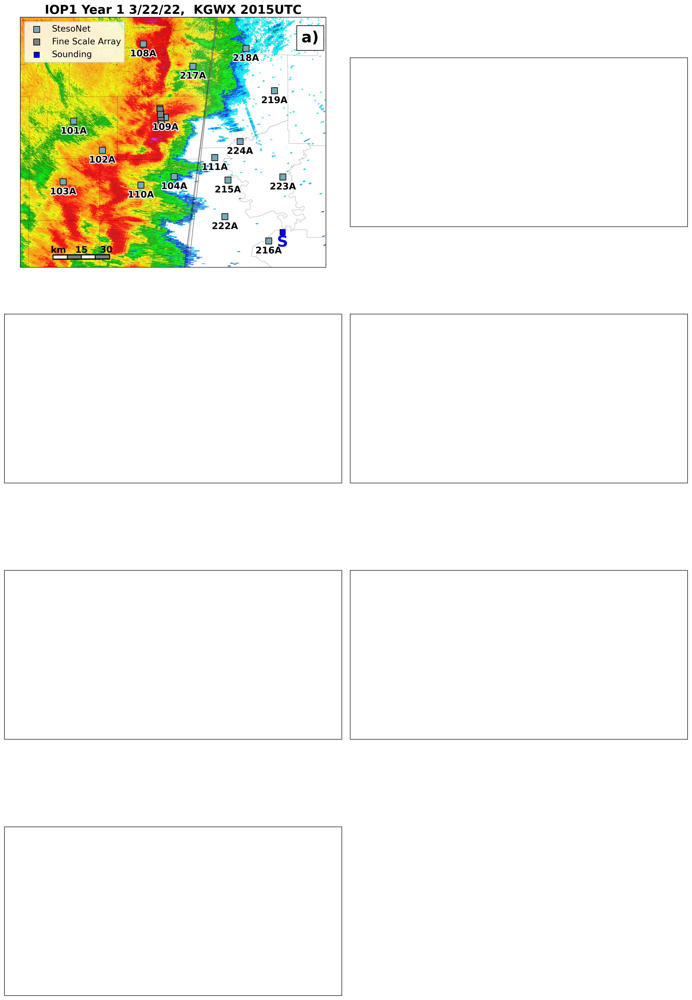

In [19]:
#Set up Plot
crs = ccrs.PlateCarree()
# Get data to plot state and province boundaries
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lakes',
        scale='10m',
        facecolor='none')
# Initialize plot and basemap
fig, axes = plt.subplots(4,2, figsize=(20, 30), subplot_kw={'projection': crs}, gridspec_kw = {'wspace':0.025, 'hspace':0.025})
cmap = pyart.graph.cm_colorblind.HomeyerRainbow
field = 'reflectivity'
sweep = 2
vmin = 0
vmax = 70
sweep = 0
cbar_label = 'Reflectivity (dBZ)'
cmap = 'pyart_NWSRef'
norm = plt.Normalize(vmin=vmin, vmax=vmax)

for a in axes.flat:
    a.set_aspect('equal')
#######################################################################################################    
west_lon1, east_lon1 = -89.37, -87.62
north_lat1, south_lat1=33.74, 32.31
LL1 = (west_lon1),(north_lat1)
UR1 = (east_lon1 ),(south_lat1)
LL1 = crs.transform_point((west_lon1),(north_lat1),ccrs.PlateCarree())
UR1 = crs.transform_point((east_lon1 ),(south_lat1),ccrs.PlateCarree())
#ax1 =  fig.add_subplot(421, projection=crs)      
axes[0,0].set_extent([LL1[0], UR1[0], LL1[1], UR1[1]], crs)
axes[0,0].add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
axes[0,0].add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
display1 = pyart.graph.RadarMapDisplay(pyart.io.read('E://KGWX20220322_201514_V06'))
image1 = display1.plot_ppi_map('reflectivity', sweep, cmap=cmap, ax=axes[0,0], vmin=vmin, vmax=vmax,
                             colorbar_label=cbar_label, title_flag=False, colorbar_flag=False,
                            projection=crs, lat_lines=[0], lon_lines=[0], alpha=0.8)
SNSfile1 = 'E:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP1_Grad_Analysis.csv'
sns1 = pd.read_csv(SNSfile1)
sns1 = sns1.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns1 = sns1[sns1['TOA_coldpool_final'].notna()]
coarse1 = sns1.loc[sns1.index[np.where((sns1['array_type'] == 'Coarse')&(sns1['mode'] != 'Mesocyclone'))]]                                                    
fine1 = sns1.loc[sns1.index[np.where((sns1['array_type'] == 'Fine')&(sns1['mode'] != 'Mesocyclone'))]]
axes[0,0].scatter(coarse1['lon'].values, coarse1['lat'].values, s=100,marker='s',color='#74a9b8',ec='k', transform=crs, label='StesoNet')
axes[0,0].scatter(fine1['lon'].values, fine1['lat'].values, s=100,marker='s', color='grey',ec='k', transform=crs, label='Fine Scale Array')
axes[0,0].scatter(-87.8692,32.5121,s=80,marker='s', color='blue',ec='k',transform=crs, label='Sounding')
pe= [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]
stationplot1 = StationPlot(axes[0,0], coarse1['lon'].values, coarse1['lat'].values ,clip_on=True, transform=crs, fontsize=15, weight='bold')
stationplot1.plot_text((0, -1.1), coarse1['ID'], fontsize=15, weight='bold', path_effects=pe) 
stationplot11 = StationPlot(axes[0,0], -87.8692,32.5121 ,clip_on=True, transform=crs, fontsize=15, weight='bold')
stationplot11.plot_text((0, -1.1), "S", fontsize=25, weight='bold', color='b') 

scale_bar(axes[0,0], 30, (0.2,0.04))

#     norm = plt.Normalize(vmin=vmin, vmax=vmax)
#     cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),pad=0.02, ax=axes[0,0], alpha=0.8, shrink=.6)
#     cbar.set_label(cbar_label, fontsize = 18, labelpad = 8)
#     cbar.ax.tick_params(labelsize = 14)
 #title
title = '{0} {1}'.format('IOP1 Year 1 3/22/22, ','KGWX 2015UTC')
axes[0,0].set_title(title, fontsize = 20, weight='bold')
handles, labels =axes[0,0].get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
axes[0,0].legend(by_label.values(), by_label.keys(),fontsize=14, loc=2, framealpha=0.8)
axes[0,0].text(0.92,0.90,'a)', fontsize=25, transform=axes[0,0].transAxes,color='k', weight= 'bold', bbox=dict(facecolor='white', edgecolor='k',pad=8))

axes[3,1].spines['top'].set_visible(False)
axes[3,1].spines['right'].set_visible(False)
axes[3,1].spines['bottom'].set_visible(False)
axes[3,1].spines['left'].set_visible(False)
axes[3,1].axis('off')
#plt.subplots_adjust(wspace=0.2, hspace=0.1)

plt.show()

In [10]:
sns = sns.set_index(sns['ID'])
lats =        sns['lat'].values
lons =        sns['lon'].values
te_deficits = np.asarray(sns['TE'].values)
tv_deficits = np.asarray(sns['TV'].values)
dTVdn =       np.asarray(sns['dTVdn'].values)
toas =        pd.to_datetime(sns['TOA_coldpool_final'].values)

#####CHANGE FOR EACH IOP'

#IOP1
# xi,yi = np.linspace(-89.17,-87.82,40),np.linspace(32.41,33.64,40)
# X,Y = np.meshgrid(xi,yi)
# time_grid= griddata((lons,lats),date2num(toas),(X,Y))

#IOP2
# xi,yi = np.linspace(-89.17,-87.87,40),np.linspace(32.98,34.32,40)
# X,Y = np.meshgrid(xi,yi)
# time_grid= griddata((lons,lats),date2num(toas),(X,Y))

# #IOP3
# xi,yi = np.linspace(-87.4,-86.27,40),np.linspace(31.92,32.8,40)
# X,Y = np.meshgrid(xi,yi)
# time_grid= griddata((lons,lats),date2num(toas),(X,Y))

#IOP3
xi,yi = np.linspace(-87.4,-86.27,40),np.linspace(31.92,32.8,40)
X,Y = np.meshgrid(xi,yi)
time_grid= griddata((lons,lats),date2num(toas),(X,Y))

#IOP4
# xi,yi = np.linspace(-90.56,-89.01,40),np.linspace(35.65,36.96,40)
# X,Y = np.meshgrid(xi,yi)
# time_grid= griddata((lons,lats),date2num(toas),(X,Y))

#IOP5
# xi,yi = np.linspace(-91.26,-90.03,40),np.linspace(35.20,36.18,40)
# X,Y = np.meshgrid(xi,yi)
# time_grid= griddata((lons,lats),date2num(toas),(X,Y))

In [11]:
def rgb(hexcol):
    return matplotlib.colors.to_rgba(hexcol)

def plot_options(var):
    '''options include all named variables '''
    
    if var == 'te_deficits':
        mycmap = cmocean.cm.deep_r
        
        #IOP1
        #levels = np.arange(-11.25, -6.75, .25)
        
        #IOP2
#         levels = np.arange(-12.0, -5.25, 0.25)
        
        #IOP3
#         levels = np.arange(-13.25, 0, .25)
        
        #IOP4
#         levels = np.arange(-15.5, -2.25, .25)

        levels = np.arange(-18, 0, .25)
        
        clabel = 'K'
        title = r'30-min ${\theta_e}$ Deficits'
          
    elif var == 'tv_deficits':
        mycmap = cmocean.cm.tempo_r
        
        #IOP1
        #levels = np.arange(-6.5, -2.0, .25)
        
        #IOP2
#         levels = np.arange(-7.25, -2.25, 0.25)
        
        #IOP3
#         levels = np.arange(-4.75, 0.25, .25)
        
        #IOP4
#         levels = np.arange(-8.25, 0, .25)

        levels = np.arange(-9.5, 0.25, .25)
        
        clabel = 'K'
        title = r'30-min ${\theta_v}$ Deficits'
    
    elif var == 'dTVdn':
        #colors = [rgb('#ffffff'),rgb('#aad5e2'),rgb('#3589a5'),rgb('#072f3d')][::-1]
        #n_bin = 60
        #cmap_name = 'my_list'
        #mycmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bin)
        #mycmap=cmocean.cm.speed_r
        mycmap = cmocean.cm.ice
        
        #IOP1
        #levels = np.arange(-3.3, -.9, 0.1)
        
        #IOP2
#         levels = np.arange(-4.8, -.7, 0.1)
        
        #IOP3
#         levels = np.arange(-2.5, -.1, 0.1)
        
        #IOP4
#         levels = np.arange(-5.5, -.1, 0.1)

        levels = np.arange(-5.6,-.1,0.1)
        
        clabel = r'K km${^{-1}}$'
        title = r'Maximum 3-min ${\theta_v}$ Change'
        
    levels = levels
    cbar_label = clabel
    return mycmap, title, levels, cbar_label
    
    
# poly = pickle.load(open('20170310_TorPoly.p', 'rb'))

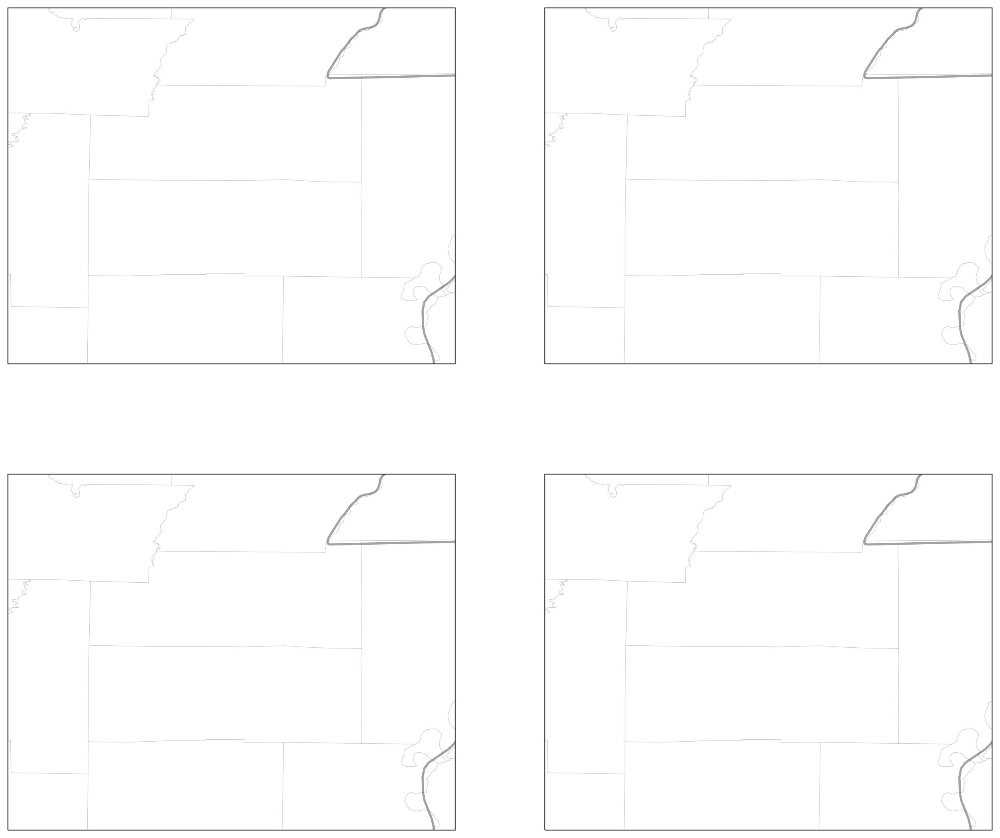

In [5]:
#fig, axes = plt.subplots(2,2, figsize=(16, 14), subplot_kw={'projection': crs})
#fig = plt.figure(1, figsize=(18, 14))
fig, axes = plt.subplots(2,2, figsize=(16, 14), subplot_kw={'projection': crs})
#ax = axes[0]

for ax in axes.flatten():
    ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
    ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1, linewidth=0.5)
plt.show()

In [5]:
import geopandas as gpd
import shapefile
import shapely.geometry as sgeom
from cartopy.geodesic import Geodesic

#IOP1
#shapefilewarn = gpd.read_file("E:\\PERiLS_Y1\\Tornado_Survey_PERiLS\\IOP1\\wwa_202203221200_202203231200.shp")
#IOP2
#shapefilewarn = gpd.read_file("E:\\PERiLS_Y1\\Tornado_Survey_PERiLS\\IOP2\\wwa_202203301200_202203311200.shp")
#IOP3
shapefilewarn = gpd.read_file("E:\\PERiLS_Y1\\Tornado_Survey_PERiLS\\IOP3\\wwa_202204050000_202204061200.shp")
#IOP4
#shapefilewarn = gpd.read_file("E:\\PERiLS_Y1\\Tornado_Survey_PERiLS\\IOP4\\wwa_202204130000_202204140000.shp")

dfwarn = pd.DataFrame(shapefilewarn)

#CHANGE IOPs
shapefiletor = gpd.read_file("E:\\PERiLS_Y1\\Tornado_Survey_PERiLS\\IOP3\\nws_dat_damage_paths.shp")
dftor = pd.DataFrame(shapefiletor) 
gdftor = gpd.GeoDataFrame(dftor, geometry='geometry')

mask = (dfwarn['GTYPE'] == 'P')
ds = dfwarn.loc[mask]
ds['POLY_BEG'] = pd.to_datetime(dfwarn['POLY_BEG'], format='%Y%m%d%H%M')
ds['POLY_END'] = pd.to_datetime(dfwarn['POLY_END'], format='%Y%m%d%H%M')
gdfwarn = gpd.GeoDataFrame(ds, geometry='geometry')
masknew = (gdfwarn.STATUS=='NEW')
shapefilefinal = gdfwarn.loc[masknew]

roadPalette = {'EF0': 'blue',
               'EF1': 'green',
               'EF2': 'orange',
               'EF3': 'red'}
inv_map = {v: k for k, v in roadPalette.items()}

C:\Users\joshu\.conda\envs\unidata\lib\site-packages\ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\joshu\.conda\envs\unidata\lib\site-packages\ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [12]:
import matplotlib.patheffects as path_effects
import matplotlib.transforms as mtransforms
pe= [path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()]

In [10]:
coarse

NameError: name 'coarse' is not defined

In [11]:
fine

NameError: name 'fine' is not defined

In [12]:
coarse

NameError: name 'coarse' is not defined

C:\Users\joshu\.conda\envs\unidata\lib\site-packages\ipykernel_launcher.py:145: UserWarning: The default value for the *approx* keyword argument to TransverseMercator will change from True to False after 0.18.


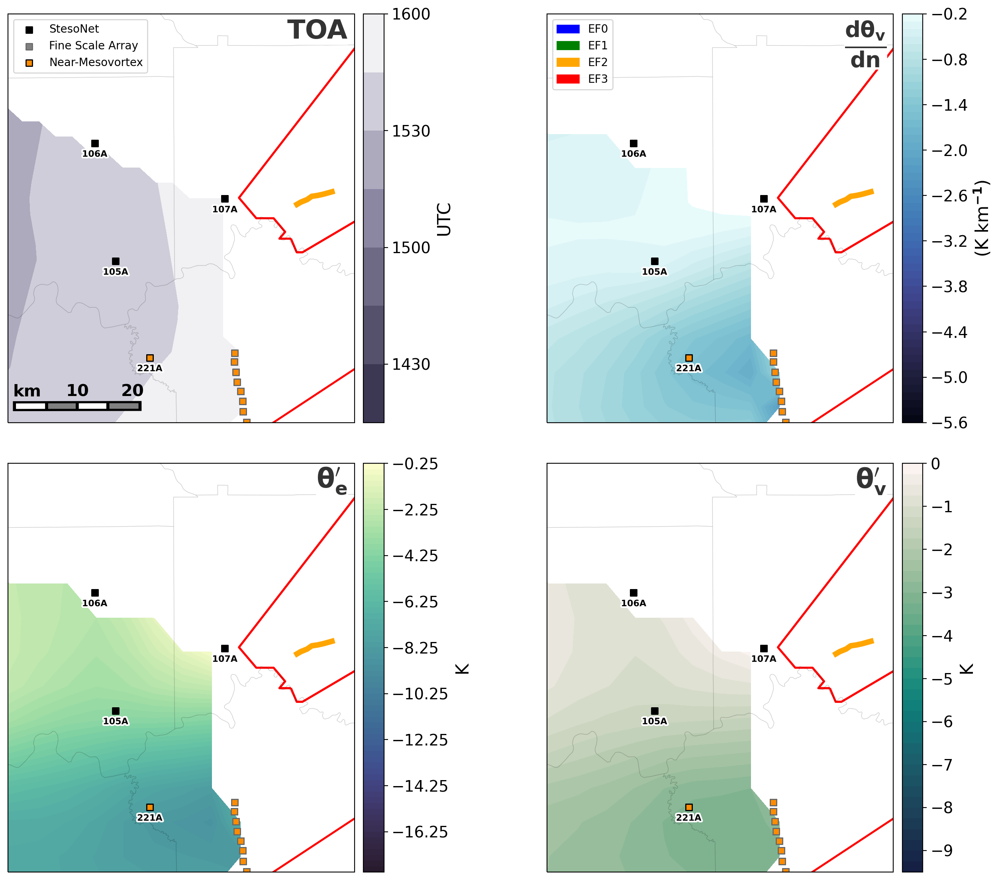

In [13]:
#fig = plt.figure(1, figsize=(18, 14))
fig, axes = plt.subplots(2,2, figsize=(16, 14), subplot_kw={'projection': crs})

for ax in axes.flatten():
    ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
    ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1, linewidth=0.5) # 20m, 5m 500k sizes from large to small
    
    coarse = sns.loc[sns.index[np.where((sns['array_type'] == 'Coarse')&(sns['mode'] != 'Mesocyclone'))]]                                                    # use 20m for testing, and 500k for final plots
    fine = sns.loc[sns.index[np.where((sns['array_type'] == 'Fine')&(sns['mode'] != 'Mesocyclone'))]]
    
    coarseMV = sns.loc[sns.index[np.where((sns['array_type'] == 'Coarse')&(sns['mode'] == 'Mesovortex'))]]                                                    # use 20m for testing, and 500k for final plots
    fineMV = sns.loc[sns.index[np.where((sns['array_type'] == 'Fine')&(sns['mode'] == 'Mesovortex'))]]
    
    ax.scatter(coarse['lon'].values, coarse['lat'].values, marker='s', color='k',edgecolors='k', transform=crs, label='StesoNet')
    ax.scatter(fine['lon'].values, fine['lat'].values, marker='s', color='grey',edgecolors='dimgrey', transform=crs, label='Fine Scale Array')
    ax.scatter(coarseMV['lon'].values, coarseMV['lat'].values, marker='s', color='darkorange',edgecolors='k', transform=crs, label='Near-Mesovortex')
    ax.scatter(fineMV['lon'].values, fineMV['lat'].values, marker='s', color='darkorange',edgecolors='dimgrey', transform=crs)
    
    stationplot1 = StationPlot(ax, coarse['lon'].values, coarse['lat'].values ,clip_on=True, transform=crs, fontsize=9, weight='bold')
    #stationplot = StationPlot(ax, lons, lats,clip_on=True, transform=crs, fontsize=9, weight='bold')
    stationplot1.plot_text((0, -1.1), coarse['ID'], fontsize=8, weight='bold', path_effects=pe)
    
#     stationplot2 = StationPlot(ax, fine['lon'].values, fine['lat'].values ,clip_on=True, transform=crs, fontsize=9, weight='bold')
#     #stationplot = StationPlot(ax, lons, lats,clip_on=True, transform=crs, fontsize=9, weight='bold')
#     stationplot2.plot_text((0, -1.1), fine['ID'], fontsize=8, weight='bold', path_effects=pe)

    ax.set_aspect('auto')
    
    
#     plot_warnings(poly, ax, linewidth = 1.8, color='#bc1010', label=None)

#     for probe in event.index:
#         lon, lat = event.loc[probe]['Lons'],event.loc[probe]['Lats']
#         if probe == '0104A':
#             ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
#                 markersize = 4, markeredgewidth=7)
#             ax.plot(lon,lat, marker = 's', color = '#74a9b8', linewidth=0.0, 
#                 markersize = 4, markeredgewidth=3)

#         if (probe == '0108A') | (probe == '0216A'):
#             ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
#                 markersize = 6, markeredgewidth=7)
#             ax.plot(lon,lat, marker = 's', color = '#b85151', linewidth=0.0, 
#                 markersize = 6, markeredgewidth=3)

#     # plot tornado tracks
#     tortrack = pickle.load(open('20170310_TorTrack.p', 'rb'))
#     for track in tortrack.index:
#         ax.plot(tortrack.iloc[track]['lons'],tortrack.iloc[track]['lats'], 
#             color = 'w', linewidth=8)
#         ax.plot(tortrack.iloc[track]['lons'],tortrack.iloc[track]['lats'], 
#             color = 'k', linewidth=4, label='Tornado Track')
#             ax.plot(tortrack.iloc[track]['lons'],tortrack.iloc[track]['lats'], 
#                 color = '#b85151', linewidth=2, label='Tor Track')

        

# TIME 
##IOP1
#time_levels = date2num(np.arange(dt.datetime(2022,3,22,19,15), dt.datetime(2022,3,23,1), dt.timedelta(minutes=15)))
##IOP2
#time_levels = date2num(np.arange(dt.datetime(2022,3,30,22,45), dt.datetime(2022,3,31,2,15), dt.timedelta(minutes=15)))
##IOP3
time_levels = date2num(np.arange(dt.datetime(2022,4,5,14,15), dt.datetime(2022,4,5,16,15), dt.timedelta(minutes=15)))
##IOP4
#time_levels = date2num(np.arange(dt.datetime(2022,4,13,19,30), dt.datetime(2022,4,13,21,15), dt.timedelta(minutes=15)))
##IOP5
#time_levels = date2num(np.arange(dt.datetime(2023,4,5,15,45), dt.datetime(2023,4,5,18,15), dt.timedelta(minutes=15)))


colors = [rgb('#ffffff'),rgb('#8984a1'), rgb('#312c47')][::-1]
mycmap = LinearSegmentedColormap.from_list('name', colors, N=50)
grid = axes[0,0].contourf(X, Y, time_grid,cmap=mycmap, levels=time_levels)
#axes[0,0].scatter(lons, lats, marker='s', color='k')
axes[0,0].scatter(coarse['lon'].values, coarse['lat'].values, marker='s', color='k',edgecolors='k', transform=crs, label='StesoNet')
axes[0,0].scatter(fine['lon'].values, fine['lat'].values, marker='s', color='grey',edgecolors='dimgrey', transform=crs, label='Fine Scale Array')
axes[0,0].scatter(coarseMV['lon'].values, coarseMV['lat'].values, marker='s', color='darkorange',edgecolors='k', transform=crs, label='Near-Mesovortex')
axes[0,0].scatter(fineMV['lon'].values, fineMV['lat'].values, marker='s', color='darkorange',edgecolors='dimgrey', transform=crs)

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[0,0], fraction=0.046, pad=0.02,
                    format=DateFormatter('%H%M'),ticks=MinuteLocator(interval=30))
cbar.set_label('UTC', fontsize = 16)
cbar.ax.tick_params(labelsize=14)   

handles, labels =ax.get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
axes[0,0].legend(by_label.values(), by_label.keys(),fontsize=10, loc=2, framealpha=0.8)

# for interpolation and plotting  
gxx = np.arange(np.min(lons), np.max(lons)+0.05, 0.05)
gyy = np.arange(np.min(lats), np.max(lats)+0.05, 0.05)
gx, gy = np.meshgrid(gxx, gyy)
    
# GRAD THETA E
var =dTVdn
mycmap, mytitle, levels, cbar_label = plot_options('dTVdn')
#gx,gy,img1 = interpolate(np.asarray(lons),np.asarray(lats),np.asarray(var),interp_type='natural_neighbor',hres=.05)
img1 = interpolate.natural_neighbor_to_grid(np.asarray(lons),np.asarray(lats),np.asarray(var), gx, gy)

grid = axes[0,1].contourf(gx,gy,img1,cmap=mycmap, levels=levels )
#axes[0,1].scatter(lons, lats, marker='s', color='k')
axes[0,1].scatter(coarse['lon'].values, coarse['lat'].values, marker='s', color='k',edgecolors='k', transform=crs, label='StesoNet')
axes[0,1].scatter(fine['lon'].values, fine['lat'].values, marker='s', color='grey',edgecolors='dimgrey', transform=crs, label='Fine Scale Array')
axes[0,1].scatter(coarseMV['lon'].values, coarseMV['lat'].values, marker='s', color='darkorange',edgecolors='k', transform=crs, label='Near-Mesovortex')
axes[0,1].scatter(fineMV['lon'].values, fineMV['lat'].values, marker='s', color='darkorange',edgecolors='dimgrey', transform=crs)

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[0,1], fraction=0.046, pad=0.02)
cbar.set_label(r'(K km$\mathbf{^{-1}}$)', fontsize = 16)
cbar.ax.tick_params(labelsize=14)         
             
        
# THETA E
var =te_deficits
mycmap, mytitle, levels, cbar_label = plot_options('te_deficits')
#gx,gy,img1 = interpolate(np.asarray(lons),np.asarray(lats),np.asarray(var),interp_type='natural_neighbor',hres=.05)
img1 = interpolate.natural_neighbor_to_grid(np.asarray(lons),np.asarray(lats),np.asarray(var), gx, gy)

grid = axes[1,0].contourf(gx,gy,img1,cmap=mycmap, levels=levels )
#axes[1,0].scatter(lons, lats, marker='s', color='k')
axes[1,0].scatter(coarse['lon'].values, coarse['lat'].values, marker='s', color='k',edgecolors='k', transform=crs, label='StesoNet')
axes[1,0].scatter(fine['lon'].values, fine['lat'].values, marker='s', color='grey',edgecolors='dimgrey', transform=crs, label='Fine Scale Array')
axes[1,0].scatter(coarseMV['lon'].values, coarseMV['lat'].values, marker='s', color='darkorange',edgecolors='k', transform=crs, label='Near-Mesovortex')
axes[1,0].scatter(fineMV['lon'].values, fineMV['lat'].values, marker='s', color='darkorange',edgecolors='dimgrey', transform=crs)

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[1,0], fraction=0.046, pad=0.02)
cbar.set_label('K', fontsize = 16)
cbar.ax.tick_params(labelsize=14) 
#scale_bar(axes[1,0], length=30, location=(0.15, 0.03), linewidth=6, fontsize=12)

# THETA V
var =tv_deficits
mycmap, mytitle, levels, cbar_label = plot_options('tv_deficits')
#gx,gy,img1 = interpolate(np.asarray(lons),np.asarray(lats),np.asarray(var),interp_type='natural_neighbor',hres=.05)
img1 = interpolate.natural_neighbor_to_grid(np.asarray(lons),np.asarray(lats),np.asarray(var), gx, gy)

grid = axes[1,1].contourf(gx,gy,img1,cmap=mycmap, levels=levels )
#axes[1,1].scatter(lons, lats, marker='s', color='k')
axes[1,1].scatter(coarse['lon'].values, coarse['lat'].values, marker='s', color='k',edgecolors='k', transform=crs, label='StesoNet')
axes[1,1].scatter(fine['lon'].values, fine['lat'].values, marker='s', color='grey',edgecolors='dimgrey', transform=crs, label='Fine Scale Array')
axes[1,1].scatter(coarseMV['lon'].values, coarseMV['lat'].values, marker='s', color='darkorange',edgecolors='k', transform=crs, label='Near-Mesovortex')
axes[1,1].scatter(fineMV['lon'].values, fineMV['lat'].values, marker='s', color='darkorange',edgecolors='dimgrey', transform=crs)

#cbar must be last, or fraction call somehow messes everything up
cbar = plt.colorbar(grid, ax=axes[1,1], fraction=0.046, pad=0.02)
cbar.set_label('K', fontsize = 16)
cbar.ax.tick_params(labelsize=14)

shapefilefinal.plot(ax=axes[0,0], edgecolor="red", facecolor='none',linewidth = 1.8)
shapefilefinal.plot(ax=axes[0,1], edgecolor="red", facecolor='none',linewidth = 1.8)
shapefilefinal.plot(ax=axes[1,0], edgecolor="red", facecolor='none',linewidth = 1.8)
shapefilefinal.plot(ax=axes[1,1], edgecolor="red", facecolor='none',linewidth = 1.8)

import matplotlib.patches as mpatches
palette = []
for k, v in inv_map.items():
    palette.append(mpatches.Patch(color=k, label=v))

for ctype, data in gdftor.groupby('efscale'):
    if ctype!='UNKNOWN':
        color = roadPalette[ctype]
        data.plot(ax=axes[0,0],color=color,linewidth=5)
        data.plot(ax=axes[0,1],color=color,linewidth=5,legend=True)
        data.plot(ax=axes[1,0],color=color,linewidth=5)
        data.plot(ax=axes[1,1],color=color,linewidth=5)
        lgnd = axes[0,1].legend(handles=palette,loc='upper left')
        lgnd.legendHandles[0]._sizes = [7]
        lgnd.legendHandles[1]._sizes = [7]
        lgnd.legendHandles[2]._sizes = [7]
        lgnd.legendHandles[3]._sizes = [7]

# add plot type and plot label for publication
plot_labels = ['a)', 'b)', 'c)', 'd)']
plot_types = ['TOA', r'${\mathbf{\frac{d\theta_v}{dn}}}$',r'$\mathbf{\theta_e^{\prime}}$', 
              r'$\mathbf{\theta_v^{\prime}}$']

# plat, plon = event.loc['0108A']['Lats'],event.loc['0108A']['Lons']
# plat2, plon2 = event.loc['0216A']['Lats'],event.loc['0216A']['Lons']

scale_bar(axes[0,0], 20, (0.2,0.04))

i=0
for ax in axes.flatten():
    
#IOP1
#     if i ==1: # grad tv
#         ax.text(-87.85,33.51,plot_types[i], fontsize=28, color='k', ha='right',alpha=0.8, 
#                bbox=dict(facecolor='w',edgecolor='w', pad=0))
#     else:
#         ax.text(-87.85,33.56,plot_types[i], fontsize=24, color='k', ha='right',alpha=0.8, weight='bold',
#                bbox=dict(facecolor='w', edgecolor='w', pad=0))
#     trans = mtransforms.ScaledTranslation(10/72, -5/72, fig.dpi_scale_trans)
#     ax.text(.88, .11, plot_labels[i], transform=ax.transAxes + trans,
#             fontsize=24, verticalalignment='top', weight = 'bold', color='grey',
#             bbox=dict(facecolor='w', edgecolor='w', pad=0))
#IOP2
#     if i ==1: # grad tv
#         ax.text(-87.94,34.17,plot_types[i], fontsize=28, color='k', ha='right',alpha=0.8, 
#                 bbox=dict(facecolor='w',edgecolor='w', pad=0))
#     else:
#         ax.text(-87.94,34.22,plot_types[i], fontsize=24, color='k', ha='right',alpha=0.8, weight='bold',
#                 bbox=dict(facecolor='w', edgecolor='w', pad=0))
#     trans = mtransforms.ScaledTranslation(10/72, -5/72, fig.dpi_scale_trans)
#     ax.text(.86, .1, plot_labels[i], transform=ax.transAxes + trans,
#             fontsize=24, verticalalignment='top', weight = 'bold', color='grey',
#             bbox=dict(facecolor='w', edgecolor='w', pad=0))
# # #IOP3
#     if i ==1: # grad tv
#         ax.text(-86.32,32.7,plot_types[i], fontsize=28, color='k', ha='right',alpha=0.8, 
#                 bbox=dict(facecolor='w',edgecolor='w', pad=0))
#     else:
#         ax.text(-86.32,32.74,plot_types[i], fontsize=24, color='k', ha='right',alpha=0.8, weight='bold',
#                 bbox=dict(facecolor='w', edgecolor='w', pad=0))
#     trans = mtransforms.ScaledTranslation(10/72, -5/72, fig.dpi_scale_trans)
#     ax.text(.89, .1, plot_labels[i], transform=ax.transAxes + trans,
#             fontsize=24, verticalalignment='top', weight = 'bold', color='grey',
#             bbox=dict(facecolor='w', edgecolor='w', pad=0))
#IOP4
#     if i ==1: # grad tv
#         ax.text(-89.02,36.83,plot_types[i], fontsize=28, color='k', ha='right',alpha=0.8, 
#                 bbox=dict(facecolor='w',edgecolor='w', pad=0))
#     else:
#         ax.text(-89.02,36.88,plot_types[i], fontsize=24, color='k', ha='right',alpha=0.8, weight='bold',
#                 bbox=dict(facecolor='w', edgecolor='w', pad=0))
#     trans = mtransforms.ScaledTranslation(10/72, -5/72, fig.dpi_scale_trans)
#     ax.text(.88, .1, plot_labels[i], transform=ax.transAxes + trans,
#             fontsize=24, verticalalignment='top', weight = 'bold', color='grey',
#             bbox=dict(facecolor='w', edgecolor='w', pad=0))
#IOP5
#     if i ==1: # grad tv
#         ax.text(-90.04,36.05,plot_types[i], fontsize=28, color='k', ha='right',alpha=0.8, 
#                 bbox=dict(facecolor='w',edgecolor='w', pad=0))
#     else:
#         ax.text(-90.04,36.1,plot_types[i], fontsize=24, color='k', ha='right',alpha=0.8, weight='bold',
#                 bbox=dict(facecolor='w', edgecolor='w', pad=0))
#     trans = mtransforms.ScaledTranslation(10/72, -5/72, fig.dpi_scale_trans)
#     ax.text(.88, .1, plot_labels[i], transform=ax.transAxes + trans,
#             fontsize=24, verticalalignment='top', weight = 'bold', color='grey',
#             bbox=dict(facecolor='w', edgecolor='w', pad=0))

# #IOP Fine
    if i ==1: # grad tv
        ax.text(.98, 0.9,plot_types[i], fontsize=28, color='k', ha='right',alpha=0.8, transform=ax.transAxes,
                bbox=dict(facecolor='w',edgecolor='w', pad=0))
    else:
        ax.text(.98, 0.94,plot_types[i], fontsize=24, color='k', ha='right',alpha=0.8, weight='bold', transform=ax.transAxes,
                bbox=dict(facecolor='w', edgecolor='w', pad=0))
    trans = mtransforms.ScaledTranslation(10/72, -5/72, fig.dpi_scale_trans)
#     ax.text(.88, .1, plot_labels[i], transform=ax.transAxes + trans,
#             fontsize=24, verticalalignment='top', weight = 'bold', color='grey',
#             bbox=dict(facecolor='w', edgecolor='w', pad=0))


    i+=1 
plt.subplots_adjust(wspace=0.2, hspace=0.1)
#plt.suptitle('IOP1', fontsize=24,weight='bold')            
                
file_dir = 'E:\\NewFigsY1Y2\\'
plt.savefig('E://IOP3ObjectiveAnalysis_hybrid.png'.format(file_dir), bbox_inches = 'tight', format='png', dpi=300)
plt.show()

# normalized plots

In [16]:
import matplotlib.patheffects as path_effects

def get_1hz(date, probe, starttime, duration, seconds=False):
    directory= '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/data_1s/'
    datafile = "{}{}_{}.csv".format(directory, probe, date)
    data = pd.read_csv(datafile, header=0, index_col = 'time', parse_dates=['time'], date_parser=pd.to_datetime)
    
    if seconds == False:
        # handle when data from two days is needed
        s = (starttime-dt.timedelta(minutes=1))
        e = (starttime+dt.timedelta(minutes=duration))
        if s.strftime('%d')!= e.strftime('%d'):
            datafile = "{}{}_{}.csv".format(directory, probe, e.strftime('%Y%m%d'))
            data2 = pd.read_csv(datafile, header=0, index_col = 'time', parse_dates=['time'], date_parser=pd.to_datetime)
            data = pd.concat([data.iloc[0:-1],data2])

        return data[starttime:starttime+dt.timedelta(minutes=duration)]
    if seconds == True:
        # handle when data from two days is needed
        s = (starttime-dt.timedelta(minutes=1))
        e = (starttime+dt.timedelta(seconds=duration))
        if s.strftime('%d')!= e.strftime('%d'):
            datafile = "{}{}_{}.csv".format(directory, probe, e.strftime('%Y%m%d'))
            data2 = pd.read_csv(datafile, header=0, index_col = 'time', parse_dates=['time'], date_parser=pd.to_datetime)
            data = pd.concat([data.iloc[0:-1],data2])

        return data[starttime:starttime+dt.timedelta(seconds=duration)]

def plot_norm(ax, probe_id, TOA, duration, legend=False, y2_supress=False, text_c = '#6f7070', skip=1):
    
    # format axis and set up times
    ax.xaxis_date()
    
    ax_wd = ax.twinx()
    ax_wd.set_zorder(0)
    ax.set_zorder(1)
    ax.patch.set_visible(False)
    # Set axtwin's patch visible and colorize it in grey
    ax_wd.patch.set_visible(True)
    
    TOA = pd.to_datetime(TOA)
    starttime = TOA - dt.timedelta(minutes=duration/2)
    endtime = TOA - dt.timedelta(minutes=duration/2)
    
    # pull data
    met = get_1hz(TOA.strftime('%Y%m%d'),probe_id, starttime, duration)[::skip]

    # calculate variables
    dewp = calc_dewpoint(met['T'], met['RH'])
    mslp = met['P'] #calc_mslp(met['T'] ,met['P'], elevation)
    thetae = calc_thetae(met['T'], dewp, met['P'])
    thetav = calc_thetav(met['T'], dewp, met['P'])
    ws = met['WS']
    wd = met['WD'] 
    
    ### fix for 104A 20170310
    if (TOA.strftime('%Y%m%d') == '20170310') & (probe_id == '0104A'):
        mslp[mslp == mslp.max()] = np.nan  # drop the one wrong data point
        mslp[mslp == mslp.max()] = np.nan
        
    ### fix for 222A 20170420
    if (TOA.strftime('%Y%m%d') == '20170430') & (probe_id == '0222A'):
        thetae[thetae == thetae.min()] = np.nan  # drop the one wrong data point
        thetav[thetav == thetav.min()] = np.nan
    
    # normalize variables
    n_mslp =     mslp.apply(lambda x:(x - np.min(mslp))  / (np.max(mslp)   - np.min(mslp)))
    n_thetae = thetae.apply(lambda x:(x - np.min(thetae))/ (np.max(thetae) - np.min(thetae)))
    n_thetav = thetav.apply(lambda x:(x - np.min(thetav))/ (np.max(thetav) - np.min(thetav)))
    n_ws =         ws.apply(lambda x:(x - np.min(ws))    / (np.max(ws)     - np.min(ws)))
    
    
     
    # plot variables
    # choclate
    tv_color = '#315969' #'#0057b3'
    
    
    ax.plot(met.index,n_ws, color = 'C1', linestyle = '-', linewidth = 1, label = 'Wind Spd', alpha=0.5)     
    ax.plot(met.index,n_mslp, color = 'dimgray', linewidth = 1.5, label = r'MSLP')
    ax.plot(met.index,n_thetae, color = 'C2', linewidth = 2., label = r'$\theta_e$') 
    ax.plot(met.index,n_thetav, color = tv_color,  linewidth = 2., label = r'$\theta_v$')
    
    # plot wind direction, which can't be normalized
    wd_c = 'C3'#'#a34141'
    ax_wd.scatter(met.index, wd, color=wd_c ,s=(2.5*2), label = 'Wind Dir', zorder=0, alpha=0.5)
    ax_wd.set_ylim(0,360)
    ax_wd.tick_params(axis='y',labelsize=12, colors = wd_c )
    ax_wd.set_ylabel('Wind Direction (Deg)', fontsize=14, color=wd_c )
    if y2_supress: # supress y ticks for left hand plots
        ax_wd.set_yticks([])
        ax_wd.set_ylabel('', fontsize=14, color='C3')

    
    # legend
    if legend:
        lines,labels = ax.get_legend_handles_labels()
        lines2,labels2 = ax_wd.get_legend_handles_labels()
        ax.legend(lines+lines2,labels+labels2,  loc=8, fontsize=13,
                  ncol=5,handletextpad=0.1,markerscale=1, columnspacing=0.5, numpoints=2, framealpha=1)

    #l plot details
    ax.grid()
    ax.set_ylim(-0.19, 1.19)
    
    # plot StickNet Id in upper left corner
    try:
        if np.isnan(event.loc[probe_id]['N_ID']) == True:
            ax.text(0.04,0.9,event.loc[probe_id]['ID'], fontsize=20, transform=ax.transAxes,color=text_c,
                   weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8)) #probe_locs[probe_id][3]
    except:
        ax.text(0.04,0.9,event.loc[probe_id]['N_ID'], fontsize=20, transform=ax.transAxes,color=text_c,
               weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

    # rotate x ticks
    fig.canvas.draw()
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=20.0)
    
def plot_norm(ax, probe_id, TOA, duration, legend=False, y2_supress=False, text_c = '#6f7070', skip=1):
    
    # format axis and set up times
    ax.xaxis_date()
    
    ax_wd = ax.twinx()
    ax_wd.set_zorder(0)
    ax.set_zorder(1)
    ax.patch.set_visible(False)
    # Set axtwin's patch visible and colorize it in grey
    ax_wd.patch.set_visible(True)
    
    TOA = pd.to_datetime(TOA)
    starttime = TOA - dt.timedelta(minutes=duration/2)
    endtime = TOA - dt.timedelta(minutes=duration/2)
    
    # pull data
    met = get_1hz(TOA.strftime('%Y%m%d'),probe_id, starttime, duration)[::skip]

    # calculate variables
    dewp = calc_dewpoint(met['T'], met['RH'])
    mslp = met['P'] #calc_mslp(met['T'] ,met['P'], elevation)
    thetae = calc_thetae(met['T'], dewp, met['P'])
    thetav = calc_thetav(met['T'], dewp, met['P'])
    ws = met['WS']
    wd = met['WD'] 
    
    
    ### fix for 104A 20170310
    if (TOA.strftime('%Y%m%d') == '20170310') & (probe_id == '0104A'):
        mslp[mslp == mslp.max()] = np.nan  # drop the one wrong data point
        mslp[mslp == mslp.max()] = np.nan
        
    ### fix for 222A 20170420
    if (TOA.strftime('%Y%m%d') == '20170430') & (probe_id == '0222A'):
        thetae[thetae == thetae.min()] = np.nan  # drop the one wrong data point
        thetav[thetav == thetav.min()] = np.nan
    
    # normalize variables
    n_mslp =     mslp.apply(lambda x:(x - np.min(mslp))  / (np.max(mslp)   - np.min(mslp)))
    n_thetae = thetae.apply(lambda x:(x - np.min(thetae))/ (np.max(thetae) - np.min(thetae)))
    n_thetav = thetav.apply(lambda x:(x - np.min(thetav))/ (np.max(thetav) - np.min(thetav)))
    n_ws =         ws.apply(lambda x:(x - np.min(ws))    / (np.max(ws)     - np.min(ws)))
    
    
     
    ax.axvline(TOA, color='C0', alpha=0.5, linewidth=2.5, linestyle=':', label='TOA')
    
    # plot variables
    # choclate
    tv_color = '#30749c'#'#3d6473'#'#315969' #'#0057b3'
    te_color = '#67b05b'#'#72a66a'#'#709e7c'
    ws_color = "C1"
    wd_color = 'C3'
    mslp_color="#706464"
    
    pe1 = [path_effects.Stroke(linewidth=2.5, foreground='black'),
       path_effects.Stroke(foreground='white',alpha=0.8),
       path_effects.Normal()]
    
    pe2 = [path_effects.Stroke(linewidth=3.5, foreground='black'),
       path_effects.Stroke(foreground='white',alpha=0.8),
       path_effects.Normal()]
    
    
    ax.plot(met.index,n_thetae, color = te_color, linewidth = 2, label = r'$\theta_e$', alpha=0.7,
           path_effects=pe1, zorder=29)
    ax.plot(met.index,n_thetav, color = tv_color,  linewidth = 3, label = r'$\theta_v$', alpha=0.85,
           path_effects=pe2, zorder=30)
    
    ax.plot(met.index,n_mslp, color = mslp_color, alpha=0.3, linewidth = 3, label = r'MSLP') #0.3
    ax.plot(met.index,n_ws, color = ws_color, linestyle = '-', linewidth = 3, label = 'Wind Spd', alpha=0.2) #0.2    
    
    
   
   
    
    
    # plot wind direction, which can't be normalized
    wd_c = 'C3'#'#a34141'
    ax_wd.scatter(met.index, wd, marker='o', color=wd_color,s=(8*2), label = 'Wind Dir', zorder=0, alpha=0.4,
                 linewidth=0)
    ax_wd.set_ylim(0,360)
    ax_wd.tick_params(axis='y',labelsize=12, colors = wd_color )
    ax_wd.set_ylabel('Wind Direction (Deg)', fontsize=14, color=wd_color , weight='bold', labelpad=8)
    if y2_supress: # supress y ticks for left hand plots
        ax_wd.set_yticks([])
        ax_wd.set_ylabel('', fontsize=14, color='C3')
        
    

    
    # legend
    if legend:
        lines,labels = ax.get_legend_handles_labels()
        lines2,labels2 = ax_wd.get_legend_handles_labels()
        ax.legend(lines+lines2,labels+labels2,  loc=8, fontsize=12,
                  ncol=6,handletextpad=0.1,markerscale=1, columnspacing=0.5, numpoints=2, framealpha=1)

    #l plot details
    #ax.grid(linestyle=':')
    ax.set_ylim(-0.19, 1.19)
    
    # plot StickNet Id in upper left corner
    try:
        if np.isnan(event.loc[probe_id]['N_ID']) == True:
            ax.text(0.04,0.9,event.loc[probe_id]['ID'], fontsize=20, transform=ax.transAxes,color=text_c,
                   weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8)) #probe_locs[probe_id][3]
    except:
        ax.text(0.04,0.9,event.loc[probe_id]['N_ID'], fontsize=20, transform=ax.transAxes,color=text_c,
               weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

    # rotate x ticks
    fig.canvas.draw()
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=20.0)

/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/ipykernel_launcher.py:149: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


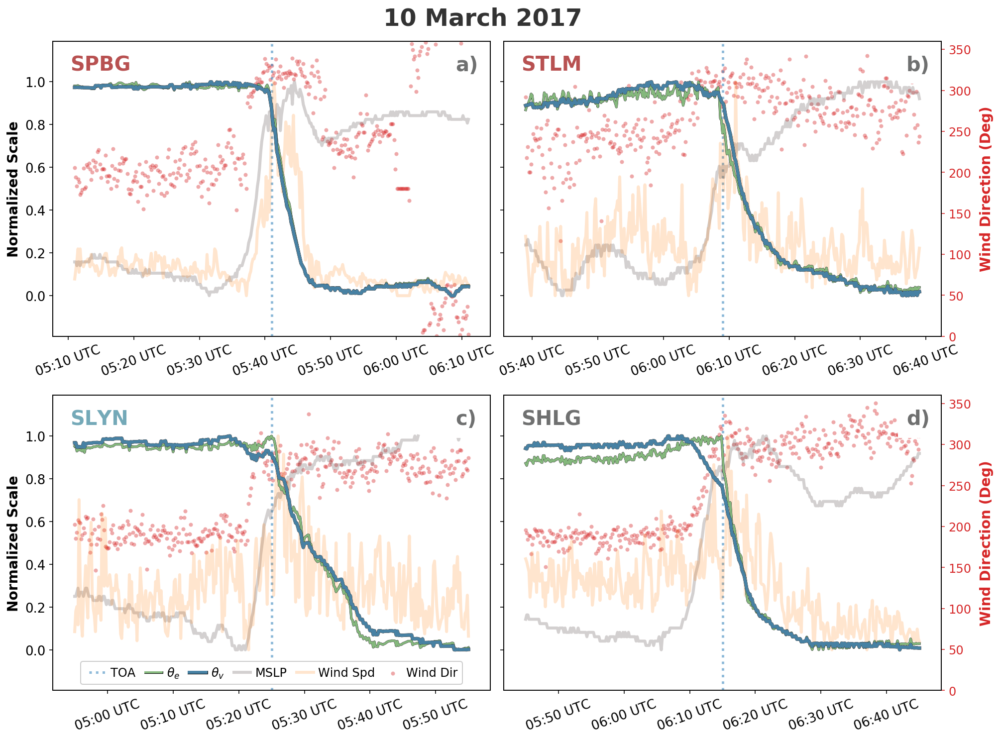

In [23]:
plt.rc('xtick',labelsize=13)
plt.rc('ytick',labelsize=13)
fig, axes = plt.subplots(2,2, figsize=(16,12),sharey= True)

event = sns[sns['date']==20170310]
event = event.set_index(event['ID'])
SN = ['0108A','0216A','0104A','0213A']
#plot_label = ['a.)', 'b.)', 'c.)', 'd.)']
duration = 60

tor = '#b85151'
rot = '#74a9b8'
iskip = 10

plot_norm(axes[0,0], SN[0], event.loc[SN[0]]['TOA'], duration, legend=False, y2_supress=True, text_c=tor, skip=iskip)
plot_norm(axes[0,1], SN[1], event.loc[SN[1]]['TOA'], duration, legend=False, text_c=tor, skip=iskip)
plot_norm(axes[1,0], SN[2], event.loc[SN[2]]['TOA'], duration, legend=True, y2_supress=True, text_c = rot, skip=iskip)
plot_norm(axes[1,1], SN[3], event.loc[SN[3]]['TOA'], duration, legend=False, skip=iskip)

# force axes to not be butts

plot_labels = ['a)', 'b)', 'c)', 'd)']

for i,ax in enumerate(axes.flatten()[:]):
    ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%H:%M UTC'))
    # add in plot label
    ax.text(0.92,0.90,plot_labels[i], fontsize=20, transform=ax.transAxes,color='#6f7070',
       weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

plt.subplots_adjust(wspace=.03)
plt.suptitle('10 March 2017', fontsize=24,weight='bold', y=0.92, alpha=0.8)
axes[0,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
axes[1,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
plt.savefig('{0}10MarchNorm.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);

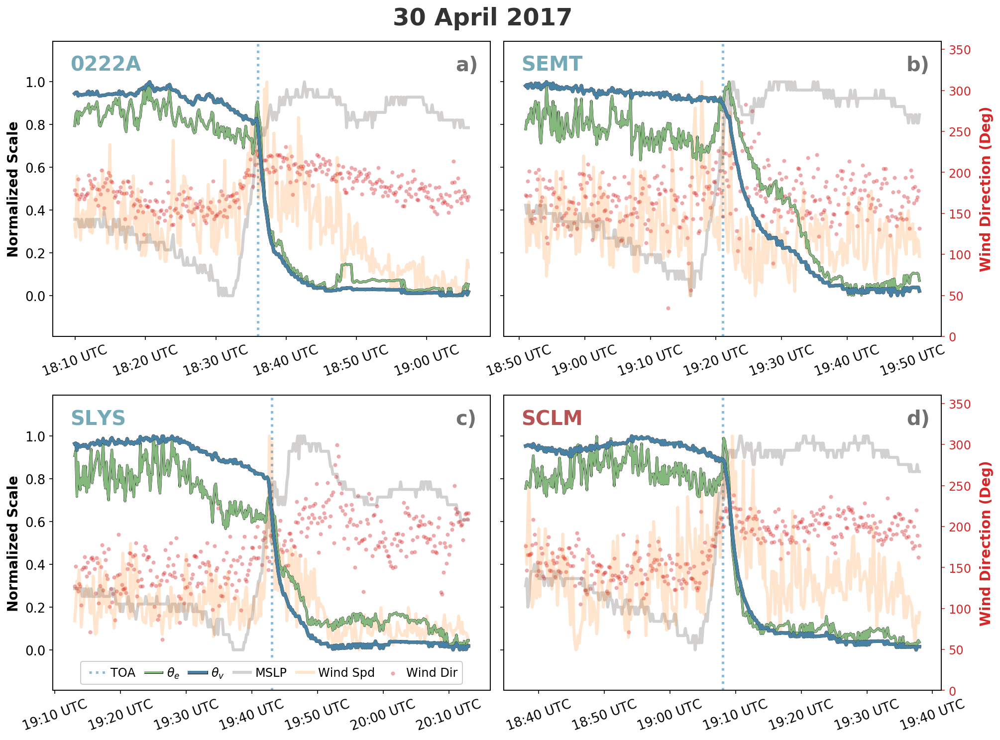

In [25]:
plt.rc('xtick',labelsize=13)
plt.rc('ytick',labelsize=13)
fig, axes = plt.subplots(2,2, figsize=(16,12),sharey= True)

event = sns[sns['date']==20170430]
event = event.set_index(event['ID'])
SN = ['0222A','0214A','0111A','0107A']


duration = 60

tor = '#b85151'
rot = '#74a9b8'
iskip=10

plot_norm(axes[0,0], SN[0], event.loc[SN[0]]['TOA'], duration, legend=False, y2_supress=True, text_c=rot, skip=iskip)
plot_norm(axes[0,1], SN[1], event.loc[SN[1]]['TOA'], duration, legend=False, text_c=rot, skip=iskip)
plot_norm(axes[1,0], SN[2], event.loc[SN[2]]['TOA'], duration, legend=True, y2_supress=True, text_c = rot, skip=iskip)
plot_norm(axes[1,1], SN[3], event.loc[SN[3]]['TOA'], duration, legend=False, text_c = tor, skip=iskip)

# force axes to not be butts
plot_labels = ['a)', 'b)', 'c)', 'd)']

for i,ax in enumerate(axes.flatten()[:]):
    ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%H:%M UTC'))
    # add in plot label
    ax.text(0.92,0.9,plot_labels[i], fontsize=20, transform=ax.transAxes,color='#6f7070',
       weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

plt.subplots_adjust(wspace=.03)
plt.suptitle('30 April 2017', fontsize=24,weight='bold', y=0.92, alpha=0.8)

axes[0,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
axes[1,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
plt.savefig('{0}30AprilNorm.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);

In [17]:
def find_nearest(array, value):
    array = np.asarray(array)
    return (np.abs(array-value)).argmin()

def get_correction_angle(u, v, ref):
    theta_motion = np.rad2deg(np.arctan(v/u))
    if (theta_motion < 0) & (ref < 0):
        theta_correction = np.deg2rad(abs(ref) - abs(theta_motion)) 
    else:
        theta_correction = np.deg2rad(abs(ref - theta_motion))
  
    return theta_correction

def plot_norm(ax, probe_id, TOA, duration, legend=False, y2_supress=False, text_c = '#6f7070', skip=1):
    
    # format axis and set up times
    #ax.xaxis_date()
    
    ax_wd = ax.twinx()
    ax_wd.set_zorder(0)
    ax.set_zorder(1)
    ax.patch.set_visible(False)
    # Set axtwin's patch visible and colorize it in grey
    ax_wd.patch.set_visible(True)
    
    TOA = pd.to_datetime(TOA)
    starttime = TOA - dt.timedelta(minutes=duration/2)
    endtime = TOA - dt.timedelta(minutes=duration/2)
    
    # pull data
    met = get_1hz(TOA.strftime('%Y%m%d'),probe_id, starttime, duration)[::skip]
    
    SNdata = event.loc[probe_id]
    u = SNdata['Ua']
    v = SNdata['Va']
    ref = SNdata['storm_ref_angle']
    storm_speed = np.sqrt(u**2 + v**2)
    
    delta_time = (met.index[:]-met.index[0]).seconds
    dist = (storm_speed * delta_time)/1000
    
#     theta_c = get_correction_angle(u,v,ref)
#     dist = dist * np.cos(theta_c)

    # center new_dist on TOA, negative values are before TOA, postive are after
    for i,ind in enumerate(met.index):
        rounded = ind.replace(second=0)
        if rounded == TOA:
            toa_idx = i
            break
    dist = dist - dist[toa_idx]
    
    distance = 20
    start = find_nearest(dist, -1*distance)
    end = find_nearest(dist, distance)
    dist = dist[start:end]
    met = met.iloc[start:end]
    
    dist = -1*dist

    # calculate variables
    dewp = calc_dewpoint(met['T'], met['RH'])
    mslp = met['P'] #calc_mslp(met['T'] ,met['P'], elevation)
    thetae = calc_thetae(met['T'], dewp, met['P'])
    thetav = calc_thetav(met['T'], dewp, met['P'])
    ws = met['WS']
    wd = met['WD'] 
    
    
    ### fix for 104A 20170310
    if (TOA.strftime('%Y%m%d') == '20170310') & (probe_id == '0104A'):
        mslp[mslp == mslp.max()] = np.nan  # drop the one wrong data point
        mslp[mslp == mslp.max()] = np.nan
        
    ### fix for 222A 20170420
    if (TOA.strftime('%Y%m%d') == '20170430') & (probe_id == '0222A'):
        thetae[thetae == thetae.min()] = np.nan  # drop the one wrong data point
        thetav[thetav == thetav.min()] = np.nan
    
    # normalize variables
    n_mslp =     mslp.apply(lambda x:(x - np.min(mslp))  / (np.max(mslp)   - np.min(mslp)))
    n_thetae = thetae.apply(lambda x:(x - np.min(thetae))/ (np.max(thetae) - np.min(thetae)))
    n_thetav = thetav.apply(lambda x:(x - np.min(thetav))/ (np.max(thetav) - np.min(thetav)))
    n_ws =         ws.apply(lambda x:(x - np.min(ws))    / (np.max(ws)     - np.min(ws)))
    
    
     
    ax.axvline(0, color='C0', alpha=0.5, linewidth=2.5, linestyle=':')
    
    # plot variables
    # choclate
    tv_color = '#30749c'#'#3d6473'#'#315969' #'#0057b3'
    te_color = '#67b05b'#'#72a66a'#'#709e7c'
    ws_color = "C1"
    wd_color = 'C3'
    mslp_color="#706464"
    
    pe1 = [path_effects.Stroke(linewidth=2.5, foreground='black'),
       path_effects.Stroke(foreground='white',alpha=0.8),
       path_effects.Normal()]
    
    pe2 = [path_effects.Stroke(linewidth=3.5, foreground='black'),
       path_effects.Stroke(foreground='white',alpha=0.8),
       path_effects.Normal()]
    
    
    ax.plot(dist,n_thetae, color = te_color, linewidth = 2, label = r'$\theta_e$', alpha=0.7,
           path_effects=pe1, zorder=29)
    ax.plot(dist,n_thetav, color = tv_color,  linewidth = 3, label = r'$\theta_v$', alpha=0.85,
           path_effects=pe2, zorder=30)
    
    ax.plot(dist,n_mslp, color = mslp_color, alpha=0.3, linewidth = 3, label = r'MSLP') #0.3
    ax.plot(dist,n_ws, color = ws_color, linestyle = '-', linewidth = 3, label = 'Wind Spd', alpha=0.2) #0.2    
    
    
    
    # plot wind direction, which can't be normalized
    wd_c = 'C3'#'#a34141'
    ax_wd.scatter(dist, wd, marker='o', color=wd_color,s=(8*2), label = 'Wind Dir', zorder=0, alpha=0.4,
                 linewidth=0)
    ax_wd.set_ylim(0,360)
    ax_wd.tick_params(axis='y',labelsize=12, colors = wd_color )
    ax_wd.set_ylabel('Wind Direction (Deg)', fontsize=14, color=wd_color , weight='bold', labelpad=8)
    if y2_supress: # supress y ticks for left hand plots
        ax_wd.set_yticks([])
        ax_wd.set_ylabel('', fontsize=14, color='C3')
        
    

    
    # legend
    if legend:
        lines,labels = ax.get_legend_handles_labels()
        lines2,labels2 = ax_wd.get_legend_handles_labels()
        ax.legend(lines+lines2,labels+labels2,  loc=8, fontsize=12,
                  ncol=6,handletextpad=0.1,markerscale=1, columnspacing=0.5, numpoints=2, framealpha=1)

    #l plot details
    #ax.grid(linestyle=':')
    ax.set_ylim(-0.19, 1.19)
    
    # plot StickNet Id in upper left corner
    try:
        if np.isnan(event.loc[probe_id]['N_ID']) == True:
            ax.text(0.04,0.9,event.loc[probe_id]['ID'], fontsize=20, transform=ax.transAxes,color=text_c,
                   weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8)) #probe_locs[probe_id][3]
    except:
        ax.text(0.04,0.9,event.loc[probe_id]['N_ID'], fontsize=20, transform=ax.transAxes,color=text_c,
               weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

    # rotate x ticks
#     fig.canvas.draw()
#     labels = ax.get_xticklabels()
#     ax.set_xticklabels(labels, rotation=20.0)
    
    #ax.invert_xaxis()
    ax.grid(linestyle=':')

/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/ipykernel_launcher.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


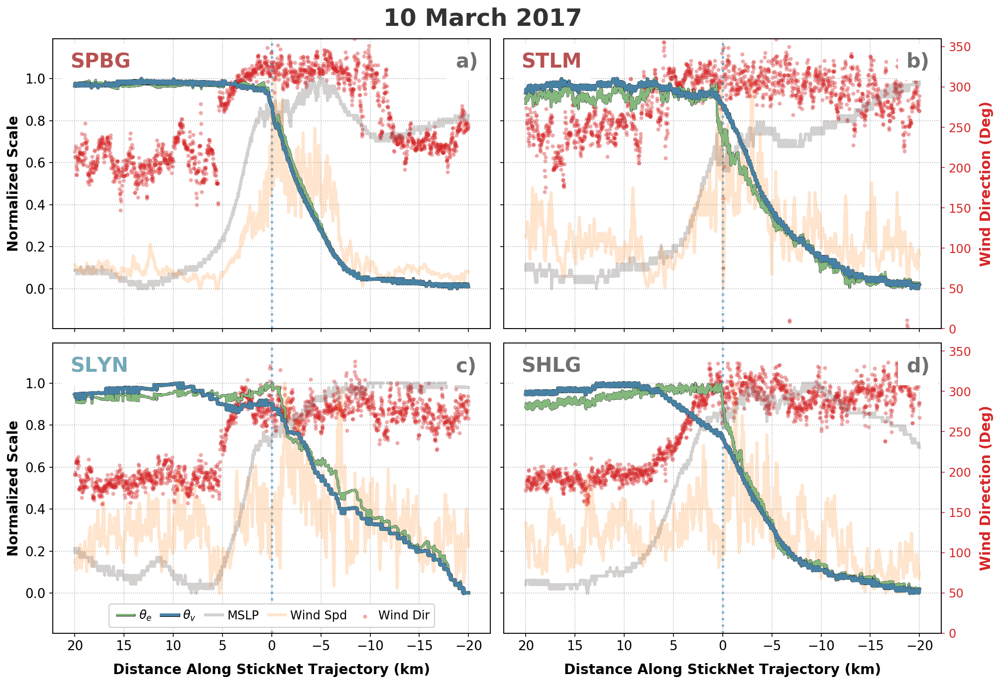

In [19]:
plt.rc('xtick',labelsize=13)
plt.rc('ytick',labelsize=13)
fig, axes = plt.subplots(2,2, figsize=(16,11),sharey= True, sharex=True)
axes[0,0].invert_xaxis()

event = sns[sns['date']==20170310]
event = event.set_index(event['ID'])
SN = ['0108A','0216A','0104A','0213A']
#plot_label = ['a.)', 'b.)', 'c.)', 'd.)']
duration = 120

tor = '#b85151'
rot = '#74a9b8'
iskip = 1

plot_norm(axes[0,0], SN[0], event.loc[SN[0]]['TOA'], duration, legend=False, y2_supress=True, text_c=tor, skip=iskip)
plot_norm(axes[0,1], SN[1], event.loc[SN[1]]['TOA'], duration, legend=False, text_c=tor, skip=iskip)
plot_norm(axes[1,0], SN[2], event.loc[SN[2]]['TOA'], duration, legend=True, y2_supress=True, text_c = rot, skip=iskip)
plot_norm(axes[1,1], SN[3], event.loc[SN[3]]['TOA'], duration, legend=False, skip=iskip)

# force axes to not be butts

plot_labels = ['a)', 'b)', 'c)', 'd)']

for i,ax in enumerate(axes.flatten()[:]):
    #ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%H:%M UTC'))
    # add in plot label
    ax.text(0.92,0.90,plot_labels[i], fontsize=20, transform=ax.transAxes,color='#6f7070',
       weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

plt.subplots_adjust(wspace=.03, hspace=0.05)
plt.suptitle('10 March 2017', fontsize=24,weight='bold', y=0.92, alpha=0.8)
axes[0,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
axes[1,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')

axes[1,0].set_xlabel('Distance Along StickNet Trajectory (km)', fontsize=14, weight='bold', labelpad=10);
axes[1,1].set_xlabel('Distance Along StickNet Trajectory (km)', fontsize=14, weight='bold', labelpad=10);


#plt.savefig('{0}10MarchNorm.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);

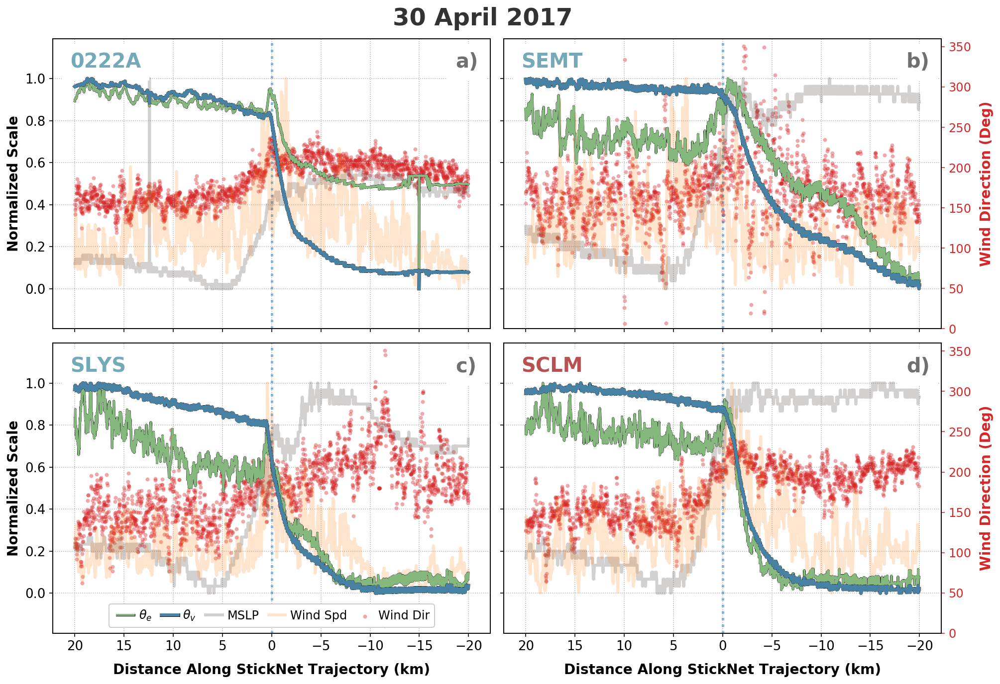

In [21]:
plt.rc('xtick',labelsize=13)
plt.rc('ytick',labelsize=13)
fig, axes = plt.subplots(2,2, figsize=(16,11),sharey= True, sharex=True)
axes[0,0].invert_xaxis()

event = sns[sns['date']==20170430]
event = event.set_index(event['ID'])
SN = ['0222A','0214A','0111A','0107A']


duration = 120

tor = '#b85151'
rot = '#74a9b8'
iskip=1#0

plot_norm(axes[0,0], SN[0], event.loc[SN[0]]['TOA'], duration, legend=False, y2_supress=True, text_c=rot, skip=iskip)
plot_norm(axes[0,1], SN[1], event.loc[SN[1]]['TOA'], duration, legend=False, text_c=rot, skip=iskip)
plot_norm(axes[1,0], SN[2], event.loc[SN[2]]['TOA'], duration, legend=True, y2_supress=True, text_c = rot, skip=iskip)
plot_norm(axes[1,1], SN[3], event.loc[SN[3]]['TOA'], duration, legend=False, text_c = tor, skip=iskip)

# force axes to not be butts
plot_labels = ['a)', 'b)', 'c)', 'd)']

for i,ax in enumerate(axes.flatten()[:]):
    #ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%H:%M UTC'))
    # add in plot label
    ax.text(0.92,0.9,plot_labels[i], fontsize=20, transform=ax.transAxes,color='#6f7070',
       weight= 'bold', bbox=dict(facecolor='white', edgecolor='white',pad=8))

plt.subplots_adjust(wspace=.03, hspace=0.05)
plt.suptitle('30 April 2017', fontsize=24,weight='bold', y=0.92, alpha=0.8)

axes[0,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')
axes[1,0].set_ylabel('Normalized Scale', fontsize=14, weight='bold')

axes[1,0].set_xlabel('Distance Along StickNet Trajectory (km)', fontsize=14, weight='bold', labelpad=10);
axes[1,1].set_xlabel('Distance Along StickNet Trajectory (km)', fontsize=14, weight='bold', labelpad=10);

#plt.savefig('{0}30AprilNorm.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);

# Deficit Scatter Plots

In [2]:
SNSfile = 'C:\\Users\\joshu\\Desktop\\IOP1_Grad_Analysis.csv'
sns = pd.read_csv(SNSfile)

sns = sns.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns = sns[sns['TOA_coldpool_final'].notna()]
sns = sns.set_index(sns['ID'])


FileNotFoundError: [Errno 2] File C:\Users\joshu\Desktop\IOP1_Grad_Analysis.csv does not exist: 'C:\\Users\\joshu\\Desktop\\IOP1_Grad_Analysis.csv'

In [10]:
# def get_colors():
#     supc = cmocean.cm.rain(0.25)
#     mixc = cmocean.cm.rain(0.45)
#     linc = cmocean.cm.rain(0.75)
#     a =1
#     a_tor=1
#     return supc, mixc, linc, a, a_tor

# def get_mode_average(var, mode):
#     ''' var == dTVdn, TE, or TV
#     mode is linear, supercell, or mixed, or all'''
#     if mode == 'all':
#         average = np.average(sns[sns['type']!='NR'][var])
#     else:
#         average = np.average(sns[(sns['mode']==mode) & (sns['type']!='NR')][var])
#     return average

# def get_mode(var, mode, typ):
#     ''' var == dTVdn, TE, or TV
#     mode is linear, supercell, or mixed
#     typ is R or T'''
#     return sns[(sns['mode']==mode) & (sns['type']==typ)][var]

# def get_dir(var, mode, typ, direction):
#     ''' var == dTVdn, TE, or TV
#     mode is linear, supercell, or mixed
#     typ is R or T'''
#     return sns[(sns['mode']==mode) & (sns['type']==typ) & (sns['Directionality']==direction)][var]

# def get_tor(var, mode, typ, tor):
#     ''' var == dTVdn, TE, or TV
#     mode is linear, supercell, or mixed
#     typ is R or T'''
#     return sns[(sns['mode']==mode) & (sns['type']==typ)& (sns['tor']==tor)][var]

save_dir = 'C:\\Users\\joshu\\Desktop\\Test_Plots\\'

# SNSfile = 'C:\\Users\\joshu\\Desktop\\IOP3_Grad_Analysis.csv'
# sns = pd.read_csv(SNSfile)

# sns = sns.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
# sns = sns[sns['TOA_coldpool_final'].notna()]
# sns = sns.set_index(sns['ID'])

def get_mode1(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns1[(sns1['mode']==mode) & (sns1['type']==typ)][var]

def get_tor1(var, mode, typ, tor):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns1[(sns1['mode']==mode) & (sns1['type']==typ)& (sns1['tor']==tor)][var]

def get_dir1(var, mode, typ, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns1[(sns1['mode']==mode) & (sns1['type']==typ) & (sns1['Directionality']==direction)][var]

def get_dir_T1(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns1[(sns1['mode']==mode) & (sns1['type']==typ) & (sns1['tor']!=tor) & (sns1['Directionality']==direction)][var]

def get_dir_NT1(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns1[(sns1['mode']==mode) & (sns1['type']==typ) & (sns1['tor']==tor) & (sns1['Directionality']==direction)][var]

def get_mode2(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns2[(sns2['mode']==mode) & (sns2['type']==typ)][var]

def get_tor2(var, mode, typ, tor):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns2[(sns2['mode']==mode) & (sns2['type']==typ)& (sns2['tor']==tor)][var]

def get_dir2(var, mode, typ, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns2[(sns2['mode']==mode) & (sns2['type']==typ) & (sns2['Directionality']==direction)][var]

def get_dir_T2(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns2[(sns2['mode']==mode) & (sns2['type']==typ) & (sns2['tor']!=tor) & (sns2['Directionality']==direction)][var]

def get_dir_NT2(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns2[(sns2['mode']==mode) & (sns2['type']==typ) & (sns2['tor']==tor) & (sns2['Directionality']==direction)][var]

def get_mode3(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns3[(sns3['mode']==mode) & (sns3['type']==typ)][var]

def get_tor3(var, mode, typ, tor):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns3[(sns3['mode']==mode) & (sns3['type']==typ)& (sns3['tor']==tor)][var]

def get_dir3(var, mode, typ, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns3[(sns3['mode']==mode) & (sns3['type']==typ) & (sns3['Directionality']==direction)][var]

def get_dir_T3(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns3[(sns3['mode']==mode) & (sns3['type']==typ) & (sns3['tor']!=tor) & (sns3['Directionality']==direction)][var]

def get_dir_NT3(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns3[(sns3['mode']==mode) & (sns3['type']==typ) & (sns3['tor']==tor) & (sns3['Directionality']==direction)][var]

def get_mode4(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns4[(sns4['mode']==mode) & (sns4['type']==typ)][var]

def get_tor4(var, mode, typ, tor):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns4[(sns4['mode']==mode) & (sns4['type']==typ)& (sns4['tor']==tor)][var]

def get_dir4(var, mode, typ, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns4[(sns4['mode']==mode) & (sns4['type']==typ) & (sns4['Directionality']==direction)][var]

def get_dir_T4(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns4[(sns4['mode']==mode) & (sns4['type']==typ) & (sns4['tor']!=tor) & (sns4['Directionality']==direction)][var]

def get_dir_NT4(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns4[(sns4['mode']==mode) & (sns4['type']==typ) & (sns4['tor']==tor) & (sns4['Directionality']==direction)][var]

def get_mode22(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns22[(sns22['mode']==mode) & (sns22['type']==typ)][var]

def get_tor22(var, mode, typ, tor):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns22[(sns22['mode']==mode) & (sns22['type']==typ)& (sns22['tor']==tor)][var]

def get_dir22(var, mode, typ, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns22[(sns22['mode']==mode) & (sns22['type']==typ) & (sns22['Directionality']==direction)][var]

def get_dir_T22(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns22[(sns22['mode']==mode) & (sns22['type']==typ) & (sns22['tor']!=tor) & (sns22['Directionality']==direction)][var]

def get_dir_NT22(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns22[(sns22['mode']==mode) & (sns22['type']==typ) & (sns22['tor']==tor) & (sns22['Directionality']==direction)][var]

def get_mode44(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns44[(sns44['mode']==mode) & (sns44['type']==typ)][var]

def get_tor44(var, mode, typ, tor):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns44[(sns44['mode']==mode) & (sns44['type']==typ)& (sns44['tor']==tor)][var]

def get_dir44(var, mode, typ, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns44[(sns44['mode']==mode) & (sns44['type']==typ) & (sns44['Directionality']==direction)][var]

def get_dir_T44(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns44[(sns44['mode']==mode) & (sns44['type']==typ) & (sns44['tor']!=tor) & (sns44['Directionality']==direction)][var]

def get_dir_NT44(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns44[(sns44['mode']==mode) & (sns44['type']==typ) & (sns44['tor']==tor) & (sns44['Directionality']==direction)][var]

def get_mode5(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns5[(sns5['mode']==mode) & (sns5['type']==typ)][var]

def get_tor5(var, mode, typ, tor):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns5[(sns5['mode']==mode) & (sns5['type']==typ)& (sns5['tor']==tor)][var]

def get_dir5(var, mode, typ, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns5[(sns5['mode']==mode) & (sns5['type']==typ) & (sns5['Directionality']==direction)][var]

def get_dir_T5(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns5[(sns5['mode']==mode) & (sns5['type']==typ) & (sns5['tor']!=tor) & (sns5['Directionality']==direction)][var]

def get_dir_NT5(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns5[(sns5['mode']==mode) & (sns5['type']==typ) & (sns5['tor']==tor) & (sns5['Directionality']==direction)][var]

def get_tdd1(var, mode):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns1[(sns1['mode']==mode)][var]
def get_tdd2(var, mode):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns2[(sns2['mode']==mode)][var]
def get_tdd3(var, mode):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns3[(sns3['mode']==mode)][var]
def get_tdd4(var, mode):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns4[(sns4['mode']==mode)][var]
def get_tdd22(var, mode):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns22[(sns22['mode']==mode)][var]
def get_tdd44(var, mode):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns44[(sns44['mode']==mode)][var]
def get_tdd5(var, mode):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns5[(sns5['mode']==mode)][var]


SNSfile1 = 'E:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP1_Grad_Analysis.csv'
sns1 = pd.read_csv(SNSfile1)

sns1 = sns1.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns1 = sns1[sns1['TOA_coldpool_final'].notna()]
sns1 = sns1.set_index(sns1['ID'])

SNSfile2 = 'E:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP2_Grad_Analysis.csv'
sns2 = pd.read_csv(SNSfile2)

sns2 = sns2.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns2 = sns2[sns2['TOA_coldpool_final'].notna()]
sns2 = sns2.set_index(sns2['ID'])

SNSfile3 = 'E:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP3_Grad_Analysis.csv'
sns3 = pd.read_csv(SNSfile3)

sns3 = sns3.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns3 = sns3[sns3['TOA_coldpool_final'].notna()]
sns3 = sns3.set_index(sns3['ID'])

SNSfile4 = 'E:\\PERiLS_Y1\\Excel_SN\\After_CPA\\IOP4_Grad_Analysis.csv'
sns4 = pd.read_csv(SNSfile4)

sns4 = sns4.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns4 = sns4[sns4['TOA_coldpool_final'].notna()]
sns4 = sns4.set_index(sns4['ID'])

SNSfile22 = 'E:\\PERiLS_Y2\\Excel_SN\\After_CPA\\IOP2Y2_Grad_Analysis.csv'
sns22 = pd.read_csv(SNSfile22)

sns22 = sns22.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns22 = sns22[sns22['TOA_coldpool_final'].notna()]
sns22 = sns22.set_index(sns22['ID'])

SNSfile44 = 'E:\\PERiLS_Y2\\Excel_SN\\After_CPA\\IOP4Y2_Grad_Analysis.csv'
sns44 = pd.read_csv(SNSfile44)

sns44 = sns44.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns44 = sns44[sns44['TOA_coldpool_final'].notna()]
sns44 = sns44.set_index(sns44['ID'])

SNSfile5 = 'E:\\PERiLS_Y2\\Excel_SN\\After_CPA\\IOP5Y2_Grad_Analysis.csv'
sns5 = pd.read_csv(SNSfile5)

sns5 = sns5.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
sns5 = sns5[sns5['TOA_coldpool_final'].notna()]
sns5 = sns5.set_index(sns5['ID'])


mode_functions = [get_mode1,get_mode2,get_mode3,get_mode4,get_mode22,get_mode44,get_mode5]
tor_functions = [get_tor1,get_tor2,get_tor3,get_tor4,get_tor22,get_tor44,get_tor5]
dir_functions = [get_dir1,get_dir2,get_dir3,get_dir4,get_dir22,get_dir44,get_dir5]
dir_tor_T_functions = [get_dir_T1,get_dir_T2,get_dir_T3,get_dir_T4,get_dir_T22,get_dir_T44,get_dir_T5]
dir_tor_NT_functions = [get_dir_NT1,get_dir_NT2,get_dir_NT3,get_dir_NT4,get_dir_NT22,get_dir_NT44,get_dir_NT5]
tdd_functions = [get_tdd1,get_tdd2,get_tdd3,get_tdd4,get_tdd22,get_tdd44,get_tdd5]

In [4]:
Linear_TE = get_mode('TE','Linear','NR')
Linear_TV = get_mode('TV','Linear','NR')
Linear_dTVdn = get_mode('dTVdn','Linear','NR')

MV_TE_R = get_mode('TE','Mesovortex','R')
MV_TV_R = get_mode('TV','Mesovortex','R')
MV_dTVdn_R = get_mode('dTVdn','Mesovortex','R')

MC_TE_R = get_mode('TE','Mesocyclone','R')
MC_TV_R = get_mode('TV','Mesocyclone','R')
MC_dTVdn_R = get_mode('dTVdn','Mesocyclone','R')

Mixed_TE_R = get_mode('TE','Mixed','R')
Mixed_TV_R = get_mode('TV','Mixed','R')
Mixed_dTVdn_R = get_mode('dTVdn','Mixed','R')

Hybrid_TE_R = get_mode('TE','Hybrid','R')
Hybrid_TV_R = get_mode('TV','Hybrid','R')
Hybrid_dTVdn_R = get_mode('dTVdn','Hybrid','R')

MV_TE_N = get_dir('TE','Mesovortex','R','N')
MV_TE_S = get_dir('TE','Mesovortex','R','S')
MV_TV_N = get_dir('TV','Mesovortex','R','N')
MV_TV_S = get_dir('TV','Mesovortex','R','S')
MV_dTVdn_N = get_dir('dTVdn','Mesovortex','R','N')
MV_dTVdn_S = get_dir('dTVdn','Mesovortex','R','S')

MC_TE_N = get_dir('TE','Mesocyclone','R','N')
MC_TE_S = get_dir('TE','Mesocyclone','R','S')
MC_TV_N = get_dir('TV','Mesocyclone','R','N')
MC_TV_S = get_dir('TV','Mesocyclone','R','S')
MC_dTVdn_N = get_dir('dTVdn','Mesocyclone','R','N')
MC_dTVdn_S = get_dir('dTVdn','Mesocyclone','R','S')

Mixed_TE_N = get_dir('TE','Mixed','R','N')
Mixed_TE_S = get_dir('TE','Mixed','R','S')
Mixed_TV_N = get_dir('TV','Mixed','R','N')
Mixed_TV_S = get_dir('TV','Mixed','R','S')
Mixed_dTVdn_N = get_dir('dTVdn','Mixed','R','N')
Mixed_dTVdn_S = get_dir('dTVdn','Mixed','R','S')

Hybrid_TE_N = get_dir('TE','Hybrid','R','N')
Hybrid_TE_S = get_dir('TE','Hybrid','R','S')
Hybrid_TV_N = get_dir('TV','Hybrid','R','N')
Hybrid_TV_S = get_dir('TV','Hybrid','R','S')
Hybrid_dTVdn_N = get_dir('dTVdn','Hybrid','R','N')
Hybrid_dTVdn_S = get_dir('dTVdn','Hybrid','R','S')

MV_TE_NT = get_tor('TE','Mesovortex','R','NT')
MV_TV_NT = get_tor('TV','Mesovortex','R','NT')
MV_dTVdn_NT = get_tor('dTVdn','Mesovortex','R','NT')
MV_TE_TOT = get_tor('TE','Mesovortex','R','TOT')
MV_TV_TOT = get_tor('TV','Mesovortex','R','TOT')
MV_dTVdn_TOT = get_tor('dTVdn','Mesovortex','R','TOT')
MV_TE_Pre = get_tor('TE','Mesovortex','R','Pre')
MV_TV_Pre = get_tor('TV','Mesovortex','R','Pre')
MV_dTVdn_Pre = get_tor('dTVdn','Mesovortex','R','Pre')
MV_TE_Post = get_tor('TE','Mesovortex','R','Post')
MV_TV_Post = get_tor('TV','Mesovortex','R','Post')
MV_dTVdn_Post = get_tor('dTVdn','Mesovortex','R','Post')

MC_TE_NT = get_tor('TE','Mesocyclone','R','NT')
MC_TV_NT = get_tor('TV','Mesocyclone','R','NT')
MC_dTVdn_NT = get_tor('dTVdn','Mesocyclone','R','NT')
MC_TE_TOT = get_tor('TE','Mesocyclone','R','TOT')
MC_TV_TOT = get_tor('TV','Mesocyclone','R','TOT')
MC_dTVdn_TOT = get_tor('dTVdn','Mesocyclone','R','TOT')
MC_TE_Pre = get_tor('TE','Mesocyclone','R','Pre')
MC_TV_Pre = get_tor('TV','Mesocyclone','R','Pre')
MC_dTVdn_Pre = get_tor('dTVdn','Mesocyclone','R','Pre')
MC_TE_Post = get_tor('TE','Mesocyclone','R','Post')
MC_TV_Post = get_tor('TV','Mesocyclone','R','Post')
MC_dTVdn_Post = get_tor('dTVdn','Mesocyclone','R','Post')

Mixed_TE_NT = get_tor('TE','Mixed','R','NT')
Mixed_TV_NT = get_tor('TV','Mixed','R','NT')
Mixed_dTVdn_NT = get_tor('dTVdn','Mixed','R','NT')
Mixed_TE_TOT = get_tor('TE','Mixed','R','TOT')
Mixed_TV_TOT = get_tor('TV','Mixed','R','TOT')
Mixed_dTVdn_TOT = get_tor('dTVdn','Mixed','R','TOT')
Mixed_TE_Pre = get_tor('TE','Mixed','R','Pre')
Mixed_TV_Pre = get_tor('TV','Mixed','R','Pre')
Mixed_dTVdn_Pre = get_tor('dTVdn','Mixed','R','Pre')
Mixed_TE_Post = get_tor('TE','Mixed','R','Post')
Mixed_TV_Post = get_tor('TV','Mixed','R','Post')
Mixed_dTVdn_Post = get_tor('dTVdn','Mixed','R','Post')

Hybrid_TE_NT = get_tor('TE','Hybrid','R','NT')
Hybrid_TV_NT = get_tor('TV','Hybrid','R','NT')
Hybrid_dTVdn_NT = get_tor('dTVdn','Hybrid','R','NT')
Hybrid_TE_TOT = get_tor('TE','Hybrid','R','TOT')
Hybrid_TV_TOT = get_tor('TV','Hybrid','R','TOT')
Hybrid_dTVdn_TOT = get_tor('dTVdn','Hybrid','R','TOT')
Hybrid_TE_Pre = get_tor('TE','Hybrid','R','Pre')
Hybrid_TV_Pre = get_tor('TV','Hybrid','R','Pre')
Hybrid_dTVdn_Pre = get_tor('dTVdn','Hybrid','R','Pre')
Hybrid_TE_Post = get_tor('TE','Hybrid','R','Post')
Hybrid_TV_Post = get_tor('TV','Hybrid','R','Post')
Hybrid_dTVdn_Post = get_tor('dTVdn','Hybrid','R','Post')


NameError: name 'get_mode' is not defined

In [11]:
LTE = []
LTV = []
LDTV = []
MVTE = []
MVTV = []
MVDTV = []
MCTE = []
MCTV = []
MCDTV = []
HTE = []
HTV = []
HDTV = []
MTE = []
MTV = []
MDTV = []

MVTE_N = []
MVTV_N = []
MVDTV_N = []
MCTE_N = []
MCTV_N = []
MCDTV_N = []
HTE_N = []
HTV_N = []
HDTV_N = []
MTE_N = []
MTV_N = []
MDTV_N = []

MVTE_S = []
MVTV_S = []
MVDTV_S = []
MCTE_S = []
MCTV_S = []
MCDTV_S = []
HTE_S = []
HTV_S = []
HDTV_S = []
MTE_S = []
MTV_S = []
MDTV_S = []

MVTE_TOT = []
MVTV_TOT = []
MVDTV_TOT = []
MCTE_TOT = []
MCTV_TOT = []
MCDTV_TOT = []
HTE_TOT = []
HTV_TOT = []
HDTV_TOT = []
MTE_TOT = []
MTV_TOT = []
MDTV_TOT = []

MVTE_NT = []
MVTV_NT = []
MVDTV_NT = []
MCTE_NT = []
MCTV_NT = []
MCDTV_NT = []
HTE_NT = []
HTV_NT = []
HDTV_NT = []
MTE_NT = []
MTV_NT = []
MDTV_NT = []

MVTE_PRE = []
MVTV_PRE = []
MVDTV_PRE = []
MCTE_PRE = []
MCTV_PRE = []
MCDTV_PRE = []
HTE_PRE = []
HTV_PRE = []
HDTV_PRE = []
MTE_PRE = []
MTV_PRE = []
MDTV_PRE = []

MVTE_POST = []
MVTV_POST = []
MVDTV_POST = []
MCTE_POST = []
MCTV_POST = []
MCDTV_POST = []
HTE_POST = []
HTV_POST = []
HDTV_POST = []
MTE_POST = []
MTV_POST = []
MDTV_POST = []

MVTE_T_N = []
MVTE_T_S = []
MVTV_T_N = []
MVTV_T_S = []
MVDTV_T_N = []
MVDTV_T_S = []
MCTE_T_N = []
MCTE_T_S = []
MCTV_T_N = []
MCTV_T_S = []
MCDTV_T_N = []
MCDTV_T_S = []
MTE_T_N = []
MTE_T_S = []
MTV_T_N = []
MTV_T_S = []
MDTV_T_N = []
MDTV_T_S = []
HTE_T_N = []
HTE_T_S = []
HTV_T_N = []
HTV_T_S = []
HDTV_T_N = []
HDTV_T_S = []

MVTE_T_N1 = []
MVTE_T_S1 = []
MVTV_T_N1 = []
MVTV_T_S1 = []
MVDTV_T_N1 = []
MVDTV_T_S1 = []
MCTE_T_N1 = []
MCTE_T_S1 = []
MCTV_T_N1 = []
MCTV_T_S1 = []
MCDTV_T_N1 = []
MCDTV_T_S1 = []
MTE_T_N1 = []
MTE_T_S1 = []
MTV_T_N1 = []
MTV_T_S1 = []
MDTV_T_N1 = []
MDTV_T_S1 = []
HTE_T_N1 = []
HTE_T_S1 = []
HTV_T_N1 = []
HTV_T_S1 = []
HDTV_T_N1 = []
HDTV_T_S1 = []


LTDD=[]
MVTDD=[]
MCTDD=[]
MTDD=[]
HTDD=[]

dir_tor_T_functions = [get_dir_T1,get_dir_T2,get_dir_T3,get_dir_T4,get_dir_T22,get_dir_T44,get_dir_T5]
dir_tor_NT_functions = [get_dir_NT1,get_dir_NT2,get_dir_NT3,get_dir_NT4,get_dir_NT22,get_dir_NT44,get_dir_NT5]


for get_mode,get_dir,get_tor,get_dir_T,get_dir_NT,get_tdd in zip(mode_functions,dir_functions,tor_functions,dir_tor_T_functions,dir_tor_NT_functions,tdd_functions):
    Linear_TE = get_mode('TE','Linear','NR').values
    Linear_TV = get_mode('TV','Linear','NR').values
    Linear_dTVdn = get_mode('dTVdn','Linear','NR').values

    MV_TE_R = get_mode('TE','Mesovortex','R').values
    MV_TV_R = get_mode('TV','Mesovortex','R').values
    MV_dTVdn_R = get_mode('dTVdn','Mesovortex','R').values

    MC_TE_R = get_mode('TE','Mesocyclone','R').values
    MC_TV_R = get_mode('TV','Mesocyclone','R').values
    MC_dTVdn_R = get_mode('dTVdn','Mesocyclone','R').values

    Mixed_TE_R = get_mode('TE','Mixed','R').values
    Mixed_TV_R = get_mode('TV','Mixed','R').values
    Mixed_dTVdn_R = get_mode('dTVdn','Mixed','R').values

    Hybrid_TE_R = get_mode('TE','Hybrid','R').values
    Hybrid_TV_R = get_mode('TV','Hybrid','R').values
    Hybrid_dTVdn_R = get_mode('dTVdn','Hybrid','R').values
    
    MV_TE_N = get_dir('TE','Mesovortex','R','N').values
    MV_TE_S = get_dir('TE','Mesovortex','R','S').values
    MV_TV_N = get_dir('TV','Mesovortex','R','N').values
    MV_TV_S = get_dir('TV','Mesovortex','R','S').values
    MV_dTVdn_N = get_dir('dTVdn','Mesovortex','R','N').values
    MV_dTVdn_S = get_dir('dTVdn','Mesovortex','R','S').values

    MC_TE_N = get_dir('TE','Mesocyclone','R','N').values
    MC_TE_S = get_dir('TE','Mesocyclone','R','S').values
    MC_TV_N = get_dir('TV','Mesocyclone','R','N').values
    MC_TV_S = get_dir('TV','Mesocyclone','R','S').values
    MC_dTVdn_N = get_dir('dTVdn','Mesocyclone','R','N').values
    MC_dTVdn_S = get_dir('dTVdn','Mesocyclone','R','S').values

    Mixed_TE_N = get_dir('TE','Mixed','R','N').values
    Mixed_TE_S = get_dir('TE','Mixed','R','S').values
    Mixed_TV_N = get_dir('TV','Mixed','R','N').values
    Mixed_TV_S = get_dir('TV','Mixed','R','S').values
    Mixed_dTVdn_N = get_dir('dTVdn','Mixed','R','N').values
    Mixed_dTVdn_S = get_dir('dTVdn','Mixed','R','S').values

    Hybrid_TE_N = get_dir('TE','Hybrid','R','N').values
    Hybrid_TE_S = get_dir('TE','Hybrid','R','S').values
    Hybrid_TV_N = get_dir('TV','Hybrid','R','N').values
    Hybrid_TV_S = get_dir('TV','Hybrid','R','S').values
    Hybrid_dTVdn_N = get_dir('dTVdn','Hybrid','R','N').values
    Hybrid_dTVdn_S = get_dir('dTVdn','Hybrid','R','S').values
    
    MV_TE_NT = get_tor('TE','Mesovortex','R','NT').values
    MV_TV_NT = get_tor('TV','Mesovortex','R','NT').values
    MV_dTVdn_NT = get_tor('dTVdn','Mesovortex','R','NT').values
    MV_TE_TOT = get_tor('TE','Mesovortex','R','TOT').values
    MV_TV_TOT = get_tor('TV','Mesovortex','R','TOT').values
    MV_dTVdn_TOT = get_tor('dTVdn','Mesovortex','R','TOT').values
    MV_TE_Pre = get_tor('TE','Mesovortex','R','Pre').values
    MV_TV_Pre = get_tor('TV','Mesovortex','R','Pre').values
    MV_dTVdn_Pre = get_tor('dTVdn','Mesovortex','R','Pre').values
    MV_TE_Post = get_tor('TE','Mesovortex','R','Post').values
    MV_TV_Post = get_tor('TV','Mesovortex','R','Post').values
    MV_dTVdn_Post = get_tor('dTVdn','Mesovortex','R','Post').values

    MC_TE_NT = get_tor('TE','Mesocyclone','R','NT').values
    MC_TV_NT = get_tor('TV','Mesocyclone','R','NT').values
    MC_dTVdn_NT = get_tor('dTVdn','Mesocyclone','R','NT').values
    MC_TE_TOT = get_tor('TE','Mesocyclone','R','TOT').values
    MC_TV_TOT = get_tor('TV','Mesocyclone','R','TOT').values
    MC_dTVdn_TOT = get_tor('dTVdn','Mesocyclone','R','TOT').values
    MC_TE_Pre = get_tor('TE','Mesocyclone','R','Pre').values
    MC_TV_Pre = get_tor('TV','Mesocyclone','R','Pre').values
    MC_dTVdn_Pre = get_tor('dTVdn','Mesocyclone','R','Pre').values
    MC_TE_Post = get_tor('TE','Mesocyclone','R','Post').values
    MC_TV_Post = get_tor('TV','Mesocyclone','R','Post').values
    MC_dTVdn_Post = get_tor('dTVdn','Mesocyclone','R','Post').values

    Mixed_TE_NT = get_tor('TE','Mixed','R','NT').values
    Mixed_TV_NT = get_tor('TV','Mixed','R','NT').values
    Mixed_dTVdn_NT = get_tor('dTVdn','Mixed','R','NT').values
    Mixed_TE_TOT = get_tor('TE','Mixed','R','TOT').values
    Mixed_TV_TOT = get_tor('TV','Mixed','R','TOT').values
    Mixed_dTVdn_TOT = get_tor('dTVdn','Mixed','R','TOT').values
    Mixed_TE_Pre = get_tor('TE','Mixed','R','Pre').values
    Mixed_TV_Pre = get_tor('TV','Mixed','R','Pre').values
    Mixed_dTVdn_Pre = get_tor('dTVdn','Mixed','R','Pre').values
    Mixed_TE_Post = get_tor('TE','Mixed','R','Post').values
    Mixed_TV_Post = get_tor('TV','Mixed','R','Post').values
    Mixed_dTVdn_Post = get_tor('dTVdn','Mixed','R','Post').values

    Hybrid_TE_NT = get_tor('TE','Hybrid','R','NT').values
    Hybrid_TV_NT = get_tor('TV','Hybrid','R','NT').values
    Hybrid_dTVdn_NT = get_tor('dTVdn','Hybrid','R','NT').values
    Hybrid_TE_TOT = get_tor('TE','Hybrid','R','TOT').values
    Hybrid_TV_TOT = get_tor('TV','Hybrid','R','TOT').values
    Hybrid_dTVdn_TOT = get_tor('dTVdn','Hybrid','R','TOT').values
    Hybrid_TE_Pre = get_tor('TE','Hybrid','R','Pre').values
    Hybrid_TV_Pre = get_tor('TV','Hybrid','R','Pre').values
    Hybrid_dTVdn_Pre = get_tor('dTVdn','Hybrid','R','Pre').values
    Hybrid_TE_Post = get_tor('TE','Hybrid','R','Post').values
    Hybrid_TV_Post = get_tor('TV','Hybrid','R','Post').values
    Hybrid_dTVdn_Post = get_tor('dTVdn','Hybrid','R','Post').values
    
    #tor in this case is notequal tor (USED THIS FOR NT CASES AS WELL SO MAKE SURE ABOVE CELL IS != or ==)
    
    MV_TE_T_N = get_dir_T('TE', 'Mesovortex', 'R', 'NT', 'N')
    MV_TE_T_S = get_dir_T('TE', 'Mesovortex', 'R', 'NT', 'S')
    MV_TV_T_N = get_dir_T('TV', 'Mesovortex', 'R', 'NT', 'N')
    MV_TV_T_S = get_dir_T('TV', 'Mesovortex', 'R', 'NT', 'S')
    MV_dTVdn_T_N = get_dir_T('dTVdn', 'Mesovortex', 'R', 'NT', 'N')
    MV_dTVdn_T_S = get_dir_T('dTVdn', 'Mesovortex', 'R', 'NT', 'S')
    
    MC_TE_T_N = get_dir_T('TE', 'Mesocyclone', 'R', 'NT', 'N')
    MC_TE_T_S = get_dir_T('TE', 'Mesocyclone', 'R', 'NT', 'S')
    MC_TV_T_N = get_dir_T('TV', 'Mesocyclone', 'R', 'NT', 'N')
    MC_TV_T_S = get_dir_T('TV', 'Mesocyclone', 'R', 'NT', 'S')
    MC_dTVdn_T_N = get_dir_T('dTVdn', 'Mesocyclone', 'R', 'NT', 'N')
    MC_dTVdn_T_S = get_dir_T('dTVdn', 'Mesocyclone', 'R', 'NT', 'S')
    
    Mixed_TE_T_N = get_dir_T('TE', 'Mixed', 'R', 'NT', 'N')
    Mixed_TE_T_S = get_dir_T('TE', 'Mixed', 'R', 'NT', 'S')
    Mixed_TV_T_N = get_dir_T('TV', 'Mixed', 'R', 'NT', 'N')
    Mixed_TV_T_S = get_dir_T('TV', 'Mixed', 'R', 'NT', 'S')
    Mixed_dTVdn_T_N = get_dir_T('dTVdn', 'Mixed', 'R', 'NT', 'N')
    Mixed_dTVdn_T_S = get_dir_T('dTVdn', 'Mixed', 'R', 'NT', 'S')
    
    Hybrid_TE_T_N = get_dir_T('TE', 'Hybrid', 'R', 'NT', 'N')
    Hybrid_TE_T_S = get_dir_T('TE', 'Hybrid', 'R', 'NT', 'S')
    Hybrid_TV_T_N = get_dir_T('TV', 'Hybrid', 'R', 'NT', 'N')
    Hybrid_TV_T_S = get_dir_T('TV', 'Hybrid', 'R', 'NT', 'S')
    Hybrid_dTVdn_T_N = get_dir_T('dTVdn', 'Hybrid', 'R', 'NT', 'N')
    Hybrid_dTVdn_T_S = get_dir_T('dTVdn', 'Hybrid', 'R', 'NT', 'S')
    
    MV_TE_T_N1 = get_dir_NT('TE', 'Mesovortex', 'R', 'NT', 'N')
    MV_TE_T_S1 = get_dir_NT('TE', 'Mesovortex', 'R', 'NT', 'S')
    MV_TV_T_N1 = get_dir_NT('TV', 'Mesovortex', 'R', 'NT', 'N')
    MV_TV_T_S1 = get_dir_NT('TV', 'Mesovortex', 'R', 'NT', 'S')
    MV_dTVdn_T_N1 = get_dir_NT('dTVdn', 'Mesovortex', 'R', 'NT', 'N')
    MV_dTVdn_T_S1 = get_dir_NT('dTVdn', 'Mesovortex', 'R', 'NT', 'S')
    
    MC_TE_T_N1 = get_dir_NT('TE', 'Mesocyclone', 'R', 'NT', 'N')
    MC_TE_T_S1 = get_dir_NT('TE', 'Mesocyclone', 'R', 'NT', 'S')
    MC_TV_T_N1 = get_dir_NT('TV', 'Mesocyclone', 'R', 'NT', 'N')
    MC_TV_T_S1 = get_dir_NT('TV', 'Mesocyclone', 'R', 'NT', 'S')
    MC_dTVdn_T_N1 = get_dir_NT('dTVdn', 'Mesocyclone', 'R', 'NT', 'N')
    MC_dTVdn_T_S1 = get_dir_NT('dTVdn', 'Mesocyclone', 'R', 'NT', 'S')
    
    Mixed_TE_T_N1 = get_dir_NT('TE', 'Mixed', 'R', 'NT', 'N')
    Mixed_TE_T_S1 = get_dir_NT('TE', 'Mixed', 'R', 'NT', 'S')
    Mixed_TV_T_N1 = get_dir_NT('TV', 'Mixed', 'R', 'NT', 'N')
    Mixed_TV_T_S1 = get_dir_NT('TV', 'Mixed', 'R', 'NT', 'S')
    Mixed_dTVdn_T_N1 = get_dir_NT('dTVdn', 'Mixed', 'R', 'NT', 'N')
    Mixed_dTVdn_T_S1 = get_dir_NT('dTVdn', 'Mixed', 'R', 'NT', 'S')
    
    Hybrid_TE_T_N1 = get_dir_NT('TE', 'Hybrid', 'R', 'NT', 'N')
    Hybrid_TE_T_S1 = get_dir_NT('TE', 'Hybrid', 'R', 'NT', 'S')
    Hybrid_TV_T_N1 = get_dir_NT('TV', 'Hybrid', 'R', 'NT', 'N')
    Hybrid_TV_T_S1 = get_dir_NT('TV', 'Hybrid', 'R', 'NT', 'S')
    Hybrid_dTVdn_T_N1 = get_dir_NT('dTVdn', 'Hybrid', 'R', 'NT', 'N')
    Hybrid_dTVdn_T_S1 = get_dir_NT('dTVdn', 'Hybrid', 'R', 'NT', 'S')
    
    LTD=get_tdd('Tdd_BS','Linear')
    MVTD=get_tdd('Tdd_BS','Mesovortex')
    MCTD=get_tdd('Tdd_BS','Mesocyclone')
    MTD=get_tdd('Tdd_BS','Mixed')
    HTD=get_tdd('Tdd_BS','Hybrid')
    
    LTDD.append(LTD)
    MVTDD.append(MVTD)
    MCTDD.append(MCTD)
    MTDD.append(MTD)
    HTDD.append(HTD)
    
    LTE.append(Linear_TE)
    LTV.append(Linear_TV)
    LDTV.append(Linear_dTVdn)
    MVTE.append(MV_TE_R)
    MVTV.append(MV_TV_R)
    MVDTV.append(MV_dTVdn_R)
    MCTE.append(MC_TE_R)
    MCTV.append(MC_TV_R)
    MCDTV.append(MC_dTVdn_R)
    HTE.append(Hybrid_TE_R)
    HTV.append(Hybrid_TV_R)
    HDTV.append(Hybrid_dTVdn_R)
    MTE.append(Mixed_TE_R)
    MTV.append(Mixed_TV_R)
    MDTV.append(Mixed_dTVdn_R)

    MVTE_N.append(MV_TE_N)
    MVTV_N.append(MV_TV_N)
    MVDTV_N.append(MV_dTVdn_N)
    MCTE_N.append(MC_TE_N)
    MCTV_N.append(MC_TV_N)
    MCDTV_N.append(MC_dTVdn_N)
    HTE_N.append(Hybrid_TE_N)
    HTV_N.append(Hybrid_TV_N)
    HDTV_N.append(Hybrid_dTVdn_N)
    MTE_N.append(Mixed_TE_N)
    MTV_N.append(Mixed_TV_N)
    MDTV_N.append(Mixed_dTVdn_N)

    MVTE_S.append(MV_TE_S)
    MVTV_S.append(MV_TV_S)
    MVDTV_S.append(MV_dTVdn_S)
    MCTE_S.append(MC_TE_S)
    MCTV_S.append(MC_TV_S)
    MCDTV_S.append(MC_dTVdn_S)
    HTE_S.append(Hybrid_TE_S)
    HTV_S.append(Hybrid_TV_S)
    HDTV_S.append(Hybrid_dTVdn_S)
    MTE_S.append(Mixed_TE_S)
    MTV_S.append(Mixed_TV_S)
    MDTV_S.append(Mixed_dTVdn_S)

    MVTE_TOT.append(MV_TE_TOT)
    MVTV_TOT.append(MV_TV_TOT)
    MVDTV_TOT.append(MV_dTVdn_TOT)
    MCTE_TOT.append(MC_TE_TOT)
    MCTV_TOT.append(MC_TV_TOT)
    MCDTV_TOT.append(MC_dTVdn_TOT)
    HTE_TOT.append(Hybrid_TE_TOT)
    HTV_TOT.append(Hybrid_TV_TOT)
    HDTV_TOT.append(Hybrid_dTVdn_TOT)
    MTE_TOT.append(Mixed_TE_TOT)
    MTV_TOT.append(Mixed_TV_TOT)
    MDTV_TOT.append(Mixed_dTVdn_TOT)

    MVTE_NT.append(MV_TE_NT)
    MVTV_NT.append(MV_TV_NT)
    MVDTV_NT.append(MV_dTVdn_NT)
    MCTE_NT.append(MC_TE_NT)
    MCTV_NT.append(MC_TV_NT)
    MCDTV_NT.append(MC_dTVdn_NT)
    HTE_NT.append(Hybrid_TE_NT)
    HTV_NT.append(Hybrid_TV_NT)
    HDTV_NT.append(Hybrid_dTVdn_NT)
    MTE_NT.append(Mixed_TE_NT)
    MTV_NT.append(Mixed_TV_NT)
    MDTV_NT.append(Mixed_dTVdn_NT)

    MVTE_PRE.append(MV_TE_Pre)
    MVTV_PRE.append(MV_TV_Pre)
    MVDTV_PRE.append(MV_dTVdn_Pre)
    MCTE_PRE.append(MC_TE_Pre)
    MCTV_PRE.append(MC_TV_Pre)
    MCDTV_PRE.append(MC_dTVdn_Pre)
    HTE_PRE.append(Hybrid_TE_Pre)
    HTV_PRE.append(Hybrid_TV_Pre)
    HDTV_PRE.append(Hybrid_dTVdn_Pre)
    MTE_PRE.append(Mixed_TE_Pre)
    MTV_PRE.append(Mixed_TV_Pre)
    MDTV_PRE.append(Mixed_dTVdn_Pre)

    MVTE_POST.append(MV_TE_Post)
    MVTV_POST.append(MV_TV_Post)
    MVDTV_POST.append(MV_dTVdn_Post)
    MCTE_POST.append(MC_TE_Post)
    MCTV_POST.append(MC_TV_Post)
    MCDTV_POST.append(MC_dTVdn_Post)
    HTE_POST.append(Hybrid_TE_Post)
    HTV_POST.append(Hybrid_TV_Post)
    HDTV_POST.append(Hybrid_dTVdn_Post)
    MTE_POST.append(Mixed_TE_Post)
    MTV_POST.append(Mixed_TV_Post)
    MDTV_POST.append(Mixed_dTVdn_Post)
    #T
    MVTE_T_N.append(MV_TE_T_N)
    MVTE_T_S.append(MV_TE_T_S)
    MVTV_T_N.append(MV_TV_T_N)
    MVTV_T_S.append(MV_TV_T_S)
    MVDTV_T_N.append(MV_dTVdn_T_N)
    MVDTV_T_S.append(MV_dTVdn_T_S)
    MCTE_T_N.append(MC_TE_T_N)
    MCTE_T_S.append(MC_TE_T_S)
    MCTV_T_N.append(MC_TV_T_N)
    MCTV_T_S.append(MC_TV_T_S)
    MCDTV_T_N.append(MC_dTVdn_T_N)
    MCDTV_T_S.append(MC_dTVdn_T_S)
    MTE_T_N.append(Mixed_TE_T_N)
    MTE_T_S.append(Mixed_TE_T_S)
    MTV_T_N.append(Mixed_TV_T_N)
    MTV_T_S.append(Mixed_TV_T_S)
    MDTV_T_N.append(Mixed_dTVdn_T_N)
    MDTV_T_S.append(Mixed_dTVdn_T_S)
    HTE_T_N.append(Hybrid_TE_T_N)
    HTE_T_S.append(Hybrid_TE_T_S)
    HTV_T_N.append(Hybrid_TV_T_N)
    HTV_T_S.append(Hybrid_TV_T_S)
    HDTV_T_N.append(Hybrid_dTVdn_T_N)
    HDTV_T_S.append(Hybrid_dTVdn_T_S)
    #NT
    MVTE_T_N1.append(MV_TE_T_N1)
    MVTE_T_S1.append(MV_TE_T_S1)
    MVTV_T_N1.append(MV_TV_T_N1)
    MVTV_T_S1.append(MV_TV_T_S1)
    MVDTV_T_N1.append(MV_dTVdn_T_N1)
    MVDTV_T_S1.append(MV_dTVdn_T_S1)
    MCTE_T_N1.append(MC_TE_T_N1)
    MCTE_T_S1.append(MC_TE_T_S1)
    MCTV_T_N1.append(MC_TV_T_N1)
    MCTV_T_S1.append(MC_TV_T_S1)
    MCDTV_T_N1.append(MC_dTVdn_T_N1)
    MCDTV_T_S1.append(MC_dTVdn_T_S1)
    MTE_T_N1.append(Mixed_TE_T_N1)
    MTE_T_S1.append(Mixed_TE_T_S1)
    MTV_T_N1.append(Mixed_TV_T_N1)
    MTV_T_S1.append(Mixed_TV_T_S1)
    MDTV_T_N1.append(Mixed_dTVdn_T_N1)
    MDTV_T_S1.append(Mixed_dTVdn_T_S1)
    HTE_T_N1.append(Hybrid_TE_T_N1)
    HTE_T_S1.append(Hybrid_TE_T_S1)
    HTV_T_N1.append(Hybrid_TV_T_N1)
    HTV_T_S1.append(Hybrid_TV_T_S1)
    HDTV_T_N1.append(Hybrid_dTVdn_T_N1)
    HDTV_T_S1.append(Hybrid_dTVdn_T_S1)
    
MVTE_T = MVTE_TOT+MVTE_PRE+MVTE_POST
MVTV_T = MVTV_TOT+MVTV_PRE+MVTV_POST
MVDTV_T = MVDTV_TOT+MVDTV_PRE+MVDTV_POST
MCTE_T = MCTE_TOT+MCTE_PRE+MCTE_POST
MCTV_T = MCTV_TOT+MCTV_PRE+MCTV_POST
MCDTV_T = MCDTV_TOT+MCDTV_PRE+MCDTV_POST
HTE_T = HTE_TOT+HTE_PRE+HTE_POST
HTV_T = HTV_TOT+HTV_PRE+HTV_POST
HDTV_T = HDTV_TOT+HDTV_PRE+HDTV_POST
MTE_T = MTE_TOT+MTE_PRE+MTE_POST
MTV_T = MTV_TOT+MTV_PRE+MTV_POST
MDTV_T = MDTV_TOT+MDTV_PRE+MDTV_POST

In [81]:
MVTV[6]

array([-5.44, -6.88, -5.8 , -5.86, -4.3 , -6.72, -6.06, -6.25, -7.23,
       -7.77, -7.83, -7.88, -6.74, -7.22, -8.06, -6.98, -8.2 , -8.21,
       -7.76, -8.2 ])

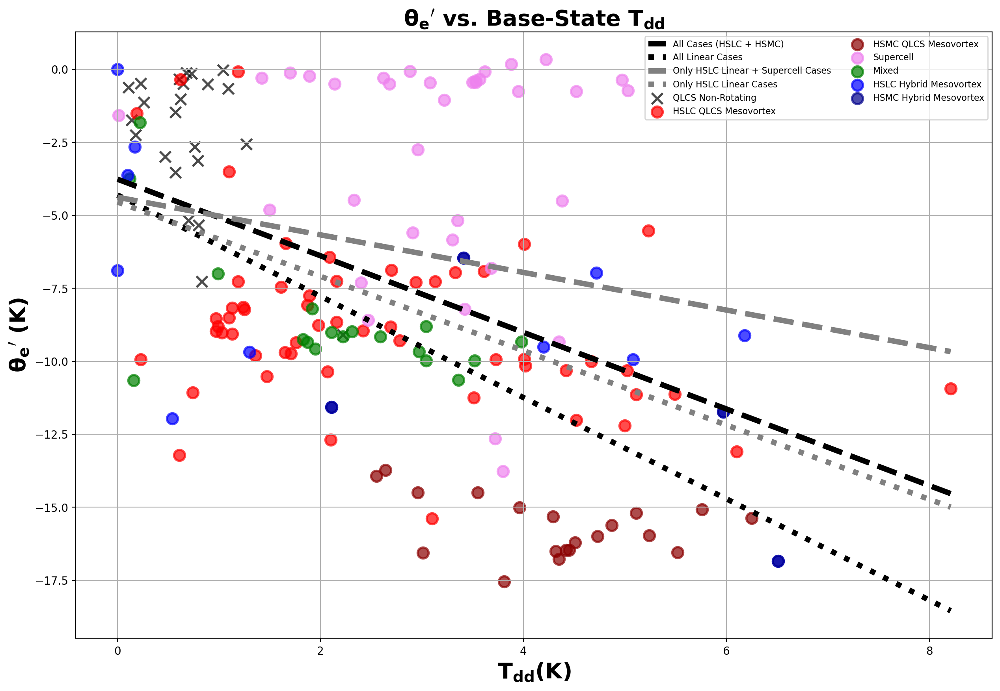

In [17]:
fig = plt.figure(figsize =(15, 10))

a1, b1 = np.polyfit(np.concatenate(LTDD),np.concatenate(LTE), 1)
a2, b2 = np.polyfit(np.concatenate(MVTDD[0:6]),np.concatenate(MVTE[0:6]), 1)
a22, b22 = np.polyfit(np.concatenate(MVTDD),np.concatenate(MVTE), 1)
a3, b3 = np.polyfit(np.concatenate(MCTDD), np.concatenate(MCTE), 1)
a4, b4 = np.polyfit(np.concatenate(MTDD), np.concatenate(MTE), 1)
a5, b5 = np.polyfit(np.concatenate(HTDD), np.concatenate(HTE), 1)
a55, b55 = np.polyfit(np.concatenate(HTDD[0:6]), np.concatenate(HTE[0:6]), 1)
a6, b6 = np.polyfit(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD),np.concatenate(MTDD),np.concatenate(HTDD)])
                    ,np.concatenate([np.concatenate(LTE),np.concatenate(MVTE),np.concatenate(MTE),np.concatenate(HTE)]),1)
a66, b66 = np.polyfit(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD[0:6]),np.concatenate(MTDD),np.concatenate(HTDD[0:6])])
                    ,np.concatenate([np.concatenate(LTE),np.concatenate(MVTE[0:6]),np.concatenate(MTE),np.concatenate(HTE[0:6])]),1)
a666, b666 = np.polyfit(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD),np.concatenate(MTDD),np.concatenate(HTDD),np.concatenate(MCTDD)])
                    ,np.concatenate([np.concatenate(LTE),np.concatenate(MVTE),np.concatenate(MTE),np.concatenate(HTE),np.concatenate(MCTV)]),1)
a6666, b6666 = np.polyfit(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD[0:6]),np.concatenate(MTDD),np.concatenate(HTDD[0:6]),np.concatenate(MCTDD)])
                    ,np.concatenate([np.concatenate(LTE),np.concatenate(MVTE[0:6]),np.concatenate(MTE),np.concatenate(HTE[0:6]),np.concatenate(MCTV)]),1)

# plt.plot(sort(np.concatenate(LTDD)), a1*sort(np.concatenate(LTDD))+b1, ls='--',color='k')
# plt.plot(sort(np.concatenate(MVTDD[0:6])), a2*sort(np.concatenate(MVTDD[0:6]))+b2, ls='--',color='red')
# plt.plot(sort(np.concatenate(MVTDD)), a22*sort(np.concatenate(MVTDD))+b22, ls='--',color='darkred')
# plt.plot(sort(np.concatenate(MCTDD)), a3*sort(np.concatenate(MCTDD))+b3, ls='--',color='violet')
# plt.plot(sort(np.concatenate(MTDD)), a4*sort(np.concatenate(MTDD))+b4, ls='--',color='green')
# plt.plot(sort(np.concatenate(HTDD)), a5*sort(np.concatenate(HTDD))+b5, ls='--',color='blue')
# plt.plot(sort(np.concatenate(HTDD[0:6])), a55*sort(np.concatenate(HTDD[0:6]))+b55, ls='--',color='darkblue')
plt.plot(sort(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD),np.concatenate(MTDD),np.concatenate(HTDD),np.concatenate(MCTDD)]))
         , a666*sort(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD),np.concatenate(MTDD),np.concatenate(HTDD),np.concatenate(MCTDD)]))+b666
         , ls='--',color='k',linewidth=5, label='All Cases (HSLC + HSMC)')
plt.plot(sort(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD),np.concatenate(MTDD),np.concatenate(HTDD)]))
         , a6*sort(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD),np.concatenate(MTDD),np.concatenate(HTDD)]))+b6
         , ls=':',color='k',linewidth=5, label='All Linear Cases')
plt.plot(sort(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD[0:6]),np.concatenate(MTDD),np.concatenate(HTDD[0:6]),np.concatenate(MCTDD)]))
         , a6666*sort(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD[0:6]),np.concatenate(MTDD),np.concatenate(HTDD[0:6]),np.concatenate(MCTDD)]))+b6666
         , ls='--',color='grey',linewidth=5, label='Only HSLC Linear + Supercell Cases')
plt.plot(sort(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD[0:6]),np.concatenate(MTDD),np.concatenate(HTDD[0:6])]))
         , a66*sort(np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD[0:6]),np.concatenate(MTDD),np.concatenate(HTDD[0:6])]))+b66
         , ls=':',color='grey',linewidth=5, label='Only HSLC Linear Cases')

plt.scatter(np.concatenate(LTDD),np.concatenate(LTE),marker='x',color='k',s=100,alpha=0.7,linewidth=2, label = 'QLCS Non-Rotating')
plt.scatter(np.concatenate(MVTDD[0:6]),np.concatenate(MVTE[0:6]), marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'HSLC QLCS Mesovortex')
plt.scatter(MVTDD[6],MVTE[6], marker='o',color='darkred',s=100,alpha=0.7,linewidth=2,label = 'HSMC QLCS Mesovortex')
plt.scatter(np.concatenate(MCTDD), np.concatenate(MCTE), marker='o',color='violet',s=100,alpha=0.7,linewidth=2,label = 'Supercell')
plt.scatter(np.concatenate(MTDD), np.concatenate(MTE), marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed')
plt.scatter(np.concatenate(HTDD), np.concatenate(HTE), marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'HSLC Hybrid Mesovortex')
plt.scatter(HTDD[6], HTE[6], marker='o',color='darkblue',s=100,alpha=0.7,linewidth=2,label = 'HSMC Hybrid Mesovortex')

plt.legend(ncol=2,prop={'size': 8},loc='upper right')
plt.xlabel(r'$\mathregular{T_{dd} (K)} $',fontweight='bold',fontsize=20)
plt.ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)',fontweight='bold',fontsize=20)
plt.title(r'$\mathbf{{\theta_e}^\prime}$'+ " vs. Base-State "+ r'$\mathregular{T_{dd}}$',fontweight='bold',fontsize=20)


plt.grid()

plt.savefig('E:\\NewFigsY1Y2\\Tdd_TE.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);

In [114]:
from scipy.stats import pearsonr,spearmanr
cor1, _ = pearsonr((np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD),np.concatenate(MTDD),np.concatenate(HTDD)])),
                    (np.concatenate([np.concatenate(LTE),np.concatenate(MVTE),np.concatenate(MTE),np.concatenate(HTE)])))
cor2, _ = pearsonr((np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD[0:6]),np.concatenate(MTDD),np.concatenate(HTDD[0:6])])),
                    (np.concatenate([np.concatenate(LTE),np.concatenate(MVTE[0:6]),np.concatenate(MTE),np.concatenate(HTE[0:6])])))
cor3, _ = pearsonr((np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD),np.concatenate(MTDD),np.concatenate(HTDD),np.concatenate(MCTDD)])),
                    (np.concatenate([np.concatenate(LTE),np.concatenate(MVTE),np.concatenate(MTE),np.concatenate(HTE),np.concatenate(MCTV)])))
cor4, _ = pearsonr((np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD[0:6]),np.concatenate(MTDD),np.concatenate(HTDD[0:6]),np.concatenate(MCTDD)])),
                    (np.concatenate([np.concatenate(LTE),np.concatenate(MVTE[0:6]),np.concatenate(MTE),np.concatenate(HTE[0:6]),np.concatenate(MCTV)])))
print(cor1)

-0.6764791386665707


In [102]:
from scipy.stats import pearsonr,spearmanr
cor1, _ = pearsonr((np.concatenate([np.concatenate(LTV),np.concatenate(MVTV),np.concatenate(MTV),np.concatenate(HTV)])),
                   (np.concatenate([np.concatenate(LTDD),np.concatenate(MVTDD),np.concatenate(MTDD),np.concatenate(HTDD)])))
print(cor1)

-0.8755159009680709


In [33]:
cor1, _ = pearsonr(np.concatenate(MCTV),np.concatenate(MCTDD))
print(cor1)

-0.17579583868257465


In [108]:
print('All Cases: TV_def = '+str(np.round(a666,3))+'Tdd + '+str(np.round(b666,3))+', r = -0.69')
print('All Linear Cases: TV_def = '+str(np.round(a6,3))+'Tdd + '+str(np.round(b6,3))+', r = -0.88')
print('Only HSLC Linear + Supercell Cases: TV_def = '+str(np.round(a6666,3))+'Tdd + '+str(np.round(b6666,3))+', r = -0.60')
print('Only HSLC Linear Cases: TV_def = '+str(np.round(a66,3))+'Tdd + '+str(np.round(b66,3))+', r = -0.85')

All Cases: TV_def = -0.95Tdd + -1.093, r = -0.69
All Linear Cases: TV_def = -1.129Tdd + -1.219, r = -0.88
Only HSLC Linear + Supercell Cases: TV_def = -0.75Tdd + -1.286, r = -0.60
Only HSLC Linear Cases: TV_def = -1.034Tdd + -1.256, r = -0.85


In [115]:
print('All Cases: TE_def = '+str(np.round(a666,3))+'Tdd + '+str(np.round(b666,3))+', r = -0.45')
print('All Linear Cases: TE_def = '+str(np.round(a6,3))+'Tdd + '+str(np.round(b6,3))+', r = -0.68')
print('Only HSLC Linear + Supercell Cases: TE_def = '+str(np.round(a6666,3))+'Tdd + '+str(np.round(b6666,3))+', r = -0.26')
print('Only HSLC Linear Cases: TE_def = '+str(np.round(a66,3))+'Tdd + '+str(np.round(b66,3))+', r = -0.56')

All Cases: TE_def = -1.312Tdd + -3.76, r = -0.45
All Linear Cases: TE_def = -1.735Tdd + -4.302, r = -0.68
Only HSLC Linear + Supercell Cases: TE_def = -0.644Tdd + -4.378, r = -0.26
Only HSLC Linear Cases: TE_def = -1.273Tdd + -4.542, r = -0.56


In [140]:
print('Linear: TV_def = '+str(np.round(a1,3))+'Tdd + '+str(np.round(b1,3))+", r = -0.86")
print('Mesovortex: TV_def = '+str(np.round(a2,3))+'Tdd + '+str(np.round(b2,3))+", r = -0.87")
print('Mesocyclone: TV_def = '+str(np.round(a3,3))+'Tdd + '+str(np.round(b3,3))+", r = 0.32")
print('Mixed: TV_def = '+str(np.round(a4,3))+'Tdd + '+str(np.round(b4,3))+", r = -0.86")
print('Hybrid: TV_def = '+str(np.round(a5,3))+'Tdd + '+str(np.round(b5,3))+", r = -0.88")
print('All Cases (excluding MC): TV_def = '+str(np.round(a6,3))+'Tdd + '+str(np.round(b6,3))+", r = -0.85")

Linear: TV_def = -1.83Tdd + 0.089, r = -0.86
Mesovortex: TV_def = -0.72Tdd + -2.496, r = -0.87
Mesocyclone: TV_def = -0.038Tdd + -0.604, r = 0.32
Mixed: TV_def = -1.06Tdd + -1.814, r = -0.86
Hybrid: TV_def = -0.804Tdd + -1.718, r = -0.88
All Cases (excluding MC): TV_def = -0.908Tdd + -1.78, r = -0.85


In [128]:
def adjacent_values(vals, q1, q3):
    upper_adjacent_value = q3 + (q3 - q1) * 1.5
    upper_adjacent_value = np.clip(upper_adjacent_value, q3, vals[-1])

    lower_adjacent_value = q1 - (q3 - q1) * 1.5
    lower_adjacent_value = np.clip(lower_adjacent_value, vals[0], q1)
    return lower_adjacent_value, upper_adjacent_value


def set_axis_style(ax, labels):
    ax.set_xticks(np.arange(1, len(labels) + 1), labels=labels)
    ax.set_xlim(0.25, len(labels) + 0.75)
    ax.set_xlabel('Sample name')

In [155]:
data

[array([-1.2 , -0.58, -0.59, -0.5 , -0.71, -0.48, -0.25, -0.35, -0.57,
        -0.28, -0.51, -0.39, -0.22, -0.63, -0.23, -0.23, -0.24, -0.23,
        -0.24, -0.35, -0.21, -0.31, -0.23]),
 array([-2.44, -1.03, -1.84, -3.24, -0.87, -1.29, -2.2 , -1.17, -1.58,
        -1.29, -1.09, -2.81, -1.12, -1.69, -1.44, -2.22, -2.25, -4.17,
        -1.79, -2.25, -1.17, -1.17, -1.65, -2.08, -1.97, -1.57, -1.95,
        -1.78, -2.46, -1.35, -1.02, -1.05, -1.23, -2.31, -1.6 , -1.78,
        -4.2 , -5.5 , -1.19, -3.39, -2.21, -4.08, -1.23, -2.4 , -1.55,
        -2.12, -3.89, -3.  , -2.38, -2.12, -1.36, -2.51, -0.35, -0.62,
        -0.22, -0.42, -3.23, -3.97, -1.31, -3.54, -1.61, -3.88, -3.32,
        -3.05, -4.63, -3.06, -2.06, -3.15, -2.89, -4.39, -3.49, -1.44,
        -5.4 , -5.49, -5.21, -5.21]),
 array([-2.13, -3.25, -0.36, -2.  , -0.57, -2.87, -0.58, -0.31, -0.64,
        -0.38, -0.43, -1.31, -0.68, -0.31, -0.24, -0.34, -1.1 , -1.69,
        -0.83, -3.9 , -0.33, -0.68, -0.23, -1.  , -0.82, -2.07, -

In [174]:
medians11

-0.35

In [222]:
np.sort(data[0])

array([-5.5 , -4.2 , -4.17, -4.08, -3.39, -3.  , -2.51, -2.4 , -2.38,
       -2.25, -2.22, -2.21, -2.2 , -2.12, -1.69, -1.65, -1.29, -1.23,
       -1.19, -1.17, -1.12, -1.03, -0.87])

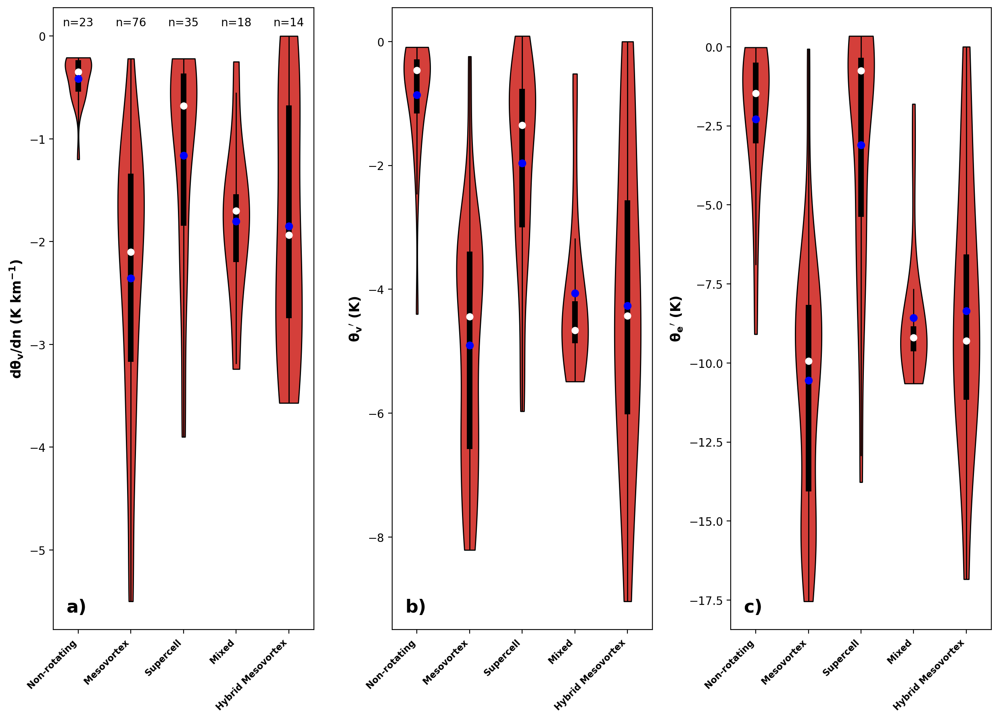

In [235]:
fig, axes = plt.subplots(1,3, figsize=(15,10))

data = [list(np.concatenate(LDTV)),list(np.concatenate(MVDTV)),list(np.concatenate(MCDTV)),list(np.concatenate(MDTV)),list(np.concatenate(HDTV))]
data1 = [list(np.concatenate(LTV)),list(np.concatenate(MVTV)),list(np.concatenate(MCTV)),list(np.concatenate(MTV)),list(np.concatenate(HTV))]
data2 = [list(np.concatenate(LTE)),list(np.concatenate(MVTE)),list(np.concatenate(MCTE)),list(np.concatenate(MTE)),list(np.concatenate(HTE))]

# data3= [np.concatenate(MVDTV_T),np.concatenate(MVDTV_NT),np.concatenate(MCDTV_T),np.concatenate(MCDTV_NT),
#        np.concatenate(MDTV_T),np.concatenate(MDTV_NT),np.concatenate(HDTV_T),np.concatenate(HDTV_NT)]
# data4= [np.concatenate(MVTV_T),np.concatenate(MVTV_NT),np.concatenate(MCTV_T),np.concatenate(MCTV_NT),
#        np.concatenate(MTV_T),np.concatenate(MTV_NT),np.concatenate(HTV_T),np.concatenate(HTV_NT)]
# data5= [np.concatenate(MVTE_T),np.concatenate(MVTE_NT),np.concatenate(MCTE_T),np.concatenate(MCTE_NT),
#        np.concatenate(MTE_T),np.concatenate(MTE_NT),np.concatenate(HTE_T),np.concatenate(HTE_NT)]



# Creating plot
parts1 = axes[0].violinplot(data,showmeans=False, showextrema=False, showmedians=False)
parts2 = axes[1].violinplot(data1,showmeans=False, showextrema=False, showmedians=False)
parts3 = axes[2].violinplot(data2,showmeans=False, showextrema=False, showmedians=False)

for pc in parts1['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile111 = []
medians111 = []
quartile311 = []
whiskers_min1 = []
whiskers_max1 = []
for i in np.arange(0,5,1):
    quartile11, medians11, quartile31 = np.percentile(data[i], [25, 50, 75], axis=0)
    whiskers = np.array([adjacent_values(np.sort(data[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile111.append(quartile11)
    medians111.append(medians11)
    quartile311.append(quartile31)
    whiskers_min1.append(whiskers_min)
    whiskers_max1.append(whiskers_max)
    
inds = np.arange(1, len(medians111) + 1)
axes[0].scatter(inds, medians111, marker='o', color='white', s=30, zorder=3)
axes[0].vlines(inds, quartile111, quartile311, color='k', linestyle='-', lw=5)
axes[0].vlines(inds, whiskers_min1, whiskers_max1, color='k', linestyle='-', lw=1)

mean1=[]
for i in np.arange(0,5,1):
    test = np.mean(data[i])
    mean1.append(test)
axes[0].scatter([1,2,3,4,5],mean1,marker='o',color='b',zorder=3)

for pc in parts2['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile112 = []
medians112 = []
quartile312 = []
whiskers_min2 = []
whiskers_max2 = []
for i in np.arange(0,5,1):
    quartile11, medians11, quartile31 = np.percentile(data1[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data1[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile112.append(quartile11)
    medians112.append(medians11)
    quartile312.append(quartile31)
    whiskers_min2.append(whiskers_min)
    whiskers_max2.append(whiskers_max)
    
inds = np.arange(1, len(medians112) + 1)
axes[1].scatter(inds, medians112, marker='o', color='white', s=30, zorder=3)
axes[1].vlines(inds, quartile112, quartile312, color='k', linestyle='-', lw=5)
axes[1].vlines(inds, whiskers_min2, whiskers_max2, color='k', linestyle='-', lw=1)

mean2=[]
for i in np.arange(0,5,1):
    test = np.mean(data1[i])
    mean2.append(test)
axes[1].scatter([1,2,3,4,5],mean2,marker='o',color='b',zorder=3)

for pc in parts3['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile113 = []
medians113 = []
quartile313 = []
whiskers_min3 = []
whiskers_max3 = []
for i in np.arange(0,5,1):
    quartile11, medians11, quartile31 = np.percentile(data2[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data2[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile113.append(quartile11)
    medians113.append(medians11)
    quartile313.append(quartile31)
    whiskers_min3.append(whiskers_min)
    whiskers_max3.append(whiskers_max)
    
inds = np.arange(1, len(medians113) + 1)
axes[2].scatter(inds, medians113, marker='o', color='white', s=30, zorder=3)
axes[2].vlines(inds, quartile113, quartile313, color='k', linestyle='-', lw=5)
axes[2].vlines(inds, whiskers_min3, whiskers_max3, color='k', linestyle='-', lw=1)

mean3=[]
for i in np.arange(0,5,1):
    test = np.mean(data2[i])
    mean3.append(test)
axes[2].scatter([1,2,3,4,5],mean3,marker='o',color='b',zorder=3)

axes[0].set_xticks([1,2,3,4,5])
axes[1].set_xticks([1,2,3,4,5])
axes[2].set_xticks([1,2,3,4,5])
axes[0].set_xticklabels(["Non-rotating","Mesovortex","Supercell","Mixed","Hybrid Mesovortex"],fontweight='bold',fontsize=8,rotation = 45,ha='right')
axes[1].set_xticklabels(["Non-rotating","Mesovortex","Supercell","Mixed","Hybrid Mesovortex"],fontweight='bold',fontsize=8,rotation = 45,ha='right')
axes[2].set_xticklabels(["Non-rotating","Mesovortex","Supercell","Mixed","Hybrid Mesovortex"],fontweight='bold',fontsize=8,rotation = 45,ha='right')
# axes[0].set_xticklabels(["MV-T",'MV-NT','MC-T','MC-NT',"Mixed-T","Mixed-NT","Hybrid-T","Hybrid-NT"],fontweight='bold',fontsize=12,rotation = 45,ha='right')
# axes[1].set_xticklabels(["MV-T",'MV-NT','MC-T','MC-NT',"Mixed-T","Mixed-NT","Hybrid-T","Hybrid-NT"],fontweight='bold',fontsize=12,rotation = 45,ha='right')
# axes[2].set_xticklabels(["MV-T",'MV-NT','MC-T','MC-NT',"Mixed-T","Mixed-NT","Hybrid-T","Hybrid-NT"],fontweight='bold',fontsize=12,rotation = 45,ha='right')
axes[0].set_ylabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)',fontweight='bold',fontsize=12)
axes[2].set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)',fontweight='bold',fontsize=12)
axes[1].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)',fontweight='bold',fontsize=12)

axes[0].text(1,0.1,'n='+str(len(data[0])),ha='center')
axes[0].text(2,0.1,'n='+str(len(data[1])),ha='center')
axes[0].text(3,0.1,'n='+str(len(data[2])),ha='center')
axes[0].text(4,0.1,'n='+str(len(data[3])),ha='center')
axes[0].text(5,0.1,'n='+str(len(data[4])),ha='center')

axes[0].text(0.05, 0.05, 'a)', transform=axes[0].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[1].text(0.05, 0.05, 'b)', transform=axes[1].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[2].text(0.05, 0.05, 'c)', transform=axes[2].transAxes,
      fontsize=16, fontweight='bold', va='top')

plt.subplots_adjust(wspace=0.3,hspace=0.05)

# show plot
# save_dir = 'C:\\Users\\joshu\\Desktop\\Test_Plots\\'
plt.savefig('E://RvsNR.png', bbox_inches = 'tight', format='png', dpi=300);
plt.show()

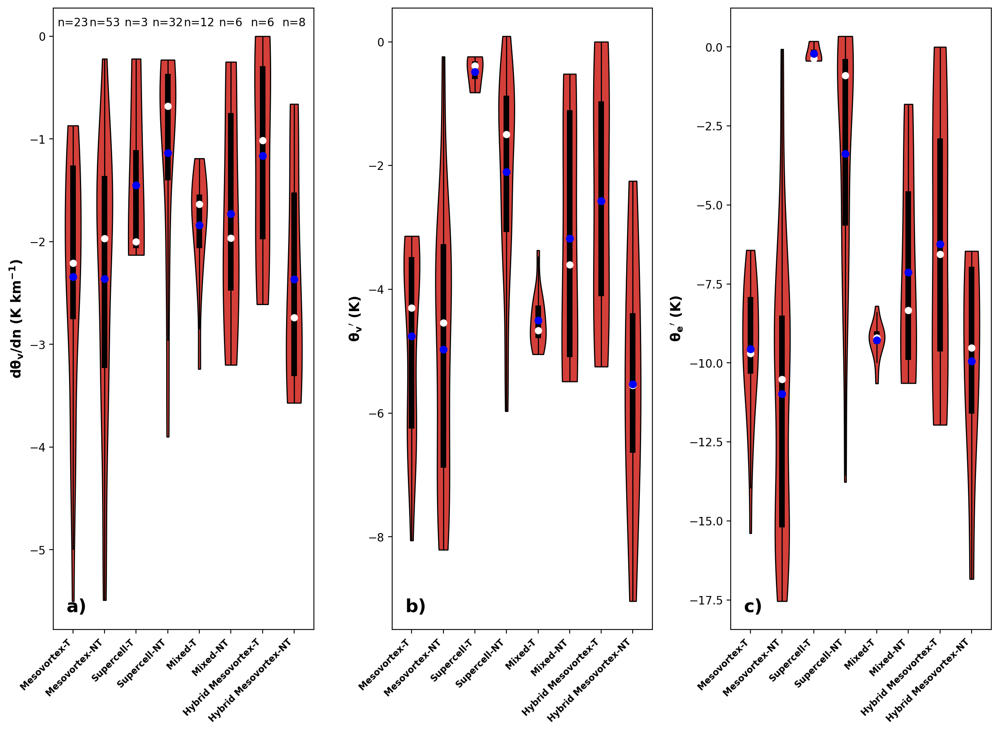

In [234]:
fig, axes = plt.subplots(1,3, figsize=(15,10))

data= [list(np.concatenate(MVDTV_T)),list(np.concatenate(MVDTV_NT)),list(np.concatenate(MCDTV_T)),list(np.concatenate(MCDTV_NT)),
       list(np.concatenate(MDTV_T)),list(np.concatenate(MDTV_NT)),list(np.concatenate(HDTV_T)),list(np.concatenate(HDTV_NT))]
data1= [list(np.concatenate(MVTV_T)),list(np.concatenate(MVTV_NT)),list(np.concatenate(MCTV_T)),list(np.concatenate(MCTV_NT)),
       list(np.concatenate(MTV_T)),list(np.concatenate(MTV_NT)),list(np.concatenate(HTV_T)),list(np.concatenate(HTV_NT))]
data2= [list(np.concatenate(MVTE_T)),list(np.concatenate(MVTE_NT)),list(np.concatenate(MCTE_T)),list(np.concatenate(MCTE_NT)),
       list(np.concatenate(MTE_T)),list(np.concatenate(MTE_NT)),list(np.concatenate(HTE_T)),list(np.concatenate(HTE_NT))]



# Creating plot
parts1 = axes[0].violinplot(data,showmeans=False, showextrema=False, showmedians=False)
parts2 = axes[1].violinplot(data1,showmeans=False, showextrema=False, showmedians=False)
parts3 = axes[2].violinplot(data2,showmeans=False, showextrema=False, showmedians=False)

for pc in parts1['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile111 = []
medians111 = []
quartile311 = []
whiskers_min1 = []
whiskers_max1 = []
for i in np.arange(0,8,1):
    quartile11, medians11, quartile31 = np.percentile(data[i], [25, 50, 75], axis=0)
    whiskers = np.array([adjacent_values(np.sort(data[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile111.append(quartile11)
    medians111.append(medians11)
    quartile311.append(quartile31)
    whiskers_min1.append(whiskers_min)
    whiskers_max1.append(whiskers_max)
    
inds = np.arange(1, len(medians111) + 1)
axes[0].scatter(inds, medians111, marker='o', color='white', s=30, zorder=3)
axes[0].vlines(inds, quartile111, quartile311, color='k', linestyle='-', lw=5)
axes[0].vlines(inds, whiskers_min1, whiskers_max1, color='k', linestyle='-', lw=1)

mean1=[]
for i in np.arange(0,8,1):
    test = np.mean(data[i])
    mean1.append(test)
axes[0].scatter([1,2,3,4,5,6,7,8],mean1,marker='o',color='b',zorder=3)

for pc in parts2['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile112 = []
medians112 = []
quartile312 = []
whiskers_min2 = []
whiskers_max2 = []
for i in np.arange(0,8,1):
    quartile11, medians11, quartile31 = np.percentile(data1[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data1[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile112.append(quartile11)
    medians112.append(medians11)
    quartile312.append(quartile31)
    whiskers_min2.append(whiskers_min)
    whiskers_max2.append(whiskers_max)
    
inds = np.arange(1, len(medians112) + 1)
axes[1].scatter(inds, medians112, marker='o', color='white', s=30, zorder=3)
axes[1].vlines(inds, quartile112, quartile312, color='k', linestyle='-', lw=5)
axes[1].vlines(inds, whiskers_min2, whiskers_max2, color='k', linestyle='-', lw=1)

mean2=[]
for i in np.arange(0,8,1):
    test = np.mean(data1[i])
    mean2.append(test)
axes[1].scatter([1,2,3,4,5,6,7,8],mean2,marker='o',color='b',zorder=3)

for pc in parts3['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile113 = []
medians113 = []
quartile313 = []
whiskers_min3 = []
whiskers_max3 = []
for i in np.arange(0,8,1):
    quartile11, medians11, quartile31 = np.percentile(data2[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data2[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile113.append(quartile11)
    medians113.append(medians11)
    quartile313.append(quartile31)
    whiskers_min3.append(whiskers_min)
    whiskers_max3.append(whiskers_max)
    
inds = np.arange(1, len(medians113) + 1)
axes[2].scatter(inds, medians113, marker='o', color='white', s=30, zorder=3)
axes[2].vlines(inds, quartile113, quartile313, color='k', linestyle='-', lw=5)
axes[2].vlines(inds, whiskers_min3, whiskers_max3, color='k', linestyle='-', lw=1)

mean3=[]
for i in np.arange(0,8,1):
    test = np.mean(data2[i])
    mean3.append(test)
axes[2].scatter([1,2,3,4,5,6,7,8],mean3,marker='o',color='b',zorder=3)

axes[0].set_xticks([1,2,3,4,5,6,7,8])
axes[1].set_xticks([1,2,3,4,5,6,7,8])
axes[2].set_xticks([1,2,3,4,5,6,7,8])
axes[0].set_xticklabels(["Mesovortex-T",'Mesovortex-NT','Supercell-T','Supercell-NT',"Mixed-T","Mixed-NT","Hybrid Mesovortex-T","Hybrid Mesovortex-NT"],fontweight='bold',fontsize=8,rotation = 45,ha='right')
axes[1].set_xticklabels(["Mesovortex-T",'Mesovortex-NT','Supercell-T','Supercell-NT',"Mixed-T","Mixed-NT","Hybrid Mesovortex-T","Hybrid Mesovortex-NT"],fontweight='bold',fontsize=8,rotation = 45,ha='right')
axes[2].set_xticklabels(["Mesovortex-T",'Mesovortex-NT','Supercell-T','Supercell-NT',"Mixed-T","Mixed-NT","Hybrid Mesovortex-T","Hybrid Mesovortex-NT"],fontweight='bold',fontsize=8,rotation = 45,ha='right')
axes[0].set_ylabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)',fontweight='bold',fontsize=12)
axes[2].set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)',fontweight='bold',fontsize=12)
axes[1].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)',fontweight='bold',fontsize=12)

axes[0].text(1,0.1,'n='+str(len(data[0])),ha='center')
axes[0].text(2,0.1,'n='+str(len(data[1])),ha='center')
axes[0].text(3,0.1,'n='+str(len(data[2])),ha='center')
axes[0].text(4,0.1,'n='+str(len(data[3])),ha='center')
axes[0].text(5,0.1,'n='+str(len(data[4])),ha='center')
axes[0].text(6,0.1,'n='+str(len(data[5])),ha='center')
axes[0].text(7,0.1,'n='+str(len(data[6])),ha='center')
axes[0].text(8,0.1,'n='+str(len(data[7])),ha='center')


axes[0].text(0.05, 0.05, 'a)', transform=axes[0].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[1].text(0.05, 0.05, 'b)', transform=axes[1].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[2].text(0.05, 0.05, 'c)', transform=axes[2].transAxes,
      fontsize=16, fontweight='bold', va='top')

plt.subplots_adjust(wspace=0.3,hspace=0.05)

# show plot
# save_dir = 'C:\\Users\\joshu\\Desktop\\Test_Plots\\'
plt.savefig('E://TvsNT.png', bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [178]:
whiskers_max1

[array([-0.23]),
 array([-5.21]),
 array([-0.33]),
 array([-0.55]),
 array([-3.57])]

In [ ]:
from scipy.stats import stats
stats.ttest_ind(a=np.concatenate(HTE_T),b=np.concatenate(HTE_NT),alternative='greater')

In [9]:
def get_dir_tor11(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns1[(sns1['mode']==mode) & (sns1['type']==typ) & (sns1['tor']==tor) & (sns1['tor']!='NT') & (sns1['Directionality']==direction)][var]

def get_dir_tor22(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns2[(sns2['mode']==mode) & (sns2['type']==typ) & (sns2['tor']==tor) & (sns2['tor']!='NT') & (sns2['Directionality']==direction)][var]

def get_dir_tor33(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns3[(sns3['mode']==mode) & (sns3['type']==typ) & (sns3['tor']==tor) & (sns3['tor']!='NT') & (sns3['Directionality']==direction)][var]

def get_dir_tor44(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns4[(sns4['mode']==mode) & (sns4['type']==typ) & (sns4['tor']==tor) & (sns4['tor']!='NT') & (sns4['Directionality']==direction)][var]

dir_tor_functions1 = [get_dir_tor11,get_dir_tor22,get_dir_tor33,get_dir_tor44]

MVTE_T_N1 = []
MVTE_T_S1 = []
MVTV_T_N1 = []
MVTV_T_S1 = []
MVDTV_T_N1 = []
MVDTV_T_S1 = []

for get_dir_tor in dir_tor_functions1:

    MV_TE_T_N = get_dir_tor('TE', 'Mesovortex', 'R', 'TOT', 'N')
    MV_TE_T_S = get_dir_tor('TE', 'Mesovortex', 'R', 'TOT', 'S')
    MV_TV_T_N = get_dir_tor('TV', 'Mesovortex', 'R', 'TOT', 'N')
    MV_TV_T_S = get_dir_tor('TV', 'Mesovortex', 'R', 'TOT', 'S')
    MV_dTVdn_T_N = get_dir_tor('dTVdn', 'Mesovortex', 'R', 'TOT', 'N')
    MV_dTVdn_T_S = get_dir_tor('dTVdn', 'Mesovortex', 'R', 'TOT', 'S')
    MVTE_T_N1.append(MV_TE_T_N)
    MVTE_T_S1.append(MV_TE_T_S)
    MVTV_T_N1.append(MV_TV_T_N)
    MVTV_T_S1.append(MV_TV_T_S)
    MVDTV_T_N1.append(MV_dTVdn_T_N)
    MVDTV_T_S1.append(MV_dTVdn_T_S)
    
def get_dir_tor111(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns1[(sns1['mode']==mode) & (sns1['type']==typ) & (sns1['tor']!=tor) & (sns1['tor']!='NT') & (sns1['Directionality']==direction)][var]

def get_dir_tor222(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns2[(sns2['mode']==mode) & (sns2['type']==typ) & (sns2['tor']!=tor) & (sns2['tor']!='NT') & (sns2['Directionality']==direction)][var]

def get_dir_tor333(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns3[(sns3['mode']==mode) & (sns3['type']==typ) & (sns3['tor']!=tor) & (sns3['tor']!='NT') & (sns3['Directionality']==direction)][var]

def get_dir_tor444(var, mode, typ, tor, direction):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    return sns4[(sns4['mode']==mode) & (sns4['type']==typ) & (sns4['tor']!=tor) & (sns4['tor']!='NT') & (sns4['Directionality']==direction)][var]

dir_tor_functions11 = [get_dir_tor111,get_dir_tor222,get_dir_tor333,get_dir_tor444]

MVTE_T_N11 = []
MVTE_T_S11 = []
MVTV_T_N11 = []
MVTV_T_S11 = []
MVDTV_T_N11 = []
MVDTV_T_S11 = []

for get_dir_tor in dir_tor_functions11:

    MV_TE_T_N = get_dir_tor('TE', 'Mesovortex', 'R', 'TOT', 'N')
    MV_TE_T_S = get_dir_tor('TE', 'Mesovortex', 'R', 'TOT', 'S')
    MV_TV_T_N = get_dir_tor('TV', 'Mesovortex', 'R', 'TOT', 'N')
    MV_TV_T_S = get_dir_tor('TV', 'Mesovortex', 'R', 'TOT', 'S')
    MV_dTVdn_T_N = get_dir_tor('dTVdn', 'Mesovortex', 'R', 'TOT', 'N')
    MV_dTVdn_T_S = get_dir_tor('dTVdn', 'Mesovortex', 'R', 'TOT', 'S')
    MVTE_T_N11.append(MV_TE_T_N)
    MVTE_T_S11.append(MV_TE_T_S)
    MVTV_T_N11.append(MV_TV_T_N)
    MVTV_T_S11.append(MV_TV_T_S)
    MVDTV_T_N11.append(MV_dTVdn_T_N)
    MVDTV_T_S11.append(MV_dTVdn_T_S)

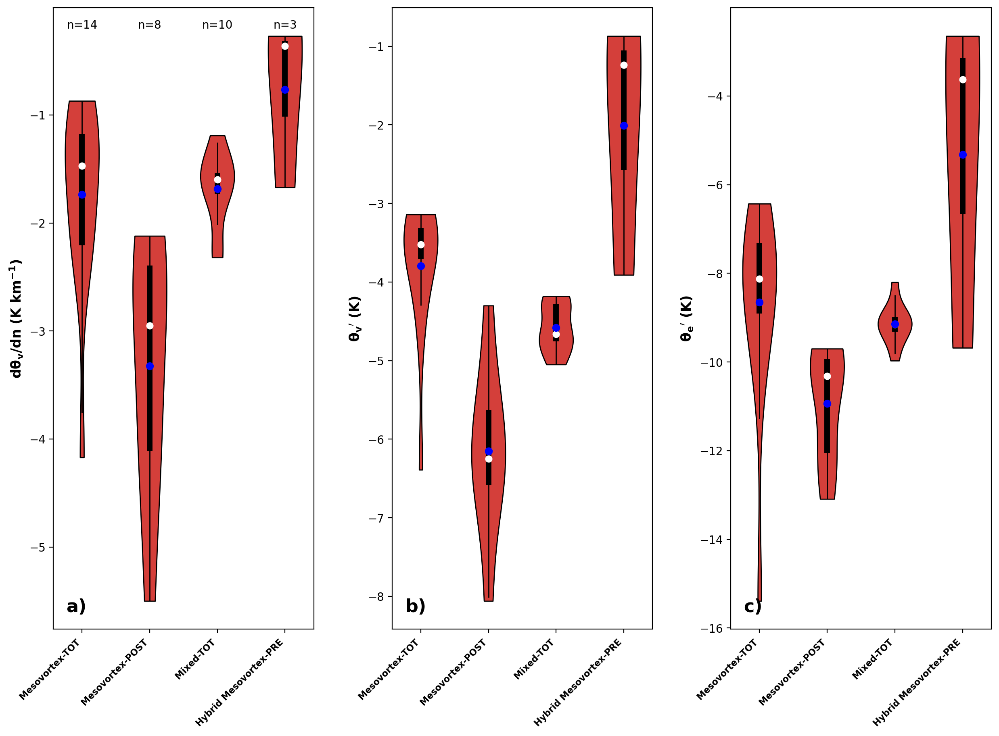

In [233]:
fig, axes = plt.subplots(1,3, figsize=(15,10))

data= [list(np.concatenate(MVDTV_TOT)),list(np.concatenate(MVDTV_POST)),list(np.concatenate(MDTV_TOT)),list(np.concatenate(HDTV_PRE))]
data1= [list(np.concatenate(MVTV_TOT)),list(np.concatenate(MVTV_POST)),list(np.concatenate(MTV_TOT)),list(np.concatenate(HTV_PRE))]
data2= [list(np.concatenate(MVTE_TOT)),list(np.concatenate(MVTE_POST)),list(np.concatenate(MTE_TOT)),list(np.concatenate(HTE_PRE))]

# Creating plot
parts1 = axes[0].violinplot(data,showmeans=False, showextrema=False, showmedians=False)
parts2 = axes[1].violinplot(data1,showmeans=False, showextrema=False, showmedians=False)
parts3 = axes[2].violinplot(data2,showmeans=False, showextrema=False, showmedians=False)

for pc in parts1['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile111 = []
medians111 = []
quartile311 = []
whiskers_min1 = []
whiskers_max1 = []
for i in np.arange(0,4,1):
    quartile11, medians11, quartile31 = np.percentile(data[i], [25, 50, 75], axis=0)
    whiskers = np.array([adjacent_values(np.sort(data[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile111.append(quartile11)
    medians111.append(medians11)
    quartile311.append(quartile31)
    whiskers_min1.append(whiskers_min)
    whiskers_max1.append(whiskers_max)
    
inds = np.arange(1, len(medians111) + 1)
axes[0].scatter(inds, medians111, marker='o', color='white', s=30, zorder=3)
axes[0].vlines(inds, quartile111, quartile311, color='k', linestyle='-', lw=5)
axes[0].vlines(inds, whiskers_min1, whiskers_max1, color='k', linestyle='-', lw=1)

mean1=[]
for i in np.arange(0,4,1):
    test = np.mean(data[i])
    mean1.append(test)
axes[0].scatter([1,2,3,4],mean1,marker='o',color='b',zorder=3)

for pc in parts2['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile112 = []
medians112 = []
quartile312 = []
whiskers_min2 = []
whiskers_max2 = []
for i in np.arange(0,4,1):
    quartile11, medians11, quartile31 = np.percentile(data1[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data1[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile112.append(quartile11)
    medians112.append(medians11)
    quartile312.append(quartile31)
    whiskers_min2.append(whiskers_min)
    whiskers_max2.append(whiskers_max)
    
inds = np.arange(1, len(medians112) + 1)
axes[1].scatter(inds, medians112, marker='o', color='white', s=30, zorder=3)
axes[1].vlines(inds, quartile112, quartile312, color='k', linestyle='-', lw=5)
axes[1].vlines(inds, whiskers_min2, whiskers_max2, color='k', linestyle='-', lw=1)

mean2=[]
for i in np.arange(0,4,1):
    test = np.mean(data1[i])
    mean2.append(test)
axes[1].scatter([1,2,3,4],mean2,marker='o',color='b',zorder=3)

for pc in parts3['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile113 = []
medians113 = []
quartile313 = []
whiskers_min3 = []
whiskers_max3 = []
for i in np.arange(0,4,1):
    quartile11, medians11, quartile31 = np.percentile(data2[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data2[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile113.append(quartile11)
    medians113.append(medians11)
    quartile313.append(quartile31)
    whiskers_min3.append(whiskers_min)
    whiskers_max3.append(whiskers_max)
    
inds = np.arange(1, len(medians113) + 1)
axes[2].scatter(inds, medians113, marker='o', color='white', s=30, zorder=3)
axes[2].vlines(inds, quartile113, quartile313, color='k', linestyle='-', lw=5)
axes[2].vlines(inds, whiskers_min3, whiskers_max3, color='k', linestyle='-', lw=1)

mean3=[]
for i in np.arange(0,4,1):
    test = np.mean(data2[i])
    mean3.append(test)
axes[2].scatter([1,2,3,4],mean3,marker='o',color='b',zorder=3)

axes[0].set_xticks([1,2,3,4])
axes[1].set_xticks([1,2,3,4])
axes[2].set_xticks([1,2,3,4])

axes[0].set_ylabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)',fontweight='bold',fontsize=12)
axes[2].set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)',fontweight='bold',fontsize=12)
axes[1].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)',fontweight='bold',fontsize=12)
axes[0].set_xticklabels(["Mesovortex-TOT","Mesovortex-POST","Mixed-TOT","Hybrid Mesovortex-PRE"],fontweight='bold',fontsize=8,rotation=45,ha='right')
axes[1].set_xticklabels(["Mesovortex-TOT","Mesovortex-POST","Mixed-TOT","Hybrid Mesovortex-PRE"],fontweight='bold',fontsize=8,rotation=45,ha='right')
axes[2].set_xticklabels(["Mesovortex-TOT","Mesovortex-POST","Mixed-TOT","Hybrid Mesovortex-PRE"],fontweight='bold',fontsize=8,rotation=45,ha='right')
axes[0].text(1,-0.2,'n='+str(len(data[0])),ha='center')
axes[0].text(2,-0.2,'n='+str(len(data[1])),ha='center')
axes[0].text(3,-0.2,'n='+str(len(data[2])),ha='center')
axes[0].text(4,-0.2,'n='+str(len(data[3])),ha='center')


axes[0].text(0.05, 0.05, 'a)', transform=axes[0].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[1].text(0.05, 0.05, 'b)', transform=axes[1].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[2].text(0.05, 0.05, 'c)', transform=axes[2].transAxes,
      fontsize=16, fontweight='bold', va='top')

plt.subplots_adjust(wspace=0.3,hspace=0.05)

# show plot
# save_dir = 'C:\\Users\\joshu\\Desktop\\Test_Plots\\'
plt.savefig('E://TOTvsPOST.png', bbox_inches = 'tight', format='png', dpi=300);
plt.show()

# data = [np.concatenate(MVDTV_N),np.concatenate(MVDTV_S),np.concatenate(MCDTV_N),np.concatenate(MCDTV_S),
#        np.concatenate(MDTV_N),np.concatenate(HDTV_N),np.concatenate(HDTV_S)]

# data1 = [np.concatenate(MVTV_N),np.concatenate(MVTV_S),np.concatenate(MCTV_N),np.concatenate(MCTV_S),
#        np.concatenate(MTV_N),np.concatenate(HTV_N),np.concatenate(HTV_S)]

# data2 = [np.concatenate(MVTE_N),np.concatenate(MVTE_S),np.concatenate(MCTE_N),np.concatenate(MCTE_S),
#        np.concatenate(MTE_N),np.concatenate(HTE_N),np.concatenate(HTE_S)]

# axes[0].set_xticklabels(["MV-N","MV-S",'MC-N','MC-S',"Mixed-N","Hybrid-N","Hybrid-S"],fontweight='bold',fontsize=12,rotation=45,ha='right')
# axes[1].set_xticklabels(["MV-N","MV-S",'MC-N','MC-S',"Mixed-N","Hybrid-N","Hybrid-S"],fontweight='bold',fontsize=12,rotation=45,ha='right')
# axes[2].set_xticklabels(["MV-N","MV-S",'MC-N','MC-S',"Mixed-N","Hybrid-N","Hybrid-S"],fontweight='bold',fontsize=12,rotation=45,ha='right')


In [242]:
stats.ttest_ind(a=np.concatenate(HTE_S),b=np.concatenate(HTE_N),alternative='less')

Ttest_indResult(statistic=-0.6705098940284965, pvalue=0.26070759994035714)

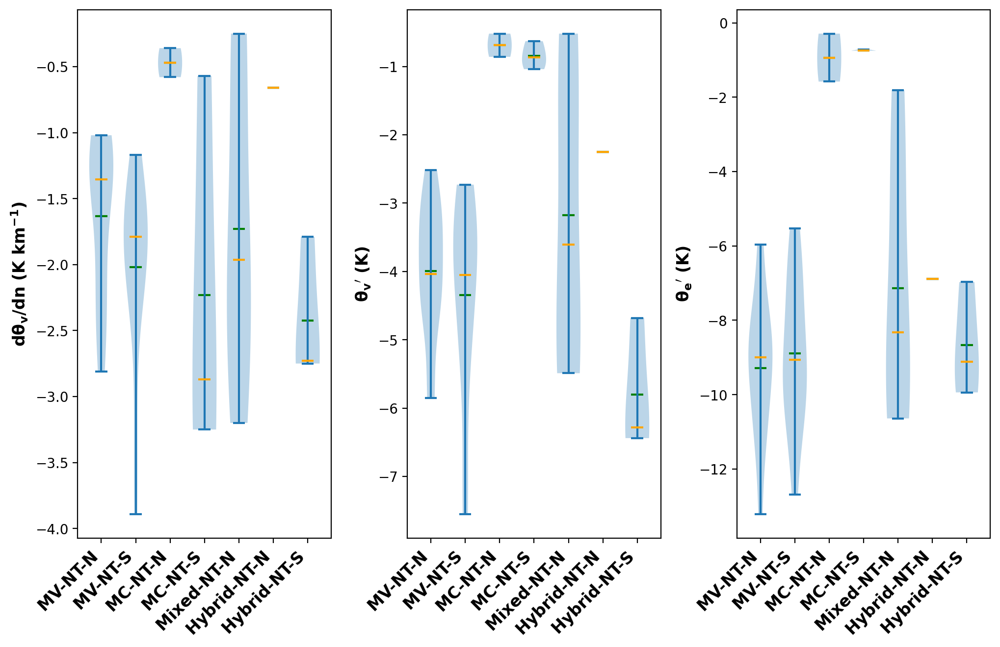

In [22]:
fig, axes = plt.subplots(1,3, figsize=(12,7))

# data= [np.concatenate(MVDTV_T_N),np.concatenate(MVDTV_T_S),np.concatenate(MCDTV_T_S),np.concatenate(MDTV_T_N),np.concatenate(HDTV_T_N),np.concatenate(HDTV_T_S)]
# data1= [np.concatenate(MVTV_T_N),np.concatenate(MVTV_T_S),np.concatenate(MCTV_T_S),np.concatenate(MTV_T_N),np.concatenate(HTV_T_N),np.concatenate(HTV_T_S)]
# data2= [np.concatenate(MVTE_T_N),np.concatenate(MVTE_T_S),np.concatenate(MCTE_T_S),np.concatenate(MTE_T_N),np.concatenate(HTE_T_N),np.concatenate(HTE_T_S)]
data3= [np.concatenate(MVDTV_T_N1),np.concatenate(MVDTV_T_S1),np.concatenate(MCDTV_T_N1),np.concatenate(MCDTV_T_S1),np.concatenate(MDTV_T_N1),np.concatenate(HDTV_T_N1),np.concatenate(HDTV_T_S1)]
data4= [np.concatenate(MVTV_T_N1),np.concatenate(MVTV_T_S1),np.concatenate(MCTV_T_N1),np.concatenate(MCTV_T_S1),np.concatenate(MTV_T_N1),np.concatenate(HTV_T_N1),np.concatenate(HTV_T_S1)]
data5= [np.concatenate(MVTE_T_N1),np.concatenate(MVTE_T_S1),np.concatenate(MCTE_T_N1),np.concatenate(MCTE_T_S1),np.concatenate(MTE_T_N1),np.concatenate(HTE_T_N1),np.concatenate(HTE_T_S1)]


# Creating plot
vi1 = axes[0].violinplot(data3,[1,2,3,4,5,6,7],showmeans=True, showextrema=True, showmedians=True, widths = 0.7)
vi2 = axes[1].violinplot(data4,[1,2,3,4,5,6,7],showmeans=True, showextrema=True, showmedians=True, widths = 0.7)
vi3 = axes[2].violinplot(data5,[1,2,3,4,5,6,7],showmeans=True, showextrema=True, showmedians=True, widths = 0.7)
vi1['cmeans'].set_color('g')
vi1['cmedians'].set_color('orange')
vi2['cmeans'].set_color('g')
vi2['cmedians'].set_color('orange')
vi3['cmeans'].set_color('g')
vi3['cmedians'].set_color('orange')
axes[0].set_xticks([1,2,3,4,5,6,7])
axes[1].set_xticks([1,2,3,4,5,6,7])
axes[2].set_xticks([1,2,3,4,5,6,7])
axes[0].set_xticklabels(["MV-NT-N","MV-NT-S","MC-NT-N","MC-NT-S","Mixed-NT-N","Hybrid-NT-N","Hybrid-NT-S"],fontweight='bold',fontsize=12,rotation=45,ha='right')
axes[1].set_xticklabels(["MV-NT-N","MV-NT-S","MC-NT-N","MC-NT-S","Mixed-NT-N","Hybrid-NT-N","Hybrid-NT-S"],fontweight='bold',fontsize=12,rotation=45,ha='right')
axes[2].set_xticklabels(["MV-NT-N","MV-NT-S","MC-NT-N","MC-NT-S","Mixed-NT-N","Hybrid-NT-N","Hybrid-NT-S"],fontweight='bold',fontsize=12,rotation=45,ha='right')
# axes[0].set_xticklabels(["MV-T-N","MV-T-S",'MC-T-S',"Mixed-T-N","Hybrid-T-N",'Hybrid-T-S'],fontweight='bold',fontsize=12,rotation=45,ha='right')
# axes[1].set_xticklabels(["MV-T-N","MV-T-S",'MC-T-S',"Mixed-T-N","Hybrid-T-N",'Hybrid-T-S'],fontweight='bold',fontsize=12,rotation=45,ha='right')
# axes[2].set_xticklabels(["MV-T-N","MV-T-S",'MC-T-S',"Mixed-T-N","Hybrid-T-N",'Hybrid-T-S'],fontweight='bold',fontsize=12,rotation=45,ha='right')
# axes[0,0].set_title("North vs South of Tornadic Cases",fontweight='bold',fontsize=18)
# axes[0,1].set_title("North vs South of Not Tornadic Cases",fontweight='bold',fontsize=18)
axes[0].set_ylabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)',fontweight='bold',fontsize=12)
axes[2].set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)',fontweight='bold',fontsize=12)
axes[1].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)',fontweight='bold',fontsize=12)

plt.subplots_adjust(wspace=0.3,hspace=0.05)

# show plot
save_dir = 'C:\\Users\\joshu\\Desktop\\Test_Plots\\'
plt.savefig('C:\\Users\\joshu\\Desktop\\NSNT_box.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

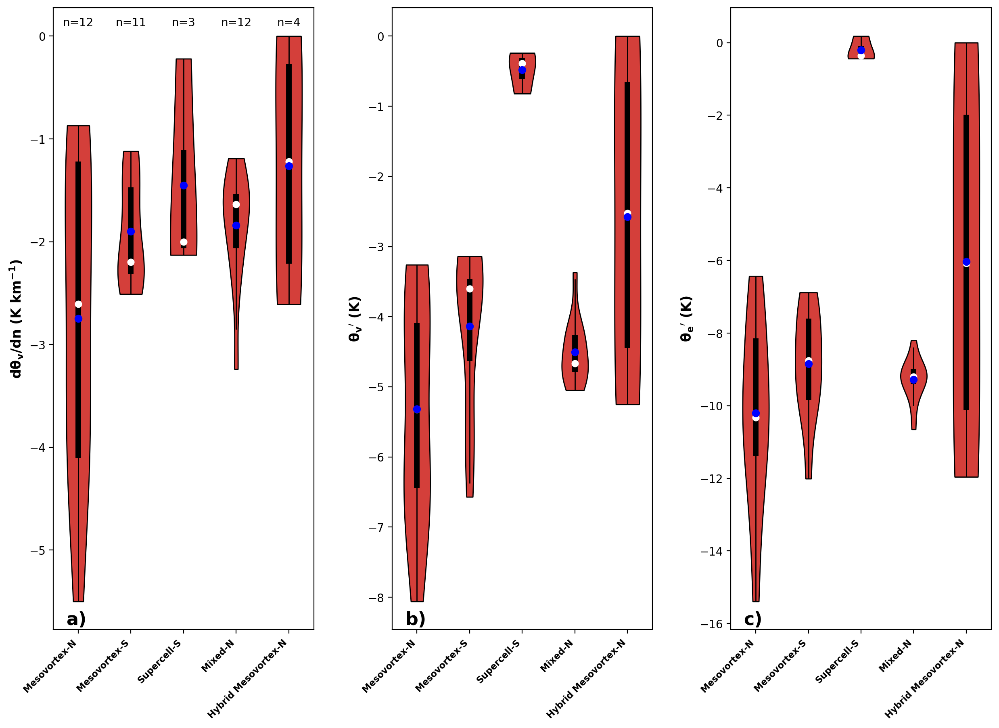

In [240]:
fig, axes = plt.subplots(1,3, figsize=(15,10))

data= [list(np.concatenate(MVDTV_T_N)),list(np.concatenate(MVDTV_T_S)),list(np.concatenate(MCDTV_T_S)),list(np.concatenate(MDTV_T_N)),list(np.concatenate(HDTV_T_N))]
data1= [list(np.concatenate(MVTV_T_N)),list(np.concatenate(MVTV_T_S)),list(np.concatenate(MCTV_T_S)),list(np.concatenate(MTV_T_N)),list(np.concatenate(HTV_T_N))]
data2= [list(np.concatenate(MVTE_T_N)),list(np.concatenate(MVTE_T_S)),list(np.concatenate(MCTE_T_S)),list(np.concatenate(MTE_T_N)),list(np.concatenate(HTE_T_N))]

# Creating plot
parts1 = axes[0].violinplot(data,showmeans=False, showextrema=False, showmedians=False)
parts2 = axes[1].violinplot(data1,showmeans=False, showextrema=False, showmedians=False)
parts3 = axes[2].violinplot(data2,showmeans=False, showextrema=False, showmedians=False)

for pc in parts1['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile111 = []
medians111 = []
quartile311 = []
whiskers_min1 = []
whiskers_max1 = []
for i in np.arange(0,5,1):
    quartile11, medians11, quartile31 = np.percentile(data[i], [25, 50, 75], axis=0)
    whiskers = np.array([adjacent_values(np.sort(data[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile111.append(quartile11)
    medians111.append(medians11)
    quartile311.append(quartile31)
    whiskers_min1.append(whiskers_min)
    whiskers_max1.append(whiskers_max)
    
inds = np.arange(1, len(medians111) + 1)
axes[0].scatter(inds, medians111, marker='o', color='white', s=30, zorder=3)
axes[0].vlines(inds, quartile111, quartile311, color='k', linestyle='-', lw=5)
axes[0].vlines(inds, whiskers_min1, whiskers_max1, color='k', linestyle='-', lw=1)

mean1=[]
for i in np.arange(0,5,1):
    test = np.mean(data[i])
    mean1.append(test)
axes[0].scatter([1,2,3,4,5],mean1,marker='o',color='b',zorder=3)

for pc in parts2['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile112 = []
medians112 = []
quartile312 = []
whiskers_min2 = []
whiskers_max2 = []
for i in np.arange(0,5,1):
    quartile11, medians11, quartile31 = np.percentile(data1[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data1[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile112.append(quartile11)
    medians112.append(medians11)
    quartile312.append(quartile31)
    whiskers_min2.append(whiskers_min)
    whiskers_max2.append(whiskers_max)
    
inds = np.arange(1, len(medians112) + 1)
axes[1].scatter(inds, medians112, marker='o', color='white', s=30, zorder=3)
axes[1].vlines(inds, quartile112, quartile312, color='k', linestyle='-', lw=5)
axes[1].vlines(inds, whiskers_min2, whiskers_max2, color='k', linestyle='-', lw=1)

mean2=[]
for i in np.arange(0,5,1):
    test = np.mean(data1[i])
    mean2.append(test)
axes[1].scatter([1,2,3,4,5],mean2,marker='o',color='b',zorder=3)

for pc in parts3['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile113 = []
medians113 = []
quartile313 = []
whiskers_min3 = []
whiskers_max3 = []
for i in np.arange(0,5,1):
    quartile11, medians11, quartile31 = np.percentile(data2[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data2[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile113.append(quartile11)
    medians113.append(medians11)
    quartile313.append(quartile31)
    whiskers_min3.append(whiskers_min)
    whiskers_max3.append(whiskers_max)
    
inds = np.arange(1, len(medians113) + 1)
axes[2].scatter(inds, medians113, marker='o', color='white', s=30, zorder=3)
axes[2].vlines(inds, quartile113, quartile313, color='k', linestyle='-', lw=5)
axes[2].vlines(inds, whiskers_min3, whiskers_max3, color='k', linestyle='-', lw=1)

mean3=[]
for i in np.arange(0,5,1):
    test = np.mean(data2[i])
    mean3.append(test)
axes[2].scatter([1,2,3,4,5],mean3,marker='o',color='b',zorder=3)

axes[0].set_xticks([1,2,3,4,5])
axes[1].set_xticks([1,2,3,4,5])
axes[2].set_xticks([1,2,3,4,5])

axes[0].set_ylabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)',fontweight='bold',fontsize=12)
axes[2].set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)',fontweight='bold',fontsize=12)
axes[1].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)',fontweight='bold',fontsize=12)
axes[0].set_xticklabels(["Mesovortex-N","Mesovortex-S",'Supercell-S',"Mixed-N","Hybrid Mesovortex-N"],fontweight='bold',fontsize=8,rotation=45,ha='right')
axes[1].set_xticklabels(["Mesovortex-N","Mesovortex-S",'Supercell-S',"Mixed-N","Hybrid Mesovortex-N"],fontweight='bold',fontsize=8,rotation=45,ha='right')
axes[2].set_xticklabels(["Mesovortex-N","Mesovortex-S",'Supercell-S',"Mixed-N","Hybrid Mesovortex-N"],fontweight='bold',fontsize=8,rotation=45,ha='right')
axes[0].text(1,0.1,'n='+str(len(data[0])),ha='center')
axes[0].text(2,0.1,'n='+str(len(data[1])),ha='center')
axes[0].text(3,0.1,'n='+str(len(data[2])),ha='center')
axes[0].text(4,0.1,'n='+str(len(data[3])),ha='center')
axes[0].text(5,0.1,'n='+str(len(data[4])),ha='center')


axes[0].text(0.05, 0.03, 'a)', transform=axes[0].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[1].text(0.05, 0.03, 'b)', transform=axes[1].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[2].text(0.05, 0.03, 'c)', transform=axes[2].transAxes,
      fontsize=16, fontweight='bold', va='top')

plt.subplots_adjust(wspace=0.3,hspace=0.05)

# show plot
# save_dir = 'C:\\Users\\joshu\\Desktop\\Test_Plots\\'
plt.savefig('E://NST.png', bbox_inches = 'tight', format='png', dpi=300);
plt.show()


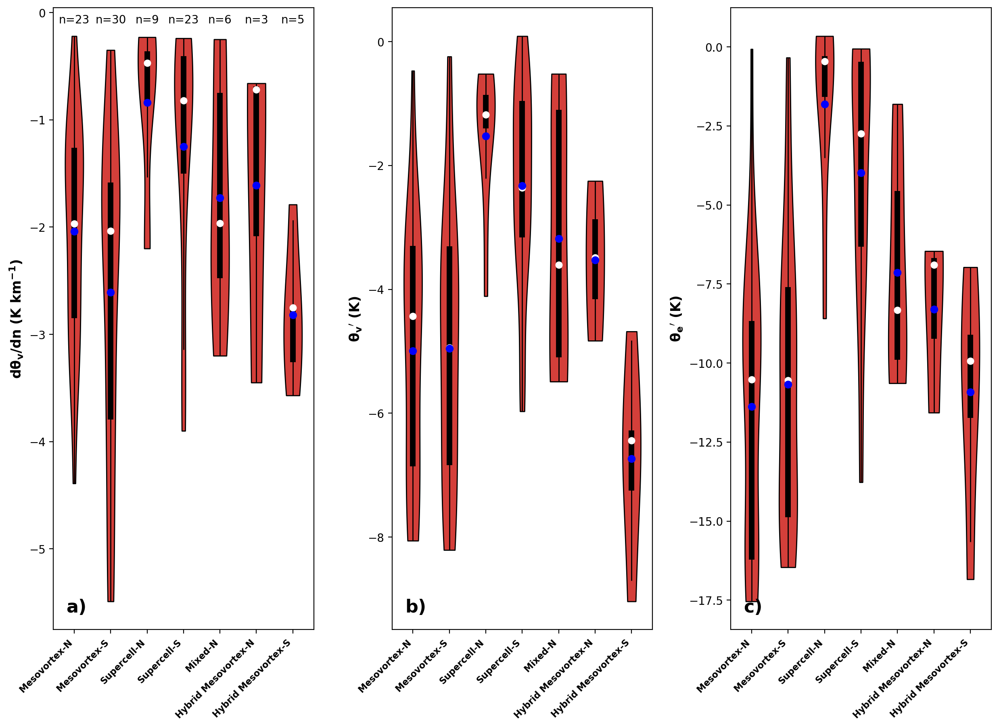

In [237]:
fig, axes = plt.subplots(1,3, figsize=(15,10))

data= [list(np.concatenate(MVDTV_T_N1)),list(np.concatenate(MVDTV_T_S1)),list(np.concatenate(MCDTV_T_N1)),list(np.concatenate(MCDTV_T_S1)),list(np.concatenate(MDTV_T_N1)),list(np.concatenate(HDTV_T_N1)),list(np.concatenate(HDTV_T_S1))]
data1= [list(np.concatenate(MVTV_T_N1)),list(np.concatenate(MVTV_T_S1)),list(np.concatenate(MCTV_T_N1)),list(np.concatenate(MCTV_T_S1)),list(np.concatenate(MTV_T_N1)),list(np.concatenate(HTV_T_N1)),list(np.concatenate(HTV_T_S1))]
data2= [list(np.concatenate(MVTE_T_N1)),list(np.concatenate(MVTE_T_S1)),list(np.concatenate(MCTE_T_N1)),list(np.concatenate(MCTE_T_S1)),list(np.concatenate(MTE_T_N1)),list(np.concatenate(HTE_T_N1)),list(np.concatenate(HTE_T_S1))]

# Creating plot
parts1 = axes[0].violinplot(data,showmeans=False, showextrema=False, showmedians=False)
parts2 = axes[1].violinplot(data1,showmeans=False, showextrema=False, showmedians=False)
parts3 = axes[2].violinplot(data2,showmeans=False, showextrema=False, showmedians=False)

for pc in parts1['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile111 = []
medians111 = []
quartile311 = []
whiskers_min1 = []
whiskers_max1 = []
for i in np.arange(0,7,1):
    quartile11, medians11, quartile31 = np.percentile(data[i], [25, 50, 75], axis=0)
    whiskers = np.array([adjacent_values(np.sort(data[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile111.append(quartile11)
    medians111.append(medians11)
    quartile311.append(quartile31)
    whiskers_min1.append(whiskers_min)
    whiskers_max1.append(whiskers_max)
    
inds = np.arange(1, len(medians111) + 1)
axes[0].scatter(inds, medians111, marker='o', color='white', s=30, zorder=3)
axes[0].vlines(inds, quartile111, quartile311, color='k', linestyle='-', lw=5)
axes[0].vlines(inds, whiskers_min1, whiskers_max1, color='k', linestyle='-', lw=1)

mean1=[]
for i in np.arange(0,7,1):
    test = np.mean(data[i])
    mean1.append(test)
axes[0].scatter([1,2,3,4,5,6,7],mean1,marker='o',color='b',zorder=3)

for pc in parts2['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile112 = []
medians112 = []
quartile312 = []
whiskers_min2 = []
whiskers_max2 = []
for i in np.arange(0,7,1):
    quartile11, medians11, quartile31 = np.percentile(data1[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data1[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile112.append(quartile11)
    medians112.append(medians11)
    quartile312.append(quartile31)
    whiskers_min2.append(whiskers_min)
    whiskers_max2.append(whiskers_max)
    
inds = np.arange(1, len(medians112) + 1)
axes[1].scatter(inds, medians112, marker='o', color='white', s=30, zorder=3)
axes[1].vlines(inds, quartile112, quartile312, color='k', linestyle='-', lw=5)
axes[1].vlines(inds, whiskers_min2, whiskers_max2, color='k', linestyle='-', lw=1)

mean2=[]
for i in np.arange(0,7,1):
    test = np.mean(data1[i])
    mean2.append(test)
axes[1].scatter([1,2,3,4,5,6,7],mean2,marker='o',color='b',zorder=3)

for pc in parts3['bodies']:
    pc.set_facecolor('#D43F3A')
    pc.set_edgecolor('black')
    pc.set_alpha(1)

quartile113 = []
medians113 = []
quartile313 = []
whiskers_min3 = []
whiskers_max3 = []
for i in np.arange(0,7,1):
    quartile11, medians11, quartile31 = np.percentile(data2[i], [25, 50, 75], axis=0)
    whiskers = np.array([
        adjacent_values(np.sort(data2[i]), quartile11, quartile31)])
    whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
    quartile113.append(quartile11)
    medians113.append(medians11)
    quartile313.append(quartile31)
    whiskers_min3.append(whiskers_min)
    whiskers_max3.append(whiskers_max)
    
inds = np.arange(1, len(medians113) + 1)
axes[2].scatter(inds, medians113, marker='o', color='white', s=30, zorder=3)
axes[2].vlines(inds, quartile113, quartile313, color='k', linestyle='-', lw=5)
axes[2].vlines(inds, whiskers_min3, whiskers_max3, color='k', linestyle='-', lw=1)

mean3=[]
for i in np.arange(0,7,1):
    test = np.mean(data2[i])
    mean3.append(test)
axes[2].scatter([1,2,3,4,5,6,7],mean3,marker='o',color='b',zorder=3)

axes[0].set_xticks([1,2,3,4,5,6,7])
axes[1].set_xticks([1,2,3,4,5,6,7])
axes[2].set_xticks([1,2,3,4,5,6,7])

axes[0].set_ylabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)',fontweight='bold',fontsize=12)
axes[2].set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)',fontweight='bold',fontsize=12)
axes[1].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)',fontweight='bold',fontsize=12)
axes[0].set_xticklabels(["Mesovortex-N","Mesovortex-S","Supercell-N","Supercell-S","Mixed-N","Hybrid Mesovortex-N","Hybrid Mesovortex-S"],fontweight='bold',fontsize=8,rotation=45,ha='right')
axes[1].set_xticklabels(["Mesovortex-N","Mesovortex-S","Supercell-N","Supercell-S","Mixed-N","Hybrid Mesovortex-N","Hybrid Mesovortex-S"],fontweight='bold',fontsize=8,rotation=45,ha='right')
axes[2].set_xticklabels(["Mesovortex-N","Mesovortex-S","Supercell-N","Supercell-S","Mixed-N","Hybrid Mesovortex-N","Hybrid Mesovortex-S"],fontweight='bold',fontsize=8,rotation=45,ha='right')
axes[0].text(1,-0.1,'n='+str(len(data[0])),ha='center')
axes[0].text(2,-0.1,'n='+str(len(data[1])),ha='center')
axes[0].text(3,-0.1,'n='+str(len(data[2])),ha='center')
axes[0].text(4,-0.1,'n='+str(len(data[3])),ha='center')
axes[0].text(5,-0.1,'n='+str(len(data[4])),ha='center')
axes[0].text(6,-0.1,'n='+str(len(data[5])),ha='center')
axes[0].text(7,-0.1,'n='+str(len(data[6])),ha='center')


axes[0].text(0.05, 0.05, 'a)', transform=axes[0].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[1].text(0.05, 0.05, 'b)', transform=axes[1].transAxes,
      fontsize=16, fontweight='bold', va='top')
axes[2].text(0.05, 0.05, 'c)', transform=axes[2].transAxes,
      fontsize=16, fontweight='bold', va='top')

plt.subplots_adjust(wspace=0.3,hspace=0.05)

# show plot
# save_dir = 'C:\\Users\\joshu\\Desktop\\Test_Plots\\'
plt.savefig('E://NSNT.png', bbox_inches = 'tight', format='png', dpi=300);
plt.show()


In [17]:
stats.ttest_ind(a=np.concatenate(HTV_T_N),b=np.concatenate(HTV_T_S),alternative='less')

Ttest_indResult(statistic=2.1462532421264742e-16, pvalue=0.5)

In [43]:
# print(len(np.concatenate(LDTV)),np.mean(np.concatenate(LDTV)),np.median(np.concatenate(LDTV)),np.std(np.concatenate(LDTV)),
#           np.cov(np.concatenate(LDTV),np.concatenate(LTE)),np.cov(np.concatenate(LDTV),np.concatenate(LTV))) 

# from scipy.stats import pearsonr
# cor1, _ = pearsonr(np.concatenate(LDTV),np.concatenate(LTE))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(LDTV),np.concatenate(LTV))
# print(cor11)

####################################################################################

# print(len(np.concatenate(MVDTV)),np.mean(np.concatenate(MVDTV)),np.median(np.concatenate(MVDTV)),np.std(np.concatenate(MVDTV)),
#           np.cov(np.concatenate(MVDTV),np.concatenate(MVTE)),np.cov(np.concatenate(MVDTV),np.concatenate(MVTV))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV),np.concatenate(MVTE))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV),np.concatenate(MVTV))
# print(cor11)

#####################################################################################

# print(len(np.concatenate(MCDTV)),np.mean(np.concatenate(MCDTV)),np.median(np.concatenate(MCDTV)),np.std(np.concatenate(MCDTV)),
#           np.cov(np.concatenate(MCDTV),np.concatenate(MCTE)),np.cov(np.concatenate(MCDTV),np.concatenate(MCTV))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MCDTV),np.concatenate(MCTE))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MCDTV),np.concatenate(MCTV))
# print(cor11)

#######################################################################################

# print(len(np.concatenate(MDTV)),np.mean(np.concatenate(MDTV)),np.median(np.concatenate(MDTV)),np.std(np.concatenate(MDTV)),
#           np.cov(np.concatenate(MDTV),np.concatenate(MTE)),np.cov(np.concatenate(MDTV),np.concatenate(MTV))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MDTV),np.concatenate(MTE))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MDTV),np.concatenate(MTV))
# print(cor11)

########################################################################################

# print(len(np.concatenate(HDTV)),np.mean(np.concatenate(HDTV)),np.median(np.concatenate(HDTV)),np.std(np.concatenate(HDTV)),
#           np.cov(np.concatenate(HDTV),np.concatenate(HTE)),np.cov(np.concatenate(HDTV),np.concatenate(HTV))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(HDTV),np.concatenate(HTE))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(HDTV),np.concatenate(HTV))
# print(cor11)

10 -1.4919999999999998 -1.73 1.025883034268527 [[ 1.16937333  3.56128222]
 [ 3.56128222 14.49013444]] [[1.16937333 2.43577778]
 [2.43577778 5.25482222]]
0.8651543410972399
0.9826119853785211


In [45]:
# print(len(np.concatenate(MVDTV_T)),np.mean(np.concatenate(MVDTV_T)),np.median(np.concatenate(MVDTV_T)),np.std(np.concatenate(MVDTV_T)),
#           np.cov(np.concatenate(MVDTV_T),np.concatenate(MVTE_T)),np.cov(np.concatenate(MVDTV_T),np.concatenate(MVTV_T))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_T),np.concatenate(MVTE_T))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_T),np.concatenate(MVTV_T))
# print(cor11)

# print(len(np.concatenate(MVDTV_NT)),np.mean(np.concatenate(MVDTV_NT)),np.median(np.concatenate(MVDTV_NT)),np.std(np.concatenate(MVDTV_NT)),
#           np.cov(np.concatenate(MVDTV_NT),np.concatenate(MVTE_NT)),np.cov(np.concatenate(MVDTV_NT),np.concatenate(MVTV_NT))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_NT),np.concatenate(MVTE_NT))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_NT),np.concatenate(MVTV_NT))
# print(cor11)

###################################################################################

# print(len(np.concatenate(MCDTV_T)),np.mean(np.concatenate(MCDTV_T)),np.median(np.concatenate(MCDTV_T)),np.std(np.concatenate(MCDTV_T)),
#           np.cov(np.concatenate(MCDTV_T),np.concatenate(MCTE_T)),np.cov(np.concatenate(MCDTV_T),np.concatenate(MCTV_T))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MCDTV_T),np.concatenate(MCTE_T))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MCDTV_T),np.concatenate(MCTV_T))
# print(cor11)

# print(len(np.concatenate(MCDTV_NT)),np.mean(np.concatenate(MCDTV_NT)),np.median(np.concatenate(MCDTV_NT)),np.std(np.concatenate(MCDTV_NT)),
#           np.cov(np.concatenate(MCDTV_NT),np.concatenate(MCTE_NT)),np.cov(np.concatenate(MCDTV_NT),np.concatenate(MCTV_NT))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MCDTV_NT),np.concatenate(MCTE_NT))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MCDTV_NT),np.concatenate(MCTV_NT))
# print(cor11)

#######################################################################################

# print(len(np.concatenate(MDTV_T)),np.mean(np.concatenate(MDTV_T)),np.median(np.concatenate(MDTV_T)),np.std(np.concatenate(MDTV_T)),
#           np.cov(np.concatenate(MDTV_T),np.concatenate(MTE_T)),np.cov(np.concatenate(MDTV_T),np.concatenate(MTV_T))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MDTV_T),np.concatenate(MTE_T))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MDTV_T),np.concatenate(MTV_T))
# print(cor11)

# print(len(np.concatenate(MDTV_NT)),np.mean(np.concatenate(MDTV_NT)),np.median(np.concatenate(MDTV_NT)),np.std(np.concatenate(MDTV_NT)),
#           np.cov(np.concatenate(MDTV_NT),np.concatenate(MTE_NT)),np.cov(np.concatenate(MDTV_NT),np.concatenate(MTV_NT))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MDTV_NT),np.concatenate(MTE_NT))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MDTV_NT),np.concatenate(MTV_NT))
# print(cor11)

#########################################################################################

print(len(np.concatenate(HDTV_T)),np.mean(np.concatenate(HDTV_T)),np.median(np.concatenate(HDTV_T)),np.std(np.concatenate(HDTV_T)),
          np.cov(np.concatenate(HDTV_T),np.concatenate(HTE_T)),np.cov(np.concatenate(HDTV_T),np.concatenate(HTV_T))) 

from scipy.stats import pearsonr,spearmanr
cor1, _ = pearsonr(np.concatenate(HDTV_T),np.concatenate(HTE_T))
print(cor1)

cor11, _ = pearsonr(np.concatenate(HDTV_T),np.concatenate(HTV_T))
print(cor11)

print(len(np.concatenate(HDTV_NT)),np.mean(np.concatenate(HDTV_NT)),np.median(np.concatenate(HDTV_NT)),np.std(np.concatenate(HDTV_NT)),
          np.cov(np.concatenate(HDTV_NT),np.concatenate(HTE_NT)),np.cov(np.concatenate(HDTV_NT),np.concatenate(HTV_NT))) 

from scipy.stats import pearsonr,spearmanr
cor1, _ = pearsonr(np.concatenate(HDTV_NT),np.concatenate(HTE_NT))
print(cor1)

cor11, _ = pearsonr(np.concatenate(HDTV_NT),np.concatenate(HTV_NT))
print(cor11)

6 -1.165 -1.015 0.998878537827965 [[ 1.19731     4.83544   ]
 [ 4.83544    22.76346667]] [[1.19731 2.31507]
 [2.31507 4.56675]]
0.926218589072909
0.9900501720086792
4 -1.9825 -2.26 0.8564279012269509 [[0.97795833 1.322775  ]
 [1.322775   2.36055833]] [[0.97795833 1.92015833]
 [1.92015833 3.78209167]]
0.870599541125966
0.9984144094211045


In [47]:
# print(len(np.concatenate(MVDTV_N)),np.mean(np.concatenate(MVDTV_N)),np.median(np.concatenate(MVDTV_N)),np.std(np.concatenate(MVDTV_N)),
#           np.cov(np.concatenate(MVDTV_N),np.concatenate(MVTE_N)),np.cov(np.concatenate(MVDTV_N),np.concatenate(MVTV_N))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_N),np.concatenate(MVTE_N))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_N),np.concatenate(MVTV_N))
# print(cor11)

# print(len(np.concatenate(MVDTV_S)),np.mean(np.concatenate(MVDTV_S)),np.median(np.concatenate(MVDTV_S)),np.std(np.concatenate(MVDTV_S)),
#           np.cov(np.concatenate(MVDTV_S),np.concatenate(MVTE_S)),np.cov(np.concatenate(MVDTV_S),np.concatenate(MVTV_S))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_S),np.concatenate(MVTE_S))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_S),np.concatenate(MVTV_S))
# print(cor11)

########################################################################################

# print(len(np.concatenate(MCDTV_N)),np.mean(np.concatenate(MCDTV_N)),np.median(np.concatenate(MCDTV_N)),np.std(np.concatenate(MCDTV_N)),
#           np.cov(np.concatenate(MCDTV_N),np.concatenate(MCTE_N)),np.cov(np.concatenate(MCDTV_N),np.concatenate(MCTV_N))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MCDTV_N),np.concatenate(MCTE_N))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MCDTV_N),np.concatenate(MCTV_N))
# print(cor11)

# print(len(np.concatenate(MCDTV_S)),np.mean(np.concatenate(MCDTV_S)),np.median(np.concatenate(MCDTV_S)),np.std(np.concatenate(MCDTV_S)),
#           np.cov(np.concatenate(MCDTV_S),np.concatenate(MCTE_S)),np.cov(np.concatenate(MCDTV_S),np.concatenate(MCTV_S))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MCDTV_S),np.concatenate(MCTE_S))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MCDTV_S),np.concatenate(MCTV_S))
# print(cor11)

########################################################################################

# print(len(np.concatenate(MDTV_N)),np.mean(np.concatenate(MDTV_N)),np.median(np.concatenate(MDTV_N)),np.std(np.concatenate(MDTV_N)),
#           np.cov(np.concatenate(MDTV_N),np.concatenate(MTE_N)),np.cov(np.concatenate(MDTV_N),np.concatenate(MTV_N))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MDTV_N),np.concatenate(MTE_N))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MDTV_N),np.concatenate(MTV_N))
# print(cor11)

#################################################################################################

print(len(np.concatenate(HDTV_N)),np.mean(np.concatenate(HDTV_N)),np.median(np.concatenate(HDTV_N)),np.std(np.concatenate(HDTV_N)),
          np.cov(np.concatenate(HDTV_N),np.concatenate(HTE_N)),np.cov(np.concatenate(HDTV_N),np.concatenate(HTV_N))) 

from scipy.stats import pearsonr,spearmanr
cor1, _ = pearsonr(np.concatenate(HDTV_N),np.concatenate(HTE_N))
print(cor1)

cor11, _ = pearsonr(np.concatenate(HDTV_N),np.concatenate(HTV_N))
print(cor11)

print(len(np.concatenate(HDTV_S)),np.mean(np.concatenate(HDTV_S)),np.median(np.concatenate(HDTV_S)),np.std(np.concatenate(HDTV_S)),
          np.cov(np.concatenate(HDTV_S),np.concatenate(HTE_S)),np.cov(np.concatenate(HDTV_S),np.concatenate(HTV_S))) 

from scipy.stats import pearsonr,spearmanr
cor1, _ = pearsonr(np.concatenate(HDTV_S),np.concatenate(HTE_S))
print(cor1)

cor11, _ = pearsonr(np.concatenate(HDTV_S),np.concatenate(HTV_S))
print(cor11)

5 -1.142 -0.66 1.018123764578747 [[ 1.29572  4.9428 ]
 [ 4.9428  23.89655]] [[1.29572 2.46575]
 [2.46575 4.83845]]
0.8882799391480527
0.9847825215396733
5 -1.8419999999999999 -1.79 0.9073566002405008 [[1.02912 2.34121]
 [2.34121 6.97153]] [[1.02912 2.13975]
 [2.13975 4.4849 ]]
0.8740641561946025
0.9959869402884729


In [16]:
# print(len(np.concatenate(MVDTV_T_N)),np.mean(np.concatenate(MVDTV_T_N)),np.median(np.concatenate(MVDTV_T_N)),np.std(np.concatenate(MVDTV_T_N)),
#           np.cov(np.concatenate(MVDTV_T_N),np.concatenate(MVTE_T_N)),np.cov(np.concatenate(MVDTV_T_N),np.concatenate(MVTV_T_N))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_T_N),np.concatenate(MVTE_T_N))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_T_N),np.concatenate(MVTV_T_N))
# print(cor11)

# print(len(np.concatenate(MVDTV_T_S)),np.mean(np.concatenate(MVDTV_T_S)),np.median(np.concatenate(MVDTV_T_S)),np.std(np.concatenate(MVDTV_T_S)),
#           np.cov(np.concatenate(MVDTV_T_S),np.concatenate(MVTE_T_S)),np.cov(np.concatenate(MVDTV_T_S),np.concatenate(MVTV_T_S))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_T_S),np.concatenate(MVTE_T_S))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_T_S),np.concatenate(MVTV_T_S))
# print(cor11)

########################################################################################

# print(len(np.concatenate(MCDTV_T_S)),np.mean(np.concatenate(MCDTV_T_S)),np.median(np.concatenate(MCDTV_T_S)),np.std(np.concatenate(MCDTV_T_S)),
#           np.cov(np.concatenate(MCDTV_T_S),np.concatenate(MCTE_T_S)),np.cov(np.concatenate(MCDTV_T_S),np.concatenate(MCTV_T_S))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MCDTV_T_S),np.concatenate(MCTE_T_S))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MCDTV_T_S),np.concatenate(MCTV_T_S))
# print(cor11)

########################################################################################

# print(len(np.concatenate(MDTV_T_N)),np.mean(np.concatenate(MDTV_T_N)),np.median(np.concatenate(MDTV_T_N)),np.std(np.concatenate(MDTV_T_N)),
#           np.cov(np.concatenate(MDTV_T_N),np.concatenate(MTE_T_N)),np.cov(np.concatenate(MDTV_T_N),np.concatenate(MTV_T_N))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MDTV_T_N),np.concatenate(MTE_T_N))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MDTV_T_N),np.concatenate(MTV_T_N))
# print(cor11)

#################################################################################################

# print(len(np.concatenate(HDTV_T_N)),np.mean(np.concatenate(HDTV_T_N)),np.median(np.concatenate(HDTV_T_N)),np.std(np.concatenate(HDTV_T_N)),
#           np.cov(np.concatenate(HDTV_T_N),np.concatenate(HTE_T_N)),np.cov(np.concatenate(HDTV_T_N),np.concatenate(HTV_T_N))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(HDTV_T_N),np.concatenate(HTE_T_N))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(HDTV_T_N),np.concatenate(HTV_T_N))
# print(cor11)

# print(len(np.concatenate(HDTV_T_S)),np.mean(np.concatenate(HDTV_T_S)),np.median(np.concatenate(HDTV_T_S)),np.std(np.concatenate(HDTV_T_S)),
#           np.cov(np.concatenate(HDTV_T_S),np.concatenate(HTE_T_S)),np.cov(np.concatenate(HDTV_T_S),np.concatenate(HTV_T_S))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(HDTV_T_S),np.concatenate(HTE_T_S))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(HDTV_T_S),np.concatenate(HTV_T_S))
# print(cor11)

3 -1.61 -0.72 1.3013070352534026 [[2.5401     4.49695   ]
 [4.49695    8.03323333]] [[2.5401     1.8218    ]
 [1.8218     1.66493333]]
0.9955142036016165
0.8858840171175361
5 -2.82 -2.75 0.6049793384901668 [[ 0.4575   2.26995]
 [ 2.26995 13.88537]] [[0.4575  1.0334 ]
 [1.0334  2.52382]]
0.9006208843766271
0.9617090860750698


In [50]:
# print(len(np.concatenate(MVDTV_T_N1)),np.mean(np.concatenate(MVDTV_T_N1)),np.median(np.concatenate(MVDTV_T_N1)),np.std(np.concatenate(MVDTV_T_N1)),
#           np.cov(np.concatenate(MVDTV_T_N1),np.concatenate(MVTE_T_N1)),np.cov(np.concatenate(MVDTV_T_N1),np.concatenate(MVTV_T_N1))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_T_N1),np.concatenate(MVTE_T_N1))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_T_N1),np.concatenate(MVTV_T_N1))
# print(cor11)

# print(len(np.concatenate(MVDTV_T_S1)),np.mean(np.concatenate(MVDTV_T_S1)),np.median(np.concatenate(MVDTV_T_S1)),np.std(np.concatenate(MVDTV_T_S1)),
#           np.cov(np.concatenate(MVDTV_T_S1),np.concatenate(MVTE_T_S1)),np.cov(np.concatenate(MVDTV_T_S1),np.concatenate(MVTV_T_S1))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_T_S1),np.concatenate(MVTE_T_S1))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_T_S1),np.concatenate(MVTV_T_S1))
# print(cor11)

########################################################################################

# print(len(np.concatenate(MCDTV_T_N1)),np.mean(np.concatenate(MCDTV_T_N1)),np.median(np.concatenate(MCDTV_T_N1)),np.std(np.concatenate(MCDTV_T_N1)),
#           np.cov(np.concatenate(MCDTV_T_N1),np.concatenate(MCTE_T_N1)),np.cov(np.concatenate(MCDTV_T_N1),np.concatenate(MCTV_T_N1))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MCDTV_T_N1),np.concatenate(MCTE_T_N1))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MCDTV_T_N1),np.concatenate(MCTV_T_N1))
# print(cor11)

# print(len(np.concatenate(MCDTV_T_S1)),np.mean(np.concatenate(MCDTV_T_S1)),np.median(np.concatenate(MCDTV_T_S1)),np.std(np.concatenate(MCDTV_T_S1)),
#           np.cov(np.concatenate(MCDTV_T_S1),np.concatenate(MCTE_T_S1)),np.cov(np.concatenate(MCDTV_T_S1),np.concatenate(MCTV_T_S1))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MCDTV_T_S1),np.concatenate(MCTE_T_S1))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MCDTV_T_S1),np.concatenate(MCTV_T_S1))
# print(cor11)

########################################################################################

# print(len(np.concatenate(MDTV_T_N)),np.mean(np.concatenate(MDTV_T_N)),np.median(np.concatenate(MDTV_T_N)),np.std(np.concatenate(MDTV_T_N)),
#           np.cov(np.concatenate(MDTV_T_N),np.concatenate(MTE_T_N)),np.cov(np.concatenate(MDTV_T_N),np.concatenate(MTV_T_N))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MDTV_T_N),np.concatenate(MTE_T_N))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MDTV_T_N),np.concatenate(MTV_T_N))
# print(cor11)

#################################################################################################

# print(len(np.concatenate(HDTV_T_N1)),np.mean(np.concatenate(HDTV_T_N1)),np.median(np.concatenate(HDTV_T_N1)),np.std(np.concatenate(HDTV_T_N1)),
#           np.cov(np.concatenate(HDTV_T_N1),np.concatenate(HTE_T_N1)),np.cov(np.concatenate(HDTV_T_N1),np.concatenate(HTV_T_N1))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(HDTV_T_N1),np.concatenate(HTE_T_N1))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(HDTV_T_N1),np.concatenate(HTV_T_N1))
# print(cor11)

print(len(np.concatenate(HDTV_T_S1)),np.mean(np.concatenate(HDTV_T_S1)),np.median(np.concatenate(HDTV_T_S1)),np.std(np.concatenate(HDTV_T_S1)),
          np.cov(np.concatenate(HDTV_T_S1),np.concatenate(HTE_T_S1)),np.cov(np.concatenate(HDTV_T_S1),np.concatenate(HTV_T_S1))) 

from scipy.stats import pearsonr,spearmanr
cor1, _ = pearsonr(np.concatenate(HDTV_T_S1),np.concatenate(HTE_T_S1))
print(cor1)

cor11, _ = pearsonr(np.concatenate(HDTV_T_S1),np.concatenate(HTV_T_S1))
print(cor11)

3 -2.4233333333333333 -2.73 0.44790872085975536 [[0.30093333 0.80493333]
 [0.80493333 2.34823333]] [[0.30093333 0.5328    ]
 [0.5328     0.9472    ]]
0.957533860059449
0.9979487157886735


In [18]:
# print(len(np.concatenate(MVDTV_TOT)),np.mean(np.concatenate(MVDTV_TOT)),np.median(np.concatenate(MVDTV_TOT)),np.std(np.concatenate(MVDTV_TOT)),
#           np.cov(np.concatenate(MVDTV_TOT),np.concatenate(MVTE_TOT)),np.cov(np.concatenate(MVDTV_TOT),np.concatenate(MVTV_TOT))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_TOT),np.concatenate(MVTE_TOT))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_TOT),np.concatenate(MVTV_TOT))
# print(cor11)

# print(len(np.concatenate(MVDTV_PRE)),np.mean(np.concatenate(MVDTV_PRE)),np.median(np.concatenate(MVDTV_PRE)),np.std(np.concatenate(MVDTV_PRE)),
#           np.cov(np.concatenate(MVDTV_PRE),np.concatenate(MVTE_PRE)),np.cov(np.concatenate(MVDTV_PRE),np.concatenate(MVTV_PRE))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_PRE),np.concatenate(MVTE_PRE))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_PRE),np.concatenate(MVTV_PRE))
# print(cor11)

# print(len(np.concatenate(MVDTV_POST)),np.mean(np.concatenate(MVDTV_POST)),np.median(np.concatenate(MVDTV_POST)),np.std(np.concatenate(MVDTV_POST)),
#           np.cov(np.concatenate(MVDTV_POST),np.concatenate(MVTE_POST)),np.cov(np.concatenate(MVDTV_POST),np.concatenate(MVTV_POST))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MVDTV_POST),np.concatenate(MVTE_POST))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MVDTV_POST),np.concatenate(MVTV_POST))
# print(cor11)

#################################################################################################

print(len(np.concatenate(MCDTV_TOT)),np.mean(np.concatenate(MCDTV_TOT)),np.median(np.concatenate(MCDTV_TOT)),np.std(np.concatenate(MCDTV_TOT)),
          np.cov(np.concatenate(MCDTV_TOT),np.concatenate(MCTE_TOT)),np.cov(np.concatenate(MCDTV_TOT),np.concatenate(MCTV_TOT))) 


print(len(np.concatenate(MCDTV_POST)),np.mean(np.concatenate(MCDTV_POST)),np.median(np.concatenate(MCDTV_POST)),np.std(np.concatenate(MCDTV_POST)),
          np.cov(np.concatenate(MCDTV_POST),np.concatenate(MCTE_POST)),np.cov(np.concatenate(MCDTV_POST),np.concatenate(MCTV_POST))) 


###################################################################################################

# print(len(np.concatenate(MDTV_TOT)),np.mean(np.concatenate(MDTV_TOT)),np.median(np.concatenate(MDTV_TOT)),np.std(np.concatenate(MDTV_TOT)),
#           np.cov(np.concatenate(MDTV_TOT),np.concatenate(MTE_TOT)),np.cov(np.concatenate(MDTV_TOT),np.concatenate(MTV_TOT))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(MDTV_TOT),np.concatenate(MTE_TOT))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(MDTV_TOT),np.concatenate(MTV_TOT))
# print(cor11)

# print(len(np.concatenate(MDTV_PRE)),np.mean(np.concatenate(MDTV_PRE)),np.median(np.concatenate(MDTV_PRE)),np.std(np.concatenate(MDTV_PRE)),
#           np.cov(np.concatenate(MDTV_PRE),np.concatenate(MTE_PRE)),np.cov(np.concatenate(MDTV_PRE),np.concatenate(MTV_PRE))) 


# print(len(np.concatenate(MDTV_POST)),np.mean(np.concatenate(MDTV_POST)),np.median(np.concatenate(MDTV_POST)),np.std(np.concatenate(MDTV_POST)),
#           np.cov(np.concatenate(MDTV_POST),np.concatenate(MTE_POST)),np.cov(np.concatenate(MDTV_POST),np.concatenate(MTV_POST))) 

#########################################################################################################

# print(len(np.concatenate(HDTV_TOT)),np.mean(np.concatenate(HDTV_TOT)),np.median(np.concatenate(HDTV_TOT)),np.std(np.concatenate(HDTV_TOT)),
#           np.cov(np.concatenate(HDTV_TOT),np.concatenate(HTE_TOT)),np.cov(np.concatenate(HDTV_TOT),np.concatenate(HTV_TOT))) 


# print(len(np.concatenate(HDTV_PRE)),np.mean(np.concatenate(HDTV_PRE)),np.median(np.concatenate(HDTV_PRE)),np.std(np.concatenate(HDTV_PRE)),
#           np.cov(np.concatenate(HDTV_PRE),np.concatenate(HTE_PRE)),np.cov(np.concatenate(HDTV_PRE),np.concatenate(HTV_PRE))) 

# from scipy.stats import pearsonr,spearmanr
# cor1, _ = pearsonr(np.concatenate(HDTV_PRE),np.concatenate(HTV_PRE))
# print(cor1)

# cor11, _ = pearsonr(np.concatenate(HDTV_PRE),np.concatenate(HTE_PRE))
# print(cor11)


# print(len(np.concatenate(HDTV_POST)),np.mean(np.concatenate(HDTV_POST)),np.median(np.concatenate(HDTV_POST)),np.std(np.concatenate(HDTV_POST)),
#           np.cov(np.concatenate(HDTV_POST),np.concatenate(HTE_POST)),np.cov(np.concatenate(HDTV_POST),np.concatenate(HTV_POST))) 


2 -1.175 -1.175 0.955 [[1.82405 0.5921 ]
 [0.5921  0.1922 ]] [[1.82405 0.14325]
 [0.14325 0.01125]]
1 -2.0 -2.0 0.0 [[nan nan]
 [nan nan]] [[nan nan]
 [nan nan]]


C:\Users\joshu\.conda\envs\unidata\lib\site-packages\ipykernel_launcher.py:38: RuntimeWarning: Degrees of freedom <= 0 for slice


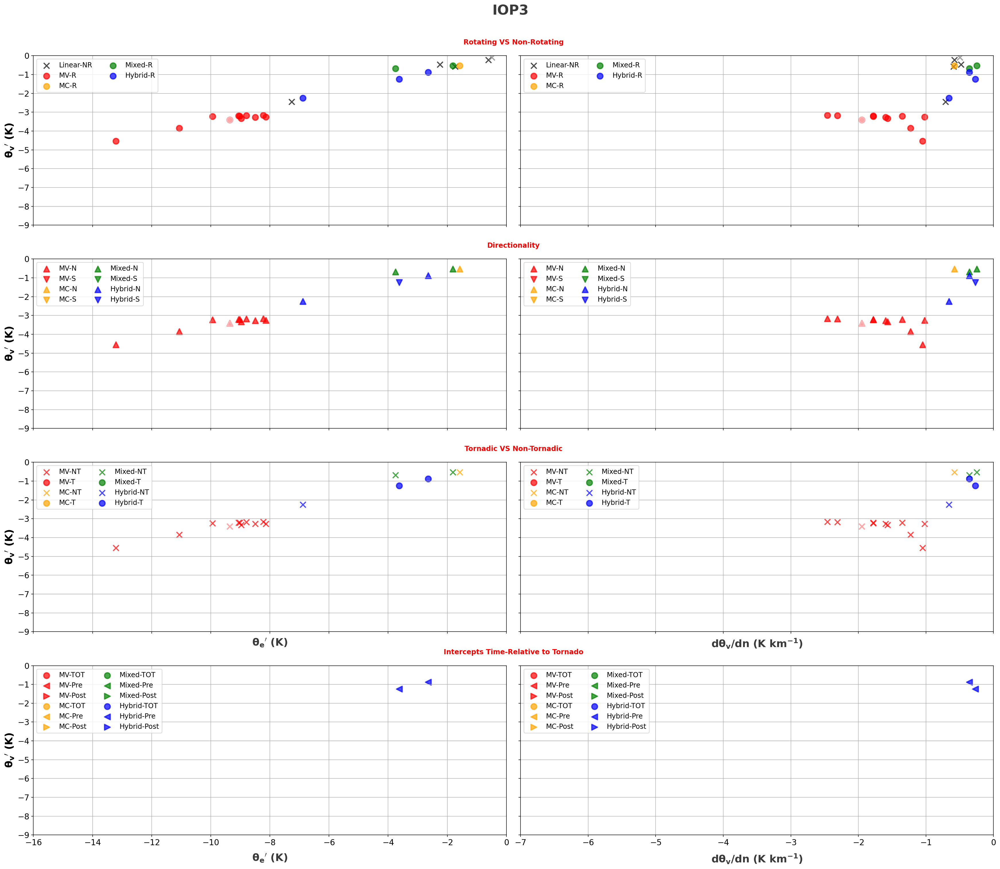

In [149]:
fig, axes = plt.subplots(4,2, figsize=(30,25), sharey=True, sharex='col')

#axes[0,0].set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
axes[0,0].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
axes[0,0].tick_params(axis='y',labelsize=14)
axes[0,0].tick_params(axis='x',labelsize=14)

axes[0,0].scatter(Linear_TE,Linear_TV,marker='x',color='k',s=100,alpha=0.7,linewidth=2, label = 'Linear-NR')
axes[0,0].scatter(MV_TE_R, MV_TV_R, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-R')
axes[0,0].scatter(MC_TE_R, MC_TV_R, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-R')
axes[0,0].scatter(Mixed_TE_R, Mixed_TV_R, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-R')
axes[0,0].scatter(Hybrid_TE_R, Hybrid_TV_R, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-R')
axes[0,0].legend(ncol=2,prop={'size': 12},loc='upper left')
axes[0,0].set_ylim((-9,0))
axes[0,0].set_xlim((-16,0))

axes[0,0].grid()


axes[0,1].tick_params(axis='y',labelsize=14)
axes[0,1].tick_params(axis='x',labelsize=14)

axes[0,1].scatter(Linear_dTVdn,Linear_TV,marker='x',color='k',s=100,alpha=0.7,linewidth=2, label = 'Linear-NR')
axes[0,1].scatter(MV_dTVdn_R, MV_TV_R, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-R')
axes[0,1].scatter(MC_dTVdn_R, MC_TV_R, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-R')
axes[0,1].scatter(Mixed_dTVdn_R, Mixed_TV_R, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-R')
axes[0,1].scatter(Hybrid_dTVdn_R, Hybrid_TV_R, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-R')
axes[0,1].legend(ncol=2,prop={'size': 12},loc='upper left')
axes[0,1].set_xlim((-7,0))

axes[0,1].grid()

###
axes[1,0].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
axes[1,0].tick_params(axis='y',labelsize=14)
axes[1,0].tick_params(axis='x',labelsize=14)

axes[1,0].scatter(MV_TE_N, MV_TV_N, marker='^',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-N')
axes[1,0].scatter(MV_TE_S, MV_TV_S, marker='v',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-S')
axes[1,0].scatter(MC_TE_N, MC_TV_N, marker='^',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-N')
axes[1,0].scatter(MC_TE_S, MC_TV_S, marker='v',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-S')
axes[1,0].scatter(Mixed_TE_N, Mixed_TV_N, marker='^',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-N')
axes[1,0].scatter(Mixed_TE_S, Mixed_TV_S, marker='v',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-S')
axes[1,0].scatter(Hybrid_TE_N, Hybrid_TV_N, marker='^',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-N')
axes[1,0].scatter(Hybrid_TE_S, Hybrid_TV_S, marker='v',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-S')
axes[1,0].legend(ncol=2,prop={'size': 12},loc='upper left')

axes[1,0].grid()

axes[1,1].tick_params(axis='y',labelsize=14)
axes[1,1].tick_params(axis='x',labelsize=14)

axes[1,1].scatter(MV_dTVdn_N, MV_TV_N, marker='^',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-N')
axes[1,1].scatter(MV_dTVdn_S, MV_TV_S, marker='v',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-S')
axes[1,1].scatter(MC_dTVdn_N, MC_TV_N, marker='^',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-N')
axes[1,1].scatter(MC_dTVdn_S, MC_TV_S, marker='v',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-S')
axes[1,1].scatter(Mixed_dTVdn_N, Mixed_TV_N, marker='^',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-N')
axes[1,1].scatter(Mixed_dTVdn_S, Mixed_TV_S, marker='v',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-S')
axes[1,1].scatter(Hybrid_dTVdn_N, Hybrid_TV_N, marker='^',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-N')
axes[1,1].scatter(Hybrid_dTVdn_S, Hybrid_TV_S, marker='v',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-S')
axes[1,1].legend(ncol=2,prop={'size': 12},loc='upper left')

axes[1,1].grid()

#####

axes[2,0].set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
axes[2,0].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
axes[2,0].tick_params(axis='y',labelsize=14)
axes[2,0].tick_params(axis='x',labelsize=14)

a1=axes[2,0].scatter(MV_TE_NT, MV_TV_NT, marker='x',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-NT')
a2=axes[2,0].scatter(MV_TE_TOT, MV_TV_TOT, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-T')
axes[2,0].scatter(MV_TE_Pre, MV_TV_Pre, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Pre')
axes[2,0].scatter(MV_TE_Post, MV_TV_Post, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Post')
a3=axes[2,0].scatter(MC_TE_NT, MC_TV_NT, marker='x',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-NT')
a4=axes[2,0].scatter(MC_TE_TOT, MC_TV_TOT, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-T')
axes[2,0].scatter(MC_TE_Pre, MC_TV_Pre, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Pre')
axes[2,0].scatter(MC_TE_Post, MC_TV_Post, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Post')
a5=axes[2,0].scatter(Mixed_TE_NT, Mixed_TV_NT, marker='x',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-NT')
a6=axes[2,0].scatter(Mixed_TE_TOT, Mixed_TV_TOT, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-T')
axes[2,0].scatter(Mixed_TE_Pre, Mixed_TV_Pre, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Pre')
axes[2,0].scatter(Mixed_TE_Post, Mixed_TV_Post, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Post')
a7=axes[2,0].scatter(Hybrid_TE_NT, Hybrid_TV_NT, marker='x',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-NT')
a8=axes[2,0].scatter(Hybrid_TE_TOT, Hybrid_TV_TOT, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-T')
axes[2,0].scatter(Hybrid_TE_Pre, Hybrid_TV_Pre, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Pre')
axes[2,0].scatter(Hybrid_TE_Post, Hybrid_TV_Post, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Post')
axes[2,0].legend(handles=[a1,a2,a3,a4,a5,a6,a7,a8],ncol=2,prop={'size': 12},loc='upper left')


axes[2,0].grid()

axes[2,1].set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
axes[2,1].tick_params(axis='y',labelsize=14)
axes[2,1].tick_params(axis='x',labelsize=14)

axes[2,1].scatter(MV_dTVdn_NT, MV_TV_NT, marker='x',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-NT')
axes[2,1].scatter(MV_dTVdn_TOT, MV_TV_TOT, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-TOT')
axes[2,1].scatter(MV_dTVdn_Pre, MV_TV_Pre, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Pre')
axes[2,1].scatter(MV_dTVdn_Post, MV_TV_Post, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Post')
axes[2,1].scatter(MC_dTVdn_NT, MC_TV_NT, marker='x',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-NT')
axes[2,1].scatter(MC_dTVdn_TOT, MC_TV_TOT, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-TOT')
axes[2,1].scatter(MC_dTVdn_Pre, MC_TV_Pre, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Pre')
axes[2,1].scatter(MC_dTVdn_Post, MC_TV_Post, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Post')
axes[2,1].scatter(Mixed_dTVdn_NT, Mixed_TV_NT, marker='x',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-NT')
axes[2,1].scatter(Mixed_dTVdn_TOT, Mixed_TV_TOT, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-TOT')
axes[2,1].scatter(Mixed_dTVdn_Pre, Mixed_TV_Pre, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Pre')
axes[2,1].scatter(Mixed_dTVdn_Post, Mixed_TV_Post, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Post')
axes[2,1].scatter(Hybrid_dTVdn_NT, Hybrid_TV_NT, marker='x',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-NT')
axes[2,1].scatter(Hybrid_dTVdn_TOT, Hybrid_TV_TOT, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-TOT')
axes[2,1].scatter(Hybrid_dTVdn_Pre, Hybrid_TV_Pre, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Pre')
axes[2,1].scatter(Hybrid_dTVdn_Post, Hybrid_TV_Post, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Post')
axes[2,1].legend(handles=[a1,a2,a3,a4,a5,a6,a7,a8],ncol=2,prop={'size': 12},loc='upper left')


axes[2,1].grid()


###

axes[3,0].set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
axes[3,0].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
axes[3,0].tick_params(axis='y',labelsize=14)
axes[3,0].tick_params(axis='x',labelsize=14)

axes[3,0].scatter(MV_TE_TOT, MV_TV_TOT, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-TOT')
axes[3,0].scatter(MV_TE_Pre, MV_TV_Pre, marker='<',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Pre')
axes[3,0].scatter(MV_TE_Post, MV_TV_Post, marker='>',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Post')
axes[3,0].scatter(MC_TE_TOT, MC_TV_TOT, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-TOT')
axes[3,0].scatter(MC_TE_Pre, MC_TV_Pre, marker='<',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Pre')
axes[3,0].scatter(MC_TE_Post, MC_TV_Post, marker='>',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Post')
axes[3,0].scatter(Mixed_TE_TOT, Mixed_TV_TOT, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-TOT')
axes[3,0].scatter(Mixed_TE_Pre, Mixed_TV_Pre, marker='<',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Pre')
axes[3,0].scatter(Mixed_TE_Post, Mixed_TV_Post, marker='>',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Post')
axes[3,0].scatter(Hybrid_TE_TOT, Hybrid_TV_TOT, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-TOT')
axes[3,0].scatter(Hybrid_TE_Pre, Hybrid_TV_Pre, marker='<',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Pre')
axes[3,0].scatter(Hybrid_TE_Post, Hybrid_TV_Post, marker='>',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Post')
axes[3,0].legend(ncol=2,prop={'size': 12},loc='upper left')


axes[3,0].grid()

axes[3,1].set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
axes[3,1].tick_params(axis='y',labelsize=14)
axes[3,1].tick_params(axis='x',labelsize=14)

axes[3,1].scatter(MV_dTVdn_TOT, MV_TV_TOT, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-TOT')
axes[3,1].scatter(MV_dTVdn_Pre, MV_TV_Pre, marker='<',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Pre')
axes[3,1].scatter(MV_dTVdn_Post, MV_TV_Post, marker='>',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Post')
axes[3,1].scatter(MC_dTVdn_TOT, MC_TV_TOT, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-TOT')
axes[3,1].scatter(MC_dTVdn_Pre, MC_TV_Pre, marker='<',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Pre')
axes[3,1].scatter(MC_dTVdn_Post, MC_TV_Post, marker='>',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Post')
axes[3,1].scatter(Mixed_dTVdn_TOT, Mixed_TV_TOT, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-TOT')
axes[3,1].scatter(Mixed_dTVdn_Pre, Mixed_TV_Pre, marker='<',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Pre')
axes[3,1].scatter(Mixed_dTVdn_Post, Mixed_TV_Post, marker='>',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Post')
axes[3,1].scatter(Hybrid_dTVdn_TOT, Hybrid_TV_TOT, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-TOT')
axes[3,1].scatter(Hybrid_dTVdn_Pre, Hybrid_TV_Pre, marker='<',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Pre')
axes[3,1].scatter(Hybrid_dTVdn_Post, Hybrid_TV_Post, marker='>',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Post')
axes[3,1].legend(ncol=2,prop={'size': 12},loc='upper left')


axes[3,1].grid()

for i in (sns.index):
    if (i == '104A'):
#         axes[0,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-R')
#         axes[0,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-R')
#         axes[1,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
#         axes[1,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
#         axes[2,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-NT')
#         axes[2,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-NT')
    
#         axes[0,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
#         axes[0,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
#         axes[1,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='v',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-S')
#         axes[1,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='v',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-S')
#         axes[2,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-T')
#         axes[2,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
#         axes[3,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
#         axes[3,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
        
        axes[0,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[0,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[1,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[1,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[2,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        axes[2,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
    
#         axes[0,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
#         axes[0,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
#         axes[1,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
#         axes[1,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
#         axes[2,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')
#         axes[2,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')
#         axes[3,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='>',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')
#         axes[3,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='>',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')

    if (i == '109A'):
#         axes[0,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-R')
#         axes[0,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-R')
#         axes[1,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
#         axes[1,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
#         axes[2,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-T')
#         axes[2,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-TOT')
#         axes[3,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-TOT')
#         axes[3,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-TOT')

#         axes[0,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
#         axes[0,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
#         axes[1,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
#         axes[1,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
#         axes[2,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
#         axes[2,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        
        axes[0,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'],marker='x',color='w',alpha=0.5,s=100,linewidth=2, label = 'Linear-NR')
        axes[0,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'],marker='x',color='w',alpha=0.5,s=100,linewidth=2, label = 'Linear-NR')

#         axes[0,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
#         axes[0,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
#         axes[1,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
#         axes[1,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
#         axes[2,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
#         axes[2,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
#         axes[3,0].scatter(sns.loc[i]['TE'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
#         axes[3,1].scatter(sns.loc[i]['dTVdn'], sns.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')



plt.subplots_adjust(wspace=.03)
plt.suptitle('IOP3', fontsize=24, weight='bold', color='#3a3a3a', y=.93, x=.51)


from matplotlib.gridspec import SubplotSpec

def create_subtitle(fig: plt.Figure, grid: SubplotSpec, title: str):
    "Sign sets of subplots with title"
    row = fig.add_subplot(grid)
    # the '\n' is important
    row.set_title(f'{title}\n', fontweight='semibold', color='r')
    # hide subplot
    row.set_frame_on(False)
    row.axis('off')
    
grid = plt.GridSpec(4, 2)
create_subtitle(fig, grid[0, 0:2], 'Rotating VS Non-Rotating')
create_subtitle(fig, grid[1, 0:2], 'Directionality')
create_subtitle(fig, grid[2, 0:2], 'Tornadic VS Non-Tornadic')
create_subtitle(fig, grid[3, 0:2], 'Intercepts Time-Relative to Tornado')

#plt.savefig('{0}IOP3_Scatter.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

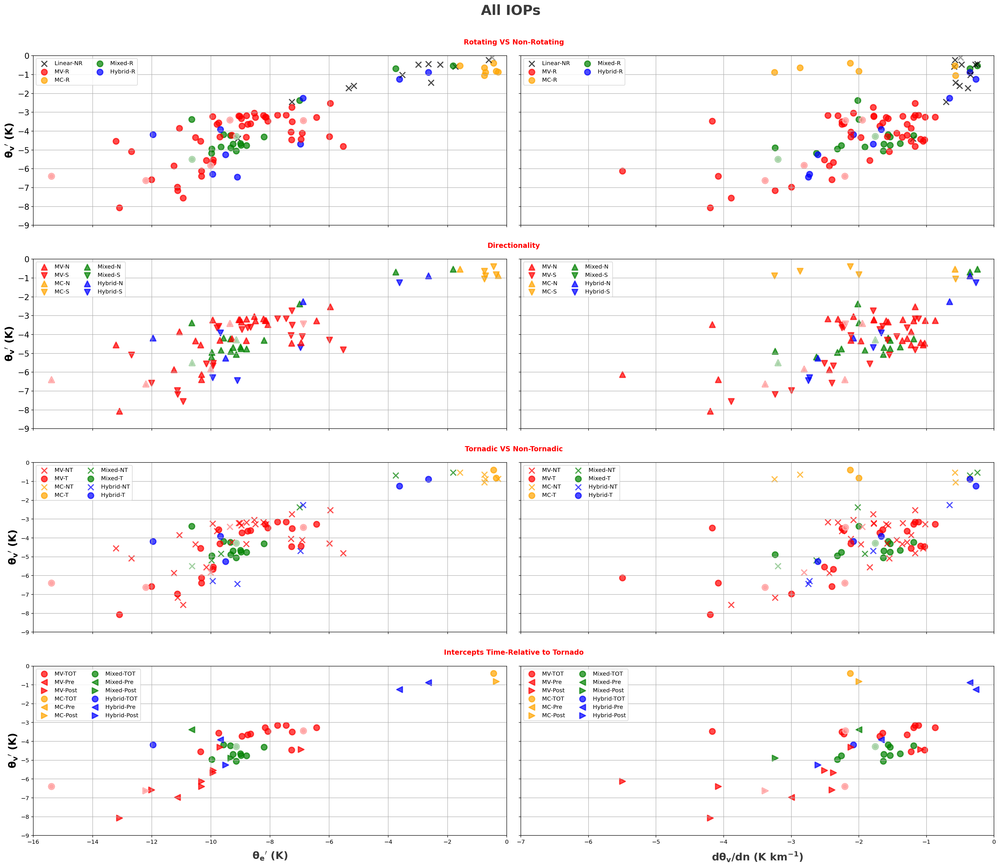

In [142]:
fig, axes = plt.subplots(4,2, figsize=(30,25), sharey=True, sharex='col')

for get_mode,get_dir,get_tor in zip(mode_functions,dir_functions,tor_functions):
    Linear_TE = get_mode('TE','Linear','NR')
    Linear_TV = get_mode('TV','Linear','NR')
    Linear_dTVdn = get_mode('dTVdn','Linear','NR')

    MV_TE_R = get_mode('TE','Mesovortex','R')
    MV_TV_R = get_mode('TV','Mesovortex','R')
    MV_dTVdn_R = get_mode('dTVdn','Mesovortex','R')

    MC_TE_R = get_mode('TE','Mesocyclone','R')
    MC_TV_R = get_mode('TV','Mesocyclone','R')
    MC_dTVdn_R = get_mode('dTVdn','Mesocyclone','R')

    Mixed_TE_R = get_mode('TE','Mixed','R')
    Mixed_TV_R = get_mode('TV','Mixed','R')
    Mixed_dTVdn_R = get_mode('dTVdn','Mixed','R')

    Hybrid_TE_R = get_mode('TE','Hybrid','R')
    Hybrid_TV_R = get_mode('TV','Hybrid','R')
    Hybrid_dTVdn_R = get_mode('dTVdn','Hybrid','R')
    
    MV_TE_N = get_dir('TE','Mesovortex','R','N')
    MV_TE_S = get_dir('TE','Mesovortex','R','S')
    MV_TV_N = get_dir('TV','Mesovortex','R','N')
    MV_TV_S = get_dir('TV','Mesovortex','R','S')
    MV_dTVdn_N = get_dir('dTVdn','Mesovortex','R','N')
    MV_dTVdn_S = get_dir('dTVdn','Mesovortex','R','S')

    MC_TE_N = get_dir('TE','Mesocyclone','R','N')
    MC_TE_S = get_dir('TE','Mesocyclone','R','S')
    MC_TV_N = get_dir('TV','Mesocyclone','R','N')
    MC_TV_S = get_dir('TV','Mesocyclone','R','S')
    MC_dTVdn_N = get_dir('dTVdn','Mesocyclone','R','N')
    MC_dTVdn_S = get_dir('dTVdn','Mesocyclone','R','S')

    Mixed_TE_N = get_dir('TE','Mixed','R','N')
    Mixed_TE_S = get_dir('TE','Mixed','R','S')
    Mixed_TV_N = get_dir('TV','Mixed','R','N')
    Mixed_TV_S = get_dir('TV','Mixed','R','S')
    Mixed_dTVdn_N = get_dir('dTVdn','Mixed','R','N')
    Mixed_dTVdn_S = get_dir('dTVdn','Mixed','R','S')

    Hybrid_TE_N = get_dir('TE','Hybrid','R','N')
    Hybrid_TE_S = get_dir('TE','Hybrid','R','S')
    Hybrid_TV_N = get_dir('TV','Hybrid','R','N')
    Hybrid_TV_S = get_dir('TV','Hybrid','R','S')
    Hybrid_dTVdn_N = get_dir('dTVdn','Hybrid','R','N')
    Hybrid_dTVdn_S = get_dir('dTVdn','Hybrid','R','S')
    
    MV_TE_NT = get_tor('TE','Mesovortex','R','NT')
    MV_TV_NT = get_tor('TV','Mesovortex','R','NT')
    MV_dTVdn_NT = get_tor('dTVdn','Mesovortex','R','NT')
    MV_TE_TOT = get_tor('TE','Mesovortex','R','TOT')
    MV_TV_TOT = get_tor('TV','Mesovortex','R','TOT')
    MV_dTVdn_TOT = get_tor('dTVdn','Mesovortex','R','TOT')
    MV_TE_Pre = get_tor('TE','Mesovortex','R','Pre')
    MV_TV_Pre = get_tor('TV','Mesovortex','R','Pre')
    MV_dTVdn_Pre = get_tor('dTVdn','Mesovortex','R','Pre')
    MV_TE_Post = get_tor('TE','Mesovortex','R','Post')
    MV_TV_Post = get_tor('TV','Mesovortex','R','Post')
    MV_dTVdn_Post = get_tor('dTVdn','Mesovortex','R','Post')

    MC_TE_NT = get_tor('TE','Mesocyclone','R','NT')
    MC_TV_NT = get_tor('TV','Mesocyclone','R','NT')
    MC_dTVdn_NT = get_tor('dTVdn','Mesocyclone','R','NT')
    MC_TE_TOT = get_tor('TE','Mesocyclone','R','TOT')
    MC_TV_TOT = get_tor('TV','Mesocyclone','R','TOT')
    MC_dTVdn_TOT = get_tor('dTVdn','Mesocyclone','R','TOT')
    MC_TE_Pre = get_tor('TE','Mesocyclone','R','Pre')
    MC_TV_Pre = get_tor('TV','Mesocyclone','R','Pre')
    MC_dTVdn_Pre = get_tor('dTVdn','Mesocyclone','R','Pre')
    MC_TE_Post = get_tor('TE','Mesocyclone','R','Post')
    MC_TV_Post = get_tor('TV','Mesocyclone','R','Post')
    MC_dTVdn_Post = get_tor('dTVdn','Mesocyclone','R','Post')

    Mixed_TE_NT = get_tor('TE','Mixed','R','NT')
    Mixed_TV_NT = get_tor('TV','Mixed','R','NT')
    Mixed_dTVdn_NT = get_tor('dTVdn','Mixed','R','NT')
    Mixed_TE_TOT = get_tor('TE','Mixed','R','TOT')
    Mixed_TV_TOT = get_tor('TV','Mixed','R','TOT')
    Mixed_dTVdn_TOT = get_tor('dTVdn','Mixed','R','TOT')
    Mixed_TE_Pre = get_tor('TE','Mixed','R','Pre')
    Mixed_TV_Pre = get_tor('TV','Mixed','R','Pre')
    Mixed_dTVdn_Pre = get_tor('dTVdn','Mixed','R','Pre')
    Mixed_TE_Post = get_tor('TE','Mixed','R','Post')
    Mixed_TV_Post = get_tor('TV','Mixed','R','Post')
    Mixed_dTVdn_Post = get_tor('dTVdn','Mixed','R','Post')

    Hybrid_TE_NT = get_tor('TE','Hybrid','R','NT')
    Hybrid_TV_NT = get_tor('TV','Hybrid','R','NT')
    Hybrid_dTVdn_NT = get_tor('dTVdn','Hybrid','R','NT')
    Hybrid_TE_TOT = get_tor('TE','Hybrid','R','TOT')
    Hybrid_TV_TOT = get_tor('TV','Hybrid','R','TOT')
    Hybrid_dTVdn_TOT = get_tor('dTVdn','Hybrid','R','TOT')
    Hybrid_TE_Pre = get_tor('TE','Hybrid','R','Pre')
    Hybrid_TV_Pre = get_tor('TV','Hybrid','R','Pre')
    Hybrid_dTVdn_Pre = get_tor('dTVdn','Hybrid','R','Pre')
    Hybrid_TE_Post = get_tor('TE','Hybrid','R','Post')
    Hybrid_TV_Post = get_tor('TV','Hybrid','R','Post')
    Hybrid_dTVdn_Post = get_tor('dTVdn','Hybrid','R','Post')

    a1=axes[0,0].scatter(Linear_TE,Linear_TV,marker='x',color='k',s=100,alpha=0.7,linewidth=2, label = 'Linear-NR')
    a3=axes[0,0].scatter(MV_TE_R, MV_TV_R, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-R')
    a5=axes[0,0].scatter(MC_TE_R, MC_TV_R, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-R')
    a7=axes[0,0].scatter(Mixed_TE_R, Mixed_TV_R, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-R')
    a9=axes[0,0].scatter(Hybrid_TE_R, Hybrid_TV_R, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-R')
    axes[0,1].scatter(Linear_dTVdn,Linear_TV,marker='x',color='k',s=100,alpha=0.7,linewidth=2, label = 'Linear-NR')
    axes[0,1].scatter(MV_dTVdn_R, MV_TV_R, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-R')
    axes[0,1].scatter(MC_dTVdn_R, MC_TV_R, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-R')
    axes[0,1].scatter(Mixed_dTVdn_R, Mixed_TV_R, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-R')
    axes[0,1].scatter(Hybrid_dTVdn_R, Hybrid_TV_R, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-R')

    d1=axes[1,0].scatter(MV_TE_N, MV_TV_N, marker='^',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-N')
    d2=axes[1,0].scatter(MV_TE_S, MV_TV_S, marker='v',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-S')
    d3=axes[1,0].scatter(MC_TE_N, MC_TV_N, marker='^',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-N')
    d4=axes[1,0].scatter(MC_TE_S, MC_TV_S, marker='v',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-S')
    d5=axes[1,0].scatter(Mixed_TE_N, Mixed_TV_N, marker='^',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-N')
    d6=axes[1,0].scatter(Mixed_TE_S, Mixed_TV_S, marker='v',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-S')
    d7=axes[1,0].scatter(Hybrid_TE_N, Hybrid_TV_N, marker='^',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-N')
    d8=axes[1,0].scatter(Hybrid_TE_S, Hybrid_TV_S, marker='v',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-S')
    axes[1,1].scatter(MV_dTVdn_N, MV_TV_N, marker='^',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-N')
    axes[1,1].scatter(MV_dTVdn_S, MV_TV_S, marker='v',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-S')
    axes[1,1].scatter(MC_dTVdn_N, MC_TV_N, marker='^',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-N')
    axes[1,1].scatter(MC_dTVdn_S, MC_TV_S, marker='v',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-S')
    axes[1,1].scatter(Mixed_dTVdn_N, Mixed_TV_N, marker='^',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-N')
    axes[1,1].scatter(Mixed_dTVdn_S, Mixed_TV_S, marker='v',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-S')
    axes[1,1].scatter(Hybrid_dTVdn_N, Hybrid_TV_N, marker='^',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-N')
    axes[1,1].scatter(Hybrid_dTVdn_S, Hybrid_TV_S, marker='v',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-S')

    C1=axes[2,0].scatter(MV_TE_NT, MV_TV_NT, marker='x',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-NT')
    C2=axes[2,0].scatter(MV_TE_TOT, MV_TV_TOT, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-T')
    axes[2,0].scatter(MV_TE_Pre, MV_TV_Pre, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Pre')
    axes[2,0].scatter(MV_TE_Post, MV_TV_Post, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Post')
    C3=axes[2,0].scatter(MC_TE_NT, MC_TV_NT, marker='x',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-NT')
    C4=axes[2,0].scatter(MC_TE_TOT, MC_TV_TOT, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-T')
    axes[2,0].scatter(MC_TE_Pre, MC_TV_Pre, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Pre')
    axes[2,0].scatter(MC_TE_Post, MC_TV_Post, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Post')
    C5=axes[2,0].scatter(Mixed_TE_NT, Mixed_TV_NT, marker='x',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-NT')
    C6=axes[2,0].scatter(Mixed_TE_TOT, Mixed_TV_TOT, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-T')
    axes[2,0].scatter(Mixed_TE_Pre, Mixed_TV_Pre, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Pre')
    axes[2,0].scatter(Mixed_TE_Post, Mixed_TV_Post, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Post')
    C7=axes[2,0].scatter(Hybrid_TE_NT, Hybrid_TV_NT, marker='x',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-NT')
    C8=axes[2,0].scatter(Hybrid_TE_TOT, Hybrid_TV_TOT, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-T')
    axes[2,0].scatter(Hybrid_TE_Pre, Hybrid_TV_Pre, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Pre')
    axes[2,0].scatter(Hybrid_TE_Post, Hybrid_TV_Post, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Post')
    axes[2,1].scatter(MV_dTVdn_NT, MV_TV_NT, marker='x',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-NT')
    axes[2,1].scatter(MV_dTVdn_TOT, MV_TV_TOT, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-TOT')
    axes[2,1].scatter(MV_dTVdn_Pre, MV_TV_Pre, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Pre')
    axes[2,1].scatter(MV_dTVdn_Post, MV_TV_Post, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Post')
    axes[2,1].scatter(MC_dTVdn_NT, MC_TV_NT, marker='x',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-NT')
    axes[2,1].scatter(MC_dTVdn_TOT, MC_TV_TOT, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-TOT')
    axes[2,1].scatter(MC_dTVdn_Pre, MC_TV_Pre, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Pre')
    axes[2,1].scatter(MC_dTVdn_Post, MC_TV_Post, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Post')
    axes[2,1].scatter(Mixed_dTVdn_NT, Mixed_TV_NT, marker='x',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-NT')
    axes[2,1].scatter(Mixed_dTVdn_TOT, Mixed_TV_TOT, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-TOT')
    axes[2,1].scatter(Mixed_dTVdn_Pre, Mixed_TV_Pre, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Pre')
    axes[2,1].scatter(Mixed_dTVdn_Post, Mixed_TV_Post, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Post')
    axes[2,1].scatter(Hybrid_dTVdn_NT, Hybrid_TV_NT, marker='x',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-NT')
    axes[2,1].scatter(Hybrid_dTVdn_TOT, Hybrid_TV_TOT, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-TOT')
    axes[2,1].scatter(Hybrid_dTVdn_Pre, Hybrid_TV_Pre, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Pre')
    axes[2,1].scatter(Hybrid_dTVdn_Post, Hybrid_TV_Post, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Post')

    b1=axes[3,0].scatter(MV_TE_TOT, MV_TV_TOT, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-TOT')
    b2=axes[3,0].scatter(MV_TE_Pre, MV_TV_Pre, marker='<',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Pre')
    b3=axes[3,0].scatter(MV_TE_Post, MV_TV_Post, marker='>',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Post')
    b4=axes[3,0].scatter(MC_TE_TOT, MC_TV_TOT, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-TOT')
    b5=axes[3,0].scatter(MC_TE_Pre, MC_TV_Pre, marker='<',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Pre')
    b6=axes[3,0].scatter(MC_TE_Post, MC_TV_Post, marker='>',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Post')
    b7=axes[3,0].scatter(Mixed_TE_TOT, Mixed_TV_TOT, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-TOT')
    b8=axes[3,0].scatter(Mixed_TE_Pre, Mixed_TV_Pre, marker='<',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Pre')
    b9=axes[3,0].scatter(Mixed_TE_Post, Mixed_TV_Post, marker='>',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Post')
    b10=axes[3,0].scatter(Hybrid_TE_TOT, Hybrid_TV_TOT, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-TOT')
    b11=axes[3,0].scatter(Hybrid_TE_Pre, Hybrid_TV_Pre, marker='<',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Pre')
    b12=axes[3,0].scatter(Hybrid_TE_Post, Hybrid_TV_Post, marker='>',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Post')
    axes[3,1].scatter(MV_dTVdn_TOT, MV_TV_TOT, marker='o',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-TOT')
    axes[3,1].scatter(MV_dTVdn_Pre, MV_TV_Pre, marker='<',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Pre')
    axes[3,1].scatter(MV_dTVdn_Post, MV_TV_Post, marker='>',color='red',s=100,alpha=0.7,linewidth=2,label = 'MV-Post')
    axes[3,1].scatter(MC_dTVdn_TOT, MC_TV_TOT, marker='o',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-TOT')
    axes[3,1].scatter(MC_dTVdn_Pre, MC_TV_Pre, marker='<',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Pre')
    axes[3,1].scatter(MC_dTVdn_Post, MC_TV_Post, marker='>',color='orange',s=100,alpha=0.7,linewidth=2,label = 'MC-Post')
    axes[3,1].scatter(Mixed_dTVdn_TOT, Mixed_TV_TOT, marker='o',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-TOT')
    axes[3,1].scatter(Mixed_dTVdn_Pre, Mixed_TV_Pre, marker='<',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Pre')
    axes[3,1].scatter(Mixed_dTVdn_Post, Mixed_TV_Post, marker='>',color='green',s=100,alpha=0.7,linewidth=2,label = 'Mixed-Post')
    axes[3,1].scatter(Hybrid_dTVdn_TOT, Hybrid_TV_TOT, marker='o',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-TOT')
    axes[3,1].scatter(Hybrid_dTVdn_Pre, Hybrid_TV_Pre, marker='<',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Pre')
    axes[3,1].scatter(Hybrid_dTVdn_Post, Hybrid_TV_Post, marker='>',color='blue',s=100,alpha=0.7,linewidth=2,label = 'Hybrid-Post')
    
for i in (sns1.index):
    if (i == '104A'):
        axes[0,0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-R')
        axes[0,1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-R')
        axes[1,0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
        axes[1,1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
        axes[2,0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-NT')
        axes[2,1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-NT')
    
        axes[0,0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[0,1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[1,0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='v',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-S')
        axes[1,1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='v',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-S')
        axes[2,0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-T')
        axes[2,1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
        axes[3,0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
        axes[3,1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
        
        axes[0,0].scatter(sns3.loc[i]['TE'], sns3.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[0,1].scatter(sns3.loc[i]['dTVdn'], sns3.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[1,0].scatter(sns3.loc[i]['TE'], sns3.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[1,1].scatter(sns3.loc[i]['dTVdn'], sns3.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[2,0].scatter(sns3.loc[i]['TE'], sns3.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        axes[2,1].scatter(sns3.loc[i]['dTVdn'], sns3.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        
        axes[0,0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[0,1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[1,0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[1,1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[2,0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')
        axes[2,1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')
        axes[3,0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='>',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')
        axes[3,1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='>',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')

    if (i == '109A'):
        axes[0,0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-R')
        axes[0,1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-R')
        axes[1,0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
        axes[1,1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
        axes[2,0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-T')
        axes[2,1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-TOT')
        axes[3,0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-TOT')
        axes[3,1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-TOT')

        axes[0,0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[0,1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[1,0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[1,1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[2,0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        axes[2,1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        
        axes[0,0].scatter(sns3.loc[i]['TE'], sns3.loc[i]['TV'],marker='x',color='w',alpha=0.5,s=100,linewidth=2, label = 'Linear-NR')
        axes[0,1].scatter(sns3.loc[i]['dTVdn'], sns3.loc[i]['TV'],marker='x',color='w',alpha=0.5,s=100,linewidth=2, label = 'Linear-NR')
        
        axes[0,0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[0,1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-R')
        axes[1,0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[1,1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[2,0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
        axes[2,1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
        axes[3,0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
        axes[3,1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')

axes[0,0].set_ylim((-9,0))
axes[0,0].set_xlim((-16,0))
axes[0,0].grid()
axes[0,1].set_xlim((-7,0))
axes[0,1].grid()
axes[1,0].grid()
axes[1,1].grid() 
axes[2,0].grid()
axes[2,1].grid() 
axes[3,0].grid()
axes[3,1].grid() 
axes[0,0].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
axes[0,0].tick_params(axis='y',labelsize=14)
axes[0,0].tick_params(axis='x',labelsize=14)
axes[3,0].set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
axes[1,0].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
axes[2,0].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
axes[3,0].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
axes[1,0].tick_params(axis='y',labelsize=14)
axes[1,0].tick_params(axis='x',labelsize=14)
axes[3,1].set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
axes[1,1].tick_params(axis='y',labelsize=14)
axes[1,1].tick_params(axis='x',labelsize=14)
axes[0,0].legend(handles=[a1,a3,a5,a7,a9],ncol=2,prop={'size': 10},loc='upper left')
axes[0,1].legend(handles=[a1,a3,a5,a7,a9],ncol=2,prop={'size': 10},loc='upper left')
axes[1,0].legend(handles=[d1,d2,d3,d4,d5,d6,d7,d8],ncol=2,prop={'size': 10},loc='upper left')
axes[1,1].legend(handles=[d1,d2,d3,d4,d5,d6,d7,d8],ncol=2,prop={'size': 10},loc='upper left')
axes[2,0].legend(handles=[C1,C2,C3,C4,C5,C6,C7,C8],ncol=2,prop={'size': 10},loc='upper left')
axes[2,1].legend(handles=[C1,C2,C3,C4,C5,C6,C7,C8],ncol=2,prop={'size': 10},loc='upper left')
axes[3,0].legend(handles=[b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12],ncol=2,prop={'size': 10},loc='upper left')
axes[3,1].legend(handles=[b1,b2,b3,b4,b5,b6,b7,b8,b9,b10,b11,b12],ncol=2,prop={'size': 10},loc='upper left')
plt.subplots_adjust(wspace=.03)
plt.suptitle('All IOPs', fontsize=24, weight='bold', color='#3a3a3a', y=.93, x=.51)

from matplotlib.gridspec import SubplotSpec

def create_subtitle(fig: plt.Figure, grid: SubplotSpec, title: str):
    "Sign sets of subplots with title"
    row = fig.add_subplot(grid)
    # the '\n' is important
    row.set_title(f'{title}\n', fontweight='semibold', color='r')
    # hide subplot
    row.set_frame_on(False)
    row.axis('off')
    
grid = plt.GridSpec(4, 2)
create_subtitle(fig, grid[0, 0:2], 'Rotating VS Non-Rotating')
create_subtitle(fig, grid[1, 0:2], 'Directionality')
create_subtitle(fig, grid[2, 0:2], 'Tornadic VS Non-Tornadic')
create_subtitle(fig, grid[3, 0:2], 'Intercepts Time-Relative to Tornado')


#plt.savefig('{0}AllIOPs_scatter.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [51]:
MVTE_PRE

[array([], dtype=float64),
 array([], dtype=float64),
 array([], dtype=float64),
 array([-11.13]),
 array([], dtype=float64),
 array([], dtype=float64),
 array([], dtype=float64)]

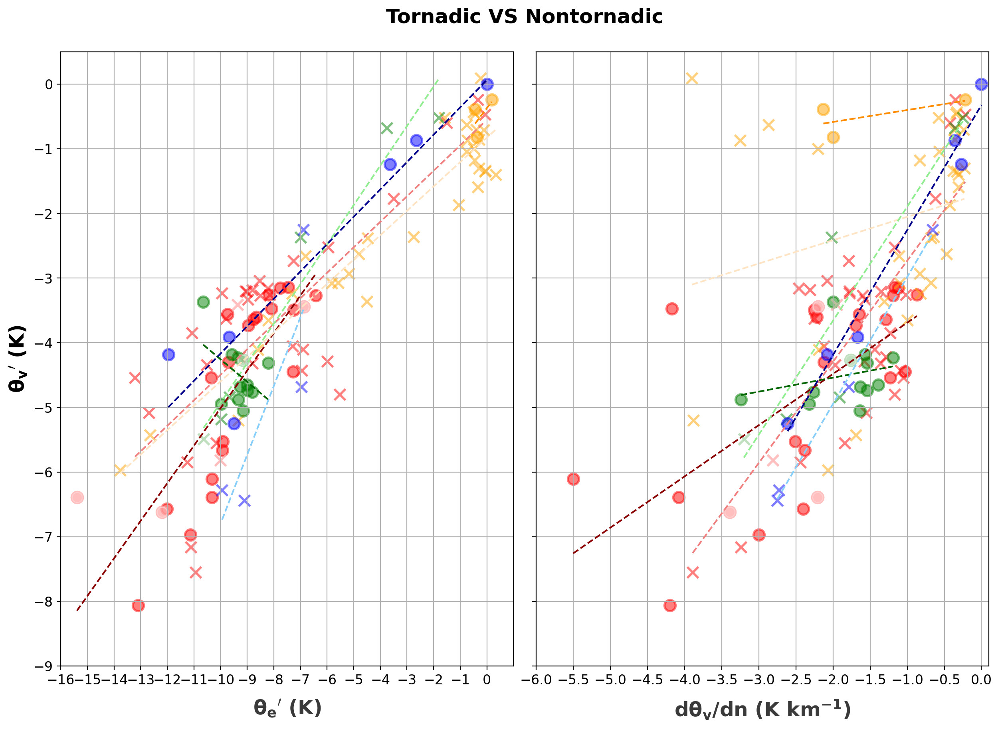

In [40]:
fig, axes = plt.subplots(1,2, figsize=(15,10), sharey=True)


# a11=axes[0].scatter(np.concatenate(LTE),np.concatenate(LTV),marker='x',color='k',s=100,alpha=0.5,linewidth=2, label = 'NR')
# a33=axes[0].scatter(np.concatenate(MVTE), np.concatenate(MVTV), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV')
# a55=axes[0].scatter(np.concatenate(MCTE), np.concatenate(MCTV), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC')
# a77=axes[0].scatter(np.concatenate(MTE), np.concatenate(MTV), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed')
# a99=axes[0].scatter(np.concatenate(HTE), np.concatenate(HTV), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid')
# axes[1].scatter(np.concatenate(LDTV),np.concatenate(LTV),marker='x',color='k',s=100,alpha=0.5,linewidth=2, label = 'NR')
# axes[1].scatter(np.concatenate(MVDTV), np.concatenate(MVTV), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV')
# axes[1].scatter(np.concatenate(MCDTV), np.concatenate(MCTV), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC')
# axes[1].scatter(np.concatenate(MDTV), np.concatenate(MTV), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed')
# axes[1].scatter(np.concatenate(HDTV), np.concatenate(HTV), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid')

# a1, b1 = np.polyfit(np.concatenate(LTE), np.concatenate(LTV), 1)
# a2, b2 = np.polyfit(np.concatenate(MVTE), np.concatenate(MVTV), 1)
# a3, b3 = np.polyfit(np.concatenate(MCTE), np.concatenate(MCTV), 1)
# a4, b4 = np.polyfit(np.concatenate(MTE), np.concatenate(MTV), 1)
# a5, b5 = np.polyfit(np.concatenate(HTE), np.concatenate(HTV), 1)
# a6, b6 = np.polyfit(np.concatenate(LDTV), np.concatenate(LTV), 1)
# a7, b7 = np.polyfit(np.concatenate(MVDTV), np.concatenate(MVTV), 1)
# a8, b8 = np.polyfit(np.concatenate(MCDTV), np.concatenate(MCTV), 1)
# a9, b9 = np.polyfit(np.concatenate(MDTV), np.concatenate(MTV), 1)
# a10, b10 = np.polyfit(np.concatenate(HDTV), np.concatenate(HTV), 1)

# axes[0].plot(sort(np.concatenate(LTE)), a1*sort(np.concatenate(LTE))+b1, ls='--',color='k')
# axes[0].plot(sort(np.concatenate(MVTE)), a2*sort(np.concatenate(MVTE))+b2, ls='--',color='red')
# axes[0].plot(sort(np.concatenate(MCTE)), a3*sort(np.concatenate(MCTE))+b3, ls='--',color='orange')
# axes[0].plot(sort(np.concatenate(MTE)), a4*sort(np.concatenate(MTE))+b4, ls='--',color='green')
# axes[0].plot(sort(np.concatenate(HTE)), a5*sort(np.concatenate(HTE))+b5, ls='--',color='blue')
# axes[1].plot(sort(np.concatenate(LDTV)), a6*sort(np.concatenate(LDTV))+b6, ls='--',color='k')
# axes[1].plot(sort(np.concatenate(MVDTV)), a7*sort(np.concatenate(MVDTV))+b7, ls='--',color='red')
# axes[1].plot(sort(np.concatenate(MCDTV)), a8*sort(np.concatenate(MCDTV))+b8, ls='--',color='orange')
# axes[1].plot(sort(np.concatenate(MDTV)), a9*sort(np.concatenate(MDTV))+b9, ls='--',color='green')
# axes[1].plot(sort(np.concatenate(HDTV)), a10*sort(np.concatenate(HDTV))+b10, ls='--',color='blue')
    
# d1=axes[0].scatter(np.concatenate(MVTE_N), np.concatenate(MVTV_N), marker='^',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-N')
# d2=axes[0].scatter(np.concatenate(MVTE_S), np.concatenate(MVTV_S), marker='v',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-S')
# d3=axes[0].scatter(np.concatenate(MCTE_N), np.concatenate(MCTV_N), marker='^',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-N')
# d4=axes[0].scatter(np.concatenate(MCTE_S), np.concatenate(MCTV_S), marker='v',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-S')
# d5=axes[0].scatter(np.concatenate(MTE_N), np.concatenate(MTV_N), marker='^',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-N')
# # d6=axes[0].scatter(np.concatenate(MTE_S), np.concatenate(MTV_S), marker='v',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-S')
# d7=axes[0].scatter(np.concatenate(HTE_N), np.concatenate(HTV_N), marker='^',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-N')
# d8=axes[0].scatter(np.concatenate(HTE_S), np.concatenate(HTV_S), marker='v',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-S')
# axes[1].scatter(np.concatenate(MVDTV_N), np.concatenate(MVTV_N), marker='^',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-N')
# axes[1].scatter(np.concatenate(MVDTV_S), np.concatenate(MVTV_S), marker='v',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-S')
# axes[1].scatter(np.concatenate(MCDTV_N), np.concatenate(MCTV_N), marker='^',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-N')
# axes[1].scatter(np.concatenate(MCDTV_S), np.concatenate(MCTV_S), marker='v',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-S')
# axes[1].scatter(np.concatenate(MDTV_N), np.concatenate(MTV_N), marker='^',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-N')
# axes[1].scatter(np.concatenate(MDTV_S), np.concatenate(MTV_S), marker='v',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-S')
# axes[1].scatter(np.concatenate(HDTV_N), np.concatenate(HTV_N), marker='^',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-N')
# axes[1].scatter(np.concatenate(HDTV_S), np.concatenate(HTV_S), marker='v',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-S')

# a1, b1 = np.polyfit(np.concatenate(MVTE_N), np.concatenate(MVTV_N), 1)
# a2, b2 = np.polyfit(np.concatenate(MVTE_S), np.concatenate(MVTV_S), 1)
# a3, b3 = np.polyfit(np.concatenate(MCTE_N), np.concatenate(MCTV_N), 1)
# a4, b4 = np.polyfit(np.concatenate(MCTE_S), np.concatenate(MCTV_S), 1)
# a5, b5 = np.polyfit(np.concatenate(MTE_N), np.concatenate(MTV_N), 1)
# #a6, b6 = np.polyfit(np.concatenate(MTE_S), np.concatenate(MTV_S), 1)
# a7, b7 = np.polyfit(np.concatenate(HTE_N), np.concatenate(HTV_N), 1)
# a8, b8 = np.polyfit(np.concatenate(HTE_S), np.concatenate(HTV_S), 1)

# a9, b9 = np.polyfit(np.concatenate(MVDTV_N), np.concatenate(MVTV_N), 1)
# a10, b10 = np.polyfit(np.concatenate(MVDTV_S), np.concatenate(MVTV_S), 1)
# a11, b11 = np.polyfit(np.concatenate(MCDTV_N), np.concatenate(MCTV_N), 1)
# a12, b12 = np.polyfit(np.concatenate(MCDTV_S), np.concatenate(MCTV_S), 1)
# a13, b13 = np.polyfit(np.concatenate(MDTV_N), np.concatenate(MTV_N), 1)
# #a14, b14 = np.polyfit(np.concatenate(MDTV_S), np.concatenate(MTV_S), 1)
# a15, b15 = np.polyfit(np.concatenate(HDTV_N), np.concatenate(HTV_N), 1)
# a16, b16 = np.polyfit(np.concatenate(HDTV_S), np.concatenate(HTV_S), 1)

# axes[0].plot(sort(np.concatenate(MVTE_N)), a1*sort(np.concatenate(MVTE_N))+b1, ls='--',color='darkred')
# axes[0].plot(sort(np.concatenate(MVTE_S)), a2*sort(np.concatenate(MVTE_S))+b2, ls='--',color='lightcoral')
# axes[0].plot(sort(np.concatenate(MCTE_N)), a3*sort(np.concatenate(MCTE_N))+b3, ls='--',color='darkorange')
# axes[0].plot(sort(np.concatenate(MCTE_S)), a4*sort(np.concatenate(MCTE_S))+b4, ls='--',color='bisque')
# axes[0].plot(sort(np.concatenate(MTE_N)), a5*sort(np.concatenate(MTE_N))+b5, ls='--',color='darkgreen')
# axes[0].plot(sort(np.concatenate(MTE_S)), a6*sort(np.concatenate(MTE_S))+b6, ls='--',color='lightgreen')
# axes[0].plot(sort(np.concatenate(HTE_N)), a7*sort(np.concatenate(HTE_N))+b7, ls='--',color='darkblue')
# axes[0].plot(sort(np.concatenate(HTE_S)), a8*sort(np.concatenate(HTE_S))+b8, ls='--',color='lightskyblue')

# axes[1].plot(sort(np.concatenate(MVDTV_N)), a9*sort(np.concatenate(MVDTV_N))+b9, ls='--',color='darkred')
# axes[1].plot(sort(np.concatenate(MVDTV_S)), a10*sort(np.concatenate(MVDTV_S))+b10, ls='--',color='lightcoral')
# axes[1].plot(sort(np.concatenate(MCDTV_N)), a11*sort(np.concatenate(MCDTV_N))+b11, ls='--',color='darkorange')
# axes[1].plot(sort(np.concatenate(MCDTV_S)), a12*sort(np.concatenate(MCDTV_S))+b12, ls='--',color='bisque')
# axes[1].plot(sort(np.concatenate(MDTV_N)), a13*sort(np.concatenate(MDTV_N))+b13, ls='--',color='darkgreen')
# #axes[1].plot(sort(np.concatenate(MDTV_S)), a14*sort(np.concatenate(MDTV_S))+b14, ls='--',color='lightgreen')
# axes[1].plot(sort(np.concatenate(HDTV_N)), a15*sort(np.concatenate(HDTV_N))+b15, ls='--',color='darkblue')
# axes[1].plot(sort(np.concatenate(HDTV_S)), a16*sort(np.concatenate(HDTV_S))+b16, ls='--',color='lightskyblue')

# d1=axes[0].scatter(np.concatenate(MVTE_T_N), np.concatenate(MVTV_T_N), marker='^',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-T-N')
# d2=axes[0].scatter(np.concatenate(MVTE_T_S), np.concatenate(MVTV_T_S), marker='v',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-T-S')
# # d3=axes[0].scatter(np.concatenate(MCTE_T_N), np.concatenate(MCTV_T_N), marker='^',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT-N')
# d4=axes[0].scatter(np.concatenate(MCTE_T_S), np.concatenate(MCTV_T_S), marker='v',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT-S')
# d5=axes[0].scatter(np.concatenate(MTE_T_N), np.concatenate(MTV_T_N), marker='^',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-T-N')
# # d6=axes[0].scatter(np.concatenate(MTE_T_S), np.concatenate(MTV_T_S), marker='v',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-NT-S')
# d7=axes[0].scatter(np.concatenate(HTE_T_N), np.concatenate(HTV_T_N), marker='^',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-T-N')
# d8=axes[0].scatter(np.concatenate(HTE_T_S), np.concatenate(HTV_T_S), marker='v',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-T-S')
# axes[1].scatter(np.concatenate(MVDTV_T_N), np.concatenate(MVTV_T_N), marker='^',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-T-N')
# axes[1].scatter(np.concatenate(MVDTV_T_S), np.concatenate(MVTV_T_S), marker='v',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-T-S')
# # axes[1].scatter(np.concatenate(MCDTV_T_N), np.concatenate(MCTV_T_N), marker='^',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT-N')
# axes[1].scatter(np.concatenate(MCDTV_T_S), np.concatenate(MCTV_T_S), marker='v',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT-S')
# axes[1].scatter(np.concatenate(MDTV_T_N), np.concatenate(MTV_T_N), marker='^',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-T-N')
# # axes[1].scatter(np.concatenate(MDTV_T_S), np.concatenate(MTV_T_S), marker='v',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-NT-S')
# axes[1].scatter(np.concatenate(HDTV_T_N), np.concatenate(HTV_T_N), marker='^',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-T-N')
# axes[1].scatter(np.concatenate(HDTV_T_S), np.concatenate(HTV_T_S), marker='v',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-T-S')

# a1, b1 = np.polyfit(np.concatenate(MVTE_T_N), np.concatenate(MVTV_T_N), 1)
# a2, b2 = np.polyfit(np.concatenate(MVTE_T_S), np.concatenate(MVTV_T_S), 1)
# # a3, b3 = np.polyfit(np.concatenate(MCTE_T_N), np.concatenate(MCTV_T_N), 1)
# a4, b4 = np.polyfit(np.concatenate(MCTE_T_S), np.concatenate(MCTV_T_S), 1)
# a5, b5 = np.polyfit(np.concatenate(MTE_T_N), np.concatenate(MTV_T_N), 1)
# #a6, b6 = np.polyfit(np.concatenate(MTE_T_S), np.concatenate(MTV_T_S), 1)
# a7, b7 = np.polyfit(np.concatenate(HTE_T_N), np.concatenate(HTV_T_N), 1)
# a8, b8 = np.polyfit(np.concatenate(HTE_T_S), np.concatenate(HTV_T_S), 1)

# a9, b9 = np.polyfit(np.concatenate(MVDTV_T_N), np.concatenate(MVTV_T_N), 1)
# a10, b10 = np.polyfit(np.concatenate(MVDTV_T_S), np.concatenate(MVTV_T_S), 1)
# # a11, b11 = np.polyfit(np.concatenate(MCDTV_T_N), np.concatenate(MCTV_T_N), 1)
# a12, b12 = np.polyfit(np.concatenate(MCDTV_T_S), np.concatenate(MCTV_T_S), 1)
# a13, b13 = np.polyfit(np.concatenate(MDTV_T_N), np.concatenate(MTV_T_N), 1)
# #a14, b14 = np.polyfit(np.concatenate(MDTV_T_S), np.concatenate(MTV_T_S), 1)
# a15, b15 = np.polyfit(np.concatenate(HDTV_T_N), np.concatenate(HTV_T_N), 1)
# a16, b16 = np.polyfit(np.concatenate(HDTV_T_S), np.concatenate(HTV_T_S), 1)

# axes[0].plot(sort(np.concatenate(MVTE_T_N)), a1*sort(np.concatenate(MVTE_T_N))+b1, ls='--',color='darkred')
# axes[0].plot(sort(np.concatenate(MVTE_T_S)), a2*sort(np.concatenate(MVTE_T_S))+b2, ls='--',color='lightcoral')
# # axes[0].plot(sort(np.concatenate(MCTE_T_N)), a3*sort(np.concatenate(MCTE_T_N))+b3, ls='--',color='darkorange')
# axes[0].plot(sort(np.concatenate(MCTE_T_S)), a4*sort(np.concatenate(MCTE_T_S))+b4, ls='--',color='bisque')
# axes[0].plot(sort(np.concatenate(MTE_T_N)), a5*sort(np.concatenate(MTE_T_N))+b5, ls='--',color='darkgreen')
# #axes[0].plot(sort(np.concatenate(MTE_T_S)), a6*sort(np.concatenate(MTE_T_S))+b6, ls='--',color='lightgreen')
# axes[0].plot(sort(np.concatenate(HTE_T_N)), a7*sort(np.concatenate(HTE_T_N))+b7, ls='--',color='darkblue')
# axes[0].plot(sort(np.concatenate(HTE_T_S)), a8*sort(np.concatenate(HTE_T_S))+b8, ls='--',color='lightskyblue')

# axes[1].plot(sort(np.concatenate(MVDTV_T_N)), a9*sort(np.concatenate(MVDTV_T_N))+b9, ls='--',color='darkred')
# axes[1].plot(sort(np.concatenate(MVDTV_T_S)), a10*sort(np.concatenate(MVDTV_T_S))+b10, ls='--',color='lightcoral')
# # axes[1].plot(sort(np.concatenate(MCDTV_T_N)), a11*sort(np.concatenate(MCDTV_T_N))+b11, ls='--',color='darkorange')
# axes[1].plot(sort(np.concatenate(MCDTV_T_S)), a12*sort(np.concatenate(MCDTV_T_S))+b12, ls='--',color='bisque')
# axes[1].plot(sort(np.concatenate(MDTV_T_N)), a13*sort(np.concatenate(MDTV_T_N))+b13, ls='--',color='darkgreen')
# #axes[1].plot(sort(np.concatenate(MDTV_T_S)), a14*sort(np.concatenate(MDTV_T_S))+b14, ls='--',color='lightgreen')
# axes[1].plot(sort(np.concatenate(HDTV_T_N)), a15*sort(np.concatenate(HDTV_T_N))+b15, ls='--',color='darkblue')
# axes[1].plot(sort(np.concatenate(HDTV_T_S)), a16*sort(np.concatenate(HDTV_T_S))+b16, ls='--',color='lightskyblue')

# d11=axes[0].scatter(np.concatenate(MVTE_T_N1), np.concatenate(MVTV_T_N1), marker='^',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-NT-N')
# d22=axes[0].scatter(np.concatenate(MVTE_T_S1), np.concatenate(MVTV_T_S1), marker='v',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-NT-S')
# d3=axes[0].scatter(np.concatenate(MCTE_T_N1), np.concatenate(MCTV_T_N1), marker='^',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT-N')
# d4=axes[0].scatter(np.concatenate(MCTE_T_S1), np.concatenate(MCTV_T_S1), marker='v',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT-S')
# d55=axes[0].scatter(np.concatenate(MTE_T_N1), np.concatenate(MTV_T_N1), marker='^',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-NT-N')
# # d6=axes[0].scatter(np.concatenate(MTE_T_S), np.concatenate(MTV_T_S), marker='v',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-NT-S')
# d7=axes[0].scatter(np.concatenate(HTE_T_N1), np.concatenate(HTV_T_N1), marker='^',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-NT-N')
# d88=axes[0].scatter(np.concatenate(HTE_T_S1), np.concatenate(HTV_T_S1), marker='v',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-NT-S')
# axes[1].scatter(np.concatenate(MVDTV_T_N1), np.concatenate(MVTV_T_N1), marker='^',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-NT-N')
# axes[1].scatter(np.concatenate(MVDTV_T_S1), np.concatenate(MVTV_T_S1), marker='v',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-NT-S')
# axes[1].scatter(np.concatenate(MCDTV_T_N1), np.concatenate(MCTV_T_N1), marker='^',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT-N')
# axes[1].scatter(np.concatenate(MCDTV_T_S1), np.concatenate(MCTV_T_S1), marker='v',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT-S')
# axes[1].scatter(np.concatenate(MDTV_T_N1), np.concatenate(MTV_T_N1), marker='^',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-NT-N')
# # axes[1].scatter(np.concatenate(MDTV_T_S), np.concatenate(MTV_T_S), marker='v',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-NT-S')
# axes[1].scatter(np.concatenate(HDTV_T_N1), np.concatenate(HTV_T_N1), marker='^',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-NT-N')
# axes[1].scatter(np.concatenate(HDTV_T_S1), np.concatenate(HTV_T_S1), marker='v',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-NT-S')

# aa1, bb1 = np.polyfit(np.concatenate(MVTE_T_N1), np.concatenate(MVTV_T_N1), 1)
# aa2, bb2 = np.polyfit(np.concatenate(MVTE_T_S1), np.concatenate(MVTV_T_S1), 1)
# a3, b3 = np.polyfit(np.concatenate(MCTE_T_N1), np.concatenate(MCTV_T_N1), 1)
# a4, b4 = np.polyfit(np.concatenate(MCTE_T_S1), np.concatenate(MCTV_T_S1), 1)
# aa5, bb5 = np.polyfit(np.concatenate(MTE_T_N1), np.concatenate(MTV_T_N1), 1)
# #a6, b6 = np.polyfit(np.concatenate(MTE_T_S), np.concatenate(MTV_T_S), 1)
# a7, b7 = np.polyfit(np.concatenate(HTE_T_N), np.concatenate(HTV_T_N), 1)
# aa8, bb8 = np.polyfit(np.concatenate(HTE_T_S1), np.concatenate(HTV_T_S1), 1)

# aa9, bb9 = np.polyfit(np.concatenate(MVDTV_T_N1), np.concatenate(MVTV_T_N1), 1)
# aa10, bb10 = np.polyfit(np.concatenate(MVDTV_T_S1), np.concatenate(MVTV_T_S1), 1)
# a11, b11 = np.polyfit(np.concatenate(MCDTV_T_N1), np.concatenate(MCTV_T_N1), 1)
# a12, b12 = np.polyfit(np.concatenate(MCDTV_T_S1), np.concatenate(MCTV_T_S1), 1)
# aa13, bb13 = np.polyfit(np.concatenate(MDTV_T_N1), np.concatenate(MTV_T_N1), 1)
# #a14, b14 = np.polyfit(np.concatenate(MDTV_T_S), np.concatenate(MTV_T_S), 1)
# a15, b15 = np.polyfit(np.concatenate(HDTV_T_N), np.concatenate(HTV_T_N), 1)
# aa16, bb16 = np.polyfit(np.concatenate(HDTV_T_S1), np.concatenate(HTV_T_S1), 1)

# axes[0].plot(sort(np.concatenate(MVTE_T_N1)), aa1*sort(np.concatenate(MVTE_T_N1))+bb1, ls='--',color='darkred')
# axes[0].plot(sort(np.concatenate(MVTE_T_S1)), aa2*sort(np.concatenate(MVTE_T_S1))+bb2, ls='--',color='lightcoral')
# axes[0].plot(sort(np.concatenate(MCTE_T_N1)), a3*sort(np.concatenate(MCTE_T_N1))+b3, ls='--',color='darkorange')
# axes[0].plot(sort(np.concatenate(MCTE_T_S1)), a4*sort(np.concatenate(MCTE_T_S1))+b4, ls='--',color='bisque')
# axes[0].plot(sort(np.concatenate(MTE_T_N1)), aa5*sort(np.concatenate(MTE_T_N1))+bb5, ls='--',color='darkgreen')
# #axes[0].plot(sort(np.concatenate(MTE_T_S)), a6*sort(np.concatenate(MTE_T_S))+b6, ls='--',color='lightgreen')
# axes[0].plot(sort(np.concatenate(HTE_T_N)), a7*sort(np.concatenate(HTE_T_N))+b7, ls='--',color='darkblue')
# axes[0].plot(sort(np.concatenate(HTE_T_S1)), aa8*sort(np.concatenate(HTE_T_S1))+bb8, ls='--',color='lightskyblue')

# axes[1].plot(sort(np.concatenate(MVDTV_T_N1)), aa9*sort(np.concatenate(MVDTV_T_N1))+bb9, ls='--',color='darkred')
# axes[1].plot(sort(np.concatenate(MVDTV_T_S1)), aa10*sort(np.concatenate(MVDTV_T_S1))+bb10, ls='--',color='lightcoral')
# axes[1].plot(sort(np.concatenate(MCDTV_T_N1)), a11*sort(np.concatenate(MCDTV_T_N1))+b11, ls='--',color='darkorange')
# axes[1].plot(sort(np.concatenate(MCDTV_T_S1)), a12*sort(np.concatenate(MCDTV_T_S1))+b12, ls='--',color='bisque')
# axes[1].plot(sort(np.concatenate(MDTV_T_N1)), aa13*sort(np.concatenate(MDTV_T_N1))+bb13, ls='--',color='darkgreen')
# #axes[1].plot(sort(np.concatenate(MDTV_T_S)), a14*sort(np.concatenate(MDTV_T_S))+b14, ls='--',color='lightgreen')
# axes[1].plot(sort(np.concatenate(HDTV_T_N)), a15*sort(np.concatenate(HDTV_T_N))+b15, ls='--',color='darkblue')
# axes[1].plot(sort(np.concatenate(HDTV_T_S1)), aa16*sort(np.concatenate(HDTV_T_S1))+bb16, ls='--',color='lightskyblue')

C1=axes[0].scatter(np.concatenate(MVTE_NT), np.concatenate(MVTV_NT), marker='x',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-NT')
C2=axes[0].scatter(np.concatenate(MVTE_TOT), np.concatenate(MVTV_TOT), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-T')
axes[0].scatter(np.concatenate(MVTE_PRE), np.concatenate(MVTV_PRE), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-Pre')
axes[0].scatter(np.concatenate(MVTE_POST), np.concatenate(MVTV_POST), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-Post')
C3=axes[0].scatter(np.concatenate(MCTE_NT), np.concatenate(MCTV_NT), marker='x',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT')
C4=axes[0].scatter(np.concatenate(MCTE_TOT), np.concatenate(MCTV_TOT), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-T')
axes[0].scatter(np.concatenate(MCTE_PRE), np.concatenate(MCTV_PRE), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-Pre')
axes[0].scatter(np.concatenate(MCTE_POST), np.concatenate(MCTV_POST), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-Post')
C5=axes[0].scatter(np.concatenate(MTE_NT), np.concatenate(MTV_NT), marker='x',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-NT')
C6=axes[0].scatter(np.concatenate(MTE_TOT), np.concatenate(MTV_TOT), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-T')
axes[0].scatter(np.concatenate(MTE_PRE), np.concatenate(MTV_PRE), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-Pre')
axes[0].scatter(np.concatenate(MTE_POST), np.concatenate(MTV_POST), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-Post')
C7=axes[0].scatter(np.concatenate(HTE_NT), np.concatenate(HTV_NT), marker='x',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-NT')
C8=axes[0].scatter(np.concatenate(HTE_TOT), np.concatenate(HTV_TOT), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-T')
axes[0].scatter(np.concatenate(HTE_PRE), np.concatenate(HTV_PRE), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-Pre')
axes[0].scatter(np.concatenate(HTE_POST), np.concatenate(HTV_POST), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-Post')
axes[1].scatter(np.concatenate(MVDTV_NT), np.concatenate(MVTV_NT), marker='x',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-NT')
axes[1].scatter(np.concatenate(MVDTV_TOT), np.concatenate(MVTV_TOT), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-TOT')
axes[1].scatter(np.concatenate(MVDTV_PRE), np.concatenate(MVTV_PRE), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-Pre')
axes[1].scatter(np.concatenate(MVDTV_POST), np.concatenate(MVTV_POST), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-Post')
axes[1].scatter(np.concatenate(MCDTV_NT), np.concatenate(MCTV_NT), marker='x',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-NT')
axes[1].scatter(np.concatenate(MCDTV_TOT), np.concatenate(MCTV_TOT), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-TOT')
axes[1].scatter(np.concatenate(MCDTV_PRE), np.concatenate(MCTV_PRE), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-Pre')
axes[1].scatter(np.concatenate(MCDTV_POST), np.concatenate(MCTV_POST), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-Post')
axes[1].scatter(np.concatenate(MDTV_NT), np.concatenate(MTV_NT), marker='x',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-NT')
axes[1].scatter(np.concatenate(MDTV_TOT), np.concatenate(MTV_TOT), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-TOT')
axes[1].scatter(np.concatenate(MDTV_PRE), np.concatenate(MTV_PRE), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-Pre')
axes[1].scatter(np.concatenate(MDTV_POST), np.concatenate(MTV_POST), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-Post')
axes[1].scatter(np.concatenate(HDTV_NT), np.concatenate(HTV_NT), marker='x',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-NT')
axes[1].scatter(np.concatenate(HDTV_TOT), np.concatenate(HTV_TOT), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-TOT')
axes[1].scatter(np.concatenate(HDTV_PRE), np.concatenate(HTV_PRE), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-Pre')
axes[1].scatter(np.concatenate(HDTV_POST), np.concatenate(HTV_POST), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-Post')

a1, b1 = np.polyfit(np.concatenate(MVTE_NT), np.concatenate(MVTV_NT), 1)
a2, b2 = np.polyfit(np.concatenate(MVTE_T), np.concatenate(MVTV_T), 1)
a3, b3 = np.polyfit(np.concatenate(MCTE_NT), np.concatenate(MCTV_NT), 1)
a4, b4 = np.polyfit(np.concatenate(MCTE_T), np.concatenate(MCTV_T), 1)
a5, b5 = np.polyfit(np.concatenate(MTE_NT), np.concatenate(MTV_NT), 1)
a6, b6 = np.polyfit(np.concatenate(MTE_T), np.concatenate(MTV_T), 1)
a7, b7 = np.polyfit(np.concatenate(HTE_NT), np.concatenate(HTV_NT), 1)
a8, b8 = np.polyfit(np.concatenate(HTE_T), np.concatenate(HTV_T), 1)

a9, b9 = np.polyfit(np.concatenate(MVDTV_NT), np.concatenate(MVTV_NT), 1)
a10, b10 = np.polyfit(np.concatenate(MVDTV_T), np.concatenate(MVTV_T), 1)
a11, b11 = np.polyfit(np.concatenate(MCDTV_NT), np.concatenate(MCTV_NT), 1)
a12, b12 = np.polyfit(np.concatenate(MCDTV_T), np.concatenate(MCTV_T), 1)
a13, b13 = np.polyfit(np.concatenate(MDTV_NT), np.concatenate(MTV_NT), 1)
a14, b14 = np.polyfit(np.concatenate(MDTV_T), np.concatenate(MTV_T), 1)
a15, b15 = np.polyfit(np.concatenate(HDTV_NT), np.concatenate(HTV_NT), 1)
a16, b16 = np.polyfit(np.concatenate(HDTV_T), np.concatenate(HTV_T), 1)

axes[0].plot(sort(np.concatenate(MVTE_NT)), a1*sort(np.concatenate(MVTE_NT))+b1, ls='--',color='lightcoral')
axes[0].plot(sort(np.concatenate(MVTE_T)), a2*sort(np.concatenate(MVTE_T))+b2, ls='--',color='darkred')
axes[0].plot(sort(np.concatenate(MCTE_NT)), a3*sort(np.concatenate(MCTE_NT))+b3, ls='--',color='bisque')
axes[0].plot(sort(np.concatenate(MCTE_T)), a4*sort(np.concatenate(MCTE_T))+b4, ls='--',color='darkorange')
axes[0].plot(sort(np.concatenate(MTE_NT)), a5*sort(np.concatenate(MTE_NT))+b5, ls='--',color='lightgreen')
axes[0].plot(sort(np.concatenate(MTE_T)), a6*sort(np.concatenate(MTE_T))+b6, ls='--',color='darkgreen')
axes[0].plot(sort(np.concatenate(HTE_NT)), a7*sort(np.concatenate(HTE_NT))+b7, ls='--',color='lightskyblue')
axes[0].plot(sort(np.concatenate(HTE_T)), a8*sort(np.concatenate(HTE_T))+b8, ls='--',color='darkblue')

axes[1].plot(sort(np.concatenate(MVDTV_NT)), a9*sort(np.concatenate(MVDTV_NT))+b9, ls='--',color='lightcoral')
axes[1].plot(sort(np.concatenate(MVDTV_T)), a10*sort(np.concatenate(MVDTV_T))+b10, ls='--',color='darkred')
axes[1].plot(sort(np.concatenate(MCDTV_NT)), a11*sort(np.concatenate(MCDTV_NT))+b11, ls='--',color='bisque')
axes[1].plot(sort(np.concatenate(MCDTV_T)), a12*sort(np.concatenate(MCDTV_T))+b12, ls='--',color='darkorange')
axes[1].plot(sort(np.concatenate(MDTV_NT)), a13*sort(np.concatenate(MDTV_NT))+b13, ls='--',color='lightgreen')
axes[1].plot(sort(np.concatenate(MDTV_T)), a14*sort(np.concatenate(MDTV_T))+b14, ls='--',color='darkgreen')
axes[1].plot(sort(np.concatenate(HDTV_NT)), a15*sort(np.concatenate(HDTV_NT))+b15, ls='--',color='lightskyblue')
axes[1].plot(sort(np.concatenate(HDTV_T)), a16*sort(np.concatenate(HDTV_T))+b16, ls='--',color='darkblue')

# b111=axes[0].scatter(np.concatenate(MVTE_TOT), np.concatenate(MVTV_TOT), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-TOT')
# b22=axes[0].scatter(np.concatenate(MVTE_PRE), np.concatenate(MVTV_PRE), marker='<',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-Pre')
# b33=axes[0].scatter(np.concatenate(MVTE_POST), np.concatenate(MVTV_POST), marker='>',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-Post')
# b44=axes[0].scatter(np.concatenate(MCTE_TOT), np.concatenate(MCTV_TOT), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-TOT')
# # b55=axes[2].scatter(np.concatenate(MCTE_PRE), np.concatenate(MCTV_PRE), marker='<',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-Pre')
# b66=axes[0].scatter(np.concatenate(MCTE_POST), np.concatenate(MCTV_POST), marker='>',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-Post')
# b77=axes[0].scatter(np.concatenate(MTE_TOT), np.concatenate(MTV_TOT), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-TOT')
# b88=axes[0].scatter(np.concatenate(MTE_PRE), np.concatenate(MTV_PRE), marker='<',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-Pre')
# b99=axes[0].scatter(np.concatenate(MTE_POST), np.concatenate(MTV_POST), marker='>',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-Post')
# b100=axes[0].scatter(np.concatenate(HTE_TOT), np.concatenate(HTV_TOT), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-TOT')
# b1111=axes[0].scatter(np.concatenate(HTE_PRE), np.concatenate(HTV_PRE), marker='<',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-Pre')
# b122=axes[0].scatter(np.concatenate(HTE_POST), np.concatenate(HTV_POST), marker='>',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-Post')
# axes[1].scatter(np.concatenate(MVDTV_TOT), np.concatenate(MVTV_TOT), marker='o',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-TOT')
# axes[1].scatter(np.concatenate(MVDTV_PRE), np.concatenate(MVTV_PRE), marker='<',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-Pre')
# axes[1].scatter(np.concatenate(MVDTV_POST), np.concatenate(MVTV_POST), marker='>',color='red',s=100,alpha=0.5,linewidth=2,label = 'MV-Post')
# axes[1].scatter(np.concatenate(MCDTV_TOT), np.concatenate(MCTV_TOT), marker='o',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-TOT')
# # axes[3].scatter(np.concatenate(MCDTV_PRE), np.concatenate(MCTV_PRE), marker='<',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-Pre')
# axes[1].scatter(np.concatenate(MCDTV_POST), np.concatenate(MCTV_POST), marker='>',color='orange',s=100,alpha=0.5,linewidth=2,label = 'MC-Post')
# axes[1].scatter(np.concatenate(MDTV_TOT), np.concatenate(MTV_TOT), marker='o',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-TOT')
# axes[1].scatter(np.concatenate(MDTV_PRE), np.concatenate(MTV_PRE), marker='<',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-Pre')
# axes[1].scatter(np.concatenate(MDTV_POST), np.concatenate(MTV_POST), marker='>',color='green',s=100,alpha=0.5,linewidth=2,label = 'Mixed-Post')
# axes[1].scatter(np.concatenate(HDTV_TOT), np.concatenate(HTV_TOT), marker='o',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-TOT')
# axes[1].scatter(np.concatenate(HDTV_PRE), np.concatenate(HTV_PRE), marker='<',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-Pre')
# axes[1].scatter(np.concatenate(HDTV_POST), np.concatenate(HTV_POST), marker='>',color='blue',s=100,alpha=0.5,linewidth=2,label = 'Hybrid-Post')

# a1, b1 = np.polyfit(np.concatenate(MVTE_TOT), np.concatenate(MVTV_TOT), 1)
# a2, b2 = np.polyfit(np.concatenate(MVTE_POST), np.concatenate(MVTV_POST), 1)
# a3, b3 = np.polyfit(np.concatenate(MTE_TOT), np.concatenate(MTV_TOT), 1)
# a4, b4 = np.polyfit(np.concatenate(HTE_PRE), np.concatenate(HTV_PRE), 1)
# a5, b5 = np.polyfit(np.concatenate(HTE_TOT), np.concatenate(HTV_TOT), 1)

# a9, b9 = np.polyfit(np.concatenate(MVDTV_TOT), np.concatenate(MVTV_TOT), 1)
# a10, b10 = np.polyfit(np.concatenate(MVDTV_POST), np.concatenate(MVTV_POST), 1)
# a11, b11 = np.polyfit(np.concatenate(MDTV_TOT), np.concatenate(MTV_TOT), 1)
# a12, b12 = np.polyfit(np.concatenate(HDTV_PRE), np.concatenate(HTV_PRE), 1)
# a13, b13 = np.polyfit(np.concatenate(HDTV_TOT), np.concatenate(HTV_TOT), 1)

# axes[0].plot(sort(np.concatenate(MVTE_TOT)), a1*sort(np.concatenate(MVTE_TOT))+b1, ls='--',color='darkred')
# axes[0].plot(sort(np.concatenate(MVTE_POST)), a2*sort(np.concatenate(MVTE_POST))+b2, ls='--',color='lightcoral')
# axes[0].plot(sort(np.concatenate(MTE_TOT)), a3*sort(np.concatenate(MTE_TOT))+b3, ls='--',color='green')
# axes[0].plot(sort(np.concatenate(HTE_PRE)), a4*sort(np.concatenate(HTE_PRE))+b4, ls='--',color='blue')
# axes[0].plot(sort(np.concatenate(HTE_TOT)), a4*sort(np.concatenate(HTE_TOT))+b4, ls='--',color='lightskyblue')


# axes[1].plot(sort(np.concatenate(MVDTV_TOT)), a9*sort(np.concatenate(MVDTV_TOT))+b9, ls='--',color='darkred')
# axes[1].plot(sort(np.concatenate(MVDTV_POST)), a10*sort(np.concatenate(MVDTV_POST))+b10, ls='--',color='lightcoral')
# axes[1].plot(sort(np.concatenate(MDTV_TOT)), a11*sort(np.concatenate(MDTV_TOT))+b11, ls='--',color='green')
# axes[1].plot(sort(np.concatenate(HDTV_PRE)), a12*sort(np.concatenate(HDTV_PRE))+b12, ls='--',color='blue')
# axes[1].plot(sort(np.concatenate(HDTV_TOT)), a12*sort(np.concatenate(HDTV_TOT))+b12, ls='--',color='lightskyblue')
    
for i in (sns1.index):
    if (i == '104A'):
#         axes[0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed')
#         axes[1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed')
#         axes[0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
#         axes[1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
        axes[0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-NT')
        axes[1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-NT')
    
#         axes[0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='v',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-S')
#         axes[1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='v',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-S')
        axes[0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-T')
        axes[1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-T')
#         axes[0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
#         axes[1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
        
#         axes[0].scatter(sns3.loc[i]['TE'], sns3.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[1].scatter(sns3.loc[i]['dTVdn'], sns3.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[0].scatter(sns3.loc[i]['TE'], sns3.loc[i]['TV'], marker='v',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-S')
#         axes[1].scatter(sns3.loc[i]['dTVdn'], sns3.loc[i]['TV'], marker='v',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-S')
        axes[0].scatter(sns3.loc[i]['TE'], sns3.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        axes[1].scatter(sns3.loc[i]['dTVdn'], sns3.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        
#         axes[0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
#         axes[1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-T')
        axes[1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-T')
#         axes[0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='>',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')
#         axes[1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='>',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-Post')

    if (i == '109A'):
#         axes[0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed')
#         axes[1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed')
#         axes[0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
#         axes[1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-N')
        axes[0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-T')
        axes[1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-T')
#         axes[0].scatter(sns1.loc[i]['TE'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-TOT')
#         axes[1].scatter(sns1.loc[i]['dTVdn'], sns1.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'Mixed-TOT')

#         axes[0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
#         axes[1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[0].scatter(sns2.loc[i]['TE'], sns2.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        axes[1].scatter(sns2.loc[i]['dTVdn'], sns2.loc[i]['TV'], marker='x',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-NT')
        
#         axes[0].scatter(sns3.loc[i]['TE'], sns3.loc[i]['TV'],marker='x',color='w',alpha=0.5,s=100,linewidth=2, label = 'NR')
#         axes[1].scatter(sns3.loc[i]['dTVdn'], sns3.loc[i]['TV'],marker='x',color='w',alpha=0.5,s=100,linewidth=2, label = 'NR')

#         axes[0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV')
#         axes[0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
#         axes[1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='^',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-N')
        axes[0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-T')
        axes[1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-T')
#         axes[0].scatter(sns4.loc[i]['TE'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')
#         axes[1].scatter(sns4.loc[i]['dTVdn'], sns4.loc[i]['TV'], marker='o',color='w',alpha=0.5,s=100,linewidth=2,label = 'MV-TOT')

axes[0].set_ylim((-9,0.5))
axes[0].set_xlim((-16,1))
axes[0].grid()
axes[1].set_xlim((-6,0.1))
axes[1].grid()
axes[0].set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
axes[0].tick_params(axis='y',labelsize=12)
axes[0].tick_params(axis='x',labelsize=12)
axes[0].set_xticks(np.arange(-16, 1, 1.0))
axes[1].set_xticks(np.arange(-6, 0.5, 0.5))
axes[0].set_yticks(np.arange(-9, 1, 1.0))
axes[1].tick_params(axis='y',labelsize=12)
axes[1].tick_params(axis='x',labelsize=12)
axes[0].set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
axes[1].set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')

# axes[2].set_ylim((-10,0))
# axes[2].set_xlim((-18,0))
# axes[2].grid()
# axes[3].set_xlim((-6,0))
# axes[3].grid()
# axes[2].tick_params(axis='y',labelsize=12)
# axes[2].tick_params(axis='x',labelsize=12)
# axes[2].set_xticks(np.arange(-18, 1, 1.0))
# axes[3].tick_params(axis='y',labelsize=12)
# axes[3].tick_params(axis='x',labelsize=12)
# axes[2].set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
# axes[3].set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')

# axes[0].legend(handles=[a11,a33,a55,a77,a99],ncol=2,prop={'size': 10},loc='upper left')
# axes[1].legend(handles=[a11,a33,a55,a77,a99],ncol=2,prop={'size': 10},loc='upper left')
# axes[0].legend(handles=[d1,d2,d3,d4,d5,d7,d8],ncol=2,prop={'size': 10},loc='upper left')
# axes[1].legend(handles=[d1,d2,d3,d4,d5,d7,d8],ncol=2,prop={'size': 10},loc='upper left')
# axes[0].legend(handles=[d11,d22,d3,d4,d55,d7,d88],ncol=2,prop={'size': 10},loc='upper left')
# axes[1].legend(handles=[d11,d22,d3,d4,d55,d7,d88],ncol=2,prop={'size': 10},loc='upper left')
# axes[0].legend(handles=[C1,C2,C3,C4,C5,C6,C7,C8],ncol=2,prop={'size': 10},loc='upper left')
# axes[1].legend(handles=[C1,C2,C3,C4,C5,C6,C7,C8],ncol=2,prop={'size': 10},loc='upper left')
# axes[0].legend(handles=[b111,b22,b33,b44,b66,b77,b88,b99,b100,b1111,b122],ncol=3,prop={'size': 10},loc='upper left')
# axes[1].legend(handles=[b111,b22,b33,b44,b66,b77,b88,b99,b100,b1111,b122],ncol=3,prop={'size': 10},loc='upper left')
plt.subplots_adjust(wspace=0.05,hspace=0.05)
# plt.suptitle('All IOPs', fontsize=24, weight='bold', color='#3a3a3a', y=.93, x=.51)

from matplotlib.gridspec import SubplotSpec

def create_subtitle(fig: plt.Figure, grid: SubplotSpec, title: str):
    "Sign sets of subplots with title"
    row = fig.add_subplot(grid)
    # the '\n' is important
    row.set_title(f'{title}\n', fontweight='semibold', color='k', fontsize=18)
    # hide subplot
    row.set_frame_on(False)
    row.axis('off')
    
grid = plt.GridSpec(1, 2)
#create_subtitle(fig, grid[0, 0:2], 'Rotating VS Non-Rotating')
#create_subtitle(fig, grid[0, 0:2], 'Directionality')
#create_subtitle(fig, grid[0, 0:2], 'North vs South of Tornadic Cases')
#create_subtitle(fig, grid[0, 0:2], 'North vs South of Not Tornadic Cases')
create_subtitle(fig, grid[0, 0:2], 'Tornadic VS Nontornadic')
#create_subtitle(fig, grid[0, 0:2], 'Intercepts Time-Relative to Tornado')

plt.savefig('E:\\NewFigsY1Y2\\TNT_all(notiop5).png', bbox_inches = 'tight', format='png', dpi=300);
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\joshu\\Desktop\\Test_Plots\\Ref_bar.png'

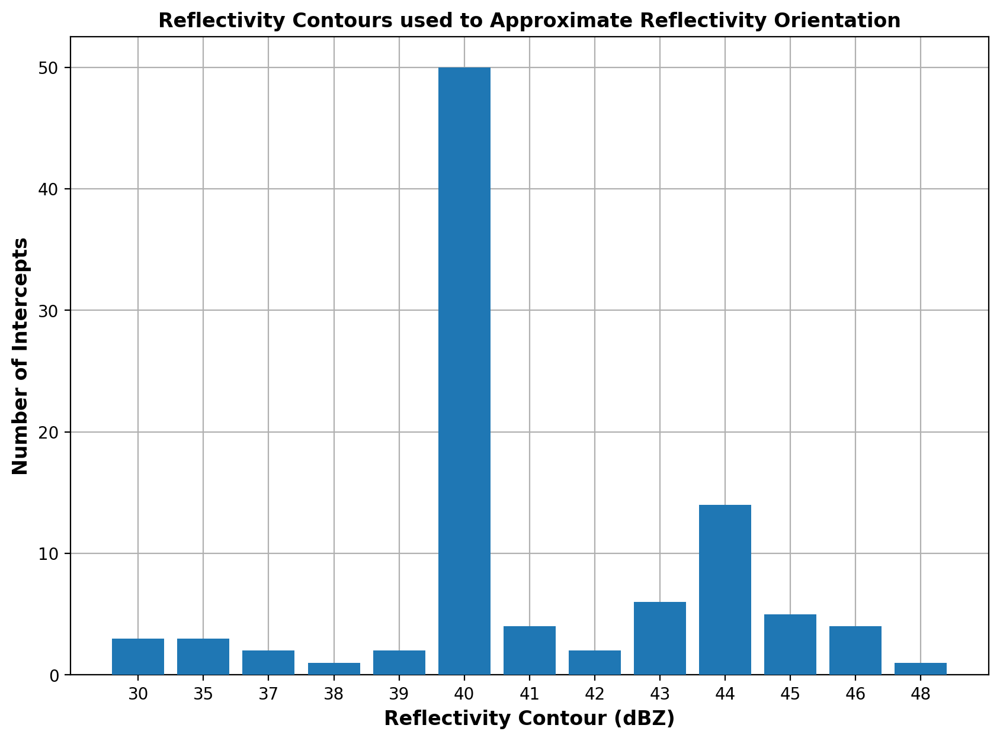

In [26]:
num_ref = [3,3,2,1,2,50,4,2,6,14,5,4,1]
ref_label = ['30','35','37','38','39','40','41','42','43','44','45','46','48']

fig = plt.figure(figsize =(10, 7))
plt.grid(zorder=0)
plt.bar(ref_label,num_ref,zorder=3)

plt.title("Reflectivity Contours used to Approximate Reflectivity Orientation",fontweight='bold',fontsize=12)
plt.xlabel('Reflectivity Contour (dBZ)',fontweight='bold',fontsize=12)
plt.ylabel('Number of Intercepts',fontweight='bold',fontsize=12)


save_dir = 'C:\\Users\\joshu\\Desktop\\Test_Plots\\'
plt.savefig('{0}Ref_bar.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

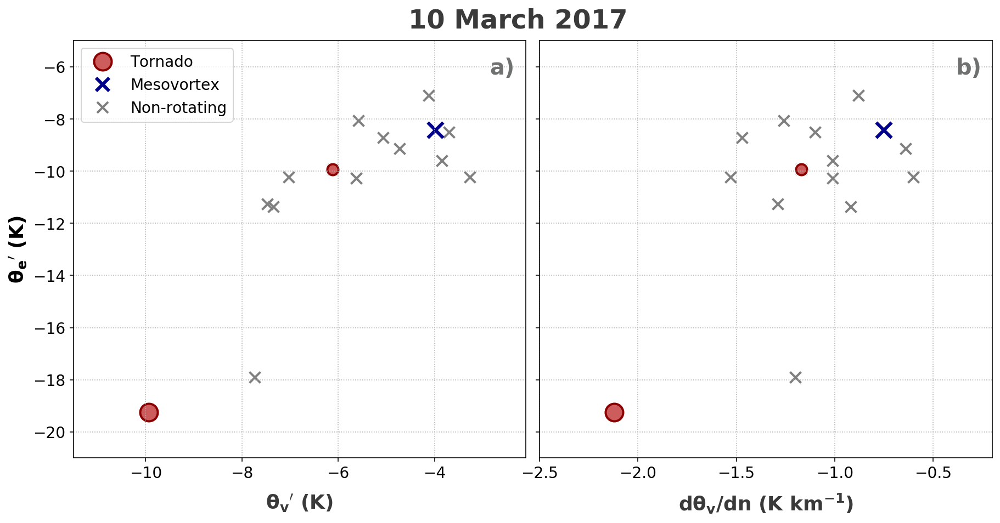

In [64]:
d_20170310=sns[sns['date']==20170310]
fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)
# ax = axes[0]
# ax2 = axes[1]

#plt.title(r'10-min ${\theta_v}$ and ${\theta_e}$ Deficits',fontsize=24, y = 1.01)
ax.set_xlabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, weight='bold')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'

ax.scatter(d_20170310['TV'],d_20170310['TE'],marker='x',color='gray', s=(10**2), linewidth=2)

# tors
ax.scatter(d_20170310.loc['0108A']['TV'],d_20170310.loc['0108A']['TE'],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.scatter(d_20170310.loc['0216A']['TV'],d_20170310.loc['0216A']['TE'],\
        marker='x',color='w', s=(10**2), linewidth=2)

ax.scatter(d_20170310.loc['0216A']['TV'],d_20170310.loc['0216A']['TE'],\
        s=dist_15, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.scatter(d_20170310.loc['0104A']['TV'],d_20170310.loc['0104A']['TE'],marker='x',\
        s=nontorsize,color='darkblue',linewidth=nonwidth)


ax.grid(linestyle=':')

shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Non-rotating')
Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'Mesovortex')
tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,mew='2',marker = 'o', linewidth = 0,mec = 'darkred',label='Tornado')
leg = ax.legend(handles = [tor, Nnon, non],loc=2, fontsize=14)#, title='Feature Near\nObservation')
plt.setp(leg.get_title(),fontsize=16)

ax.set_ylim(-21,-5);
ax.set_xlim(-11.5,-2.1);

ax.set_facecolor('w')
ax.patch.set_visible(False)

###########################


ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
#plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)


ax2.scatter(d_20170310['dTVdn'],d_20170310['TE'],marker='x',color='gray', s=(10**2), linewidth=2)

# tors
ax2.scatter(d_20170310.loc['0108A']['dTVdn'],d_20170310.loc['0108A']['TE'],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

# add white
ax2.scatter(d_20170310.loc['0216A']['dTVdn'],d_20170310.loc['0216A']['TE'],\
        marker='x',color='w', s=(10**2), linewidth=6)

ax2.scatter(d_20170310.loc['0216A']['dTVdn'],d_20170310.loc['0216A']['TE'],\
        s=dist_15, color=time_5, linewidth=2, edgecolors='darkred') #107

ax2.scatter(d_20170310.loc['0104A']['dTVdn'],d_20170310.loc['0104A']['TE'],marker='x',\
        s=nontorsize,color='darkblue',linewidth=nonwidth)


ax2.grid(linestyle=':')


ax2.set_xlim(-2.5,-0.2);

ax2.set_facecolor('w')
ax2.patch.set_visible(False)

ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')

plt.subplots_adjust(wspace=.03)
plt.suptitle('10 March 2017', fontsize=24, weight='bold', color='#3a3a3a', y=.94)
#plt.savefig('{0}10MarchDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

### 20170430

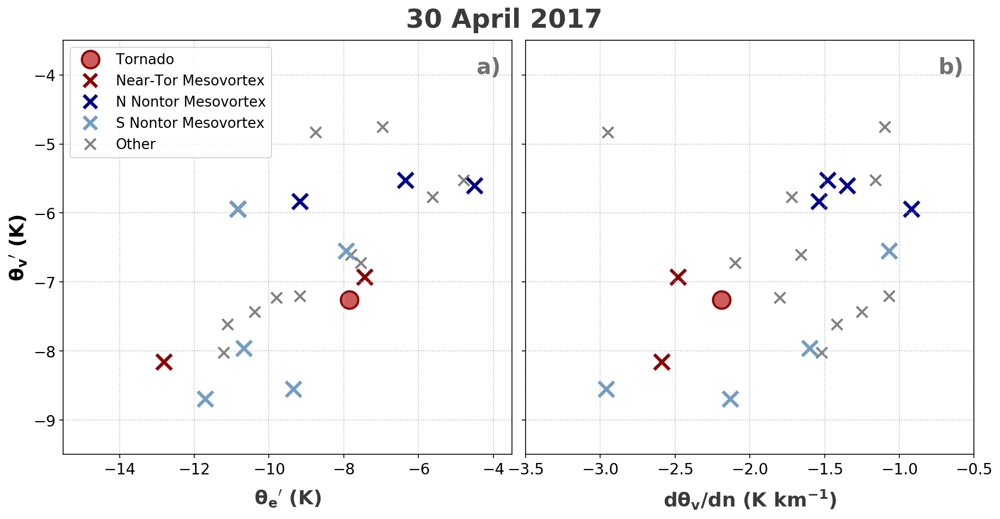

In [63]:
d_20170430 = sns[sns['date']==20170430]

d_20170430= d_20170430.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})


fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)
# ax = axes[0]
# ax2 = axes[1]

#plt.title(r'10-min ${\theta_v}$ and ${\theta_e}$ Deficits',fontsize=24, y = 1.01)
ax.set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'


#N = 6, 7, 11
#S =  2, 12, 221, 222, 14 

tor = [d_20170430.loc[['0107A']]['TE'],\
     d_20170430.loc['0107A']['TV']]
S = [d_20170430.loc[['0106A', '0111A']]['TE'],\
     d_20170430.loc[['0106A', '0111A']]['TV']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['TE'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV']]
N2 =[d_20170430.loc[['0102A', '0217A','0221A','0222A','0218A']]['TE'],\
     d_20170430.loc[['0102A', '0217A','0221A','0222A','0218A']]['TV']]
n2 = ['0102A', '0217A','0221A','0222A','0218A']


# 20170430
ax.scatter(d_20170430['TE'].loc[~d_20170430.index.isin(n2)]\
        ,d_20170430['TV'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2',alpha=1,linewidth=nonwidth)
# keep 
ax.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.grid(linestyle=':')



shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Other')
Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'N Nontor Mesovortex')
Nnon2 = mlines.Line2D([],[], color = '#749cc2', alpha=1,markersize=12, mew='3', marker = 'x',linewidth=0, label=r'S Nontor Mesovortex')
Snon = mlines.Line2D([],[], color = 'darkred', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'Near-Tor Mesovortex')
tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,mew='2',marker = 'o', linewidth = 0,mec = 'darkred', label='Tornado')
leg = ax.legend(handles = [tor,Snon, Nnon,Nnon2, non],
                 loc=2, fontsize=13)#,title='Feature Near Observation')
leg.get_title().set_fontsize('15') 




ax.set_facecolor('w')
ax.patch.set_visible(False)

###########################


ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
#plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)


n2 = ['0102A', '0217A','0221aA','0222A','0218A']

tor = [d_20170430.loc[['0107A']]['dTVdn'],\
     d_20170430.loc['0107A']['TV']]


S = [d_20170430.loc[['0106A', '0111A']]['dTVdn'],\
     d_20170430.loc[['0106A', '0111A']]['TV']]


N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['dTVdn'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV']]

N2 =[d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['TV']]

# 20170430
ax2.scatter(d_20170430['dTVdn'].loc[~d_20170430.index.isin(n2)],\
        d_20170430['TV'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax2.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax2.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax2.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2', alpha=1,linewidth=nonwidth)

#ax2.scatter(d_20170430.loc[['0109A']]['dTVdn'], d_20170430.loc[['0109A']]['TV'], color='orange')

# keep 
ax2.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax2.grid(linestyle=':')


ax.set_xlim(-15.5,-3.5);
ax.set_ylim(-9.5,-3.5);

ax2.set_xlim(-3.5,-0.5);

ax2.set_facecolor('w')
ax2.patch.set_visible(False)

ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')
plt.subplots_adjust(wspace=.03)
plt.suptitle('30 April 2017', fontsize=24, weight='bold', color='#3a3a3a', y=.94)
#plt.savefig('{0}30AprilDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [51]:
te = d_20170430['TE']
tv = d_20170430['TV']
print(te.mean())
print(tv.mean())

abs(d_20170430['TV']['0107A']) - abs(tv)

-8.718181818181817
-6.757727272727272


ID
0102A    1.32
0103A    1.49
0104A    0.03
0105A    0.54
0106A   -0.90
0107A    0.00
0108A    1.74
0109A    2.43
0110A   -0.76
0111A    0.33
0112A    1.74
0213A   -0.17
0214A    1.66
0215A    2.51
0216A    0.66
0217A   -0.70
0218A   -1.43
0219A   -0.35
0220A    1.43
0221A    0.71
0222A   -1.29
0224A    0.06
Name: TV, dtype: float64

In [48]:
print(d_20170430['TE']['0107A'], d_20170430['TV']['0107A'])

-7.85 -7.26


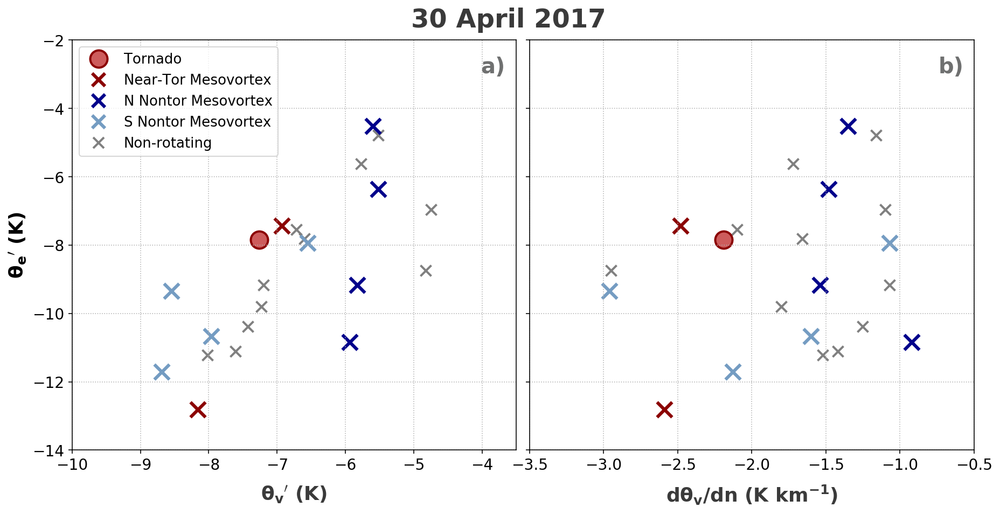

In [4]:

d_20170430 = sns[sns['date']==20170430]
d_20170430.index = d_20170430['ID']

d_20170430= d_20170430.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})
#d_20170430.loc[:, 'dTVdn'] = d_20170430.loc[:, 'dTVdn']/d_20170430.loc[:, 'TV_BS']

fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)
# ax = axes[0]
# ax2 = axes[1]

#plt.title(r'10-min ${\theta_v}$ and ${\theta_e}$ Deficits',fontsize=24, y = 1.01)
ax.set_xlabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, weight='bold')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'


#N = 6, 7, 11
#S =  2, 12, 221, 222, 14 

tor = [d_20170430.loc[['0107A']]['TV'],\
     d_20170430.loc['0107A']['TE']]
S = [d_20170430.loc[['0106A', '0111A']]['TV'],\
     d_20170430.loc[['0106A', '0111A']]['TE']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TE']]
N2 =[d_20170430.loc[['0217A','0221A','0222A','0218A']]['TV'],\
     d_20170430.loc[['0217A','0221A','0222A','0218A']]['TE']]
n2 = ['0102A', '0217A','0221A','0222A','0218A']


# 20170430
ax.scatter(d_20170430['TV'].loc[~d_20170430.index.isin(n2)]\
        ,d_20170430['TE'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2',alpha=1,linewidth=nonwidth)
# keep 
ax.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.grid(linestyle=':')



shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Non-rotating')
Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'N Nontor Mesovortex')
Nnon2 = mlines.Line2D([],[], color = '#749cc2', alpha=1,markersize=12, mew='3', marker = 'x',linewidth=0, label=r'S Nontor Mesovortex')
Snon = mlines.Line2D([],[], color = 'darkred', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'Near-Tor Mesovortex')
tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,mew='2',marker = 'o', linewidth = 0,mec = 'darkred', label='Tornado')
leg = ax.legend(handles = [tor,Snon, Nnon,Nnon2, non],
                 loc=2, fontsize=13)#,title='Feature Near Observation')
leg.get_title().set_fontsize('15') 




ax.set_facecolor('w')
ax.patch.set_visible(False)

###########################


ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
#plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)


n2 = ['0102A', '0217A','0221aA','0222A','0218A']

tor = [d_20170430.loc[['0107A']]['dTVdn'],\
     d_20170430.loc['0107A']['TE']]


S = [d_20170430.loc[['0106A', '0111A']]['dTVdn'],\
     d_20170430.loc[['0106A', '0111A']]['TE']]

N = [d_20170430.loc[['0214A', '0217A','0112A','0220A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[['0214A', '0217A','0112A','0220A','0221A','0222A','0218A']]['TE']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['dTVdn'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TE']]

N2 =[d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['TE']]

# 20170430
ax2.scatter(d_20170430['dTVdn'].loc[~d_20170430.index.isin(n2)],\
        d_20170430['TE'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax2.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax2.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax2.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2', alpha=1,linewidth=nonwidth)

#ax2.scatter(d_20170430.loc[['0109A']]['dTVdn'], d_20170430.loc[['0109A']]['TV'], color='orange')

# keep 
ax2.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax2.grid(linestyle=':')

# for i in d_20170430.index:
#     ax2.text(d_20170430.loc[i]['dTVdn']+0.05,d_20170430.loc[i]['TE']+0.05, str(i) )

ax.set_xlim(-10,-3.5);
ax.set_ylim(-14,-2);

ax2.set_xlim(-3.5,-0.5);

ax2.set_facecolor('w')
ax2.patch.set_visible(False)

ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')
plt.subplots_adjust(wspace=.03)
plt.suptitle('30 April 2017', fontsize=24, weight='bold', color='#3a3a3a', y=.94)
plt.savefig('{0}30AprilDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [94]:
d_20170430[:, 'dTVdn'] = d_20170430[:, 'dTVdn']/d_20170430[:, 'TE_BS']

,date,ID,N_ID,Lats,Lons,mode,type,TOA,storm_ref_angle,Ua,Va,TOA_mods,Bsdist_mods,TE,TV,dTVdn,storm_u_OLD,storm_v_OLD,TE_BS,TV_BS
ID,,,,,,,,,,,,,,,,,,,,
0102A,20170430,0102A,SHYL,34.295900,-87.587100,linear,R,4/30/17 18:08,32.0,11.4,19.0,NaN,NaN,-10.84,-5.94,-0.92,12.3,9.9,340.39,301.76
0103A,20170430,0103A,SCMT,34.855100,-86.001700,linear,NR,4/30/17 20:42,25.0,10.1,17.6,NaN,NaN,-5.62,-5.77,-1.72,12.3,9.9,336.79,303.25
0104A,20170430,0104A,SLYN,35.339100,-87.032400,linear,NR,4/30/17 19:29,-1.0,12.4,18.6,NaN,NaN,-9.80,-7.23,-1.80,12.3,9.9,336.93,302.40
0105A,20170430,0105A,SSBR,34.622400,-86.080000,linear,NR,4/30/17 20:29,10.0,12.3,9.8,NaN,NaN,-7.54,-6.72,-2.10,12.3,9.9,340.76,304.20
0106A,20170430,0106A,SADN,34.214900,-87.161900,linear,R,4/30/17 18:47,32.0,10.8,18.1,1.0,NaN,-12.81,-8.16,-2.59,12.3,9.9,340.03,303.08
0107A,20170430,0107A,SCLM,34.194390,-86.798250,linear,T,4/30/17 19:08,27.0,13.1,16.3,NaN,NaN,-7.85,-7.26,-2.19,12.3,9.9,339.61,303.66
0108A,20170430,0108A,SPBG,35.323600,-86.634700,linear,NR,4/30/17 20:01,36.0,12.3,17.2,NaN,NaN,-4.79,-5.52,-1.16,12.3,9.9,339.32,302.72
0109A,20170430,0109A,SLBG,35.304500,-87.518500,linear,NR,4/30/17 18:28,-10.0,11.4,22.8,NaN,NaN,-8.75,-4.83,-2.95,12.3,9.9,337.67,301.49
0110A,20170430,0110A,SDGS,34.163200,-86.334100,linear,NR,4/30/17 20:01,2.0,12.3,12.3,NaN,NaN,-11.22,-8.02,-1.52,12.3,9.9,339.89,303.51


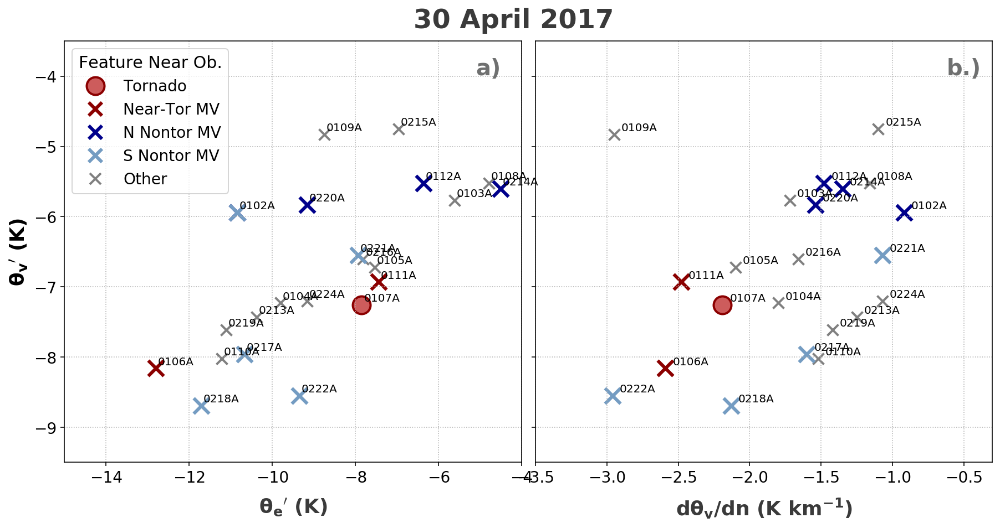

In [8]:
d_20170430 = sns[sns['date']==20170430]

d_20170430= d_20170430.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})


fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)
# ax = axes[0]
# ax2 = axes[1]

#plt.title(r'10-min ${\theta_v}$ and ${\theta_e}$ Deficits',fontsize=24, y = 1.01)
ax.set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=18, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=18, weight='bold')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'


#N = 6, 7, 11
#S =  2, 12, 221, 222, 14 

tor = [d_20170430.loc[['0107A']]['TE'],\
     d_20170430.loc['0107A']['TV']]
S = [d_20170430.loc[['0106A', '0111A']]['TE'],\
     d_20170430.loc[['0106A', '0111A']]['TV']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['TE'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV']]
N2 =[d_20170430.loc[['0102A', '0217A','0221A','0222A','0218A']]['TE'],\
     d_20170430.loc[['0102A', '0217A','0221A','0222A','0218A']]['TV']]
n2 = ['0102A', '0217A','0221A','0222A','0218A']


# 20170430
ax.scatter(d_20170430['TE'].loc[~d_20170430.index.isin(n2)]\
        ,d_20170430['TV'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2',alpha=1,linewidth=nonwidth)
# keep 
ax.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

ax.grid(linestyle=':')

for i in d_20170430.index:
    ax.text(d_20170430.loc[i]['TE']+0.05,d_20170430.loc[i]['TV']+0.05, str(i) )


shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Other')
Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'N Nontor MV')
Nnon2 = mlines.Line2D([],[], color = '#749cc2', alpha=1,markersize=12, mew='3', marker = 'x',linewidth=0, label=r'S Nontor MV')
Snon = mlines.Line2D([],[], color = 'darkred', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'Near-Tor MV')
tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,mew='2',marker = 'o', linewidth = 0,mec = 'darkred', label='Tornado')
leg = ax.legend(handles = [tor,Snon, Nnon,Nnon2, non],
                 loc=2, fontsize=14, title='Feature Near Ob.')
leg.get_title().set_fontsize('15') 


ax.set_xlim(-15,-4);
ax.set_ylim(-9.5,-3.5);

ax.set_facecolor('w')
ax.patch.set_visible(False)

###########################


ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=18, labelpad = 10, color='#3a3a3a', weight='bold')
#plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)


n2 = ['0102A', '0217A','0221aA','0222A','0218A']

tor = [d_20170430.loc[['0107A']]['dTVdn'],\
     d_20170430.loc['0107A']['TV']]


S = [d_20170430.loc[['0106A', '0111A']]['dTVdn'],\
     d_20170430.loc[['0106A', '0111A']]['TV']]

N = [d_20170430.loc[['0214A', '0217A','0112A','0220A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[['0214A', '0217A','0112A','0220A','0221A','0222A','0218A']]['TV']]
N = [d_20170430.loc[['0102A','0214A','0112A','0220A']]['dTVdn'],\
     d_20170430.loc[['0102A','0214A','0112A','0220A']]['TV']]

N2 =[d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['dTVdn'],\
     d_20170430.loc[[ '0217A','0221A','0222A','0218A']]['TV']]

# 20170430
ax2.scatter(d_20170430['dTVdn'].loc[~d_20170430.index.isin(n2)],\
        d_20170430['TV'].loc[~d_20170430.index.isin(n2)], marker='x',color='gray', s=(10**2), linewidth=2)

ax2.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)
ax2.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)
ax2.scatter(N2[0],N2[1], marker='x', s=nontorsize,color='#749cc2', alpha=1,linewidth=nonwidth)

#ax2.scatter(d_20170430.loc[['0109A']]['dTVdn'], d_20170430.loc[['0109A']]['TV'], color='orange')

# keep 
ax2.scatter(tor[0],tor[1],\
        s=dist_10, color=time_5, linewidth=2, edgecolors='darkred') #107

for i in d_20170430.index:
    ax2.text(d_20170430.loc[i]['dTVdn']+0.05,d_20170430.loc[i]['TV']+0.05, str(i) )

ax2.grid(linestyle=':')


ax2.set_xlim(-3.5,-0.3);

ax2.set_facecolor('w')
ax2.patch.set_visible(False)

ax.text(0.9,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.9,0.92,'b.)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')
plt.subplots_adjust(wspace=.03)
plt.suptitle('30 April 2017', fontsize=24, weight='bold', color='#3a3a3a', y=.94)
#plt.savefig('{0}30AprilDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [97]:
d_20170422 = sns[sns['date']==20170422]
d_20170422

,date,ID,N_ID,Lats,Lons,mode,type,TOA,storm_ref_angle,storm_u,storm_v,TOA_mods,Bsdist_mods,TE,TV,dTVdn
68,20170422,0102A,SHYL,34.29590,-87.58710,supercell,R,4/22/17 21:26,-50.0,11.0,-7.9,NaN,NaN,-11.70,-5.54,-1.03
69,20170422,0103A,SCMT,34.85510,-86.00170,supercell,T,4/22/17 22:49,36.0,21.2,-5.7,NaN,NaN,-9.78,-3.92,-0.84
70,20170422,0106A,SADN,34.21490,-87.16190,supercell,T,4/22/17 22:25,-44.0,11.0,-7.9,NaN,NaN,-16.08,-7.95,-1.62
71,20170422,0107A,SCLM,34.19439,-86.79825,supercell,R,4/22/17 23:10,-9.0,11.0,-7.9,NaN,NaN,-9.03,-4.05,-0.99
72,20170422,0213A,SHLG,34.90160,-86.53860,supercell,R,4/22/17 22:00,-42.0,21.2,-5.7,NaN,NaN,-12.38,-6.87,-1.44
73,20170422,0214A,SEMT,34.61760,-87.10140,supercell,NR,4/22/17 21:31,-51.0,21.2,-5.7,NaN,NaN,-12.49,-4.20,-1.00


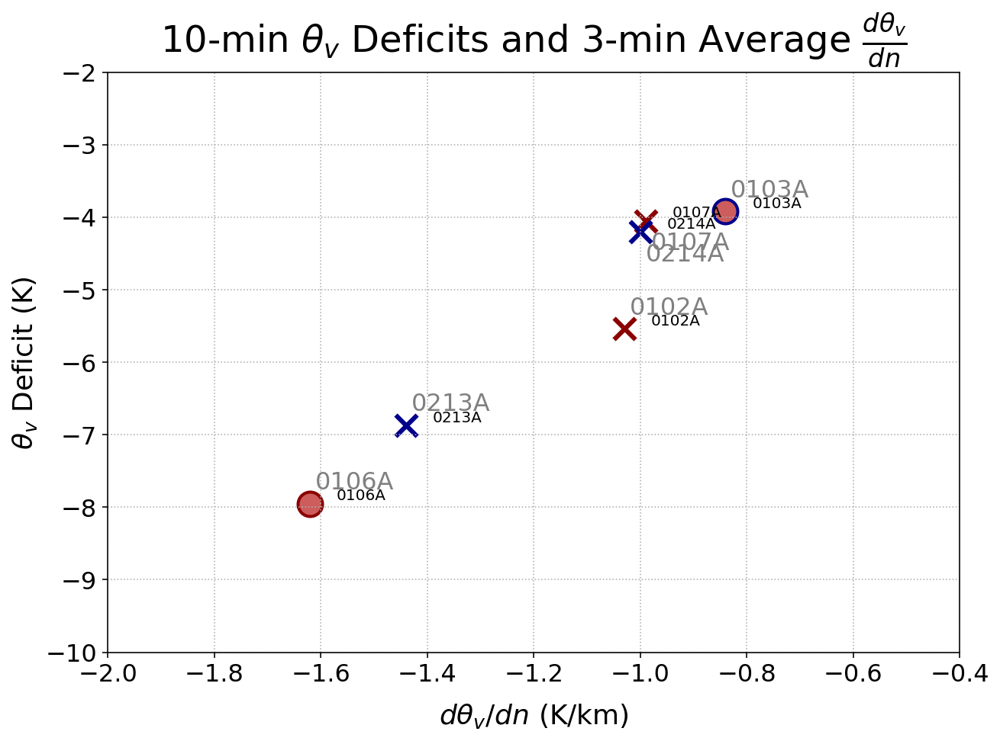

In [107]:
d_20170422 = sns[sns['date']==20170422]

d_20170422= d_20170422.rename(columns={"TV_dist": "TV", "TE_dist": "TE"})



fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111)
plt.title(r'10-min ${\theta_v}$ Deficits and 3-min Average ${\frac{d\theta_v}{dn}}$',fontsize=24, y = 1.02)
plt.xlabel(r'$d\theta_v/{dn}}$ (K/km)', fontsize=18, labelpad = 10)
plt.ylabel(r'${\theta_v}$ Deficit (K)', fontsize=18)
xticks(fontsize=16)
yticks(fontsize=16)

nontorsize = (14**2)
nonwidth=3

dist_10 = (16*16)
dist_15 = (10*10)
time_15 = '#350507'
time_10 = 'darkred'
time_5 = 'indianred'


#N = 6, 7, 11
#S =  2, 12, 221, 222, 14 

# tor = [[-9.2,-13.79],[-3.7,-6.65]] #103,106
# non = [[-4.6,-7.14,-12.89,-12.07],[-2.94,-3.07,-6.79,-3.95]]
# non = 102,107,213(?),214, tor = 103,106

#N, S
Ntor = [d_20170422.loc[['0103A']]['dTVdn'],d_20170422.loc[['0103A']]['TV']] #103,106
Stor = [d_20170422.loc[['0106A']]['dTVdn'],d_20170422.loc[['0106A']]['TV']] 
#non = [[-0.59,-0.51,-1.05,-0.56],[-2.94,-3.07,-6.79,-3.95]]

S = [d_20170422.loc[['0102A','0107A']]['dTVdn'],d_20170422.loc[['0102A','0107A']]['TV']]
N = [d_20170422.loc[['0214A','0213A']]['dTVdn'],d_20170422.loc[['0214A','0213A']]['TV']]


# 20170422

ax.scatter(Stor[0],Stor[1], marker='o',s=dist_10, color=time_5, linewidth=2, edgecolors='darkred')
ax.scatter(S[0],S[1], marker='x', s=nontorsize,color='darkred',linewidth=nonwidth)

ax.scatter(Ntor[0],Ntor[1], marker='o',s=dist_10, color=time_5, linewidth=2, edgecolors='darkblue')
ax.scatter(N[0],N[1], marker='x', s=nontorsize,color='darkblue',linewidth=nonwidth)

# keep 
for i in d_20170422.index:
    if i in ['0102A','0213A','0103A','0106A']:
        ax.text(d_20170422.loc[i]['dTVdn']+.01,d_20170422.loc[i]['TV']+.2,i, color='gray', fontsize=16)
    if i in ['0214A','0107A']:
        ax.text(d_20170422.loc[i]['dTVdn']+.01,d_20170422.loc[i]['TV']-.4,i, color='gray', fontsize=16)
grid(linestyle=':')

for i in d_20170422.index:
    ax.text(d_20170422.loc[i]['dTVdn']+0.05,d_20170422.loc[i]['TV']+0.05, str(i) )

# # legend disaster
# ax1 = ax.twinx()
# ax1.axis('off')

# shapes = mlines.Line2D([],[], color = 'k', markersize=43,  marker = '$Feature Near Observation$',linewidth=0, label=r'')
# non = mlines.Line2D([],[], color = 'gray', markersize=10, mew='2',marker = 'x',linewidth=0, label=r'Other')
# Nnon = mlines.Line2D([],[], color = 'darkblue', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'N Supercell')
# Snon = mlines.Line2D([],[], color = 'darkred', markersize=12, mew='3', marker = 'x',linewidth=0, label=r'S Supercell')
# tor = mlines.Line2D([],[], color = 'indianred',  markersize = 16,marker = 'o', linewidth = 0,\
#                           label='Tornado')

# leg = legend(handles = [tor,Snon, Nnon],
#                  loc=2, fontsize=14, title='Feature Near Ob.')

# plt.setp(leg.get_title(),fontsize=16)

# ax.set_xlim(-15,-2.5);
# ax.set_ylim(-9,-1);


ax.set_xlim(-2.,-0.4);
ax.set_ylim(-10,-2);

ax.set_facecolor('w')
ax.patch.set_visible(False)


### Overall Deficits

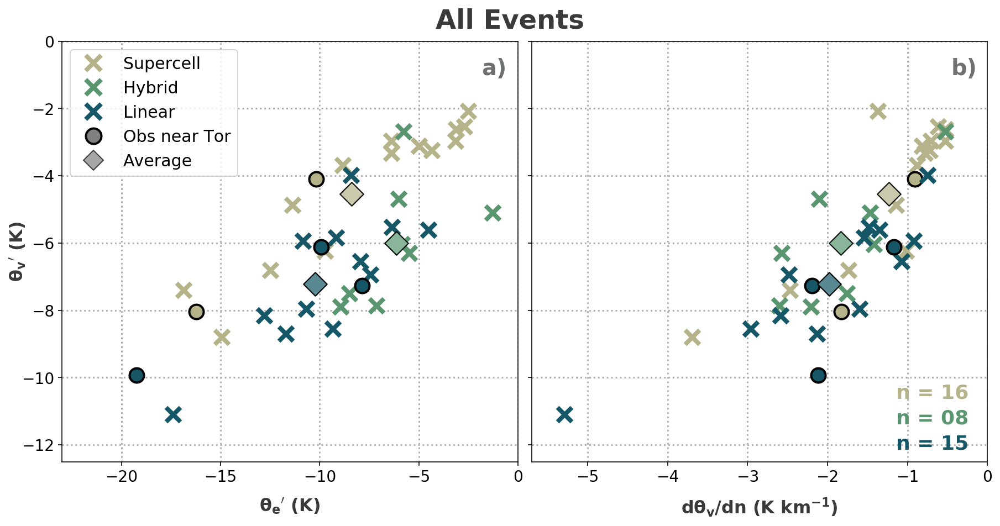

In [25]:
fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)

plt.rc('axes', axisbelow=True)
# pull in plotting variables 
s= (13**2)
nmark = 'x'
tormark = 'o'
lw = 4
lwt=2
avgm = 'D'
avgs = (15**2)
avgec = 'k'
avglw = 1
avga = 0.7
supc, mixc, linc, a, a_tor = get_colors()

##################################################
# thetae vs thetav
##################################################

ax.set_xlabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=16, labelpad = -5, weight='bold', color='#3a3a3a')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)


# supercells
ax.scatter(get_mode('TE', 'supercell', 'R'), get_mode('TV', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax.scatter(get_mode('TE', 'supercell', 'T'), get_mode('TV', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax.scatter(get_mode('TE', 'mixed', 'R'), get_mode('TV', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax.scatter(get_mode('TE', 'linear', 'R'), get_mode('TV', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax.scatter(get_mode('TE', 'linear', 'T'), get_mode('TV', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


# pLOT AVERAGES
ax.scatter(get_mode_average('TE','supercell'),get_mode_average('TV','supercell'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE','supercell'),get_mode_average('TV','supercell'), s=avgs, color=supc, alpha=avga, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE', 'mixed'),get_mode_average('TV', 'mixed'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE', 'mixed'),get_mode_average('TV', 'mixed'), s=avgs, color=mixc, alpha=avga, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE', 'linear'),get_mode_average('TV', 'linear'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TE', 'linear'),get_mode_average('TV', 'linear'), s=avgs, color=linc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)


sup = mlines.Line2D([],[], color = supc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a, label=r'Supercell')
mix = mlines.Line2D([],[], color = mixc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw,alpha=a, label=r'Hybrid')
lin = mlines.Line2D([],[], color = linc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a,label=r'Linear')
Tor = mlines.Line2D([],[], color = 'gray', markersize=14,
                    marker = 'o',linewidth=0, mew=lwt, markeredgecolor='k',\
                    alpha=a_tor,label=r'Obs near Tor')
avg = mlines.Line2D([],[], color = 'gray', markersize=13,
                    marker = 'D',linewidth=0, mew=avglw, markeredgecolor='k',\
                    alpha=avga,label=r'Average')

ax.legend(handles = [sup, mix, lin, Tor, avg],loc=2 ,fontsize = 15);
ax.grid(zorder=0, linestyle=":", linewidth=1.5)

##################################################
# dTVdn vs thetav
##################################################

ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)

# supercells
ax2.scatter(get_mode('dTVdn', 'supercell', 'R'), get_mode('TV', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax2.scatter(get_mode('dTVdn', 'supercell', 'T'), get_mode('TV', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax2.scatter(get_mode('dTVdn', 'mixed', 'R'), get_mode('TV', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax2.scatter(get_mode('dTVdn', 'linear', 'R'), get_mode('TV', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax2.scatter(get_mode('dTVdn', 'linear', 'T'), get_mode('TV', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


# pLOT AVERAGES
ax2.scatter(get_mode_average('dTVdn','supercell'),get_mode_average('TV','supercell'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn','supercell'),get_mode_average('TV','supercell'), s=avgs, color=supc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'mixed'),get_mode_average('TV', 'mixed'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'mixed'),get_mode_average('TV', 'mixed'), s=avgs, color=mixc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'linear'),get_mode_average('TV', 'linear'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'linear'),get_mode_average('TV', 'linear'), s=avgs, color=linc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)

ax2.grid(zorder=0, linestyle=":", linewidth=1.5)


ax2.text(0.80, 0.15, 'n = 16', fontsize=18, color=supc, weight='bold', transform=ax2.transAxes)
ax2.text(0.80, 0.09, 'n = 08', fontsize=18, color=mixc, weight='bold', transform=ax2.transAxes)
ax2.text(0.80, 0.03, 'n = 15', fontsize=18, color=linc, weight='bold', transform=ax2.transAxes)

ax.set_xlim(-23, 0)
# ax.set_xlim(-22, 1);
ax.set_ylim(-12.5,0);
ax2.set_xlim(-5.7, 0)

plt.subplots_adjust(wspace=.03)
ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')

plt.suptitle('All Events', fontsize=24, weight='bold', color='#3a3a3a', y=.94);
#plt.savefig('{0}OverallDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);




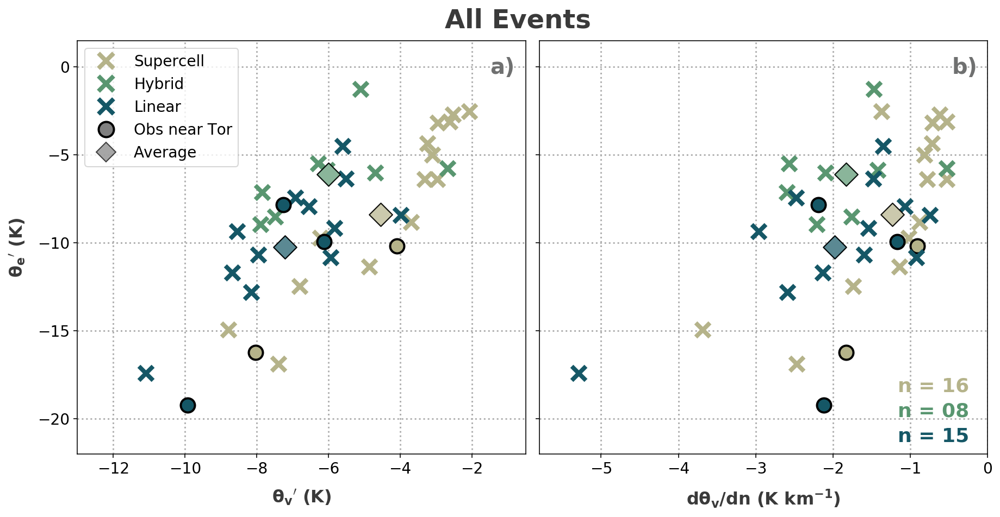

In [142]:
fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)

plt.rc('axes', axisbelow=True)
# pull in plotting variables 
s= (13**2)
nmark = 'x'
tormark = 'o'
lw = 4
lwt=2
avgm = 'D'
avgs = (15**2)
avgec = 'k'
avglw = 1
avga = 0.7
supc, mixc, linc, a, a_tor = get_colors()

##################################################
# thetae vs thetav
##################################################

ax.set_xlabel(r'$\mathbf{{\theta_v}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)


# supercells
ax.scatter(get_mode('TV', 'supercell', 'R'), get_mode('TE', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax.scatter(get_mode('TV', 'supercell', 'T'), get_mode('TE', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax.scatter(get_mode('TV', 'mixed', 'R'), get_mode('TE', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax.scatter(get_mode('TV', 'linear', 'R'), get_mode('TE', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax.scatter(get_mode('TV', 'linear', 'T'), get_mode('TE', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


# pLOT AVERAGES
ax.scatter(get_mode_average('TV','supercell'),get_mode_average('TE','supercell'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV','supercell'),get_mode_average('TE','supercell'), s=avgs, color=supc, alpha=avga, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV', 'mixed'),get_mode_average('TE', 'mixed'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV', 'mixed'),get_mode_average('TE', 'mixed'), s=avgs, color=mixc, alpha=avga, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV', 'linear'),get_mode_average('TE', 'linear'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
      linewidths=avglw)
ax.scatter(get_mode_average('TV', 'linear'),get_mode_average('TE', 'linear'), s=avgs, color=linc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)


sup = mlines.Line2D([],[], color = supc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a, label=r'Supercell')
mix = mlines.Line2D([],[], color = mixc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw,alpha=a, label=r'Hybrid')
lin = mlines.Line2D([],[], color = linc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a,label=r'Linear')
Tor = mlines.Line2D([],[], color = 'gray', markersize=14,
                    marker = 'o',linewidth=0, mew=lwt, markeredgecolor='k',\
                    alpha=a_tor,label=r'Obs near Tor')
avg = mlines.Line2D([],[], color = 'gray', markersize=13,
                    marker = 'D',linewidth=0, mew=avglw, markeredgecolor='k',\
                    alpha=avga,label=r'Average')

ax.legend(handles = [sup, mix, lin, Tor, avg],loc=2 ,fontsize = 14);
ax.grid(zorder=0, linestyle=":", linewidth=1.5)

##################################################
# dTVdn vs thetav
##################################################

ax2.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$ (K km$\mathbf{^{-1}}$)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)

# supercells
ax2.scatter(get_mode('dTVdn', 'supercell', 'R'), get_mode('TE', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax2.scatter(get_mode('dTVdn', 'supercell', 'T'), get_mode('TE', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax2.scatter(get_mode('dTVdn', 'mixed', 'R'), get_mode('TE', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax2.scatter(get_mode('dTVdn', 'linear', 'R'), get_mode('TE', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax2.scatter(get_mode('dTVdn', 'linear', 'T'), get_mode('TE', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


# pLOT AVERAGES
ax2.scatter(get_mode_average('dTVdn','supercell'),get_mode_average('TE','supercell'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn','supercell'),get_mode_average('TE','supercell'), s=avgs, color=supc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'mixed'),get_mode_average('TE', 'mixed'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'mixed'),get_mode_average('TE', 'mixed'), s=avgs, color=mixc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'linear'),get_mode_average('TE', 'linear'), s=avgs, color='w', alpha=1, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)
ax2.scatter(get_mode_average('dTVdn', 'linear'),get_mode_average('TE', 'linear'), s=avgs, color=linc, alpha=avga, marker=avgm, edgecolor=avgec,\
       linewidths=avglw)

ax2.grid(zorder=0, linestyle=":", linewidth=1.5)


ax2.text(0.80, 0.15, 'n = 16', fontsize=18, color=supc, weight='bold', transform=ax2.transAxes)
ax2.text(0.80, 0.09, 'n = 08', fontsize=18, color=mixc, weight='bold', transform=ax2.transAxes)
ax2.text(0.80, 0.03, 'n = 15', fontsize=18, color=linc, weight='bold', transform=ax2.transAxes)

ax.set_ylim(-22, 1.5)
# ax.set_xlim(-22, 1);
ax.set_xlim(-13,-.5);
ax2.set_xlim(-5.8, 0)

plt.subplots_adjust(wspace=.03)
ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')

plt.suptitle('All Events', fontsize=24, weight='bold', color='#3a3a3a', y=.94);
plt.savefig('{0}OverallDefs.png'.format(save_dir), bbox_inches = 'tight', format='png', dpi=300);


In [145]:

mode='linear'
typ='R'
y = sns[(sns['mode']==mode) & (sns['type']==typ)]#[var]
for i in y.index:
    if pd.to_datetime(y.loc[i]['TOA']).strftime('%Y') == '2016':
        y.loc[i, var] = np.nan


AttributeError: 'Series' object has no attribute 'strftime'

In [146]:
y.loc[i]['TOA']

ID
0104A     3/10/17 5:25
0104A    3/21/17 21:12
Name: TOA, dtype: object

Text(0.92, 0.92, 'b)')

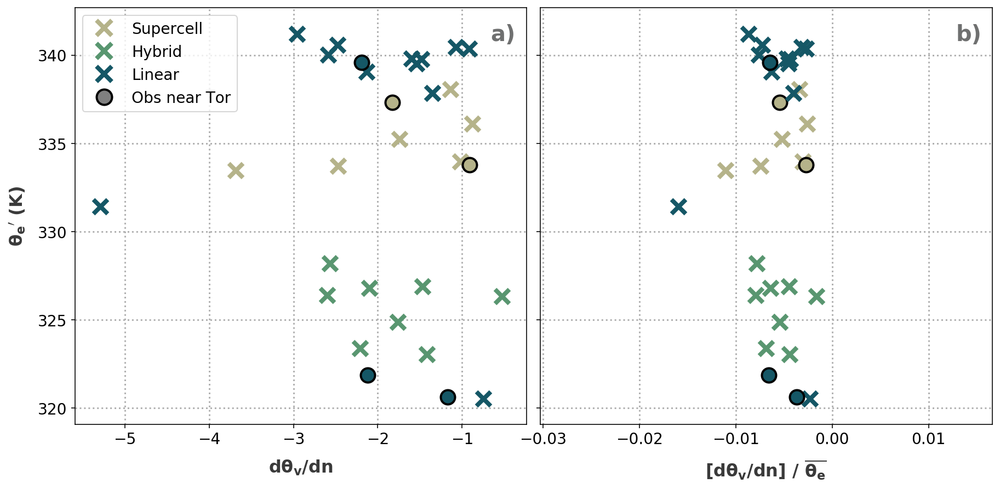

In [149]:
def get_mode(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    y = sns[(sns['mode']==mode) & (sns['type']==typ)]#[var]
    for i in y.index:
        if pd.to_datetime(y.loc[i]['TOA']).strftime('%Y') == '2016':
            y.loc[i, var] = np.nan
    return y[var]



fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)

plt.rc('axes', axisbelow=True)
# pull in plotting variables 
s= (13**2)
nmark = 'x'
tormark = 'o'
lw = 4
lwt=2
avgm = 'D'
avgs = (15**2)
avgec = 'k'
avglw = 1
avga = 0.7
supc, mixc, linc, a, a_tor = get_colors()

##################################################
# thetae vs thetav
##################################################

ax.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)


ax.scatter(get_mode('dTVdn', 'supercell', 'R'), get_mode('TE_BS', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax.scatter(get_mode('dTVdn', 'supercell', 'T'), get_mode('TE_BS', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax.scatter(get_mode('dTVdn', 'mixed', 'R'), get_mode('TE_BS', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax.scatter(get_mode('dTVdn', 'linear', 'R'), get_mode('TE_BS', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax.scatter(get_mode('dTVdn', 'linear', 'T'), get_mode('TE_BS', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


sup = mlines.Line2D([],[], color = supc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a, label=r'Supercell')
mix = mlines.Line2D([],[], color = mixc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw,alpha=a, label=r'Hybrid')
lin = mlines.Line2D([],[], color = linc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a,label=r'Linear')
Tor = mlines.Line2D([],[], color = 'gray', markersize=14,
                    marker = 'o',linewidth=0, mew=lwt, markeredgecolor='k',\
                    alpha=a_tor,label=r'Obs near Tor')
avg = mlines.Line2D([],[], color = 'gray', markersize=13,
                    marker = 'D',linewidth=0, mew=avglw, markeredgecolor='k',\
                    alpha=avga,label=r'Average')

ax.legend(handles = [sup, mix, lin, Tor],loc=2 ,fontsize = 14);
ax.grid(zorder=0, linestyle=":", linewidth=1.5)

##################################################
# dTVdn vs thetav
##################################################

ax2.set_xlabel(r'[$\mathbf{d\theta_v/{dn}}$] / $\mathbf{\overline{\theta_e}}$', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)

# supercells
ax2.scatter(get_mode('dTVdn', 'supercell', 'R')/get_mode('TE_BS', 'supercell', 'R'), get_mode('TE_BS', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax2.scatter(get_mode('dTVdn', 'supercell', 'T')/get_mode('TE_BS', 'supercell', 'T'), get_mode('TE_BS', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax2.scatter(get_mode('dTVdn', 'mixed', 'R')/get_mode('TE_BS', 'mixed', 'R'), get_mode('TE_BS', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax2.scatter(get_mode('dTVdn', 'linear', 'R')/get_mode('TE_BS', 'linear', 'R'), get_mode('TE_BS', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax2.scatter(get_mode('dTVdn', 'linear', 'T')/get_mode('TE_BS', 'linear', 'T'),get_mode('TE_BS', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

ax2.grid(zorder=0, linestyle=":", linewidth=1.5)

# labels = ax2.get_xticklabels()
# ax2.set_xticklabels(labels, rotation=20.0)

#ax2.xaxis.set_ticks(np.arange(-0.02, 0.001, 0.004))
#ax2.xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
#ax2.set_xlim(-0.02, 0)

plt.subplots_adjust(wspace=.03)
ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')



In [150]:
sns[sns['date']==20170310]

,date,ID,N_ID,Lats,Lons,mode,type,TOA,storm_ref_angle,Ua,...,TOA_mods,Bsdist_mods,TE,TV,dTVdn,storm_u_OLD,storm_v_OLD,TE_BS,TV_BS,Tdd_BS
11,20170310,0102A,SHYL,34.29590,-87.58710,linear,NR,3/10/17 7:21,-66.0,21.5,...,NaN,NaN,-9.59,-3.85,-1.01,26.3,-8.0,320.53,292.16,1.45
12,20170310,0103A,SCMT,34.85510,-86.00170,linear,NR,3/10/17 6:36,-54.0,25.1,...,NaN,NaN,-11.26,-7.47,-1.29,26.3,-8.0,320.86,296.62,6.36
13,20170310,0104A,SLYN,35.33910,-87.03240,linear,R,3/10/17 5:25,-51.0,23.6,...,NaN,NaN,-8.42,-3.98,-0.75,26.3,-8.0,320.55,293.69,3.39
14,20170310,0105A,SSBR,34.62240,-86.08000,linear,NR,3/10/17 6:50,-57.0,24.5,...,NaN,NaN,-10.22,-7.03,-1.53,26.3,-8.0,322.00,296.72,8.28
15,20170310,0107A,SCLM,34.19439,-86.79825,linear,NR,3/10/17 7:22,-70.0,21.5,...,NaN,NaN,-8.72,-5.07,-1.47,26.3,-8.0,321.63,294.14,4.10
16,20170310,0108A,SPBG,35.32360,-86.63470,linear,T,3/10/17 5:41,-60.0,21.3,...,NaN,NaN,-19.24,-9.93,-2.12,26.3,-8.0,321.87,293.84,3.31
17,20170310,0109A,SLBG,35.30450,-87.51850,linear,NR,3/10/17 5:07,-68.0,24.1,...,NaN,NaN,-17.90,-7.74,-1.20,26.3,-8.0,323.35,294.48,2.93
18,20170310,0110A,SDGS,34.16320,-86.33410,linear,NR,3/10/17 7:30,-37.0,23.8,...,-1.0,NaN,-7.10,-4.12,-0.88,26.3,-8.0,319.74,293.41,3.73
19,20170310,0111A,SLYS,34.55040,-86.55820,linear,NR,3/10/17 6:45,-56.0,24.5,...,NaN,NaN,-8.06,-5.58,-1.26,26.3,-8.0,321.50,294.72,5.75
20,20170310,0112A,SLGN,34.72540,-87.46250,linear,NR,3/10/17 6:20,-68.0,18.8,...,NaN,NaN,-8.51,-3.70,-1.10,26.3,-8.0,322.11,293.13,2.56


In [ ]:
def get_mode(var, mode, typ):
    ''' var == dTVdn, TE, or TV
    mode is linear, supercell, or mixed
    typ is R or T'''
    y = sns[(sns['mode']==mode) & (sns['type']==typ)]#[var]
    for i in y.index:
        if pd.to_datetime(y.loc[i]['TOA']).strftime('%Y') == '2016':
            y.loc[i, var] = np.nan
    return y[var]



fig, [ax,ax2] = plt.subplots(1,2, figsize=(15,7), sharey=True)

plt.rc('axes', axisbelow=True)
# pull in plotting variables 
s= (13**2)
nmark = 'x'
tormark = 'o'
lw = 4
lwt=2
avgm = 'D'
avgs = (15**2)
avgec = 'k'
avglw = 1
avga = 0.7
supc, mixc, linc, a, a_tor = get_colors()

##################################################
# thetae vs thetav
##################################################

ax.set_xlabel(r'$\mathbf{d\theta_v/{dn}}$', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.set_ylabel(r'$\mathbf{{\theta_e}^\prime}$ (K)', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax.tick_params(axis='y',labelsize=14)
ax.tick_params(axis='x',labelsize=14)


ax.scatter(get_mode('dTVdn', 'supercell', 'R'), get_mode('TE', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax.scatter(get_mode('dTVdn', 'supercell', 'T'), get_mode('TE', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax.scatter(get_mode('dTVdn', 'mixed', 'R'), get_mode('TE', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax.scatter(get_mode('dTVdn', 'linear', 'R'), get_mode('TE', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax.scatter(get_mode('dTVdn', 'linear', 'T'), get_mode('TE', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);


sup = mlines.Line2D([],[], color = supc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a, label=r'Supercell')
mix = mlines.Line2D([],[], color = mixc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw,alpha=a, label=r'Hybrid')
lin = mlines.Line2D([],[], color = linc, markersize=14, 
                    marker = 'x',linewidth=0, mew=lw, alpha=a,label=r'Linear')
Tor = mlines.Line2D([],[], color = 'gray', markersize=14,
                    marker = 'o',linewidth=0, mew=lwt, markeredgecolor='k',\
                    alpha=a_tor,label=r'Obs near Tor')
avg = mlines.Line2D([],[], color = 'gray', markersize=13,
                    marker = 'D',linewidth=0, mew=avglw, markeredgecolor='k',\
                    alpha=avga,label=r'Average')

ax.legend(handles = [sup, mix, lin, Tor],loc=2 ,fontsize = 14);
ax.grid(zorder=0, linestyle=":", linewidth=1.5)

##################################################
# dTVdn vs thetav
##################################################

ax2.set_xlabel(r'[$\mathbf{d\theta_v/{dn}}$] / $\mathbf{\overline{\theta_e}}$', fontsize=16, labelpad = 10, weight='bold', color='#3a3a3a')
ax2.tick_params(axis='y',labelsize=14)
ax2.tick_params(axis='x',labelsize=14)

# supercells
ax2.scatter(get_mode('dTVdn', 'supercell', 'R')/get_mode('TE_BS', 'supercell', 'R'), get_mode('TE', 'supercell', 'R'),
        color=supc, marker=nmark, s=s, alpha=a, linewidth=lw)

ax2.scatter(get_mode('dTVdn', 'supercell', 'T')/get_mode('TE_BS', 'supercell', 'T'), get_mode('TE', 'supercell', 'T'),
        color=supc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

# hybrid 
ax2.scatter(get_mode('dTVdn', 'mixed', 'R')/get_mode('TE_BS', 'mixed', 'R'), get_mode('TE', 'mixed', 'R'),
        color=mixc, marker=nmark, s=s, alpha=a, linewidth=lw);

# linear
ax2.scatter(get_mode('dTVdn', 'linear', 'R')/get_mode('TE_BS', 'linear', 'R'), get_mode('TE', 'linear', 'R'),
        color=linc, marker=nmark, s=s, alpha=a, linewidth=lw);

ax2.scatter(get_mode('dTVdn', 'linear', 'T')/get_mode('TE_BS', 'linear', 'T'), get_mode('TE', 'linear', 'T'),
        color=linc, marker=tormark, s=s, alpha=a_tor, edgecolor='k', linewidth=lwt);

ax2.grid(zorder=0, linestyle=":", linewidth=1.5)

# labels = ax2.get_xticklabels()
# ax2.set_xticklabels(labels, rotation=20.0)

ax2.xaxis.set_ticks(np.arange(-0.02, 0.001, 0.004))
#ax2.xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
ax2.set_xlim(-0.02, 0)

plt.subplots_adjust(wspace=.03)
ax.text(0.92,0.92,'a)', fontsize=20, transform=ax.transAxes,color='#6f7070',
           weight= 'bold')
ax2.text(0.92,0.92,'b)', fontsize=20, transform=ax2.transAxes,color='#6f7070',
           weight= 'bold')




In [131]:
list(labels)

[Text(-0.02, 0, ''),
 Text(-0.0175, 0, ''),
 Text(-0.015, 0, ''),
 Text(-0.0125, 0, ''),
 Text(-0.01, 0, ''),
 Text(-0.0075, 0, ''),
 Text(-0.005000000000000001, 0, '')]

In [137]:
np.arange(-0.02, 0.001, 0.004)

array([-0.02 , -0.016, -0.012, -0.008, -0.004,  0.   ])

In [125]:

mode = 'supercell'
typ = 'R'
var = 'TE'
y = sns[(sns['mode']==mode) & (sns['type']==typ)]#[var]
for i in y.index:
    if pd.to_datetime(y.loc[i]['TOA']).strftime('%Y') == '2016':
        y.loc[i, var] = np.nan

/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [126]:
y

,date,ID,N_ID,Lats,Lons,mode,type,TOA,storm_ref_angle,Ua,Va,TOA_mods,Bsdist_mods,TE,TV,dTVdn,storm_u_OLD,storm_v_OLD,TE_BS,TV_BS
0,20160331,0215A1,SSJH,35.038000,-87.471900,supercell,R,3/31/16 22:49,-60.0,17.8,3.6,NaN,NaN,NaN,-2.08,-1.37,22.8,4.6,NaN,NaN
1,20160331,0215A2,SSJH,35.038000,-87.471900,supercell,R,3/31/16 23:07,-30.0,16.6,3.3,NaN,32.2,NaN,-3.11,-0.82,22.8,4.6,NaN,NaN
2,20160331,0217A,NaN,35.015450,-87.671650,supercell,R,3/31/16 22:32,-40.0,15.0,3.8,NaN,10.6,NaN,-2.96,-0.71,17.7,6.6,NaN,NaN
3,20160331,0218A,NaN,34.968474,-87.669926,supercell,R,3/31/16 22:49,-22.0,17.8,3.6,NaN,NaN,NaN,-3.24,-0.72,17.7,6.6,NaN,NaN
4,20160331,0220A,NaN,35.151446,-87.744289,supercell,R,3/31/16 22:16,-6.0,15.4,3.9,NaN,NaN,NaN,-3.32,-0.78,17.7,6.6,NaN,NaN
5,20160331,0221A,NaN,35.052518,-87.680796,supercell,R,3/31/16 22:28,-19.0,19.2,7.7,NaN,NaN,NaN,-2.53,-0.62,17.7,6.6,NaN,NaN
6,20160331,0222A,NaN,35.084061,-87.719905,supercell,R,3/31/16 22:16,-30.0,15.4,3.9,NaN,10.5,NaN,-2.62,-0.53,17.7,6.6,NaN,NaN
7,20160430,0101A,SDTR,34.617600,-87.101400,supercell,R,4/30/16 21:42,32.0,9.6,16.0,-1.0,NaN,NaN,-2.97,-0.53,13.5,14.8,NaN,NaN
8,20170301,0103A,NaN,34.378112,-86.912166,supercell,R,3/1/17 19:45,-11.0,26.5,7.6,NaN,NaN,-16.88,-7.40,-2.47,27.6,7.4,333.72,299.66
9,20170301,0109A,NaN,34.313122,-86.900077,supercell,R,3/1/17 19:50,15.0,25.6,7.3,NaN,NaN,-9.73,-6.23,-1.02,27.6,7.4,333.97,300.38


### Messing with the colors for the relfectivity plots       

In [9]:
import cartopy.crs as ccrs 
import cartopy.feature as cfeature
import cartopy
#import cartopy.io.shapereader as shpreader
from metpy.plots import USCOUNTIES
import datetime as dt
import matplotlib.pyplot as plt

# re-write code for cartopy versions if needed later
from WarningPoly import plot_warnings;

from netCDF4 import num2date
import numpy as np
import pyart;
import glob
import pytz
import SNmods3 as snmods
from functions_radar3 import get_radar_from_aws,_nearestDate
from scipy import interpolate
import matplotlib.cm as cm
import scipy.ndimage as nd
from collections import OrderedDict
import pandas as pd
import probe_info
import pickle
import cmocean

probe_locs = probe_info.probe_locs_2017

def scale_bar(ax, length=None, location=(0.5, 0.05), linewidth=3, fontsize=12, text_pad=5):
    """
    ax is the axes to draw the scalebar on.
    length is the length of the scalebar in km.
    location is center of the scalebar in axis coordinates.
    (ie. 0.5 is the middle of the plot)
    linewidth is the thickness of the scalebar.
    text pad controls the spacing between the text (km, distance1, distance2) and the scale bar.
        squished numbers are bad!
    
    edited by Jessie. Found on GitHub - https://github.com/SciTools/cartopy/issues/490
    """
    #Get the limits of the axis in lat long
    llx0, llx1, lly0, lly1 = ax.get_extent(ccrs.PlateCarree())
    #Make tmc horizontally centred on the middle of the map,
    #vertically at scale bar location
    sbllx = (llx1 + llx0) / 2
    sblly = lly0 + (lly1 - lly0) * location[1]
    tmc = ccrs.TransverseMercator(sbllx, sblly)
    #Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(tmc)
    #Turn the specified scalebar location into coordinates in metres
    sbx = x0 + (x1 - x0) * location[0]
    sby = y0 + (y1 - y0) * location[1]

    #Calculate a scale bar length if none has been given
    #(Theres probably a more pythonic way of rounding the number but this works)
    if not length: 
        length = (x1 - x0) / 5000 #in km
        ndim = int(np.floor(np.log10(length))) #number of digits in number
        length = round(length, -ndim) #round to 1sf
        #Returns numbers starting with the list
        def scale_number(x):
            if str(x)[0] in ['1', '2', '5']: return int(x)        
            else: return scale_number(x - 10 ** ndim)
        length = scale_number(length) 

    #Generate the x coordinate for the ends of the scalebar
    # the edge is the black lines in between and extending on the edges of the white and gray parts
    # sbx is the center. length * 500 == half the length
    
    edge = 500
    bar_xs = [sbx - length * 500 - edge, sbx + length * 500 +edge]
    #Plot the scalebar
    ax.plot(bar_xs, [sby, sby], transform=tmc, color='k', linewidth=linewidth+4,solid_capstyle="butt")  # background
    
    #add colors - 4 colors
    x1, x2, x3, x4, x5 = sbx-length*500, sbx -length*250, sbx, sbx+length*250, sbx+length*500
    ax.plot([x1,x2-edge/2], [sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt")
    ax.plot([x2+edge/2,x3-edge/2] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt")
    ax.plot([x3+edge/2,x4-edge/2] ,[sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt")
    ax.plot([x4+edge/2,x5] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt")
    
    # add "km", center point, and end point
    y_lift = linewidth*text_pad
    ax.text(x3, sby+length*y_lift , str(round(2 * length / 4)), transform=tmc,
                    horizontalalignment='center', verticalalignment='bottom',
                    color='k', fontsize=fontsize)
    ax.text(x5-length*50, sby+length*y_lift , str(round(length)), transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)
    ax.text(x1+length*60, sby+length*y_lift , 'km', transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)

from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.ticker as mticker

def plot_lat_lon(ax, lon_labels, lat_labels, top_label=False, left_label=False, bottom_label=True, right_label=True, linewidth=1,
                color='gray', text_color='gray',text_size=15, alpha=0.5, linestyle='--'):

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=linewidth, color=color, alpha=alpha, linestyle=linestyle)
    gl.xlabels_top = top_label
    gl.ylabels_left = left_label
    gl.xlabels_bottom = bottom_label
    gl.ylabels_right = right_label
    #gl.xlines = False
    gl.xlocator = mticker.FixedLocator(lon_labels)
    gl.ylocator = mticker.FixedLocator(lat_labels)
    gl.xformatter = LONGITUDE_FORMATTER

    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': text_size, 'color': text_color}
    gl.ylabel_style = {'size': text_size, 'color': text_color}
    
    
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import matplotlib
import cmocean

def rgb(hexcol):
    return matplotlib.colors.to_rgba(hexcol)
def make_cmap(colors, n_bin=50):
    return LinearSegmentedColormap.from_list('newcmap', colors, N=n_bin)

def min_col(cmap, minval=0.0, maxval=1.0, n=15):
    new_cmap = LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap



## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [3]:
# Set up our projection
crs = ccrs.PlateCarree()
globe = ccrs.Globe(datum='WGS84',ellipse='sphere')

# Get data to plot state and province boundaries
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lakes',
        scale='10m',
        facecolor='none')

west_lon=-88
south_lat=33.7
east_lon=-85.6
north_lat=35.8


#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())
date='20170430'

In [289]:
import matplotlib
def rgb(hexcol):
    return matplotlib.colors.to_rgba(hexcol)

In [290]:
cmocean.cm.rain(0.5)

(0.23772509690655058, 0.5574166090031631, 0.4294119794031988, 1.0)

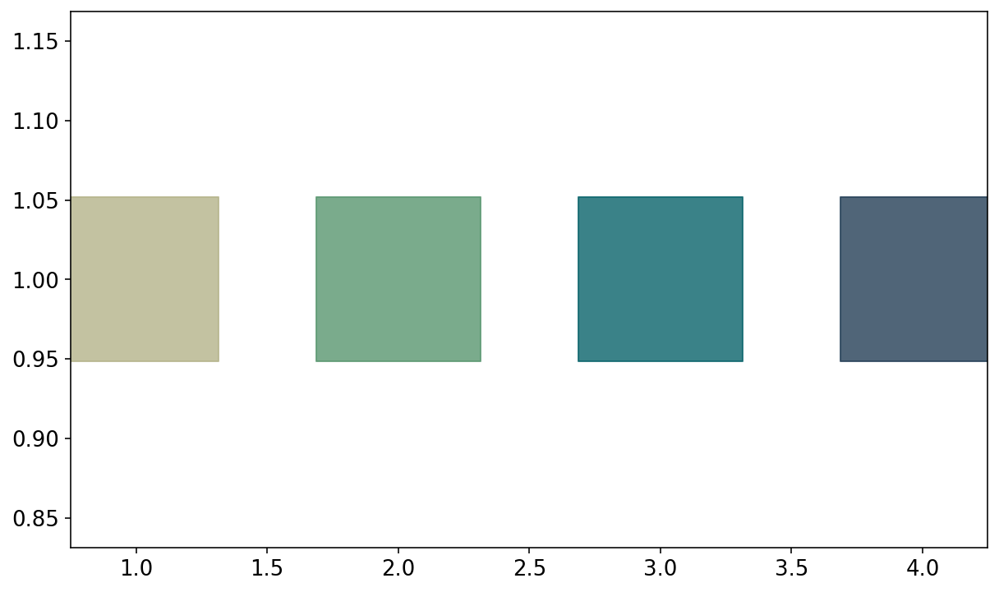

In [340]:
fig = plt.figure(figsize=(10,6))
clist = ['#337a55','#115696','#111e96','#4f1196','#861196']
clist = ['#2a7b9b','#1d4469','#272752','#511849','#900c3f']
clist = ['#327e8f','#1d4b69','#272752','#511849','#900c3f']

clist = [cmocean.cm.rain(0.25),cmocean.cm.rain(0.45),cmocean.cm.rain(0.7),cmocean.cm.rain(0.85)]
plt.scatter([1,2,3,4], [1,1,1,1], marker='s', s=(100**2), color=clist, alpha=0.8)
#plt.ylim(0.975, 1.025)

In [9]:
import pyart
IOP5 = pyart.io.read('E://KNQA20230405_165005_V06')

In [12]:
smooth = nd.gaussian_filter(IOP, sigma = 1.1)

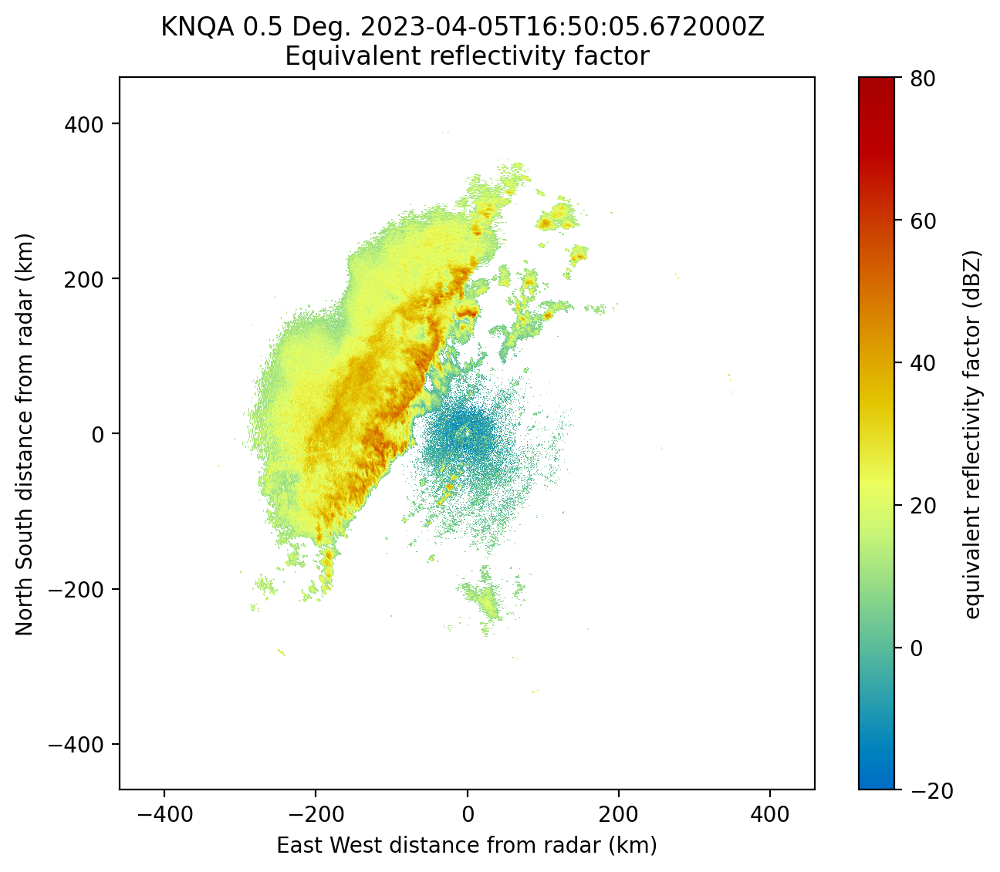

In [13]:
# gatefilter = pyart.filters.GateFilter(IOP5)
# gatefilter.exclude_transition()
# gatefilter.exclude_below("copol_coeff", 0.9)

# compz = pyart.retrieve.composite_reflectivity(
#     radar, field="reflectivity_horizontal", gatefilter=gatefilter)

fig = plt.figure(figsize=(16, 6))
ax = plt.subplot(121)
display = pyart.graph.RadarDisplay(IOP5)
display.plot("reflectivity", ax=ax, vmin=-20, vmax=80)

# ax2 = plt.subplot(122)
# composite_display = pyart.graph.RadarDisplay(compz)
# composite_display.plot(
#     "composite_reflectivity", ax=ax2, vmin=-20, vmax=80, cmap="pyart_HomeyerRainbow")

(720, 1832)
(720, 1832)
(720, 1832)
(720, 1832)


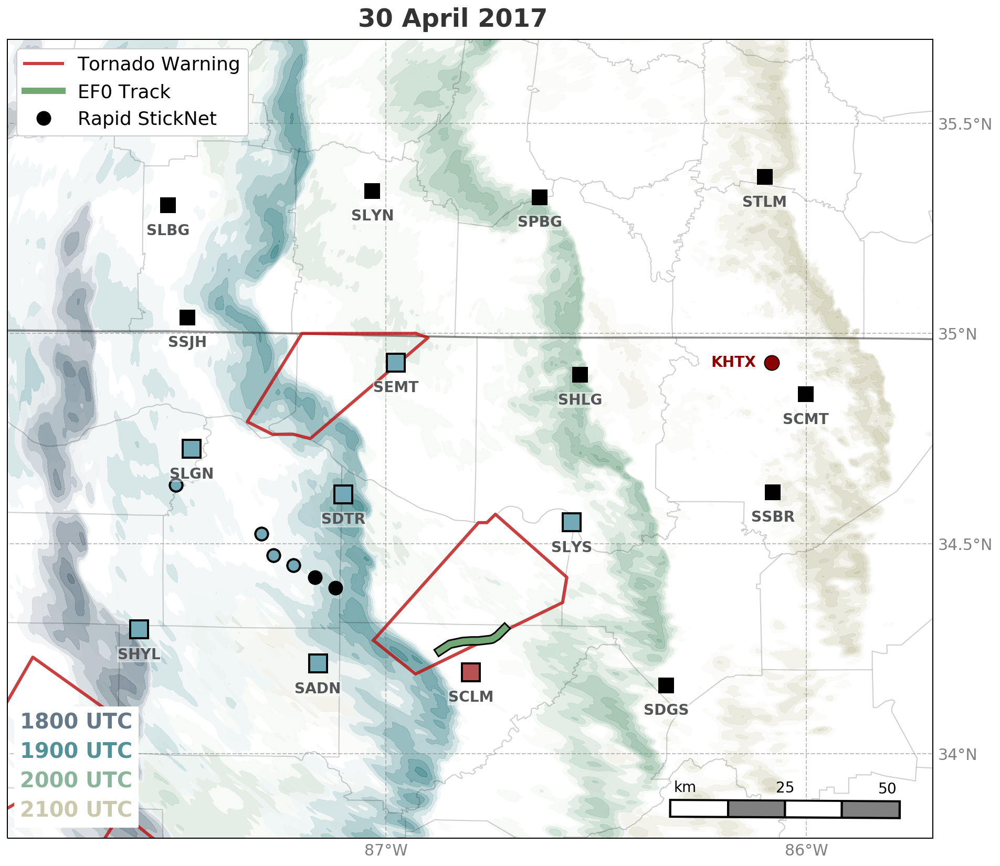

In [353]:
fig = plt.figure(1, figsize=(18, 14))
ax = plt.subplot(111, projection=crs)
west_lon=-87.9
south_lat=33.8
east_lon=-85.7
north_lat=35.7
date='20170430'


#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())
ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)

ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
# use 20m for testing, and 500k for final plots
       
# plot the warning poly
poly = pickle.load(open('{0}_TorPoly.p'.format(date), 'rb'))
plot_warnings(poly, ax, linewidth = 3,alpha=0.8, color='#bc1010',label = 'Tornado Warning')#    

# plot tornado track
tortrack = pickle.load(open('20170430_TorTrack.p', 'rb'))
ax.plot(tortrack.iloc[0]['lons'],tortrack.iloc[0]['lats'], 
        color = 'k', linewidth=9, zorder=29)
ax.plot(tortrack.iloc[0]['lons'],tortrack.iloc[0]['lats'], 
        color = '#71a873', linewidth=6, label='{} Track'.format(tortrack.loc[0]['rating']),zorder=30)
    
# add the StickNets
for n,probe in enumerate(probe_locs):
    if n <16:
        lat,lon = probe_locs[probe][0],probe_locs[probe][1]
        ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 10, markeredgewidth=5)#, label='StickNet')
        ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 10, markeredgewidth=3)
        
        if probe in ['0102A', '0106A', '0214A', '0111A', '0217A','0112A'] :
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 12, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#74a9b8', linewidth=0.0, 
                markersize = 12, markeredgewidth=3)
        
        if probe == '0107A':
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 12, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#b85151', linewidth=0.0, 
                markersize = 12, markeredgewidth=3)
            
        if lat > south_lat and lat < north_lat: # don't let SN plot outside of plot
            if lon < east_lon and lon > west_lon:
                plt.text(lon,lat-.06, probe_locs[probe][3], fontsize=14,\
                             ha='center', va='center', weight='bold', color='#545556',\
                             bbox=dict(facecolor='w', alpha=0.4, edgecolor='w', pad=0))
                
# add the rapid probes                
rapid_locs = {
 '0222': [-87.26764,34.472091],
 '0221': [-87.296503,34.523322],
 '0219': [-87.120229,34.394485],
 '0218': [-87.21975,34.448162],
 '0224': [-87.16902,34.420291],
 '0220': [-87.500392,34.639214]}
for n, probe in enumerate(rapid_locs):
    lat,lon = rapid_locs[probe][1],rapid_locs[probe][0]
    ax.plot(lon,lat, marker = 'o', color = 'k', linewidth=0.0, 
            markersize = 7, markeredgewidth=7, label='Rapid StickNet')
    ax.plot(lon,lat, marker = 'o', color = 'k', linewidth=0.0, 
            markersize = 7, markeredgewidth=3)
    
    if probe in ['0220','0221','0222','0218'] :
        ax.plot(lon,lat, marker = 'o', color = 'k', linewidth=0.0, 
            markersize = 7, markeredgewidth=7)
        ax.plot(lon,lat, marker = 'o', color = '#74a9b8', linewidth=0.0, 
            markersize = 7, markeredgewidth=3)
        
# Plot Radar Outlines
i = 0
clist = ['#337a55','#115696','#111e96','#4f1196','#861196']
clist = [cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.7),cmocean.cm.rain(0.85)]
clist = [cmocean.cm.rain(0.25),cmocean.cm.rain(0.45),cmocean.cm.rain(0.7),cmocean.cm.rain(0.85)]
for hour in [21,20,19,18]:
    for mins in [0]:
        analysis_time = dt.datetime(2017,4,30,hour, mins)
        date = analysis_time.strftime('%Y%m%d')
        HHMM = analysis_time.strftime('%H%M')
        fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

        rdata = pickle.load(open(fname, 'rb'))
        lons, lats, ref = rdata[0], rdata[1], rdata[2]
        print(np.shape(ref))
   
        smooth = nd.gaussian_filter(ref, sigma = 1.1)

#         refmap = make_cmap([rgb('#a7d1ae'),rgb('#e6db8e'),rgb('#d9aa68'),rgb('#b2776b'), rgb('#a34531')])
#         newcmap=make_cmap([rgb('#a7d1ae'),rgb('#e6db8e'),rgb('#d9aa68'),rgb('#b2776b'), rgb('#a34531')])
        
        newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
        ax.contourf(lons, lats, smooth, levels=np.arange(30,70,5), cmap=min_col(newcmap, minval=0), alpha=0.8)
        i+=1

# Mark the radar
lat_0,lon_0 = 34.93055725097656,-86.08361053466797 # KHTX
ax.plot(lon_0, lat_0, marker='o', color='k', linewidth=0.0,markersize = 14)
ax.plot(lon_0, lat_0, marker='o', color='darkred', linewidth=0.0,markersize = 12)
ax.text(lon_0-0.09, lat_0, 'KHTX', fontsize=14, ha='center', va='center', weight='bold', color='darkred',\
                             bbox=dict(facecolor='w', alpha=0.4, edgecolor='w', pad=0))



# legend
handles, labels =ax.get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(),fontsize=18, loc=2, framealpha=1)

# add scale bar
scale_bar(ax, length=50, location=(0.84, 0.035), linewidth=14, fontsize=14)

# add lat lons
lons, lats =[-88, -87, -86, -85],[33.5, 34.0,34.5, 35.0, 35.5, 36]
plot_lat_lon(ax, lons, lats)


# add times in corner
i, lon, bot_lat=0, -87.87, 33.85
for time in [21,20,19,18]:
    plt.text(lon, bot_lat+(.07*i), '{}00 UTC'.format(time), fontsize=20, color=clist[i], weight='bold',
            bbox=dict(facecolor='white', edgecolor='white',pad=5), alpha=0.7)
    i+=1
 
plt.suptitle('30 April 2017', fontsize=24,weight='bold', y=0.91, alpha=0.8)
file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/Pub_Figures/'
file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/PubPlots/'
#plt.savefig('{0}30April_CaseOverview.png'.format(file_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

(720, 1832)
(720, 1832)
(720, 1832)
(720, 1832)
(720, 1832)


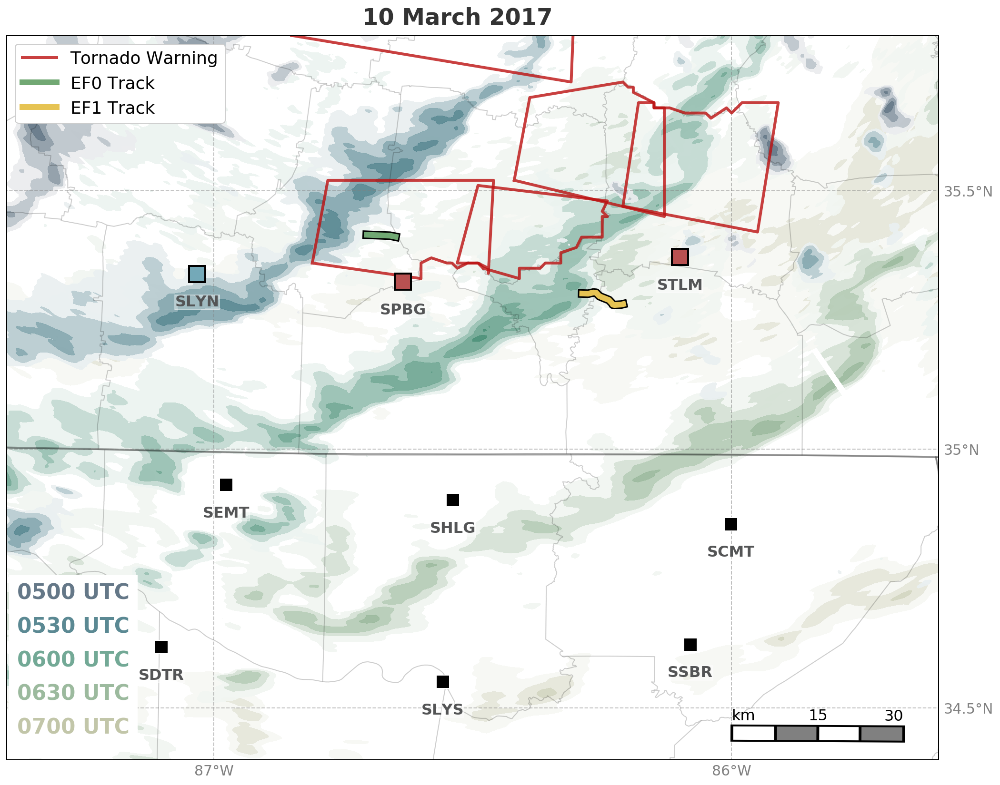

In [352]:
fig = plt.figure(1, figsize=(18, 14))
ax = plt.subplot(111, projection=crs)

west_lon=-87.4
south_lat=34.4
east_lon=-85.6
north_lat=35.8
date='20170310'

#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())
ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)

ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1) # 20m, 5m 500k sizes from large to small
                                                        # use 20m for testing, and 500k for final plots
    
# plot the warning poly
poly = pickle.load(open('{0}_TorPoly.p'.format(date), 'rb'))
plot_warnings(poly, ax, linewidth = 3,alpha=0.8, color='#bc1010',label = 'Tornado Warning')#
    
    
# add the StickNets
for n,probe in enumerate(probe_locs):
    if n <16:
        lat,lon = probe_locs[probe][0],probe_locs[probe][1]
        ax.plot(lon,lat, marker = 's', color = 'w', linewidth=0.0, 
                markersize = 10, markeredgewidth=5)
        
        ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 10, markeredgewidth=3)
        
        if probe == '0104A':
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 12, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#74a9b8', linewidth=0.0, 
                markersize = 12, markeredgewidth=3)
        
        if probe == '0108A' or probe == '0216A':
            ax.plot(lon,lat, marker = 's', color = 'k', linewidth=0.0, 
                markersize = 12, markeredgewidth=7)
            ax.plot(lon,lat, marker = 's', color = '#b85151', linewidth=0.0, 
                markersize = 12, markeredgewidth=3)
        
        if lat > south_lat and lat < north_lat: # don't let SN plot outside of plot
            if lon < east_lon and lon > west_lon:
                plt.text(lon,lat-.055, probe_locs[probe][3], fontsize=16,\
                             ha='center', va='center', weight='bold', color='#545556',\
                             bbox=dict(facecolor='w', alpha=0.4, edgecolor='w', pad=0))

# Plot Radar Outlines

i = 0
clist = ['#337a55','#115696','#111e96','#4f1196','#861196']
#clist = ['#2a7b9b','#1d4469','#272752','#511849','#900c3f']
clist = ['#327e8f','#1d4b69','#272752','#511849','#900c3f']
clist = [cmocean.cm.rain(0.28),cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)]

times = ['700', '630', '600', '530', '500']
for time in times:
    hour, mins = int(time[0]), int(time[1:])
    analysis_time = dt.datetime(2017,3,10,hour, mins)
    date = analysis_time.strftime('%Y%m%d')
    HHMM = analysis_time.strftime('%H%M')
    fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

    rdata = pickle.load(open(fname, 'rb'))
    lons, lats, ref = rdata[0], rdata[1], rdata[2]
    print(np.shape(ref))

    smooth = nd.gaussian_filter(ref, sigma = 1.1)
    newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
    ax.contourf(lons, lats, smooth, levels=np.arange(40,70,5), cmap=min_col(newcmap, minval=0), alpha=0.95)
    i+=1

    


# plot tornado track
tortrack = pickle.load(open('20170310_TorTrack.p', 'rb'))

# EFO
ax.plot(tortrack.iloc[1]['lons'],tortrack.iloc[1]['lats'], 
        color = 'k', linewidth=9)
ax.plot(tortrack.iloc[1]['lons'],tortrack.iloc[1]['lats'], 
        color = '#71a873', linewidth=6, label='{} Track'.format(tortrack.loc[1]['rating']))
#EF1
ax.plot(tortrack.iloc[0]['lons'],tortrack.iloc[0]['lats'], 
        color = 'k', linewidth=9)
ax.plot(tortrack.iloc[0]['lons'],tortrack.iloc[0]['lats'], 
        color = '#e6c353', linewidth=6, label='{} Track'.format(tortrack.loc[0]['rating']))

# legend
handles, labels =ax.get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(),fontsize=18, loc=2, framealpha=1)

# add scale bar
scale_bar(ax, length=30, location=(0.87, 0.035), linewidth=14, fontsize=16)

# add lat lons
lons, lats =[-88, -87, -86, -85],[33.5, 34.0,34.5, 35.0, 35.5, 36]
plot_lat_lon(ax, lons, lats)

# add times in corner
i, lon, bot_lat=0, -87.37, 34.45
for time in times:
    plt.text(lon-0.01, bot_lat+(.065*i), '0{} UTC'.format(time), fontsize=22, color=clist[i], weight='bold',
            bbox=dict(facecolor='white', edgecolor='white',pad=8), alpha=0.7)
    i+=1

plt.suptitle('10 March 2017', fontsize=24,weight='bold', y=0.91, alpha=0.8)
#file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/Pub_Figures/'
file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/PubPlots/'
#plt.savefig('{0}10March_CaseOverview.png'.format(file_dir), bbox_inches = 'tight', format='png', dpi=300);
plt.show()

In [4]:
analysis_time = dt.datetime(2017,4,30,19)
date = analysis_time.strftime('%Y%m%d')
HHMM = analysis_time.strftime('%H%M')
fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

rdata = pickle.load(open(fname, 'rb'))
lons, lats, ref = rdata[0], rdata[1], rdata[2]

In [ ]:

LO, LA = np.meshgrid(lons[::5], lats[::5])
plt.contourf(LO, LA, ref)

### 9 panel all event figure, requested by Matt Parker

In [10]:
def scale_bar(ax, length=None, location=(0.5, 0.05), linewidth=3, fontsize=12, text_pad=5, inner_spacing=2):
    """
    ax is the axes to draw the scalebar on.
    length is the length of the scalebar in km.
    location is center of the scalebar in axis coordinates.
    (ie. 0.5 is the middle of the plot)
    linewidth is the thickness of the scalebar.
    text pad controls the spacing between the text (km, distance1, distance2) and the scale bar.
        squished numbers are bad!
    
    edited by Jessie. Found on GitHub - https://github.com/SciTools/cartopy/issues/490
    """
    #Get the limits of the axis in lat long
    llx0, llx1, lly0, lly1 = ax.get_extent(ccrs.PlateCarree())
    #Make tmc horizontally centred on the middle of the map,
    #vertically at scale bar location
    sbllx = (llx1 + llx0) / 2
    sblly = lly0 + (lly1 - lly0) * location[1]
    tmc = ccrs.TransverseMercator(sbllx, sblly)
    #Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(tmc)
    #Turn the specified scalebar location into coordinates in metres
    sbx = x0 + (x1 - x0) * location[0]
    sby = y0 + (y1 - y0) * location[1]

    #Calculate a scale bar length if none has been given
    #(Theres probably a more pythonic way of rounding the number but this works)
    if not length: 
        length = (x1 - x0) / 5000 #in km
        ndim = int(np.floor(np.log10(length))) #number of digits in number
        length = round(length, -ndim) #round to 1sf
        #Returns numbers starting with the list
        def scale_number(x):
            if str(x)[0] in ['1', '2', '5']: return int(x)        
            else: return scale_number(x - 10 ** ndim)
        length = scale_number(length) 

    #Generate the x coordinate for the ends of the scalebar
    # the edge is the black lines in between and extending on the edges of the white and gray parts
    # sbx is the center. length * 500 == half the length
    
    #edge = 500
    edge = inner_spacing*100
    bar_xs = [sbx - length * 500 - edge, sbx + length * 500 +edge]
    #Plot the scalebar
    ax.plot(bar_xs, [sby, sby], transform=tmc, color='k', linewidth=linewidth+4,solid_capstyle="butt", clip_on=False)  # background
    
    #add colors - 4 colors
    x1, x2, x3, x4, x5 = sbx-length*500, sbx -length*250, sbx, sbx+length*250, sbx+length*500
    ax.plot([x1,x2-edge/2], [sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x2+edge/2,x3-edge/2] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x3+edge/2,x4-edge/2] ,[sby, sby], transform=tmc, color='w', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    ax.plot([x4+edge/2,x5] ,[sby, sby], transform=tmc, color='gray', linewidth=linewidth,solid_capstyle="butt", clip_on=False)
    
    # add "km", center point, and end point
    y_lift = linewidth*text_pad
    ax.text(x3, sby+length*y_lift , str(round(2 * length / 4)), transform=tmc,
                    horizontalalignment='center', verticalalignment='bottom',
                    color='k', fontsize=fontsize)
    ax.text(x5-length*50, sby+length*y_lift , str(round(length)), transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)
    ax.text(x1+length*60, sby+length*y_lift , 'km', transform=tmc,
            horizontalalignment='center', verticalalignment='bottom',
            color='k', fontsize=fontsize)

/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [60]:
#['1700', '1730', '1800', '1830', '1900','1930', '2000']:#['2100', '2130','2200', '2230', '2300']:
#'2330','2300','2230','2200'
for time in ['2215','2245','2315']:
        hour = int(time[0:2]); mins=int(time[2:])
        analysis_time = dt.datetime(2016,3,31,hour, mins)
        station = 'KHTX'
        radar_namelist, radar_list = get_radar_from_aws(station, analysis_time, analysis_time)
        radar = radar_list[0]
        lat_pos, lon_pos, _ = radar.get_gate_lat_lon_alt(0)
        data_ref = radar.get_field(0,'reflectivity')

        date = analysis_time.strftime('%Y%m%d')
        HHMM = analysis_time.strftime('%H%M')
        fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)
        pickle.dump([lon_pos, lat_pos, data_ref], open(fname, 'wb') )

308 308
315 315
321 321


In [7]:
import matplotlib.patheffects as path_effects


import probe_info
probe_locs = probe_info.probe_locs_2017
all_lats = [probe_locs[x][0] for x in probe_locs.keys()]
all_lons = [probe_locs[x][1] for x in probe_locs.keys()]


west_lon=-87.9
south_lat=33.82
east_lon=-85.7
north_lat=35.78


#lon_add, lat_add
LL = (west_lon),(north_lat)
UR = (east_lon ),(south_lat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())



events = [dt.datetime(2016,3,31), dt.datetime(2016,4,30), dt.datetime(2017,3,1),
          dt.datetime(2017,3,10), dt.datetime(2017,3,21), dt.datetime(2017,3,25),
          dt.datetime(2017,3,27), dt.datetime(2017,4,22), dt.datetime(2017,4,30)]


time_dict = {dt.datetime(2016,3,31):['2300','2245','2230','2215','2200'], 
             dt.datetime(2016,4,30):['2300','2230', '2200','2130','2100'], 
             dt.datetime(2017,3,1):['2000','1930','1900','1830'],
             dt.datetime(2017,3,10):['0700', '0630', '0600', '0530', '0500'], 
             dt.datetime(2017,3,21):[], 
             dt.datetime(2017,3,25):[],
             dt.datetime(2017,3,27):[], 
             dt.datetime(2017,4,22):[], 
             dt.datetime(2017,4,30):['2100','2000','1900','1800']}

col_dict = {dt.datetime(2016,3,31):[cmocean.cm.rain(0.28),cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)], 
             dt.datetime(2016,4,30):[cmocean.cm.rain(0.28),cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)], 
             dt.datetime(2017,3,1):[cmocean.cm.rain(0.35),cmocean.cm.rain(0.55),cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)],
             dt.datetime(2017,3,10):[cmocean.cm.rain(0.28),cmocean.cm.rain(0.4),'#38856a',cmocean.cm.rain(0.75),cmocean.cm.rain(0.85)], 
             dt.datetime(2017,3,21):[], 
             dt.datetime(2017,3,25):[],
             dt.datetime(2017,3,27):[], 
             dt.datetime(2017,4,22):[], 
             dt.datetime(2017,4,30):[cmocean.cm.rain(0.25),cmocean.cm.rain(0.45),cmocean.cm.rain(0.7),cmocean.cm.rain(0.85)]
           }

def get(ax,e):
    clist = col_dict[events[e]]

    times = time_dict[events[e]]
    
    for i, time in enumerate(times):
        hour, mins = int(time[0:2]), int(time[2:])
        analysis_time = events[e].replace(hour=2, minute=mins)
        date = analysis_time.strftime('%Y%m%d')
        HHMM = analysis_time.strftime('%H%M')
        fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

        rdata = pickle.load(open(fname, 'rb'))
        lons, lats, ref = rdata[0], rdata[1], rdata[2]
        print(np.shape(ref))

        smooth = nd.gaussian_filter(ref, sigma = 1.1)
        newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
        ax.contourf(lons, lats, smooth, levels=np.arange(40,70,5), cmap=min_col(newcmap, minval=0), alpha=0.95)
    

In [24]:
ratio = (north_lat - south_lat)/(west_lon-east_lon)

center_lat = ev2['Lats'].append(ev1['Lats']).mean()
center_lon = ev2['Lons'].append(ev1['Lons']).mean()

dlat = .2

dlon = dlat / ratio

LL = (center_lon-dlon),(center_lat+dlat)
UR = (center_lon+dlon,(center_lat-dlat)
LL = crs.transform_point((west_lon),(north_lat),ccrs.PlateCarree())
UR = crs.transform_point((east_lon ),(south_lat),ccrs.PlateCarree())

In [37]:
def set_plot_ratio(dlat, ev1, ev2, ax, ratio):
    center_lat = ev2['Lats'].append(ev1['Lats']).mean()
    center_lon = ev2['Lons'].append(ev1['Lons']).mean()
    dlat = .4
    dlon = dlat / ratio
    LLn = crs.transform_point((center_lon-dlon),(center_lat+dlat),ccrs.PlateCarree())
    URn = crs.transform_point((center_lon+dlon),(center_lat-dlat),ccrs.PlateCarree())
    ax.set_extent([LLn[0], URn[0], LLn[1], URn[1]], crs)

In [21]:
alllats.mean()

35.049707

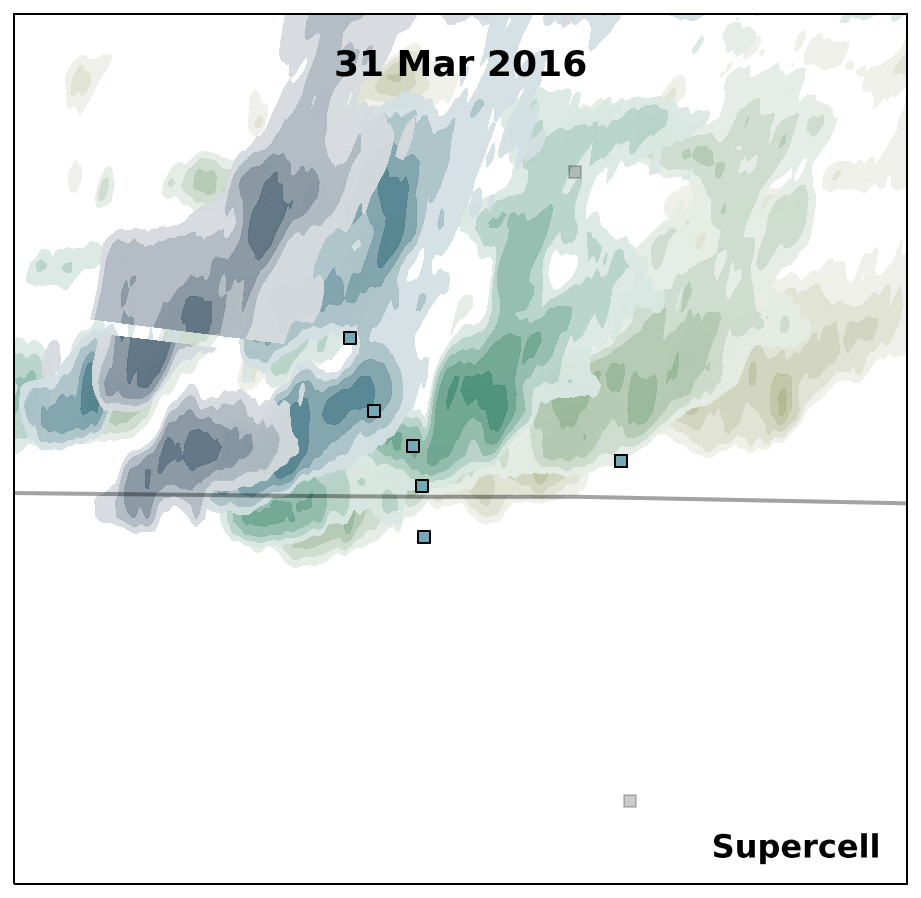

In [75]:
e=0

# need to keep the ratio the same of lat to lon 



fig, ax=plt.subplots(1,1, figsize=(8,8), sharex=True, sharey=True, subplot_kw={'projection': crs} )




ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
#ax.add_feature(USCOUNTIES.with_scale('20m'), alpha=0.1, linewidth=0.5) 
ax.set_aspect('auto')



# RADAR DATA
clist = col_dict[events[e]]

times = time_dict[events[e]]

for i, time in enumerate(times):
    hour, mins = int(time[0:2]), int(time[2:])
    analysis_time = events[e].replace(hour=hour, minute=mins)
    date = analysis_time.strftime('%Y%m%d')
    HHMM = analysis_time.strftime('%H%M')
    fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

    rdata = pickle.load(open(fname, 'rb'))
    lons, lats, ref = rdata[0], rdata[1], rdata[2]
    #print(np.shape(ref))

    smooth = nd.gaussian_filter(ref, sigma = 0.8)
    newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
    ax.contourf(lons, lats, smooth, levels=np.arange(40,70,5), cmap=min_col(newcmap, minval=0.1), alpha=0.95)



# TITLE                                              
ax.text(0.5, .93, events[e].strftime("%d %b %Y"), ha='center', fontsize=18, weight='bold',
        transform=ax.transAxes)



# plotting sticknets
if events[e] != dt.datetime(2017,3,1):
    ax.scatter(all_lons, all_lats, marker='s', color='k', alpha=0.2, transform=crs)

ev = sns[sns['date']==int(events[e].strftime('%Y%m%d'))]
ev1 = ev[ev['type'] == 'R']
lons = ev1['Lons']; lats = ev1['Lats']
ax.scatter(lons, lats, marker='s', color='#74a9b8', transform=crs, label='StickNet', ec='k')

ev2 = ev[ev['type'] == 'T']
lons = ev2['Lons']; lats = ev2['Lats']
ax.scatter(lons, lats, marker='s', color='#b85151', transform=crs, label='StickNet', ec='k')


# mode
if ev['mode'].iloc[0] == 'linear':
    mode = 'Linear'
if ev['mode'].iloc[0] == 'mixed':
    mode = 'Hybrid'
if ev['mode'].iloc[0] == 'supercell':
    mode = 'Supercell'

text = ax.text(0.97, .03, mode, ha='right', fontsize=16, weight='bold',
        transform=ax.transAxes)
text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                   path_effects.Normal()])

ratio = (north_lat - south_lat)/(west_lon-east_lon)

center_lat = ev2['Lats'].append(ev1['Lats']).mean()
center_lon = ev2['Lons'].append(ev1['Lons']).mean()

dlat = .4
dlon = dlat / ratio

LLn = crs.transform_point((center_lon-dlon),(center_lat+dlat),ccrs.PlateCarree())
URn = crs.transform_point((center_lon+dlon),(center_lat-dlat),ccrs.PlateCarree())
      
ax.set_extent([LLn[0], URn[0], LLn[1], URn[1]], crs)

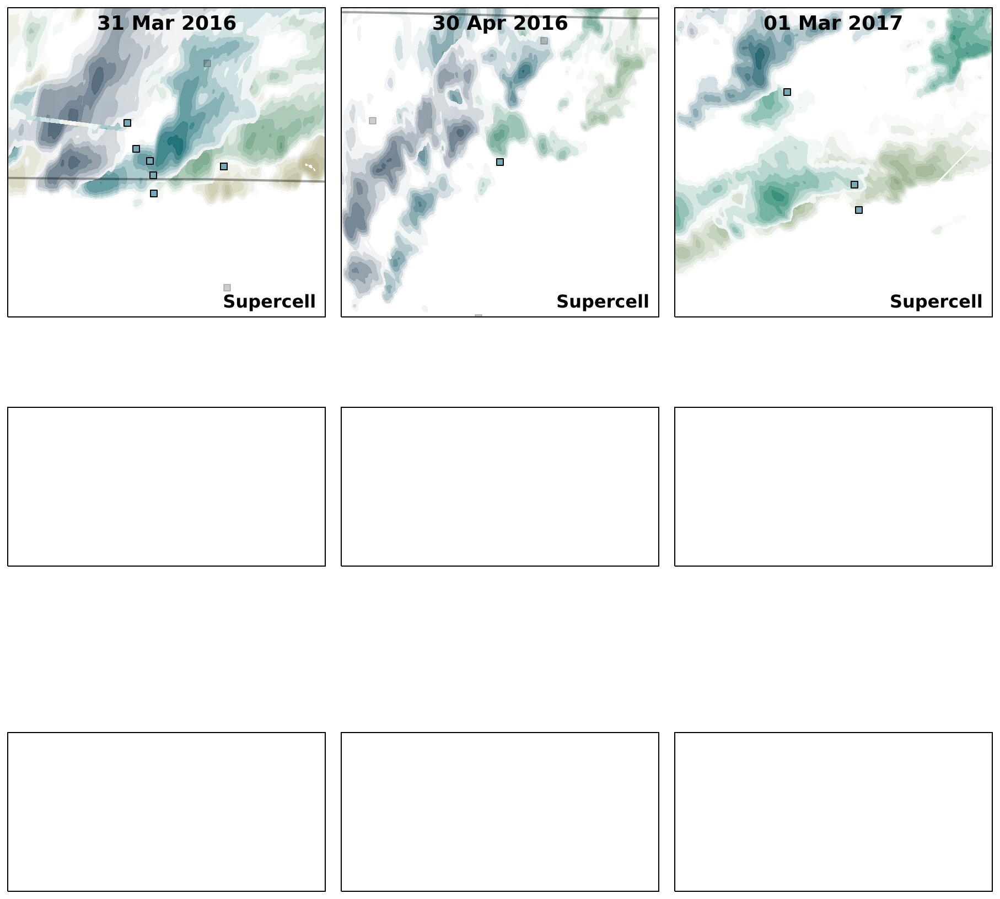

In [59]:
ratio = (north_lat - south_lat)/(west_lon-east_lon)


fig, axes=plt.subplots(3,3, figsize=(16,16), subplot_kw={'projection': crs} )


for e,ax in enumerate(axes.flatten()):
    if e <3:
        ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
        ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
        #ax.add_feature(USCOUNTIES.with_scale('20m'), alpha=0.1, linewidth=0.5) 
        ax.set_aspect('auto')


        # RADAR DATA
        clist = col_dict[events[e]]

        times = time_dict[events[e]]

        for i, time in enumerate(times):
            hour, mins = int(time[0:2]), int(time[2:])
            analysis_time = events[e].replace(hour=hour, minute=mins)
            date = analysis_time.strftime('%Y%m%d')
            HHMM = analysis_time.strftime('%H%M')
            fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

            rdata = pickle.load(open(fname, 'rb'))
            lons, lats, ref = rdata[0], rdata[1], rdata[2]
            #print(np.shape(ref))

            smooth = nd.gaussian_filter(ref, sigma = 1.1)
            newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
            ax.contourf(lons, lats, smooth, levels=np.arange(30,70,5), cmap=min_col(newcmap, minval=0), alpha=0.95)



        # TITLE                                              
        ax.text(0.5, .93, events[e].strftime("%d %b %Y"), ha='center', fontsize=18, weight='bold',
                transform=ax.transAxes)



        # plotting sticknets
        if events[e] != dt.datetime(2017,3,1):
            ax.scatter(all_lons, all_lats, marker='s', color='k', alpha=0.2, transform=crs)

        ev = sns[sns['date']==int(events[e].strftime('%Y%m%d'))]
        ev1 = ev[ev['type'] == 'R']
        lons = ev1['Lons']; lats = ev1['Lats']
        ax.scatter(lons, lats, marker='s', color='#74a9b8', transform=crs, label='StickNet', ec='k')

        ev2 = ev[ev['type'] == 'T']
        lons = ev2['Lons']; lats = ev2['Lats']
        ax.scatter(lons, lats, marker='s', color='#b85151', transform=crs, label='StickNet', ec='k')


        # mode
        if ev['mode'].iloc[0] == 'linear':
            mode = 'Linear'
        if ev['mode'].iloc[0] == 'mixed':
            mode = 'Hybrid'
        if ev['mode'].iloc[0] == 'supercell':
            mode = 'Supercell'

        text = ax.text(0.97, .03, mode, ha='right', fontsize=16, weight='bold',
                transform=ax.transAxes)
        text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                           path_effects.Normal()])
        
        
        # add scale bar
        #scale_bar(ax, length=20, location=(0.1,.1), linewidth=12, fontsize=14, text_pad=-20, inner_spacing=10)


        if events[e] == dt.datetime(2016,3,31):
            set_plot_ratio(.4, ev1, ev2, ax, ratio)
        if events[e] == dt.datetime(2016,4,30):
            set_plot_ratio(.4, ev1, ev2, ax, ratio)
        if events[e] == dt.datetime(2017,3,1):
            set_plot_ratio(.5, ev1, ev2, ax, ratio)


plt.subplots_adjust(hspace=0.05, wspace=0.05)

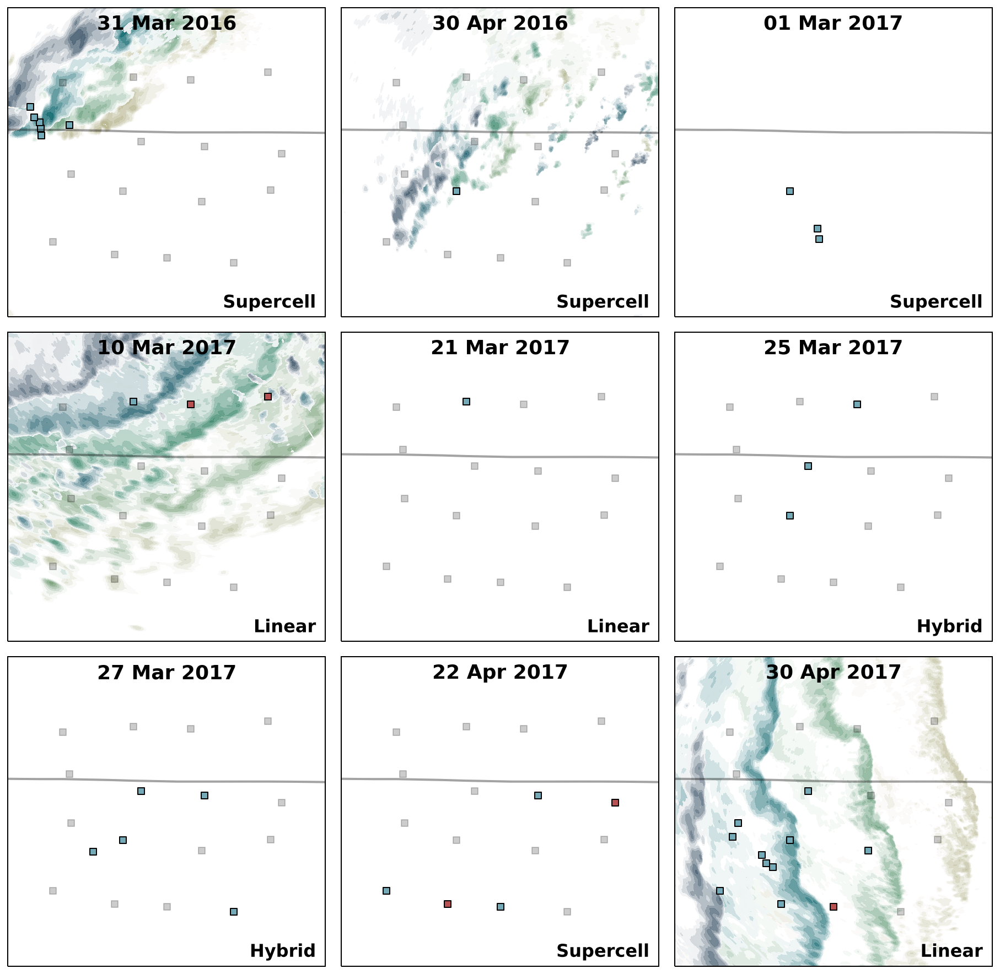

In [42]:
fig, axes=plt.subplots(3,3, figsize=(16,16), subplot_kw={'projection': crs} )


for e,ax in enumerate(axes.flatten()):
    #if e <3:
    ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
    ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=2)
    #ax.add_feature(USCOUNTIES.with_scale('20m'), alpha=0.1, linewidth=0.5) 
    ax.set_aspect('auto')


    # RADAR DATA
    clist = col_dict[events[e]]

    times = time_dict[events[e]]

    for i, time in enumerate(times):
        hour, mins = int(time[0:2]), int(time[2:])
        analysis_time = events[e].replace(hour=hour, minute=mins)
        date = analysis_time.strftime('%Y%m%d')
        HHMM = analysis_time.strftime('%H%M')
        fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

        rdata = pickle.load(open(fname, 'rb'))
        lons, lats, ref = rdata[0], rdata[1], rdata[2]
        #print(np.shape(ref))

        smooth = nd.gaussian_filter(ref, sigma = 1.1)
        newcmap=make_cmap([rgb('#ffffff'),rgb(clist[i])])
        ax.contourf(lons, lats, smooth, levels=np.arange(30,70,5), cmap=min_col(newcmap, minval=0), alpha=0.95)



    # TITLE                                              
    ax.text(0.5, .93, events[e].strftime("%d %b %Y"), ha='center', fontsize=18, weight='bold',
            transform=ax.transAxes)



    # plotting sticknets
    if events[e] != dt.datetime(2017,3,1):
        ax.scatter(all_lons, all_lats, marker='s', color='k', alpha=0.2, transform=crs)

    ev = sns[sns['date']==int(events[e].strftime('%Y%m%d'))]
    ev1 = ev[ev['type'] == 'R']
    lons = ev1['Lons']; lats = ev1['Lats']
    ax.scatter(lons, lats, marker='s', color='#74a9b8', transform=crs, label='StickNet', ec='k')
color='#74a9b8',ec='k'
    ev2 = ev[ev['type'] == 'T']
    lons = ev2['Lons']; lats = ev2['Lats']
    ax.scatter(lons, lats, marker='s', color='#b85151', transform=crs, label='StickNet', ec='k')


    # mode
    if ev['mode'].iloc[0] == 'linear':
        mode = 'Linear'
    if ev['mode'].iloc[0] == 'mixed':
        mode = 'Hybrid'
    if ev['mode'].iloc[0] == 'supercell':
        mode = 'Supercell'

    text = ax.text(0.97, .03, mode, ha='right', fontsize=16, weight='bold',
            transform=ax.transAxes)
    text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                       path_effects.Normal()])




plt.subplots_adjust(hspace=0.05, wspace=0.05)

In [5]:
# takes 20 seconds


import shapefile

data2017  = shapefile.Reader(r'/Users/jessmcd/Documents/MyPassport_backup/VortexSE/watch_warning/2017')
shapes2017 = data2017.shapes()

data2016  = shapefile.Reader(r'/Users/jessmcd/Documents/MyPassport_backup/VortexSE/watch_warning/2016')
shapes2016 = data2016.shapes()

wfo_array=['HUN','OHX','BMX','FFC','MRX','MEG']
columns = ['WFO', 'ISSUED', 'EXPIRED', 'PHENOM', 'GTYPE', 'SIG'] 

# prep 2017 dataframe
df = pd.DataFrame(data=[y[:] for y in data2017.records()])
df = df.loc[:, [0,1,2,5,6,7]]
df.columns = columns

rf2017 = df[(df['PHENOM']=='TO') & (df['SIG']=='W') & (df['WFO'].isin(wfo_array)) & (df['GTYPE'] == 'P')] 
rf2017 = rf2017.drop(columns=['PHENOM', 'SIG', 'GTYPE'])
rf2017.loc[:,'ISSUED'] =  pd.to_datetime(rf2017['ISSUED'].copy(), format='%Y%m%d', exact=False)


# prep 2016 dataframe
df = pd.DataFrame(data=[y[:] for y in data2016.records()])
df = df.loc[:, [0,1,2,5,6,7]]
df.columns = columns

rf2016 = df[(df['PHENOM']=='TO') & (df['SIG']=='W') & (df['WFO'].isin(wfo_array))& (df['GTYPE'] == 'P')] 
rf2016 = rf2016.drop(columns=['PHENOM', 'SIG', 'GTYPE'])
rf2016.loc[:,'ISSUED'] =  pd.to_datetime(rf2016['ISSUED'].copy(), format='%Y%m%d', exact=False)


/Users/jessmcd/miniconda3/envs/py3_cart/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


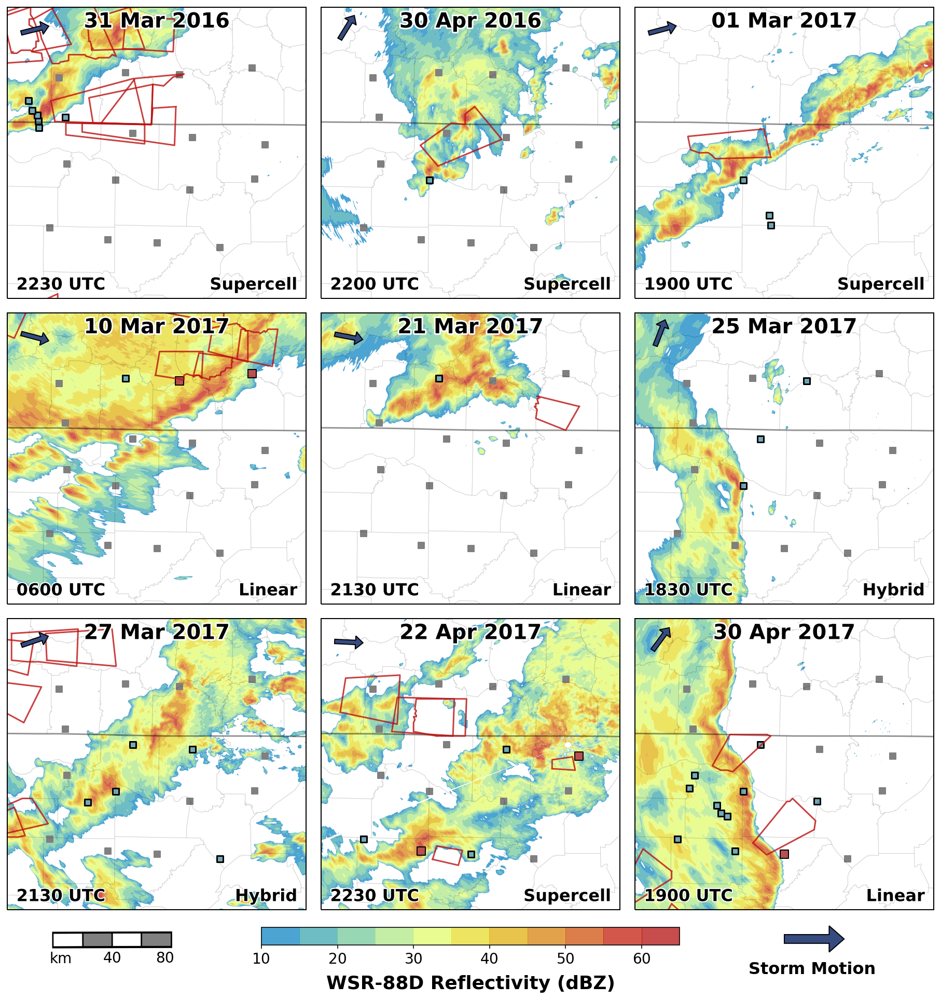

In [11]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

time_dict = {dt.datetime(2016,3,31):['2230'], 
             dt.datetime(2016,4,30):['2200'], 
             dt.datetime(2017,3,1):['1900'],
             dt.datetime(2017,3,10):['0600'], 
             dt.datetime(2017,3,21):['2130'], 
             dt.datetime(2017,3,25):['1830'],
             dt.datetime(2017,3,27):['2130'], 
             dt.datetime(2017,4,22):['2230'], 
             dt.datetime(2017,4,30):['1900']}



fig, axes=plt.subplots(3,3, figsize=(16,16), sharex=True, sharey=True, subplot_kw={'projection': crs} )

for e,ax in enumerate(axes.flatten()):
    ax.set_extent([LL[0], UR[0], LL[1], UR[1]], crs)
    ax.add_feature(states_provinces, edgecolor='k', alpha=0.2, linewidth=1.5)
    ax.add_feature(USCOUNTIES.with_scale('500k'), alpha=0.1, linewidth=0.5) 
    ax.set_aspect('auto')
    
    # RADAR DATA
    time = time_dict[events[e]][0]

    hour, mins = int(time[0:2]), int(time[2:])
    analysis_time = events[e].replace(hour=hour, minute=mins)
    date = analysis_time.strftime('%Y%m%d')
    HHMM = analysis_time.strftime('%H%M')
    fname = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/RadarSegs/{0}{1}_ReflecData.p'.format(date,HHMM)

    rdata = pickle.load(open(fname, 'rb'))
    lons, lats, ref = rdata[0], rdata[1], rdata[2]

    smooth = nd.gaussian_filter(ref, sigma = 1.1)
    im = ax.contourf(lons, lats, smooth, levels=np.arange(10,70,5), cmap= 'pyart_HomeyerRainbow', alpha=0.7,
                    antialiased=True)
    
    
    # TITLE                                              
    text = ax.text(0.5, .93, events[e].strftime("%d %b %Y"), ha='center', fontsize=20, weight='bold',
            transform=ax.transAxes)
    text.set_path_effects([path_effects.Stroke(linewidth=3, foreground='white'),
                       path_effects.Normal()])
    
    
    if events[e].strftime('%Y') == '2016':
        keep = rf2016[rf2016['ISSUED'] == events[e]]
        keepids = list(keep.index)
        poly = [shapes2016[i].points for i in keepids]
    else:
        keep = rf2017[rf2017['ISSUED'] == events[e]]
        keepids = list(keep.index)
        poly = [shapes2017[i].points for i in keepids]
    plot_warnings(poly, ax, linewidth = 1.5,alpha=0.8, color='#bc1010',label = 'Tornado Warning')
    
    
    
    # plotting sticknets
    if events[e] != dt.datetime(2017,3,1):
        ax.scatter(all_lons, all_lats, marker='s', color='#808080', transform=crs)

    ev = sns[sns['date']==int(events[e].strftime('%Y%m%d'))]
    
    ev1 = ev[ev['type'] == 'R']
    lons = ev1['Lons']; lats = ev1['Lats']
    ax.scatter(lons, lats, marker='s', color='#74a9b8', s=(6**2),transform=crs, label='StickNet', ec='k', 
               linewidth=1.5)
    
    ev2 = ev[ev['type'] == 'T']
    lons = ev2['Lons']; lats = ev2['Lats']
    ax.scatter(lons, lats, marker='s', color='#b85151', s=(8**2),transform=crs, label='StickNet', ec='k')
             
             
    # arrow        
    Ua = np.nanmean(ev['Ua']); Va = np.nanmean(ev['Va'])
    angle=np.arctan2(Va, Ua); r = 0.07
    dy = r*np.sin(angle) ; dx = r*np.cos(angle)
    Y = .92 - (dy/2)
    X = .08  - (dx/2)
    ax.arrow(X, Y, dx, dy,transform=ax.transAxes,
                width=.015, head_length=.025, facecolor='#364c80', edgecolor='k', zorder=31)

    # time
    text = ax.text(0.03, .03, analysis_time.strftime('%H%M UTC'), ha='left', fontsize=16, weight='bold',
            transform=ax.transAxes)
    text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                       path_effects.Normal()])
    
    # mode
    if ev['mode'].iloc[0] == 'linear':
        mode = 'Linear'
    if ev['mode'].iloc[0] == 'mixed':
        mode = 'Hybrid'
    if ev['mode'].iloc[0] == 'supercell':
        mode = 'Supercell'
     
    text = ax.text(0.97, .03, mode, ha='right', fontsize=16, weight='bold',
            transform=ax.transAxes)
    text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='white'),
                       path_effects.Normal()])


plt.subplots_adjust(hspace=0.05, wspace=0.05)


  # adds larger title and gives stylistic control over colorbar
norm = plt.Normalize(vmin=10, vmax=70)
ax2 = axes[2,1].inset_axes([-.2, -0.12, 1.4, 0.06]) 
cbar2 = plt.colorbar(im,pad=0.02, cax=ax2,orientation='horizontal')
cbar2.set_label('WSR-88D Reflectivity (dBZ)', fontsize = 18, labelpad = 8, weight='bold')
cbar2.ax.tick_params(labelsize = 14)


# add scale bar
scale_bar(axes[2,0], length=80, location=(0.35, -.105), linewidth=12, fontsize=14, text_pad=-20, inner_spacing=10)

# add arrow and text
angle=np.arctan2(Va, Ua); r = 0.07
dy = r*np.sin(angle) ; dx = r*np.cos(angle)
Y = .92 - (dy/2)
X = .08  - (dx/2)
axes[2,2].arrow(0.5, -0.1, .15, 0,transform=ax.transAxes,
            width=.015*2, head_length=.025*2, facecolor='#364c80', edgecolor='k', clip_on=False);
axes[2,2].text(0.38, -0.22, 'Storm Motion',transform=ax.transAxes, weight='bold', fontsize=16);

file_dir = '/Users/jessmcd/Documents/MyPassport_backup/VortexSE/NewAnalyses/PubPlots/'
plt.savefig('{0}AllEventOverviewNEW.png'.format(file_dir), bbox_inches = 'tight', format='png', dpi=300);

In [77]:
probe_locs

{'0102A': [34.2959, -87.5871, 282, 'SHYL', 'Haleyville'],
 '0103A': [34.8551, -86.0017, 513, 'SCMT', 'Crow Mnt'],
 '0104A': [35.3391, -87.0324, 239, 'SLYN', 'Lynnville'],
 '0105A': [34.6224, -86.08, 182, 'SSBR', 'Scottsboro'],
 '0106A': [34.2149, -87.1619, 245, 'SADN', 'Addison'],
 '0107A': [34.19439, -86.79825, 231, 'SCLM', 'Cullman'],
 '0108A': [35.3236, -86.6347, 230, 'SPBG', 'Petersburg'],
 '0109A': [35.3045, -87.5185, 315, 'SLBG', 'Lawrenceburg'],
 '0110A': [34.1632, -86.3341, 280, 'SDGS', 'Douglas'],
 '0111A': [34.5504, -86.5582, 174, 'SLYS', 'Laceys Springs'],
 '0112A': [34.7254, -87.4625, 174, 'SLGN', 'Leighton'],
 '0213A': [34.9016, -86.5386, 239, 'SHLG', 'Hazel Green'],
 '0214A': [34.9309, -86.9764, 256, 'SEMT', 'Elkmont'],
 '0215A': [35.038, -87.4719, 237, 'SSJH', 'Saint Joseph'],
 '0216A': [35.3719, -86.0998, 305, 'STLM', 'Tullahoma'],
 '0217A': [34.6176, -87.1014, 192, 'SDTR', 'Decatur']}